In [1]:
import io
import subprocess
import os
import glob
import sys
import pwd

import pandas as pd
import numpy as np
import scipy
import scipy.stats as stats
from sklearn.decomposition import PCA
import pickle
import re
import math
import plotnine as pn
import seaborn as sns
import glob
import subprocess
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
import seaborn as sns
from numpy import log
from collections import defaultdict,Counter
import re
import statsmodels
import warnings
import statsmodels.stats.multitest as smm
import json

from pathlib import Path
from midas import m
from datetime import datetime, date
import altair as alt

# gh specific
sys.path.append('/ghsfa/projects/pharma/shared_scripts/')
import bibp.functions as functions
import hgvslib.pHGVS as pHGVS  ## do a pull on the hgvslib git repo

# !pip install statannotations==0.4.0
# #!pip uninstall statannotations --yes
# from statannotations.Annotator import Annotator

warnings.filterwarnings("ignore")
pd.options.display.max_rows = None
pd.options.display.max_columns=None
pd.options.display.max_colwidth=None
work_dir="/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/ILD_IO_Toxicity_INFORM_PICI_01132025"

## INFORM Data

In [2]:
# Pull the INFORM data selected by RWE team
inform_dir = "/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/ILD_prediction_model_12042024/INFORM_selected_samples_01132025/2024_q3"

# Read in different cohorts
df_ild = pd.read_csv(f"{inform_dir}/pdl1_ild_cases_region_stats_q3_2024.csv", header = 0) 
df_pred = pd.read_csv(f"{inform_dir}/pdl1_pred_cases_region_stats_q3_2024.csv", header = 0) 
df_io = pd.read_csv(f"{inform_dir}/io_controls_region_stats_q3_2024.csv", header = 0) 
df_osi = pd.read_csv(f"{inform_dir}/osi_controls_region_stats_q3_2024.csv", header = 0) 

print("Total unique sample size of ILD cohort is " + str(df_ild.request_id.nunique()) + "\n")
print("Total unique sample size of prednisone cohort is " + str(df_pred.request_id.nunique()) + "\n")
print("Total unique sample size of IO cohort ((Pembrolizumab, Nivolumab, Durvalumab) is " + str(df_io.request_id.nunique()) + "\n")
print("Total unique sample size of osimertinib cohort is " + str(df_osi.request_id.nunique()) + "\n")

df_ild.head()

Total unique sample size of ILD cohort is 7

Total unique sample size of prednisone cohort is 17

Total unique sample size of IO cohort ((Pembrolizumab, Nivolumab, Durvalumab) is 27

Total unique sample size of osimertinib cohort is 95



,Unnamed: 0,region_id,region_methyl_molecule_count,norm_region_methyl_molecule_count,norm_peak_count,bip_version,request_id,upk_key
0,0,1_840086_840325,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==
1,1,1_840443_840684,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==
2,2,1_856459_856681,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==
3,3,1_859000_859240,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==
4,4,1_859359_859837,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==


In [3]:
# Add label
df_ild['sample_type'] = 'ILD_Positive'
df_pred['sample_type'] = 'Prednisone_Positive'
df_io['sample_type'] = 'IO_Control'
df_osi['sample_type'] = 'Osimertinib_Control'

# Combine all the datasets
df_region_stats_all = pd.concat([df_ild, df_pred, df_io, df_osi])

# Drop useless column
df_region_stats_all = df_region_stats_all.drop(columns=['Unnamed: 0'])

print(df_region_stats_all.request_id.nunique())
df_region_stats_all.head()

146


,region_id,region_methyl_molecule_count,norm_region_methyl_molecule_count,norm_peak_count,bip_version,request_id,upk_key,sample_type
0,1_840086_840325,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive
1,1_840443_840684,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive
2,1_856459_856681,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive
3,1_859000_859240,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive
4,1_859359_859837,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive


## READIOHEAD (PICI) Data

In [2]:
# Pull the READIOHEAD(PICI) data selected by Sara
pici_dir = f"{work_dir}/RADIOHEAD_samples_selected_by_Sara"

# Read in different cohorts (control samples were selected by Sara on 02192025 for non-AE patients with at least one undetected timepoint)
df_case = pd.read_csv(f"{pici_dir}/RADIOHEAD_Pneumonitis_samples.csv", header = 0) 
df_ctrl = pd.read_csv(f"{pici_dir}/RADIOHEAD_control_samples_02242025.csv", header = 0) 

# For cases
print("Total unique sample size of Pneumonitis cohort is " + str(df_case.GHSampleID.nunique()) + "\n")
print("Total unique patient size of Pneumonitis cohort is " + str(df_case.Patient_ID.nunique()) + "\n")

# For controls
print("Total unique sample size of Control cohort is " + str(df_ctrl.GHSampleID.nunique()) + "\n")
print("Total unique patient size of Control cohort is " + str(df_ctrl.Patient_ID.nunique()) + "\n")

df_case.head()

Total unique sample size of Pneumonitis cohort is 188

Total unique patient size of Pneumonitis cohort is 35

Total unique sample size of Control cohort is 124

Total unique patient size of Control cohort is 32



,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Pneumonitis,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype
0,PICI0009,10910499EP01,A0725515,B00556603,PICI0009.PICI0009-3-1947,3-1947,1,PRE-TREATMENT,1,SUCCESS,Low Diversity Warning,2.3920,1.0,0,3/14/23,12/1/20,12/25/23,Melanoma
1,PICI0009,10916979EP01,A0725434,B00554096,PICI0009.PICI0009-3-1947,3-1947,1,EVENT OF SPECIAL INTEREST,1,SUCCESS,Low Diversity Warning,2.0800,1.0,0,3/14/23,1/14/21,12/25/23,Melanoma
2,PICI0009,10933384EP01,A0725336,B00555738,PICI0009.PICI0009-3-1947,3-1947,1,4-6 WEEKS POST EOSI,1,SUCCESS,Methylation Bias Warning,2.8964,1.0,0,3/14/23,2/23/21,12/25/23,Melanoma
3,PICI0009,10997796EP01,A0724257,B00565532,PICI0009.PICI0009-3-1947,3-1947,1,6 MONTHS POST EOSI,1,SUCCESS,Low Diversity Warning; Methylation Bias Warning,2.1424,1.0,0,3/14/23,6/29/21,1/8/24,Melanoma
4,PICI0009,10904146EP01,A0675006,B00324268,PICI0009.PICI0009-3-1985,3-1985,1,PRE-TREATMENT,1,SUCCESS,NaN,3.5000,1.0,0,2/22/23,1/27/21,10/9/23,NSCLC


In [3]:
# column refine
df_case = df_case.drop(columns=['Pneumonitis'], errors='ignore')
df_ctrl.rename(columns={"Patient_ID simplified": "Patient_ID Simplified"}, inplace=True)

# Add label
df_case['patient_type'] = 'Pneumonitis_Positive'
df_ctrl['patient_type'] = 'Pneumonitis_Negative'

# Combine all the datasets
df_all = pd.concat([df_case, df_ctrl], ignore_index=True)

print(df_all.GHSampleID.nunique())
print(df_all.Patient_ID.nunique())

df_all.head()

312
67


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type
0,PICI0009,10910499EP01,A0725515,B00556603,PICI0009.PICI0009-3-1947,3-1947,PRE-TREATMENT,1,SUCCESS,Low Diversity Warning,2.3920,1.0,0,3/14/23,12/1/20,12/25/23,Melanoma,Pneumonitis_Positive
1,PICI0009,10916979EP01,A0725434,B00554096,PICI0009.PICI0009-3-1947,3-1947,EVENT OF SPECIAL INTEREST,1,SUCCESS,Low Diversity Warning,2.0800,1.0,0,3/14/23,1/14/21,12/25/23,Melanoma,Pneumonitis_Positive
2,PICI0009,10933384EP01,A0725336,B00555738,PICI0009.PICI0009-3-1947,3-1947,4-6 WEEKS POST EOSI,1,SUCCESS,Methylation Bias Warning,2.8964,1.0,0,3/14/23,2/23/21,12/25/23,Melanoma,Pneumonitis_Positive
3,PICI0009,10997796EP01,A0724257,B00565532,PICI0009.PICI0009-3-1947,3-1947,6 MONTHS POST EOSI,1,SUCCESS,Low Diversity Warning; Methylation Bias Warning,2.1424,1.0,0,3/14/23,6/29/21,1/8/24,Melanoma,Pneumonitis_Positive
4,PICI0009,10904146EP01,A0675006,B00324268,PICI0009.PICI0009-3-1985,3-1985,PRE-TREATMENT,1,SUCCESS,NaN,3.5000,1.0,0,2/22/23,1/27/21,10/9/23,NSCLC,Pneumonitis_Positive


In [4]:
df_all.Cancertype.value_counts()

NSCLC                          205
Melanoma                        39
Small cell lung cancer          20
Urothelial carcinoma (UC)       13
Renal cell carcinoma (RCC)      10
Prostate cancer                  9
Endometrial cancer               8
Breast cancer                    5
Merkel cell carcinoma (MCC)      3
Name: Cancertype, dtype: int64

In [5]:
# Pull "runid" from ghdb
df_all_1 = df_all.copy()

# Define the IDs you want to query for
ids = tuple(df_all_1['GHSampleID'].unique())

# Generate the SQL query string
query = "SELECT * FROM gh_sample WHERE run_sample_id IN {}".format(ids)

# Get the dataframe with "runid"
sample_df = functions.run_sql_query(query)
sample_df = sample_df.rename(columns={"run_sample_id": "GHSampleID"})

# Found some sample has duplicated runid which might due to re-run. So only the latest FC runs were saved.
# Extract the date from runid and convert to datetime format for accurate comparison
sample_df['run_date'] = pd.to_datetime(sample_df['runid'].str.extract(r'(\d{6})')[0], format='%y%m%d')
df_all_1 = df_all_1.merge(sample_df[['GHSampleID', 'runid', 'run_date']], on='GHSampleID', how="left")
df_all_1 = df_all_1.sort_values(by=['GHSampleID', 'run_date'], ascending=[True, False]).drop_duplicates(subset='GHSampleID', keep='first')
df_all_1 = df_all_1.drop(columns='run_date')

print("Total sample size of READIOHEAD after merging runid is " + str(df_all_1.shape[0])) 
df_all_1.head()


Total sample size of READIOHEAD after merging runid is 312


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid
232,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5
158,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5
233,PICI0009,10914082EP01,A0675087,B00310998,PICI0009.PICI0009-3-1195,3-1195,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,35.8800,1.0,0,2/22/23,3/8/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5
160,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5
234,PICI0009,10958950EP01,A0675220,B00313657,PICI0009.PICI0009-3-1400,3-1400,QUARTERLY FOLLOW-UP,1,SUCCESS,NaN,13.5200,1.0,0,2/22/23,5/18/21,9/5/23,NSCLC,Pneumonitis_Negative,230322_A00770_0652_BHN2MCDSX5


In [6]:
# Extract the "fc_dir" value
def extract_timestamp(folder):
    """
    Try to extract a timestamp from the folder name.
    Expected format: <runid>.<hash>.<timestamp>
    Timestamp format: YYYYMMDDHHMMSS.
    Returns a datetime object if successful, otherwise None.
    """
    # Match the pattern with a trailing dot and a 14-digit timestamp
    m = re.search(r'\.(\d{14})$', folder)
    if m:
        try:
            return datetime.strptime(m.group(1), '%Y%m%d%H%M%S')
        except ValueError:
            return None
    return None

def get_latest_candidate(folders, add_sirius=False):
    """
    Given a list of folder paths, resolve symlinks and check validity.
    Optionally check for a 'sirius' subfolder.
    Returns the folder path corresponding to the latest timestamp.
    """
    candidates = []
    for folder in folders:
        # Resolve symlink if necessary
        if os.path.islink(folder):
            resolved_folder = os.path.realpath(folder)
            if os.path.exists(resolved_folder):
                folder = resolved_folder
            else:
                continue  # Skip broken symlink

        if os.path.isdir(folder):
            candidate = folder
            if add_sirius:
                sirius_path = os.path.join(candidate, "sirius")
                if os.path.exists(sirius_path):
                    candidate = sirius_path
            # Try to extract the timestamp from the folder name
            ts = extract_timestamp(candidate)
            if ts is None:
                # Fall back: use modification time
                try:
                    mod_time = os.path.getmtime(candidate)
                    ts = datetime.fromtimestamp(mod_time)
                except Exception:
                    continue
            candidates.append((candidate, ts))
    
    if candidates:
        # Pick candidate with the maximum timestamp
        candidates.sort(key=lambda x: x[1], reverse=True)
        return candidates[0][0]
    return None

def add_fc_dir_column(df):
    """
    Adds a 'fc_dir' column to the given dataframe, specifying the FC path based on the 'runid' column.
    It ensures only real, accessible directories are assigned and picks the latest candidate when multiple are found.
    
    Args:
        df (pd.DataFrame): A DataFrame that must contain a 'runid' column.
    
    Returns:
        pd.DataFrame: The original dataframe with an added 'fc_dir' column.
        pd.DataFrame: A DataFrame containing the rows for which no valid directory path was found.
    """
    fc_dir_all = "/ghsfa/ivd/flowcentral"
    fc_dir_omni = "/ghsfa/projects/omni_v2/flowcells"

    rows_no_found = []  # Stores rows with no valid directory found
    df['fc_dir'] = ''   # Initialize the column

    for index, row in df.iterrows():
        runid = row["runid"]
        valid_folder = None

        # Search in the first directory
        pattern_ori = f"{fc_dir_all}/*{runid}*"
        folders = glob.glob(pattern_ori)
        valid_folder = get_latest_candidate(folders, add_sirius=True)

        # If not found in fc_dir_all, search in fc_dir_omni
        if not valid_folder:
            pattern_omni = f"{fc_dir_omni}/*{runid}*"
            folders_omni = glob.glob(pattern_omni)
            valid_folder = get_latest_candidate(folders_omni, add_sirius=False)

        if valid_folder:
            df.loc[index, 'fc_dir'] = valid_folder
        else:
            rows_no_found.append(row)

    df_no_fc_dir = pd.DataFrame(rows_no_found)
    return df, df_no_fc_dir

# Generate the new dataframe 
df_all_2, df_no_found = add_fc_dir_column(df_all_1)

print(f"Total sample size of RADIOHEAD with fc_dir: {df_all_2.shape[0]}")
print(f"Total sample size of RADIOHEAD with NO fc_dir: {df_no_found.shape[0]}")

df_all_2.head()


Total sample size of RADIOHEAD with fc_dir: 312
Total sample size of RADIOHEAD with NO fc_dir: 237


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir
232,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201
158,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201
233,PICI0009,10914082EP01,A0675087,B00310998,PICI0009.PICI0009-3-1195,3-1195,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,35.8800,1.0,0,2/22/23,3/8/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201
160,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201
234,PICI0009,10958950EP01,A0675220,B00313657,PICI0009.PICI0009-3-1400,3-1400,QUARTERLY FOLLOW-UP,1,SUCCESS,NaN,13.5200,1.0,0,2/22/23,5/18/21,9/5/23,NSCLC,Pneumonitis_Negative,230322_A00770_0652_BHN2MCDSX5,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235


In [88]:
# Found those 4 samples are acutally archived. So I pulled it from starfish after I requested them
df_no_found

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Pneumonitis,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,Patient_ID simplified,runid,fc_dir
47,PICI0009,10849616EP01,A0676113,B00466400,PICI0009.PICI0009-3-1127,3-1127,1.0,12 MONTHS POST 1ST DOSE,0,SUCCESS,NaN,3.2864,1.0,0,2/22/23,3/30/20,10/9/23,NSCLC,Pneumonitis_Positive,NaN,230816_A01835_0108_BH7CNKDSX7,
109,PICI0009,10846797EP01,A0675465,B00466405,PICI0009.PICI0009-3-1417,3-1417,1.0,EOSI,1,SUCCESS,Methylation Bias Warning,9.9320,1.0,0,2/22/23,6/19/20,10/9/23,NSCLC,Pneumonitis_Positive,NaN,230816_A01835_0108_BH7CNKDSX7,
261,PICI0009,10851446EP01,A0675992,B00466420,PICI0009.PICI0009-3-1341,NaN,NaN,12 MONTHS POST 1ST DOSE,1,SUCCESS,Methylation Bias Warning,5.3560,1.0,0,2/22/23,10/15/20,10/9/23,NSCLC,Pneumonitis_Negative,3-1341,230816_A01835_0108_BH7CNKDSX7,
141,PICI0009,10851499EP01,A0675470,B00466422,PICI0009.PICI0009-3-1689,3-1689,1.0,EOSI,1,SUCCESS,NaN,7.9560,1.0,0,2/22/23,6/17/20,10/9/23,NSCLC,Pneumonitis_Positive,NaN,230816_A01835_0108_BH7CNKDSX7,


In [7]:
# Replace the value with starfish value pulled value of their BIP outputs
mask = df_all_2['GHSampleID'].isin(df_no_found['GHSampleID'])
df_all_2.loc[mask, 'fc_dir'] = "/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827"

df_all_2.query('GHSampleID == "B00466400"')

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir
47,PICI0009,10849616EP01,A0676113,B00466400,PICI0009.PICI0009-3-1127,3-1127,12 MONTHS POST 1ST DOSE,0,SUCCESS,NaN,3.2864,1.0,0,2/22/23,3/30/20,10/9/23,NSCLC,Pneumonitis_Positive,230816_A01835_0108_BH7CNKDSX7,/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827


In [8]:
# Pull the MB model methylation status and score shared by Jing
df_pici_mb = pd.read_csv('/ghsfa/projects/pharma/customers/ParkerInstitutePICI/Infinity/PIC_RP_01_Infinity/combined_report/20240904_ALL_PICI_MafBand_TFv2_calls.csv')
df_pici_mb.head()

,GHSampleID,Sample_status,Sample_comment,Cancertype,Visit_name,run_sample_id,runid,methyl_score_crc,methyl_score_breast,methyl_score_lung,methyl_score_pancancer,threshold_mb98_crc,threshold_mb98_breast,threshold_mb98_lung,threshold_mb98_pancancer,methyl_call_mb98_crc,methyl_call_mb98_breast,methyl_call_mb98_lung,methyl_call_mb98_pancancer,threshold_mb90_crc,threshold_mb90_breast,threshold_mb90_lung,threshold_mb90_pancancer,methyl_call_mb90_crc,methyl_call_mb90_breast,methyl_call_mb90_lung,methyl_call_mb90_pancancer,threshold_mb18_crc,threshold_mb18_breast,threshold_mb18_lung,threshold_mb18_pancancer,methyl_call_mb18_crc,methyl_call_mb18_breast,methyl_call_mb18_lung,methyl_call_mb18_pancancer,mb_model_use,methyl_score_use,threshold_mb98_use,methyl_call_mb98_use,threshold_mb90_use,methyl_call_mb90_use,threshold_mb18_use,methyl_call_mb18_use,tfv2gamma_force,methyl_call_lm,tfv2gamma_ldt,tfv2gamma_ruo
0,B00538703,SUCCESS,NaN,Urothelial carcinoma (UC),12 MONTHS POST 1ST DOSE,B00538703,231118_A01907_0174_BHKJHYDSX7,1.819411,8.274739,5.457154,25.514342,-20.2,-20.8768,-20.343955,-19.0509,Detected,Detected,Detected,Detected,-21.249985,-21.488155,-20.941267,-20.907684,Detected,Detected,Detected,Detected,-22.4522,-22.291021,-22.421763,-22.289441,Detected,Detected,Detected,Detected,pancancer,25.514342,-19.0509,Detected,-20.907684,Detected,-22.289441,Detected,0.191662,Detected,0.191662,0.191662
1,B00538702,SUCCESS,Methylation Bias Warning,Head and neck squamous cell cancer (HNSCC),12 MONTHS POST 1ST DOSE,B00538702,231118_A01907_0174_BHKJHYDSX7,-22.439233,-21.795475,-20.699281,-20.442766,-20.2,-20.8768,-20.343955,-19.0509,Not Detected,Not Detected,Not Detected,Not Detected,-21.249985,-21.488155,-20.941267,-20.907684,Not Detected,Not Detected,Detected,Detected,-22.4522,-22.291021,-22.421763,-22.289441,Detected,Detected,Detected,Detected,pancancer,-20.442766,-19.0509,Not Detected,-20.907684,Detected,-22.289441,Detected,0.000028,Detected,0.000100,0.000028
2,B00538699,SUCCESS,Methylation Bias Warning,Renal cell carcinoma (RCC),4-6 WEEKS POST EOSI,B00538699,231118_A01907_0174_BHKJHYDSX7,-19.512432,-20.248997,-22.076552,-20.020887,-20.2,-20.8768,-20.343955,-19.0509,Detected,Detected,Not Detected,Not Detected,-21.249985,-21.488155,-20.941267,-20.907684,Detected,Detected,Not Detected,Detected,-22.4522,-22.291021,-22.421763,-22.289441,Detected,Detected,Detected,Detected,pancancer,-20.020887,-19.0509,Not Detected,-20.907684,Detected,-22.289441,Detected,0.000093,Detected,0.000100,0.000093
3,B00538698,SUCCESS,NaN,Urothelial carcinoma (UC),PRE-TREATMENT,B00538698,231118_A01907_0174_BHKJHYDSX7,-3.870864,-5.923403,-9.719900,4.032261,-20.2,-20.8768,-20.343955,-19.0509,Detected,Detected,Detected,Detected,-21.249985,-21.488155,-20.941267,-20.907684,Detected,Detected,Detected,Detected,-22.4522,-22.291021,-22.421763,-22.289441,Detected,Detected,Detected,Detected,pancancer,4.032261,-19.0509,Detected,-20.907684,Detected,-22.289441,Detected,0.006208,Detected,0.006208,0.006208
4,B00538701,SUCCESS,NaN,Bladder cancer,PRE-TREATMENT,B00538701,231118_A01907_0174_BHKJHYDSX7,-22.118017,-21.845980,-21.540900,-21.596656,-20.2,-20.8768,-20.343955,-19.0509,Not Detected,Not Detected,Not Detected,Not Detected,-21.249985,-21.488155,-20.941267,-20.907684,Not Detected,Not Detected,Not Detected,Not Detected,-22.4522,-22.291021,-22.421763,-22.289441,Detected,Detected,Detected,Detected,pancancer,-21.596656,-19.0509,Not Detected,-20.907684,Not Detected,-22.289441,Detected,0.000080,Not Detected,0.000000,0.000000


In [9]:
# Pull the MB model methylation status and score shared by Jing
df_all_3 = df_all_2.copy()
df_all_3 = df_all_3.merge(df_pici_mb[['GHSampleID', 'methyl_call_lm', 'tfv2gamma_ruo', 'methyl_score_use']], on = 'GHSampleID', how = 'left')

# Rename columns
df_all_3 = df_all_3.rename(columns={"methyl_call_lm": "Tumor_methylation_status", "tfv2gamma_ruo": "Tumor_methylation_score", "methyl_score_use": "MB_methyl_score"})
df_all_3.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir,Tumor_methylation_status,Tumor_methylation_score,MB_methyl_score
0,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Not Detected,0.00000,-21.670450
1,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Detected,0.11871,3.845795
2,PICI0009,10914082EP01,A0675087,B00310998,PICI0009.PICI0009-3-1195,3-1195,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,35.8800,1.0,0,2/22/23,3/8/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Not Detected,0.00000,-20.976755
3,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Detected,0.01936,-4.605307
4,PICI0009,10958950EP01,A0675220,B00313657,PICI0009.PICI0009-3-1400,3-1400,QUARTERLY FOLLOW-UP,1,SUCCESS,NaN,13.5200,1.0,0,2/22/23,5/18/21,9/5/23,NSCLC,Pneumonitis_Negative,230322_A00770_0652_BHN2MCDSX5,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,Not Detected,0.00000,-21.720040


In [ ]:
# # Pull the LR model methylation status from the file .msre_all_call.hdr.tsv
# df_all_3 = df_all_2.copy()

# # Add a new column of simplied cancer type to map the .msre_all_call.hdr.tsv
# # Mapping rule
# cancer_mapping = {
#     'NSCLC': 'LUNG',
#     'Melanoma': 'AGGREGATED',
#     'Small cell lung cancer': 'LUNG',
#     'Urothelial carcinoma (UC)': 'AGGREGATED',
#     'Renal cell carcinoma (RCC)': 'AGGREGATED',
#     'Endometrial cancer': 'AGGREGATED',
#     'Prostate cancer ': 'AGGREGATED',
#     'Breast cancer': 'BREAST',
#     'Merkel cell carcinoma (MCC)': 'AGGREGATED'
# }

# # Create the new 'simplified_cancer_type' column based on the 'Cancertype' column using the mapping and assign NaN values to 'AGGREGATED'
# df_all_3['simplified_cancer_type'] = df_all_3['Cancertype'].map(cancer_mapping).fillna('AGGREGATED')

# df_all_3.simplified_cancer_type.value_counts()

LUNG          205
AGGREGATED     70
BREAST          5
Name: simplified_cancer_type, dtype: int64

In [ ]:
# # Pull the Methylation status and score
# df_all_3['Tumor_methylation_status'] = np.nan
# df_all_3['Tumor_methylation_score'] = np.nan


# for index, row in df_all_3.iterrows():
#     run_sample_id = row["GHSampleID"]
#     fc_dir = row["fc_dir"]
#     cancer_type = row["simplified_cancer_type"]
#     cancer_type = cancer_type.strip()
#     msre_mr_file = f"{fc_dir}/{run_sample_id}/{run_sample_id}.msre_all_call.hdr.tsv"
#     try:
#         # Load the data file
#         df_temp = pd.read_table(msre_mr_file)

#         # Extract the corresponding row where model_name matches simplified_cancer_type
#         matched_row = df_temp[df_temp["model_name"] == cancer_type]

#         if not df_temp.empty:
#             df_all_3.at[index, "Tumor_methylation_status"] = matched_row.iloc[0]["call"]
#             df_all_3.at[index, "Tumor_methylation_score"] = matched_row.iloc[0]["pred_frac"]
        
#     except FileNotFoundError:
#         print(f"File not found for sample_id {run_sample_id}: {msre_mr_file}")
#         continue

# # Rename
# df_all_3['Tumor_methylation_status'] = np.where(df_all_3['Tumor_methylation_status'] == 1, 'Detected', 'Not Detected')

# df_all_3.head()

File not found for sample_id B00318971: /B00318971/B00318971.msre_all_call.hdr.tsv
File not found for sample_id B00466400: /B00466400/B00466400.msre_all_call.hdr.tsv
File not found for sample_id B00466405: /B00466405/B00466405.msre_all_call.hdr.tsv
File not found for sample_id B00466422: /B00466422/B00466422.msre_all_call.hdr.tsv
File not found for sample_id B00466431: /B00466431/B00466431.msre_all_call.hdr.tsv
File not found for sample_id B00538621: /ghsfa/ivd/flowcentral/231118_A01810_0259_BHKJNMDSX7.b219bb3b-abab-4e7e-a4ed-f99577281c29.20231122150303/B00538621/B00538621.msre_all_call.hdr.tsv


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Pneumonitis,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,no AE,runid,fc_dir,simplified_cancer_type,Tumor_methylation_status,Tumor_methylation_score
215,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,NaN,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,3-1590,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,LUNG,Not Detected,0.000000
214,PICI0009,10884945EP01,A0674985,B00310970,PICI0009.PICI0009-3-1459,3-1459,NaN,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.4775,1.0,0,2/22/23,11/12/20,9/5/23,NSCLC,Pneumonitis_Negative,3-1459,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,LUNG,Not Detected,0.000000
158,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,1.0,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,NaN,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,LUNG,Not Detected,0.064216
160,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,1.0,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,NaN,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,LUNG,Not Detected,0.011668
216,PICI0009,10982548EP01,A0675231,B00313683,PICI0009.PICI0009-3-1590,3-1590,NaN,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,14.2350,1.0,0,2/22/23,5/27/21,9/5/23,NSCLC,Pneumonitis_Negative,3-1590,230322_A01810_0106_AHN2KJDSX5,/ghsfa/projects/omni_v2/flowcells/230322_A01810_0106_AHN2KJDSX5_PS3R207_AP2.Sirius-1.1.0-RLS_20230719-224257,LUNG,Not Detected,0.000000


In [92]:
# Original patient_journey code from Mingyang
def plot_patient_journey_ori(batch_dat, out_prefix):
  """ show ctDNA detection status across time points in a swimmer plot """
  df = batch_dat.copy()
  sample_level_report_df = df[["GHRequestID", "GHSampleID", "Patient_ID", "Visit_name", "Sample_status", 
                               "Tumor_methylation_status", "Tumor_methylation_score", "Bloodcoll_date"]].drop_duplicates()
  sample_level_report_df["Bloodcoll_date"] = pd.to_datetime(sample_level_report_df["Bloodcoll_date"])
  sample_level_report_df["Patient_ID"] = sample_level_report_df["Patient_ID"].astype(str)
  sample_level_report_df.loc[sample_level_report_df["Sample_status"] != "SUCCESS", "Tumor_methylation_status"] = "FAIL"
  
  baseline_timepoint_df = sample_level_report_df.groupby(["Patient_ID"])["Bloodcoll_date"].min().to_frame().reset_index()
  sample_level_report_df = sample_level_report_df.merge(baseline_timepoint_df, on=["Patient_ID"], how="left", suffixes = ("_curr", "_baseline"))
  sample_level_report_df["interval"] = (sample_level_report_df["Bloodcoll_date_curr"] - sample_level_report_df["Bloodcoll_date_baseline"]).dt.days
  sample_level_report_df = sample_level_report_df.query('interval == interval')
  sample_level_report_df = sample_level_report_df.sort_values(by=["Patient_ID"])
  
  if len(sample_level_report_df) == 0:
    return None
  
  plt.clf()
  ax = sns.scatterplot(data = sample_level_report_df, y = "Patient_ID", x = "interval", 
                       hue = "Tumor_methylation_status", 
                       palette = {"Detected": "red",
                                 "Not Detected": "green",
                                 "FAIL": sns.dark_palette("xkcd:golden")[0],
                                 "NA": sns.color_palette("colorblind")[7]},
                       style = "Visit_name",
                       s=200
                  )
  ax.grid(axis='y', color="grey", alpha=0.2, lw=20)
  ax.set_axisbelow(True)
  plt.xlabel("Days")
  plt.margins(y=1/df["Patient_ID"].nunique())
  plt.legend(bbox_to_anchor=(1.04,1), loc="upper left", ncol=1, fontsize="medium", title="")

  figure = plt.gcf()
  figure.set_size_inches(9, max(6, (df["Patient_ID"].nunique())/2+1))
  plt.savefig(f"{out_prefix}_patient_journey.png", bbox_inches="tight", dpi=300, facecolor="white", transparent=False)

In [93]:
# Updated patient_journey code to indicate the patient type

def plot_patient_journey(batch_dat, out_prefix):
    """ Show ctDNA detection status across time points in a swimmer plot with patient_type annotation """
    df = batch_dat.copy()
    sample_level_report_df = df[["GHRequestID", "GHSampleID", "Patient_ID", "Visit_name", "Sample_status", 
                                 "Tumor_methylation_status", "Tumor_methylation_score", "Bloodcoll_date", "patient_type"]].drop_duplicates()

    sample_level_report_df["Bloodcoll_date"] = pd.to_datetime(sample_level_report_df["Bloodcoll_date"])
    sample_level_report_df["Patient_ID"] = sample_level_report_df["Patient_ID"].astype(str)
    sample_level_report_df.loc[sample_level_report_df["Sample_status"] != "SUCCESS", "Tumor_methylation_status"] = "FAIL"

    # Get baseline timepoint
    baseline_timepoint_df = sample_level_report_df.groupby(["Patient_ID"])["Bloodcoll_date"].min().to_frame().reset_index()
    sample_level_report_df = sample_level_report_df.merge(baseline_timepoint_df, on=["Patient_ID"], how="left", suffixes=("_curr", "_baseline"))
    sample_level_report_df["interval"] = (sample_level_report_df["Bloodcoll_date_curr"] - sample_level_report_df["Bloodcoll_date_baseline"]).dt.days
    sample_level_report_df = sample_level_report_df.dropna(subset=["interval"])
    sample_level_report_df = sample_level_report_df.sort_values(by=["Patient_ID"])

    if len(sample_level_report_df) == 0:
        return None

    plt.clf()
    fig, ax = plt.subplots(figsize=(9, max(6, (df["Patient_ID"].nunique()) / 2 + 1)))

    # Define color mapping for patient_type
    patient_type_color = {"Pneumonitis_Positive": "blue", "Pneumonitis_Negative": "black"}

    # Scatter plot for tumor methylation status
    sns.scatterplot(data=sample_level_report_df, y="Patient_ID", x="interval", 
                    hue="Tumor_methylation_status",
                    palette={"Detected": "red", "Not Detected": "green", "FAIL": sns.dark_palette("xkcd:golden")[0], "NA": sns.color_palette("colorblind")[7]},
                    style="Visit_name", s=200, ax=ax)

    ax.grid(axis='y', color="grey", alpha=0.2, lw=20)
    ax.set_axisbelow(True)
    plt.xlabel("Days")
    plt.margins(y=1/df["Patient_ID"].nunique())

    # Set custom y-axis labels with patient_type annotation
    y_labels = sample_level_report_df["Patient_ID"].unique()
    patient_type_map = df.set_index("Patient_ID")["patient_type"].to_dict()

    # Update y-axis labels
    formatted_labels = [f"{pid} ({patient_type_map.get(pid, 'Unknown')})" for pid in y_labels]
    ax.set_yticks(range(len(y_labels)))
    ax.set_yticklabels(formatted_labels, fontsize=10)

    # Apply color individually for each tick label
    for tick_label, pid in zip(ax.get_yticklabels(), y_labels):
        tick_label.set_color(patient_type_color.get(patient_type_map.get(pid, "Unknown"), "black"))

    # Add a legend for patient_type
    from matplotlib.patches import Patch
    patient_legend = [Patch(color=color, label=ptype) for ptype, color in patient_type_color.items()]
    legend1 = ax.legend(handles=patient_legend, title="Patient Type", bbox_to_anchor=(1.04, 0.8), loc="upper left")

    # Re-add scatter plot legend
    legend2 = ax.legend(bbox_to_anchor=(1.04, 1), loc="upper left", ncol=1, fontsize="medium", title="")
    ax.add_artist(legend1)  # Keep both legends

    plt.savefig(f"{out_prefix}_patient_journey.png", bbox_inches="tight", dpi=300, facecolor="white", transparent=False)


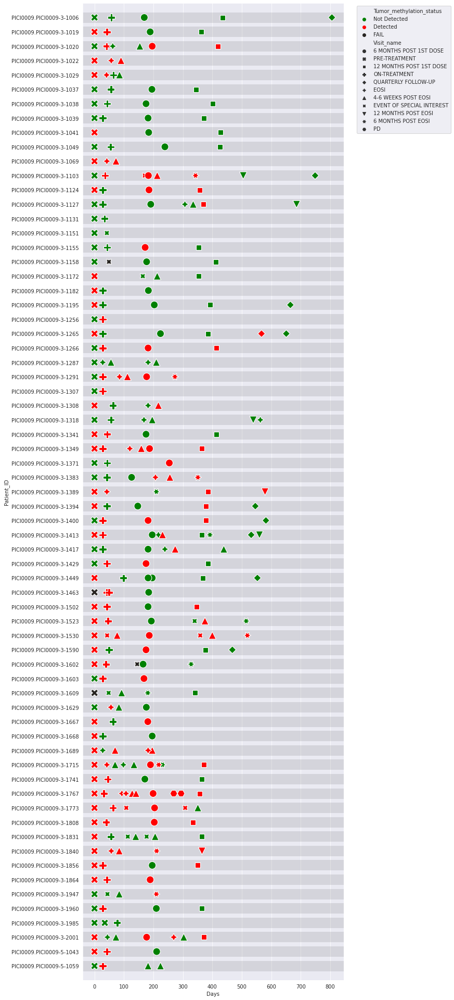

In [94]:
# Merge the missing inforamtion
df_case_all_info = df_case.merge(df_all_3[['GHSampleID', 'Tumor_methylation_status', 'Tumor_methylation_score']], on = 'GHSampleID', how = "left")

# Case samples only
plot_patient_journey_ori(df_case_all_info, out_prefix=f"PICI_{date.today()}")

<Figure size 432x288 with 0 Axes>

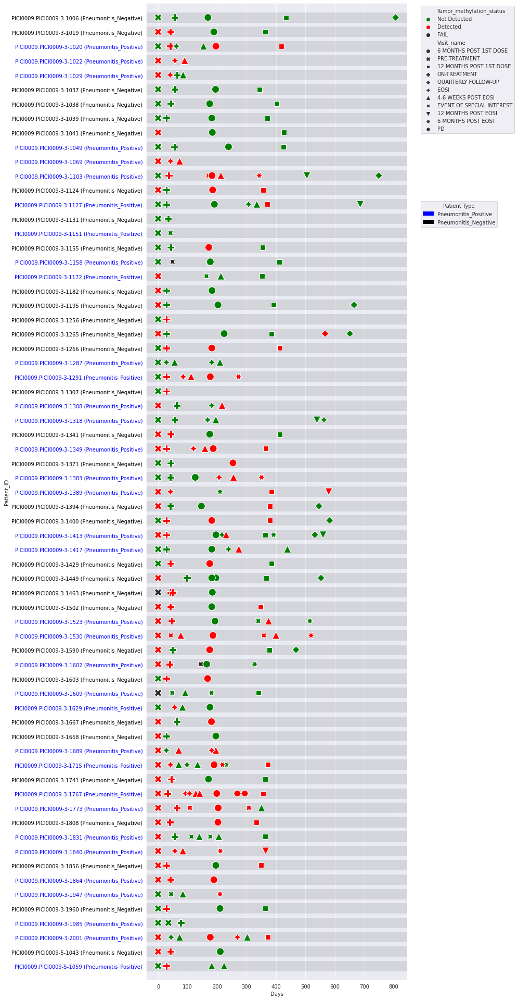

In [95]:
# Generat the patient journey
plot_patient_journey(df_all_3, out_prefix=f"PICI_{date.today()}")

## Collect the DMR regions values 

In [25]:
# Annotation of each region in {run_sample_id}.msre_region_stats.tsv file of each sample

# Read in the annotation file of MB caller DMR from screening team
df_DMR_annotation_v6 = pd.read_table(f"/screening/data/methylation/sandbox_pipeline/assets/mafband_v2023_12_23/msre_regions.tsv")
df_DMR_annotation_v6.head()

,chrom,start,end,region_id,merged_region_id,merged_region_type
0,1,955884,956186,merged_0,v5_hypo_control_chr1_955885_956186,V5_HYPO_CONTROL
1,1,1107305,1107455,merged_1,myeloid_dmr_482,V6_IMMUNE_DMR
2,1,2461184,2461934,merged_2,HES5_TSS_minus_downreg,V6_DE_TSS
3,1,2984786,2985170,merged_3,v5_crc_dmr_chr1_2984787_2985170,V5_CRC_DMR
4,1,3663703,3664004,merged_4,v5_tissue_dmr_chr1_3663704_3664004,V5_COLON_TISSUE_DMR


In [26]:
# Adding the new column "annotation" based on MB caller annotation
df_DMR_annotation_v6_1 = df_DMR_annotation_v6.copy()

df_DMR_annotation_v6_1["region_id_combined"] = df_DMR_annotation_v6_1["chrom"].astype(str) + "_" + df_DMR_annotation_v6_1["start"].astype(str) + "_" + df_DMR_annotation_v6_1["end"].astype(str)
# df_DMR_annotation_v6_1['annotation'] = df_DMR_annotation_v6_1['merged_region_type'].apply(lambda x: 'MB_caller_CONTROL_DMR' if 'CONTROL' or 'IMMUNE' in x else 'MB_caller_DMR')

# MB v6 DMR summary
print("Total size of MB DMR in v6 panel is " + str(df_DMR_annotation_v6_1.region_id_combined.unique().size) + "\n") 

# Remove the V6 panel regions with control and immune in it
df_DMR_annotation_v6_ctrl = df_DMR_annotation_v6_1[(df_DMR_annotation_v6_1['merged_region_type'].str.contains('CONTROL')) | (df_DMR_annotation_v6_1['merged_region_type'].str.contains('IMMUNE'))]
cso_dmr_remove_list = df_DMR_annotation_v6_ctrl.region_id.to_list()
cso_dmr_remove_coordinate_list = df_DMR_annotation_v6_ctrl.region_id_combined.to_list()
print("Total size of the control regions in MB DMR in v6 panel is " + str(df_DMR_annotation_v6_ctrl.region_id_combined.unique().size) + "\n") 

# Get the final v6 panel for DMR analysis 
df_DMR_annotation_v6_DMR = df_DMR_annotation_v6_1[~df_DMR_annotation_v6_1['region_id'].isin(cso_dmr_remove_list)]
cso_dmr_list = df_DMR_annotation_v6_DMR.region_id.to_list()
print("Total size of MB DMR in v6 panel after removing contorl regions is " + str(len(cso_dmr_list)) + "\n") 

# Check the excluded CSO caller DMRs
df_DMR_annotation_v6_ctrl.merged_region_type.value_counts()


Total size of MB DMR in v6 panel is 2717

Total size of the control regions in MB DMR in v6 panel is 688

Total size of MB DMR in v6 panel after removing contorl regions is 2029



V5_HYPO_CONTROL                 431
V6_IMMUNE_DMR                   123
HYPO_CONTROL                     72
HYPER_CONTROL                    51
V6_CRC_DMR,V6_IMMUNE_DMR          4
V5_HYPO_CONTROL,V5_TFBS           3
V6_DE_TSS,V6_IMMUNE_DMR           1
HYPO_CONTROL,V6_CTCF_CONST        1
HYPO_CONTROL,V5_HYPO_CONTROL      1
HYPO_CONTROL,V5_TFBS              1
Name: merged_region_type, dtype: int64

### INFROM Data

In [6]:
# Check LR panel regions and generate the data (df_consolidated_inform_DMR) for DMR analysis
df_consolidated_inform_DMR = df_region_stats_all.copy()

# Remove control regions in v6
df_consolidated_inform_DMR = df_consolidated_inform_DMR[~df_consolidated_inform_DMR["region_id"].isin(cso_dmr_remove_coordinate_list)]

# Get the intermediate component 
df_consolidated_inform_DMR['adjusted_log_norm_peak_count'] = np.log10(df_consolidated_inform_DMR["norm_peak_count"] + 1e-5)
df_consolidated_inform_DMR['adjusted_norm_peak_count'] = df_consolidated_inform_DMR["norm_peak_count"] + 1e-5
print(df_consolidated_inform_DMR.shape)
# Drop duplicates
df_consolidated_inform_DMR = df_consolidated_inform_DMR.drop_duplicates()
print(df_consolidated_inform_DMR.shape)

# Save the data
df_consolidated_inform_DMR.to_csv(f"{work_dir}/df_consolidated_inform_DMR_all_01132025.csv", index = False)

# Save the data for ILD prediction heatmap visualization
# Remove the Osimertinib_Control samples for ILD prediction purpose
df_consolidated_inform_DMR_no_Osimertinib = df_consolidated_inform_DMR[df_consolidated_inform_DMR['sample_type'] != 'Osimertinib_Control']
df_consolidated_inform_DMR_no_Osimertinib.to_csv(f"{work_dir}/df_consolidated_inform_DMR_all_no_Osimertinib_01132025.csv", index = False)

df_consolidated_inform_DMR.head()

(4052522, 10)
(4052522, 10)


,region_id,region_methyl_molecule_count,norm_region_methyl_molecule_count,norm_peak_count,bip_version,request_id,upk_key,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
0,1_840086_840325,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.0,0.00001
1,1_840443_840684,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.0,0.00001
2,1_856459_856681,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.0,0.00001
3,1_859000_859240,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.0,0.00001
4,1_859359_859837,0,0.0,0.0,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.0,0.00001


In [33]:
# Based on RED team's original lung-tissue specific filter. 19 regions were selected
df_intersection_final_dedup = pd.read_csv("/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/df_intersection_final_dedup.csv")

# selection the overlapping regions between LR and healthy-lung-tissue regions for later analysis
region_id_overlap = df_intersection_final_dedup.region_id.unique()
print(region_id_overlap)

df_consolidated_inform_DMR_19 = df_consolidated_inform_DMR[df_consolidated_inform_DMR["region_id"].isin(region_id_overlap)]

# Remove the samples with unexpected region #
count_df = df_consolidated_inform_DMR_19.groupby('request_id').region_id.count()

# Filter to find request_id where the count is not 19
not_19_run_sample_ids = count_df[count_df != 19]
print('wired sample: ' + str(not_19_run_sample_ids))

# Drop duplicates or remove the samples with non-19 regionid
# df_consolidated_inform_DMR_19 = df_consolidated_inform_DMR_19[df_consolidated_inform_DMR_19['request_id'] != '10TPJ1sRnXr0AWFzzjbWvg==']
df_consolidated_inform_DMR_19 = df_consolidated_inform_DMR_19.drop_duplicates()
print("Total unique sample size of clinical breast cancer inhouse samples with DMR info is " + str(df_consolidated_inform_DMR_19.request_id.nunique()) + "\n")

# Save the data
df_consolidated_inform_DMR_19.to_csv(f"{work_dir}/df_consolidated_inform_DMR_19_01132025.csv", index = False)

# Save the data for ILD prediction heatmap visualization
# Remove the Osimertinib_Control samples for ILD prediction purpose
df_consolidated_inform_DMR_19_no_Osimertinib = df_consolidated_inform_DMR_19[df_consolidated_inform_DMR_19['sample_type'] != 'Osimertinib_Control']
df_consolidated_inform_DMR_19_no_Osimertinib.to_csv(f"{work_dir}/df_consolidated_inform_DMR_19_no_Osimertinib_01132025.csv", index = False)

df_consolidated_inform_DMR_19.head()

['1_50884795_50885470' '2_63281169_63281518' '2_63283795_63284040'
 '2_111875207_111875685' '4_57521635_57522882' '5_134366914_134367034'
 '5_134367172_134367292' '6_152622844_152623510' '8_72468561_72469244'
 '8_72469349_72469583' '14_36993454_36993782' '17_12877289_12877530'
 '19_17007412_17008006' '19_17008123_17008601' '19_17008718_17008838'
 '19_18714725_18715204' '20_21694307_21695105' '22_19742853_19743435'
 '22_46368034_46368392']
wired sample: Series([], Name: region_id, dtype: int64)
Total unique sample size of clinical breast cancer inhouse samples with DMR info is 146



,region_id,region_methyl_molecule_count,norm_region_methyl_molecule_count,norm_peak_count,bip_version,request_id,upk_key,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
1088,1_50884795_50885470,1,0.000022,0.001009,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-2.991694,0.001019
3234,2_63281169_63281518,0,0.000000,0.000000,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.000000,0.000010
3235,2_63283795_63284040,1,0.000022,0.001464,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-2.831441,0.001474
3658,2_111875207_111875685,0,0.000000,0.000000,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.000000,0.000010
6559,4_57521635_57522882,6,0.000130,0.003033,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-2.516667,0.003043


### PICI data

In [9]:
df_all_2.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir
232,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201
158,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201
233,PICI0009,10914082EP01,A0675087,B00310998,PICI0009.PICI0009-3-1195,3-1195,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,35.8800,1.0,0,2/22/23,3/8/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201
160,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201
234,PICI0009,10958950EP01,A0675220,B00313657,PICI0009.PICI0009-3-1400,3-1400,QUARTERLY FOLLOW-UP,1,SUCCESS,NaN,13.5200,1.0,0,2/22/23,5/18/21,9/5/23,NSCLC,Pneumonitis_Negative,230322_A00770_0652_BHN2MCDSX5,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235


In [87]:
# Generate the region level methyaltion data from LR panel for DMR analysis

# Create an empty DataFrame for consolidated data
df_consolidated_LR_DMR = pd.DataFrame()

# Process each sample
for index, row in df_all_3.iterrows():
    run_sample_id = row["GHSampleID"]
    fc_dir = row["fc_dir"]
    patient_type = row['patient_type']
    msre_mr_file = f"{fc_dir}/{run_sample_id}/{run_sample_id}.msre_region_stats.tsv"
    # print(msre_mr_file)
    try:
        # Load the data file
        df_temp = pd.read_table(msre_mr_file)
        # Remove control regions in v6
        df_temp_sub = df_temp[~df_temp["region_id"].isin(cso_dmr_remove_coordinate_list)]
        # print(df_temp_sub.shape)

        # Add 'sample_id' and 'patient_type' to the DataFrame
        df_temp_sub['sample_id'] = run_sample_id
        df_temp_sub['patient_type'] = patient_type
        
        # Append to the consolidated DataFrame
        df_consolidated_LR_DMR = pd.concat([df_consolidated_LR_DMR, df_temp_sub], ignore_index=True)
    except FileNotFoundError:
        print(f"File not found for sample_id {run_sample_id}: {msre_mr_file}")
        continue

# Get the intermediate component 
df_consolidated_LR_DMR['adjusted_log_norm_peak_count'] = np.log10(df_consolidated_LR_DMR["norm_peak_count"] + 1e-5)
df_consolidated_LR_DMR['adjusted_norm_peak_count'] = df_consolidated_LR_DMR["norm_peak_count"] + 1e-5

df_consolidated_LR_DMR.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,patient_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
0,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_840086_840325,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001
1,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_840443_840684,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001
2,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_856459_856681,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001
3,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_859000_859240,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001
4,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_859359_859837,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001


In [97]:
# Check LR panel regions and generate the data (df_consolidated_PICI_DMR) for DMR analysis
df_consolidated_PICI_DMR = df_consolidated_LR_DMR.copy()

# Remove control regions in v6
df_consolidated_PICI_DMR = df_consolidated_PICI_DMR[~df_consolidated_PICI_DMR["region_id"].isin(cso_dmr_remove_coordinate_list)]

print(df_consolidated_PICI_DMR.shape)
# Drop duplicates
df_consolidated_PICI_DMR = df_consolidated_PICI_DMR.drop_duplicates()
print(df_consolidated_PICI_DMR.shape)

# Save the data
# df_consolidated_PICI_DMR.to_csv(f"{work_dir}/df_consolidated_LR_DMR_PICI_02012025.csv", index = False)
df_consolidated_PICI_DMR.to_csv(f"{work_dir}/df_consolidated_LR_DMR_PICI_02242025.csv", index = False)

(8660184, 14)
(8660184, 14)


In [10]:
# Readin the data
df_consolidated_PICI_DMR = pd.read_csv(f"{work_dir}/df_consolidated_LR_DMR_PICI_02242025.csv")

In [98]:
# Based on RED team's original lung-tissue specific filter. 19 regions were selected
df_intersection_final_dedup = pd.read_csv("/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/df_intersection_final_dedup.csv")

# selection the overlapping regions between LR and healthy-lung-tissue regions for later analysis
region_id_overlap = df_intersection_final_dedup.region_id.unique()
print(region_id_overlap)

df_consolidated_PICI_DMR_19 = df_consolidated_PICI_DMR[df_consolidated_PICI_DMR["region_id"].isin(region_id_overlap)]

# Remove the samples with unexpected region #
count_df = df_consolidated_PICI_DMR_19.groupby('run_sample_id').region_id.count()

# Filter to find request_id where the count is not 19
not_19_run_sample_ids = count_df[count_df != 19]
print('wired sample: ' + str(not_19_run_sample_ids))

# Drop duplicates or remove the samples with non-19 regionid
df_consolidated_PICI_DMR_19 = df_consolidated_PICI_DMR_19.drop_duplicates()
print("Total unique sample size of PICI samples with DMR info is " + str(df_consolidated_PICI_DMR_19.run_sample_id.nunique()) + "\n")

# Save the data
# df_consolidated_PICI_DMR_19.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_02012025.csv", index = False)
df_consolidated_PICI_DMR_19.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_02242025.csv", index = False)

df_consolidated_PICI_DMR_19.head()

['1_50884795_50885470' '2_63281169_63281518' '2_63283795_63284040'
 '2_111875207_111875685' '4_57521635_57522882' '5_134366914_134367034'
 '5_134367172_134367292' '6_152622844_152623510' '8_72468561_72469244'
 '8_72469349_72469583' '14_36993454_36993782' '17_12877289_12877530'
 '19_17007412_17008006' '19_17008123_17008601' '19_17008718_17008838'
 '19_18714725_18715204' '20_21694307_21695105' '22_19742853_19743435'
 '22_46368034_46368392']
wired sample: Series([], Name: region_id, dtype: int64)
Total unique sample size of PICI samples with DMR info is 312



,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,patient_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
1088,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_50884795_50885470,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001
3234,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_63281169_63281518,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001
3235,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_63283795_63284040,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001
3658,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_111875207_111875685,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001
6559,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,4_57521635_57522882,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001


### Lung-tissue-cancer specific DMR with relexed rule (INFORM and PICI)

In [100]:
# Readin lung-tissue specific region filtered by 6_pick_top_20_per_celltype.ipynb. Different relaxed rules were applied  
df_screening_summary_lung = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024//all_lung_specific_regions_breast_rule_loose2_as_input.csv")

df_screening_summary_lung['region_chr'] = df_screening_summary_lung['region_chr'].str.replace('chr', '')
df_screening_summary_lung = df_screening_summary_lung.rename(columns={
    'region_start': 'REGION_START',
    'region_end': 'REGION_END',
    'region_chr': 'REGION_CHR'
})
print("Lung-tissue specific DMRs summarized by Emily from screeninig team (original rule but not limited top 20 but all) is " + str(df_screening_summary_lung.shape[0]))
df_screening_summary_lung.head()


Lung-tissue specific DMRs summarized by Emily from screeninig team (original rule but not limited top 20 but all) is 151


,composite_chrom,REGION_START,REGION_END,weighted_avg,meth_base_min,meth_delta_max,REGION_CHR,target_celltype,number_other,exceptions
0,"chr10__Lung_Ep_Alveo__15__Bladder_Ep,Colon_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Pancreas_Duct,Prostate_Ep,Small_Int_Ep",122709642,122709815,0.041020,0.780208,-0.466083,10,Lung_Ep_Alveo,15,"Bladder_Ep,Colon_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Pancreas_Duct,Prostate_Ep,Small_Int_Ep"
1,"chr10__Lung_Ep_Alveo__16__Bladder_Ep,Colon_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep,Small_Int_Ep",122709706,122709869,0.036972,0.644442,-0.342533,10,Lung_Ep_Alveo,16,"Bladder_Ep,Colon_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep,Small_Int_Ep"
2,"chr10__Lung_Ep_Alveo__18__Bladder_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708669,122708802,0.011701,0.734507,-0.519127,10,Lung_Ep_Alveo,18,"Bladder_Ep,Esophagus_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep"
3,"chr10__Lung_Ep_Alveo__19__Bladder_Ep,Colon_Ep,Pancreas_Acinar,Small_Int_Ep",123923080,123923542,0.019839,0.610944,-0.381683,10,Lung_Ep_Alveo,19,"Bladder_Ep,Colon_Ep,Pancreas_Acinar,Small_Int_Ep"
4,"chr10__Lung_Ep_Alveo__19__Bladder_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708589,122708957,0.027372,0.679044,-0.410131,10,Lung_Ep_Alveo,19,"Bladder_Ep,Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep"


In [101]:
# Readin methyl data of all LR (~27K) regions in DSI SOW21 S3 MB negative samples (TFv2 version)
df_consolidated_sub4_LR_DMR = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/df_consolidated_sub4_LR_DMR_10212024.csv", header = 0)

# For LR regions just pull one sample
df_consolidated_sub4_LR_DMR_B00460895 = df_consolidated_sub4_LR_DMR[df_consolidated_sub4_LR_DMR["run_sample_id"] == "B00460895"]
df_consolidated_sub4_LR_DMR_B00460895.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
0,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_840086_840325,0,0,0,0.0,0.0,0.0,B00460895,Provided Cancer type: breast,-5.0,0.00001
1,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_840443_840684,0,0,0,0.0,0.0,0.0,B00460895,Provided Cancer type: breast,-5.0,0.00001
2,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_856459_856681,0,0,0,0.0,0.0,0.0,B00460895,Provided Cancer type: breast,-5.0,0.00001
3,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_859000_859240,0,0,0,0.0,0.0,0.0,B00460895,Provided Cancer type: breast,-5.0,0.00001
4,B00460895,230812_A01810_0184_AH7GK3DSX7,Sirius-1.1.0-RLS,1_859359_859837,0,0,0,0.0,0.0,0.0,B00460895,Provided Cancer type: breast,-5.0,0.00001


In [102]:
import pybedtools

# Search for overlapping DMRs between healthy-lung tissue specific and LR binary caller panel (S3)

# Split 'region_id' into 'CHR', 'START', 'END'
df_consolidated_sub4_LR_DMR_B00460895[['CHR', 'START', 'END']] = df_consolidated_sub4_LR_DMR_B00460895['region_id'].str.split('_', expand=True)
df_consolidated_sub4_LR_DMR_B00460895['CHR'] = df_consolidated_sub4_LR_DMR_B00460895['CHR'].astype(str)
df_consolidated_sub4_LR_DMR_B00460895['START'] = df_consolidated_sub4_LR_DMR_B00460895['START'].astype(int)
df_consolidated_sub4_LR_DMR_B00460895['END'] = df_consolidated_sub4_LR_DMR_B00460895['END'].astype(int)

# Convert to pybedtools object
bed_consolidated = pybedtools.BedTool.from_dataframe(df_consolidated_sub4_LR_DMR_B00460895[['CHR', 'START', 'END']])
bed_screening = pybedtools.BedTool.from_dataframe(df_screening_summary_lung[['REGION_CHR', 'REGION_START', 'REGION_END']])

# Intersect the BED files
intersection = bed_consolidated.intersect(bed_screening, wao=True)

# Convert intersection result back to DataFrame
df_intersection = pybedtools.BedTool.to_dataframe(intersection, names=['CHR', 'START', 'END', 'overlap_CHR', 'overlap_START', 'overlap_END', 'overlap_count'])

# Screening for overlapped regions
df_intersection_final = df_intersection[~(df_intersection['overlap_CHR'] == ".")]
print("The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (before removing duplicates) is " + str(df_intersection_final.shape[0]))

# Remove duplicate and check overlaps with LR panel 
df_intersection_final['region_id'] = df_intersection_final['CHR'].astype(str) + '_' + df_intersection_final['START'].astype(str) + '_' + df_intersection_final['END'].astype(str)
df_intersection_final_dedup = df_intersection_final.drop_duplicates(subset="region_id")
df_intersection_final_dedup['region_id_screening'] = df_intersection_final_dedup['overlap_CHR'].astype(str) + '_' + df_intersection_final_dedup['overlap_START'].astype(str) + '_' + df_intersection_final_dedup['overlap_END'].astype(str)

# # Merge the "MCD_TISSUE_FILTER_TYPE" back
# df_intersection_final_dedup = df_intersection_final_dedup.merge(df_screening_summary_lung[['region_id_screening', 'MCD_TISSUE_FILTER_TYPE']], on = "region_id_screening", how = "left")
# df_intersection_final_dedup = df_intersection_final_dedup.reset_index()
print("The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (after removing duplicates) is " + str(df_intersection_final_dedup.shape[0]))


df_intersection_final_dedup.head()

The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (before removing duplicates) is 92
The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (after removing duplicates) is 48


,CHR,START,END,overlap_CHR,overlap_START,overlap_END,overlap_count,region_id,region_id_screening
677,1,29585984,29586799,1,29585852,29586005,21,1_29585984_29586799,1_29585852_29586005
1087,1,50882782,50883218,1,50882997,50883174,177,1_50882782_50883218,1_50882997_50883174
1088,1,50884242,50884694,1,50884597,50885295,97,1_50884242_50884694,1_50884597_50885295
1090,1,50884795,50885470,1,50884597,50885295,500,1_50884795_50885470,1_50884597_50885295
1093,1,50886629,50887287,1,50886550,50886774,145,1_50886629_50887287,1_50886550_50886774


In [103]:
# Lung cancer specific regions low in breast only 
# hyper_tumor_filt_merged_lung = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024/TCGA_regions_lung_cancer_specific_low_in_breast_only.csv")
hyper_tumor_filt_merged_lung = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Hyper_lung_tissue_selection_Emily_10312024/TCGA_regions_lung_cancer_specific_low_in_breast_only_loose2_as_input.csv")

hyper_tumor_filt_merged_lung['region_chr'] = hyper_tumor_filt_merged_lung['region_chr'].str.replace('chr', '')
hyper_tumor_filt_merged_lung = hyper_tumor_filt_merged_lung.rename(columns={
    'region_start': 'REGION_START',
    'region_end': 'REGION_END',
    'region_chr': 'REGION_CHR'
})
print(hyper_tumor_filt_merged_lung.shape)
hyper_tumor_filt_merged_lung.head()


(957, 14)


,composite_chr,REGION_START,REGION_END,beta_value,match,weighted_avg,meth_delta_max,meth_base_min,REGION_CHR,target_celltype,number_other,cancer_type,exceptions,region_id
0,"chr10__Lung_Ep_Alveo__20__AML__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.060000,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,AML,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658
1,"chr10__Lung_Ep_Alveo__20__Adrenocortical__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.063689,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,Adrenocortical,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658
2,"chr10__Lung_Ep_Alveo__20__Bile duct__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.120872,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,Bile duct,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658
3,"chr10__Lung_Ep_Alveo__20__Bladder__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.070000,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,Bladder,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658
4,"chr10__Lung_Ep_Alveo__20__Breast__Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",122708510,122708658,0.230000,False,0.009613,-0.388261,0.602203,10,Lung_Ep_Alveo,20,Breast,"Head_Neck_Ep,Lung_Ep_Bron,Prostate_Ep",chr10:122708510-122708658


In [104]:
import pybedtools

# Search for overlapping DMRs between healthy-lung tissue specific and TCGA data 

# Split 'region_id' into 'CHR', 'START', 'END'
df_intersection_final_dedup[['CHR', 'START', 'END']] = df_intersection_final_dedup['region_id'].str.split('_', expand=True)
df_intersection_final_dedup['CHR'] = df_intersection_final_dedup['CHR'].astype(str)
df_intersection_final_dedup['START'] = df_intersection_final_dedup['START'].astype(int)
df_intersection_final_dedup['END'] = df_intersection_final_dedup['END'].astype(int)

# Convert to pybedtools object
bed_consolidated = pybedtools.BedTool.from_dataframe(df_intersection_final_dedup[['CHR', 'START', 'END']])
bed_tcga = pybedtools.BedTool.from_dataframe(hyper_tumor_filt_merged_lung[['REGION_CHR', 'REGION_START', 'REGION_END']])

# Intersect the BED files
intersection = bed_consolidated.intersect(bed_tcga, wao=True)

# Convert intersection result back to DataFrame
df_intersection = pybedtools.BedTool.to_dataframe(intersection, names=['CHR', 'START', 'END', 'overlap_CHR', 'overlap_START', 'overlap_END', 'overlap_count'])

# Screening for overlapped regions
df_intersection_final = df_intersection[~(df_intersection['overlap_CHR'] == ".")]
print("The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (before removing duplicates) is " + str(df_intersection_final.shape[0]))

# Remove duplicate and check overlaps with LR panel 
df_intersection_final['region_id'] = df_intersection_final['CHR'].astype(str) + '_' + df_intersection_final['START'].astype(str) + '_' + df_intersection_final['END'].astype(str)
df_intersection_final_dedup_lung_tcga = df_intersection_final.drop_duplicates(subset="region_id")
df_intersection_final_dedup_lung_tcga['region_id_screening'] = df_intersection_final_dedup_lung_tcga['overlap_CHR'].astype(str) + '_' + df_intersection_final_dedup_lung_tcga['overlap_START'].astype(str) + '_' + df_intersection_final_dedup_lung_tcga['overlap_END'].astype(str)
print("The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with TCGA annotation (after removing duplicates) is " + str(df_intersection_final_dedup_lung_tcga.shape[0]))

df_intersection_final_dedup_lung_tcga.head()

The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with LR panel (before removing duplicates) is 726
The overlapped Lung-tissue specific DMRs summarized by Emily from screeninig team with TCGA annotation (after removing duplicates) is 15


,CHR,START,END,overlap_CHR,overlap_START,overlap_END,overlap_count,region_id,region_id_screening
2,1,50884242,50884694,1,50884348,50884683,335,1_50884242_50884694,1_50884348_50884683
35,1,50884795,50885470,1,50884998,50885266,268,1_50884795_50885470,1_50884998_50885266
135,1,90308840,90309625,1,90309504,90309625,121,1_90308840_90309625,1_90309504_90309625
173,3,44063233,44063959,3,44063558,44063878,320,3_44063233_44063959,3_44063558_44063878
206,3,50402272,50402942,3,50402475,50402606,131,3_50402272_50402942,3_50402475_50402606


In [ ]:
# Based on lung-tissue-cancer specific filter. 15 regions were selected. 

# selection the overlapping regions between LR and healthy-lung-tissue regions for later analysis
region_id_overlap = df_intersection_final_dedup_lung_tcga.region_id.unique()
print(region_id_overlap)

df_consolidated_inform_DMR_lung_tissue_cancer = df_consolidated_inform_DMR[df_consolidated_inform_DMR["region_id"].isin(region_id_overlap)]

# Remove the samples with unexpected region #
count_df = df_consolidated_inform_DMR_lung_tissue_cancer.groupby('request_id').region_id.count()

# Filter to find request_id where the count is not 15
not_15_run_sample_ids = count_df[count_df != 15]
print('wired sample: ' + str(not_15_run_sample_ids))

# Drop duplicates or remove the samples with non-19 regionid
df_consolidated_inform_DMR_lung_tissue_cancer = df_consolidated_inform_DMR_lung_tissue_cancer.drop_duplicates()
print("Total unique sample size of clinical breast cancer inhouse samples with DMR info is " + str(df_consolidated_inform_DMR_lung_tissue_cancer.request_id.nunique()) + "\n")

# Save the data
df_consolidated_inform_DMR_lung_tissue_cancer.to_csv(f"{work_dir}/df_consolidated_inform_DMR_lung_tissue_cancer_01202025.csv", index = False)

df_consolidated_inform_DMR_lung_tissue_cancer.head()

In [105]:
# Based on lung-tissue-cancer specific filter. 15 regions were selected

# selection the overlapping regions between LR and healthy-lung-tissue regions for later analysis
region_id_overlap = df_intersection_final_dedup_lung_tcga.region_id.unique()
print(region_id_overlap)

df_consolidated_PICI_DMR_lung_tissue_cancer = df_consolidated_PICI_DMR[df_consolidated_PICI_DMR["region_id"].isin(region_id_overlap)]

# Remove the samples with unexpected region #
count_df = df_consolidated_PICI_DMR_lung_tissue_cancer.groupby('run_sample_id').region_id.count()

# Filter to find request_id where the count is not 15
not_15_run_sample_ids = count_df[count_df != 15]
print('wired sample: ' + str(not_15_run_sample_ids))

# Drop duplicates or remove the samples with non-19 regionid
df_consolidated_PICI_DMR_lung_tissue_cancer = df_consolidated_PICI_DMR_lung_tissue_cancer.drop_duplicates()
print("Total unique sample size of clinical breast cancer inhouse samples with DMR info is " + str(df_consolidated_PICI_DMR_lung_tissue_cancer.run_sample_id.nunique()) + "\n")

# Save the data
# df_consolidated_PICI_DMR_lung_tissue_cancer.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_lung_tissue_cancer_02012025.csv", index = False)
df_consolidated_PICI_DMR_lung_tissue_cancer.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_lung_tissue_cancer_02242025.csv", index = False)

df_consolidated_PICI_DMR_lung_tissue_cancer.head()

['1_50884242_50884694' '1_50884795_50885470' '1_90308840_90309625'
 '3_44063233_44063959' '3_50402272_50402942' '4_57521635_57522882'
 '6_10417174_10417767' '6_152622844_152623510' '10_122708511_122708869'
 '13_25319985_25322336' '17_12877289_12877530' '19_11492071_11492393'
 '20_21694307_21695105' '22_19742853_19743435' '22_46368034_46368392']
wired sample: Series([], Name: region_id, dtype: int64)
Total unique sample size of clinical breast cancer inhouse samples with DMR info is 312



,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,patient_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
1087,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_50884242_50884694,1,23,1,465.28493,0.000046,0.002149,B00310928,Pneumonitis_Negative,-2.665703,0.002159
1088,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_50884795_50885470,0,0,0,0.00000,0.000000,0.000000,B00310928,Pneumonitis_Negative,-5.000000,0.000010
1393,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_90308840_90309625,0,0,0,0.00000,0.000000,0.000000,B00310928,Pneumonitis_Negative,-5.000000,0.000010
4976,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,3_44063233_44063959,0,0,0,0.00000,0.000000,0.000000,B00310928,Pneumonitis_Negative,-5.000000,0.000010
5124,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,3_50402272_50402942,1,18,1,477.95279,0.000046,0.002092,B00310928,Pneumonitis_Negative,-2.677314,0.002102


## Data Exploration

### INFORM data

In [31]:
# Reformat the traning data
df_train = df_consolidated_inform_DMR_19.copy()
df_train = df_consolidated_inform_DMR_lung_tissue_cancer.copy()

df_train = df_train[['request_id', 'region_id', 'adjusted_log_norm_peak_count', 'sample_type']]

# Pivot the data to make region_id as columns
df_pivot = df_train.pivot(index='request_id', columns='region_id', values='adjusted_log_norm_peak_count')

# Add the target variable (y-label) back to the reshaped dataframe
df_pivot['sample_type'] = df_train.groupby('request_id')['sample_type'].first()

# Reset the index for a cleaner dataframe
df_train = df_pivot.reset_index()
print(df_train.shape)
print(df_train.sample_type.value_counts())
df_train.head()

(146, 17)
Osimertinib_Control    95
IO_Control             27
Prednisone_Positive    17
ILD_Positive            7
Name: sample_type, dtype: int64


region_id,request_id,10_122708511_122708869,13_25319985_25322336,17_12877289_12877530,19_11492071_11492393,1_50884242_50884694,1_50884795_50885470,1_90308840_90309625,20_21694307_21695105,22_19742853_19743435,22_46368034_46368392,3_44063233_44063959,3_50402272_50402942,4_57521635_57522882,6_10417174_10417767,6_152622844_152623510,sample_type
0,+TX9j8prKbYZJdRDL/ncbQ==,-2.731602,-2.662916,-2.566605,-2.638012,-2.432585,-2.132186,-2.638012,-2.266377,-2.418583,-2.428850,-5.000000,-2.424892,-2.431744,-5.000000,-2.606532,Osimertinib_Control
1,+ve8RMCHlSq0S5faOk1K7A==,-3.319671,-5.000000,-0.702021,-2.619308,-2.876518,-3.309301,-5.000000,-2.832585,-2.822619,-0.902042,-2.540366,-2.472634,-5.000000,-2.611918,-5.000000,IO_Control
2,//ODI8zSQY4LoBFVGN3BaQ==,-1.971876,-2.825972,-2.239030,-3.288201,-2.021751,-1.875049,-5.000000,-2.656393,-2.567390,-2.249915,-2.271463,-2.133590,-1.973107,-1.777942,-1.833342,Osimertinib_Control
3,0tZ3by6lNZizmIyJX+Sj+w==,-5.000000,-2.674722,-2.874135,-2.974150,-2.842580,-3.008121,-5.000000,-2.621942,-2.694831,-5.000000,-2.821365,-2.833508,-5.000000,-2.649399,-5.000000,IO_Control
4,10TPJ1sRnXr0AWFzzjbWvg==,-2.567614,-2.983017,-2.568585,-3.385669,-3.250828,-2.864000,-5.000000,-2.623374,-2.660807,-5.000000,-2.517611,-2.384798,-2.865046,-2.617313,-2.854922,Osimertinib_Control


In [30]:
df_train = df_train[df_train['sample_type'] != 'Prednisone_Positive']

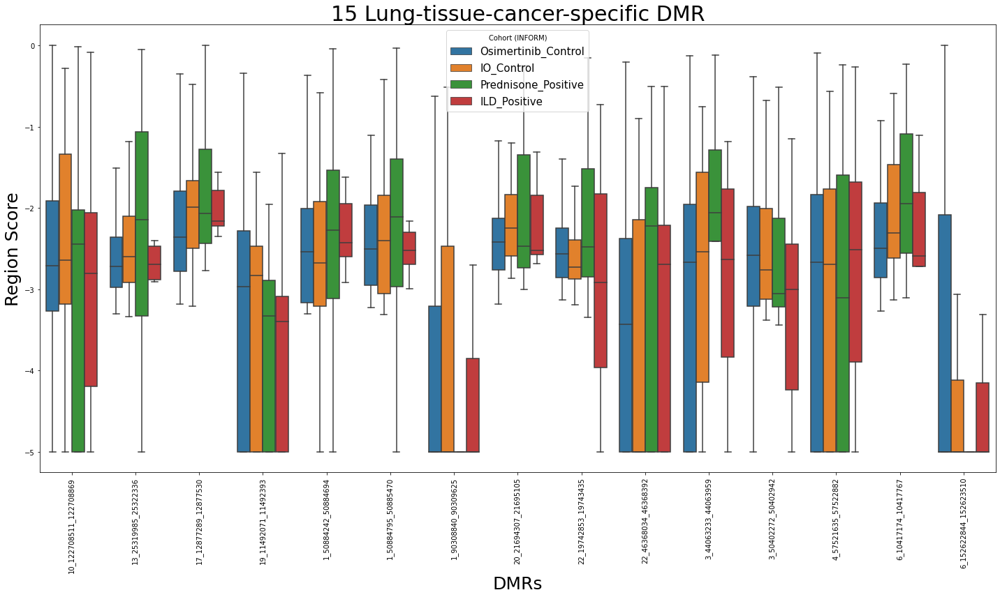

In [32]:
# Drop unnecessary columns if needed
df_train_features = df_train.drop(columns=['request_id'], errors='ignore')

# Melt the dataframe for easier visualization
df_train_melted = df_train_features.melt(id_vars="sample_type", var_name="Feature", value_name="Value")

# Plot feature distributions using boxplots
plt.figure(figsize=(20, 12))
sns.boxplot(data=df_train_melted, x="Feature", y="Value", hue="sample_type", showfliers=False)

# Formatting the plot
plt.xticks(rotation=90, fontsize=10)
plt.title("15 Lung-tissue-cancer-specific DMR", fontsize=30)
plt.ylabel("Region Score", fontsize=25)
plt.xlabel("DMRs", fontsize=25)
plt.legend(title="Cohort (INFORM)", fontsize=15)
plt.tight_layout()
plt.show()


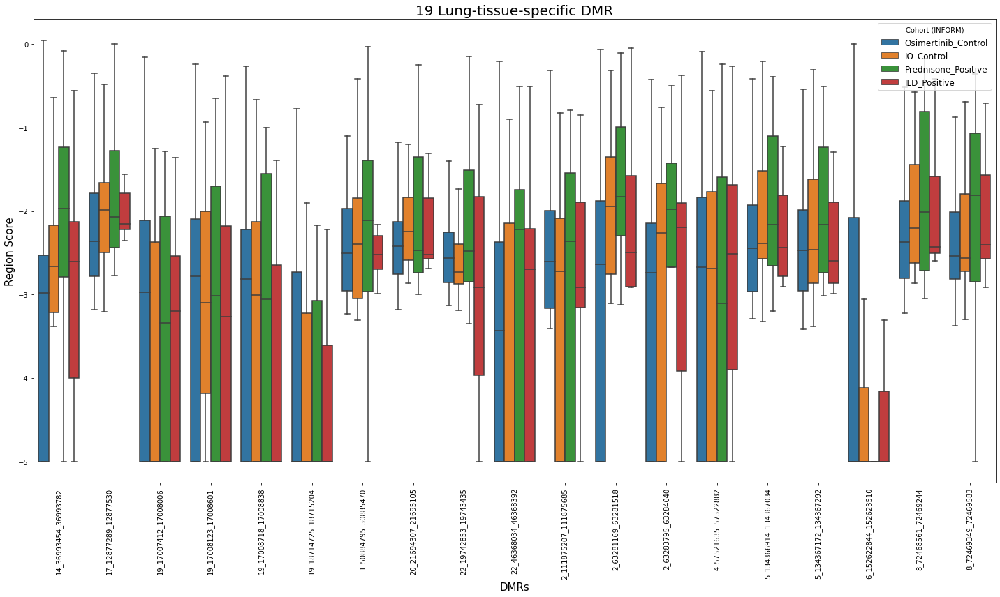

In [ ]:
# Drop unnecessary columns if needed
df_train_features = df_train.drop(columns=['request_id'], errors='ignore')

# Melt the dataframe for easier visualization
df_train_melted = df_train_features.melt(id_vars="sample_type", var_name="Feature", value_name="Value")

# Plot feature distributions using boxplots
plt.figure(figsize=(20, 12))
sns.boxplot(data=df_train_melted, x="Feature", y="Value", hue="sample_type", showfliers=False)

# Formatting the plot
plt.xticks(rotation=90, fontsize=10)
plt.title("19 Lung-tissue-specific DMR", fontsize=20)
plt.ylabel("Region Score", fontsize=15)
plt.xlabel("DMRs", fontsize=15)
plt.legend(title="Cohort (INFORM)", fontsize=12)
plt.tight_layout()
plt.show()


### PICI data

In [10]:
# Readin methylaiton data
df_consolidated_PICI_DMR_19 = pd.read_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_02242025.csv")
df_consolidated_PICI_DMR_lung_tissue_cancer = pd.read_csv(f"{work_dir}/df_consolidated_PICI_DMR_lung_tissue_cancer_02242025.csv")

# Readin meta data of pneumonitis case and control samples
df_case_meta = pd.read_csv(f"{pici_dir}/RADIOHEAD_Pneumonitis_patient_meta.csv", header = 0) 
df_ctrl_meta = pd.read_csv(f"{pici_dir}/RADIOHEAD_control_patient_meta_02242025.csv", header = 0) 

# This concate might be problematic, NEED TO CHECK IT OUT LATER
df_case_meta_1 = df_case_meta.drop(columns=['Patients with pneumonitis'], errors='ignore')

df_meta = pd.concat([df_case_meta_1, df_ctrl_meta], ignore_index=True)

df_meta.head()

,days.pneumonitis,Cancer,meddra.disease.preferred.name,stage,subject.metastatic.disease,line.1.therapy,subject.age,subject.sex,subject.ethnicity,subject.race,Region,current.smoker,ever.smoked,prior.targeted_therapy,prior.surgery,prior.radiation,prior.chemotherapy,prior.car_t,pneumo_vax_hist,zoster_vax_hist,baseline_influenza_vax,antibiotics_yn,irae.any,irae.severe,Steroid.irAE,clinical.observation.os.event,clinical.observation.os,clinical.observation.pfs.event,clinical.observation.pfs,probable.pfs.event,probable.pfs,offstudy_reason,clinical.observation.os.old,clinical.observation.pfs.old,T0_sample_success,T0_sample_GHSampleID,T0_bloodcoll_date,T0_methylation_tumor_percent_ldt,T0_methylation_tumor_percent_ruo,T0_ctDNA_yield_ng,T0_pfs,T0_os,T0_sample_success_old,T0_pfs_old,T0_os_old,T1_sample_success,T1_sample_GHSampleID,T1_bloodcoll_date,T1_methylation_tumor_percent_ldt,T1_methylation_tumor_percent_ruo,T1_ctDNA_yield_ng,T1_pfs,T1_os,T1_sample_success_old,T1_pfs_old,T1_os_old,T2_sample_success,T2_sample_GHSampleID,T2_bloodcoll_date,T2_methylation_tumor_percent_ldt,T2_methylation_tumor_percent_ruo,T2_ctDNA_yield_ng,T2_pfs,T2_os,T2_sample_success_old,T2_pfs_old,T2_os_old,T3_sample_success,T3_sample_GHSampleID,T3_bloodcoll_date,T3_methylation_tumor_percent_ldt,T3_methylation_tumor_percent_ruo,T3_ctDNA_yield_ng,T3_pfs,T3_os,T3_sample_success_old,T3_pfs_old,T3_os_old,Training_Set,Test_Set,Best_Objective_Response_6mo,Timing_of_Best_Response_6mo,Best_Objective_Response_12mo,Timing_of_Best_Response_12mo,subject.id
0,62.0,Non-small cell lung cancer (NSCLC),Non-small cell lung cancer,iv,1,pd1-pdl1,77,male,not-hispanic,white,Northeast,0,1,0,0,0,0,0,1.0,NaN,0.0,0.0,1,0,1.0,False,13.967,False,13.967,False,13.967,Patient completed all study draws and follow-up window,13.967,13.967,sample successful,B00489843,12/6/18,0.000000,0.000000,3.2448,13.967,13.967,sample successful,13.967,13.967,sample successful,B00489739,1/16/19,0.010000,0.001829,5.9800,12.600333,12.600333,sample successful,12.600333,12.600333,sample successful,B00489788,5/9/19,0.0,0.0,5.928,8.833667,8.833667,sample successful,8.833667,8.833667,sample successful,B00488568,1/29/20,0.046837,0.046837,2.340,0.000333,0.000333,sample successful,0.000333,0.000333,no,yes,NaN,NaN,NaN,NaN,NaN
1,48.0,Non-small cell lung cancer (NSCLC),Non-small cell lung cancer,iii,1,pd1-pdl1,54,male,not-hispanic,other,Midwest,0,1,0,1,0,1,0,0.0,0.0,0.0,1.0,1,1,1.0,True,3.433,True,3.433,True,3.433,Disease progression,3.433,3.433,sample successful,B00319702,12/11/18,2.248330,2.248330,12.3500,3.433,3.433,sample successful,3.433,3.433,sample successful,B00323658,2/6/19,3.525747,3.525747,22.5550,1.533000,1.533000,sample successful,1.533000,1.533000,sample unavailable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sample unavailable,NaN,NaN,sample unavailable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sample unavailable,NaN,NaN,yes,no,NaN,NaN,NaN,NaN,NaN
2,20.0,Non-small cell lung cancer (NSCLC),Non-small cell lung cancer,iv,1,pd1-pdl1,85,male,hispanic,white,Northeast,0,1,0,1,1,0,0,NaN,NaN,NaN,1.0,1,1,1.0,True,3.367,True,3.367,True,3.367,Death,3.367,3.367,sample successful,B00489758,12/18/18,0.024166,0.024166,14.4040,3.367,3.367,sample successful,3.367,3.367,sample successful,B00489832,1/28/19,0.018260,0.018260,9.4120,2.000333,2.000333,sample successful,2.000333,2.000333,sample unavailable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sample unavailable,NaN,NaN,sample unavailable,NaN,NaN,NaN,NaN,NaN,NaN,NaN,sample unavailable,NaN,NaN,no,yes,NaN,NaN,NaN,NaN,NaN
3,113.0,Melanoma,Malignant melanoma,iv,1,pd1-pdl1,74,male,not-hispanic,white,West,0,1,1,1,0,0,0,1.0,1.0,1.0,1.0,1,0,1.0,False,15.000,False,15.000,False,15.000,Patient completed all study draws and follow-up window,29.667,29.667,sample successful,B00562460,1/15/19,0.000000,0.000000,7.0720,15.000,15.000,sample successful,29.667,29.667,sample successful,B00541315,3/11/19,0.000000,0.000000,8.6840,13.166667,13.166667,sample successful,27.833667,27.833667,sample successful,B00544089,9/11/19,0.0,0.0,5.564,7.033333,7.03

In [ ]:
# # 1. Rename columns for merging consistency
# df_case_meta.rename(columns={"Patients with pneumonitis": "Patient_ID_Simplified"}, inplace=True)
# df_case.rename(columns={"Patient_ID Simplified": "Patient_ID_Simplified"}, inplace=True)

# # 2. Merge sample data with metadata
# merged_df = df_case.merge(df_case_meta, on="Patient_ID_Simplified", how="left")

# # 3. Convert columns to datetime
# merged_df["Bloodcoll_date"] = pd.to_datetime(merged_df["Bloodcoll_date"], errors="coerce")

# # 4. Get baseline date per patient (earliest sample collection date)
# baseline_dates = (
#     merged_df.groupby("Patient_ID_Simplified")["Bloodcoll_date"]
#     .min()
#     .reset_index()
#     .rename(columns={"Bloodcoll_date": "Baseline_date"})
# )

# # 5. Merge baseline date back into merged_df
# merged_df = merged_df.merge(baseline_dates, on="Patient_ID_Simplified", how="left")

# # 6. Compute days from baseline
# merged_df["days_from_baseline"] = (
#     merged_df["Bloodcoll_date"] - merged_df["Baseline_date"]
# ).dt.days

# # 7. Compute the theoretical pneumonitis onset date for each sample
# #    (baseline_date + days.pneumonitis)
# merged_df["pneumonitis_onset_date"] = (
#     merged_df["Baseline_date"] 
#     + pd.to_timedelta(merged_df["days.pneumonitis"], unit="D")
# )

# # 8. Filter for samples on or AFTER the theoretical onset date
# on_or_after_onset = merged_df[
#     merged_df["Bloodcoll_date"] >= merged_df["pneumonitis_onset_date"]
# ].copy()

# # 9. For each patient, pick the EARLIEST sample that is on or after onset
# #    (i.e., minimal Bloodcoll_date among those >= onset date)
# earliest_pneumonitis_samples = on_or_after_onset.loc[
#     on_or_after_onset.groupby("Patient_ID_Simplified")["Bloodcoll_date"].idxmin()
# ]

# # 10. Merge the earliest post-onset sample info back into df_case
# #     We rename the Bloodcoll_date column to something like "Bloodcoll_date_onset"
# #     so we can compare directly in df_case.
# df_case = df_case.merge(
#     earliest_pneumonitis_samples[["Patient_ID_Simplified", "Bloodcoll_date"]].rename(
#         columns={"Bloodcoll_date": "Bloodcoll_date_onset"}
#     ),
#     on="Patient_ID_Simplified",
#     how="left"
# )

# # Convert date columns to datetime again, just to be safe
# df_case["Bloodcoll_date"] = pd.to_datetime(df_case["Bloodcoll_date"], errors="coerce")
# df_case["Bloodcoll_date_onset"] = pd.to_datetime(df_case["Bloodcoll_date_onset"], errors="coerce")

# # 11. Classify each sample
# #     If the sample date is on or after "Bloodcoll_date_onset", call it Pneumonitis_positive_samples.
# #     If a patient has no sample on/after onset, Bloodcoll_date_onset will be NaT, so that patient’s
# #     samples remain classified as "Before_EOSI_samples".
# df_case["pneumonitis_EOSI"] = np.where(
#     (df_case["Bloodcoll_date_onset"].notna())
#     & (df_case["Bloodcoll_date"] >= df_case["Bloodcoll_date_onset"]),
#     "Pneumonitis_positive_samples",
#     "Before_EOSI_samples"
# )

# # Check results
# df_case["pneumonitis_EOSI"].value_counts()


Pneumonitis_positive_samples    110
Before_EOSI_samples              78
Name: pneumonitis_EOSI, dtype: int64

In [11]:
# Define the actual onset of pneumonitis timepoint of each patient

# The major logic is: 
# For each patient, pick the “onset sample” with this priority:
# a. The earliest sample strictly after the onset date,
# b. If none is strictly after, any sample exactly on the onset date,
# c. Otherwise, the last sample before the onset date.



# Based on the "Patients with pneumonitis" information to define column "pneumonitis_EOSI"
# This is based on the column “days.pneumonitis” and “Bloodcoll_date” 
# but not merely based on “Visit_name” labels

# Step1

# Rename columns for merging consistency
df_case_meta.rename(columns={"Patients with pneumonitis": "Patient_ID_Simplified"}, inplace=True)
df_case.rename(columns={"Patient_ID Simplified": "Patient_ID_Simplified"}, inplace=True)

# Merge sample data with metadata
merged_df = df_case.merge(df_case_meta, on="Patient_ID_Simplified", how="left")

# Convert dates to datetime
merged_df["Bloodcoll_date"] = pd.to_datetime(merged_df["Bloodcoll_date"], errors='coerce')

# Get baseline date per patient (earliest sample collection date)
baseline_dates = (
    merged_df.groupby("Patient_ID_Simplified")["Bloodcoll_date"]
    .min()
    .reset_index()
    .rename(columns={"Bloodcoll_date": "Baseline_date"})
)

# Merge baseline date
merged_df = merged_df.merge(baseline_dates, on="Patient_ID_Simplified", how="left")

# Compute days from baseline for each sample
merged_df["days_from_baseline"] = (
    merged_df["Bloodcoll_date"] - merged_df["Baseline_date"]
).dt.days

# Step 2

# (A) Compute each patient’s theoretical onset date
merged_df["pneumonitis_onset_date"] = (
    merged_df["Baseline_date"] 
    + pd.to_timedelta(merged_df["days.pneumonitis"], unit="D")
)

def find_onset_sample_for_patient(df_sub):
    """
    Given all samples for a single patient (df_sub),
    return a ONE-ROW DataFrame that should be labeled 
    as the 'onset' sample using the priority:
      1) earliest sample strictly AFTER onset_date,
      2) else sample exactly ON onset_date,
      3) else last sample BEFORE onset_date.
    Return None if the patient has no samples at all.
    """
    if df_sub.empty:
        return None
    
    # Sort by actual collection date
    df_sub = df_sub.sort_values(by="Bloodcoll_date")

    # Onset date is the same for all rows of this patient
    onset_date = df_sub["pneumonitis_onset_date"].iloc[0]

    # 1) Earliest sample strictly AFTER onset
    after_onset = df_sub[df_sub["Bloodcoll_date"] > onset_date]
    if not after_onset.empty:
        return after_onset.iloc[[0]]  # return as a 1-row DataFrame

    # 2) If no sample strictly after, check for exactly ON onset
    on_onset = df_sub[df_sub["Bloodcoll_date"] == onset_date]
    if not on_onset.empty:
        return on_onset.iloc[[0]]

    # 3) Otherwise, pick the LAST sample BEFORE onset (if any)
    before_onset = df_sub[df_sub["Bloodcoll_date"] < onset_date]
    if not before_onset.empty:
        return before_onset.iloc[[-1]]

    # If truly no samples (extreme edge case), return None
    return None

# Collect each patient's onset row as a 1-row DataFrame
onset_dfs = []
for pid, df_grp in merged_df.groupby("Patient_ID_Simplified"):
    onset_sample_df = find_onset_sample_for_patient(df_grp)
    if onset_sample_df is not None:
        onset_dfs.append(onset_sample_df)

# Combine them with pd.concat (NOT pd.DataFrame(...))
onset_df = pd.concat(onset_dfs, axis=0, ignore_index=True)

# We'll rename "Bloodcoll_date" in onset_df to "Bloodcoll_date_onset"
onset_df = onset_df[["Patient_ID_Simplified", "Bloodcoll_date"]].rename(
    columns={"Bloodcoll_date": "Bloodcoll_date_onset"}
)

# Step 3

df_case["Visit_name"] = df_case["Visit_name"].astype(str).str.strip()

# Merge the chosen onset sample back into df_case
df_case = df_case.merge(onset_df, on="Patient_ID_Simplified", how="left")

# Convert dates to datetime for comparison
df_case["Bloodcoll_date"] = pd.to_datetime(df_case["Bloodcoll_date"], errors='coerce')
df_case["Bloodcoll_date_onset"] = pd.to_datetime(df_case["Bloodcoll_date_onset"], errors='coerce')

# Create a new column "pneumonitis_EOSI" 
# using the chosen "Bloodcoll_date_onset" logic
def label_pneumonitis(row):
    onset_date = row["Bloodcoll_date_onset"]
    sample_date = row["Bloodcoll_date"]
    if pd.isna(onset_date):
        # If no onset sample was found, label everything "Before_EOSI_samples" 
        return "Before_EOSI_samples"
    # Otherwise, label samples on or after that onset sample’s date 
    return (
        "Pneumonitis_positive_samples"
        if sample_date >= onset_date
        else "Before_EOSI_samples"
    )

df_case["pneumonitis_EOSI"] = df_case.apply(label_pneumonitis, axis=1)

df_case["pneumonitis_EOSI"].value_counts()


Pneumonitis_positive_samples    106
Before_EOSI_samples              82
Name: pneumonitis_EOSI, dtype: int64

In [12]:
# Create a new column that flags the first onset timepoint: "Onset-timepoint" if the sample's date equals first_positive_date and is positive, "Non-onset-timepoint" otherwise.
first_positive = (
    df_case[df_case["pneumonitis_EOSI"] == "Pneumonitis_positive_samples"]
    .groupby("Patient_ID_Simplified")["Bloodcoll_date"]
    .min()
    .reset_index()
    .rename(columns={"Bloodcoll_date": "first_positive_date"})
)

df_case = df_case.merge(first_positive, on="Patient_ID_Simplified", how="left")

df_case["pneumonitis_EOSI_onset_timepoint"] = np.where(
    (df_case["pneumonitis_EOSI"] == "Pneumonitis_positive_samples") &
    (df_case["Bloodcoll_date"] == df_case["first_positive_date"]),
    "Onset-timepoint", "Non-onset-timepoint"
)

df_case.drop(columns=["first_positive_date"], inplace=True)
df_case.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID_Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,Bloodcoll_date_onset,pneumonitis_EOSI,pneumonitis_EOSI_onset_timepoint
0,PICI0009,10910499EP01,A0725515,B00556603,PICI0009.PICI0009-3-1947,3-1947,PRE-TREATMENT,1,SUCCESS,Low Diversity Warning,2.3920,1.0,0,3/14/23,2020-12-01,12/25/23,Melanoma,Pneumonitis_Positive,2021-01-14,Before_EOSI_samples,Non-onset-timepoint
1,PICI0009,10916979EP01,A0725434,B00554096,PICI0009.PICI0009-3-1947,3-1947,EVENT OF SPECIAL INTEREST,1,SUCCESS,Low Diversity Warning,2.0800,1.0,0,3/14/23,2021-01-14,12/25/23,Melanoma,Pneumonitis_Positive,2021-01-14,Pneumonitis_positive_samples,Onset-timepoint
2,PICI0009,10933384EP01,A0725336,B00555738,PICI0009.PICI0009-3-1947,3-1947,4-6 WEEKS POST EOSI,1,SUCCESS,Methylation Bias Warning,2.8964,1.0,0,3/14/23,2021-02-23,12/25/23,Melanoma,Pneumonitis_Positive,2021-01-14,Pneumonitis_positive_samples,Non-onset-timepoint
3,PICI0009,10997796EP01,A0724257,B00565532,PICI0009.PICI0009-3-1947,3-1947,6 MONTHS POST EOSI,1,SUCCESS,Low Diversity Warning; Methylation Bias Warning,2.1424,1.0,0,3/14/23,2021-06-29,1/8/24,Melanoma,Pneumonitis_Positive,2021-01-14,Pneumonitis_positive_samples,Non-onset-timepoint
4,PICI0009,10904146EP01,A0675006,B00324268,PICI0009.PICI0009-3-1985,3-1985,PRE-TREATMENT,1,SUCCESS,NaN,3.5000,1.0,0,2/22/23,2021-01-27,10/9/23,NSCLC,Pneumonitis_Positive,2021-04-14,Before_EOSI_samples,Non-onset-timepoint


In [13]:
# Merge the steriod usage information 
df_case = df_case.merge(df_case_meta[['Patient_ID_Simplified', 'Steroid.irAE']], on = 'Patient_ID_Simplified', how = "left")
df_case.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID_Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,Bloodcoll_date_onset,pneumonitis_EOSI,pneumonitis_EOSI_onset_timepoint,Steroid.irAE
0,PICI0009,10910499EP01,A0725515,B00556603,PICI0009.PICI0009-3-1947,3-1947,PRE-TREATMENT,1,SUCCESS,Low Diversity Warning,2.3920,1.0,0,3/14/23,2020-12-01,12/25/23,Melanoma,Pneumonitis_Positive,2021-01-14,Before_EOSI_samples,Non-onset-timepoint,1
1,PICI0009,10916979EP01,A0725434,B00554096,PICI0009.PICI0009-3-1947,3-1947,EVENT OF SPECIAL INTEREST,1,SUCCESS,Low Diversity Warning,2.0800,1.0,0,3/14/23,2021-01-14,12/25/23,Melanoma,Pneumonitis_Positive,2021-01-14,Pneumonitis_positive_samples,Onset-timepoint,1
2,PICI0009,10933384EP01,A0725336,B00555738,PICI0009.PICI0009-3-1947,3-1947,4-6 WEEKS POST EOSI,1,SUCCESS,Methylation Bias Warning,2.8964,1.0,0,3/14/23,2021-02-23,12/25/23,Melanoma,Pneumonitis_Positive,2021-01-14,Pneumonitis_positive_samples,Non-onset-timepoint,1
3,PICI0009,10997796EP01,A0724257,B00565532,PICI0009.PICI0009-3-1947,3-1947,6 MONTHS POST EOSI,1,SUCCESS,Low Diversity Warning; Methylation Bias Warning,2.1424,1.0,0,3/14/23,2021-06-29,1/8/24,Melanoma,Pneumonitis_Positive,2021-01-14,Pneumonitis_positive_samples,Non-onset-timepoint,1
4,PICI0009,10904146EP01,A0675006,B00324268,PICI0009.PICI0009-3-1985,3-1985,PRE-TREATMENT,1,SUCCESS,NaN,3.5000,1.0,0,2/22/23,2021-01-27,10/9/23,NSCLC,Pneumonitis_Positive,2021-04-14,Before_EOSI_samples,Non-onset-timepoint,1


In [14]:
# Merge the "pneumonitis_EOSI" information
df_all_4 = df_all_2.copy() 
df_all_4 = df_all_4.merge(df_case[['GHSampleID', 'pneumonitis_EOSI', 'pneumonitis_EOSI_onset_timepoint', 'Steroid.irAE']], on = 'GHSampleID', how = 'left')

# Fill NaN of column "pneumonitis_EOSI" with "Before_EOSI_samples"
df_all_4['pneumonitis_EOSI'] = df_all_4['pneumonitis_EOSI'].fillna('Before_EOSI_samples')
# Fill NaN of column "Steroid.irAE" with 0
df_all_4['Steroid.irAE'] = df_all_4['Steroid.irAE'].fillna(0)

print(df_all_4.pneumonitis_EOSI.value_counts())
df_all_4.head()

Before_EOSI_samples             206
Pneumonitis_positive_samples    106
Name: pneumonitis_EOSI, dtype: int64


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir,pneumonitis_EOSI,pneumonitis_EOSI_onset_timepoint,Steroid.irAE
0,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Before_EOSI_samples,NaN,0.0
1,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Pneumonitis_positive_samples,Non-onset-timepoint,0.0
2,PICI0009,10914082EP01,A0675087,B00310998,PICI0009.PICI0009-3-1195,3-1195,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,35.8800,1.0,0,2/22/23,3/8/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Before_EOSI_samples,NaN,0.0
3,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Pneumonitis_positive_samples,Non-onset-timepoint,0.0
4,PICI0009,10958950EP01,A0675220,B00313657,PICI0009.PICI0009-3-1400,3-1400,QUARTERLY FOLLOW-UP,1,SUCCESS,NaN,13.5200,1.0,0,2/22/23,5/18/21,9/5/23,NSCLC,Pneumonitis_Negative,230322_A00770_0652_BHN2MCDSX5,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,Before_EOSI_samples,NaN,0.0


In [15]:
# Fill NaN of column "pneumonitis_EOSI_onset_timepoint" with "Post-onset-timepoint" and "Prior-onset-timepoint"
df_all_4['pneumonitis_EOSI_onset_timepoint'] = np.where(
    (df_all_4['pneumonitis_EOSI_onset_timepoint'] != "Onset-timepoint") & 
    (df_all_4['pneumonitis_EOSI'] == "Pneumonitis_positive_samples"), 
    "Post-onset-timepoint",
    np.where(
        (df_all_4['pneumonitis_EOSI_onset_timepoint'] != "Onset-timepoint") & 
        (df_all_4['pneumonitis_EOSI'] == "Before_EOSI_samples"), 
        "Prior-onset-timepoint", 
        "Onset-timepoint"
    )
)

print(df_all_4.pneumonitis_EOSI_onset_timepoint.value_counts())
df_all_4.head()

Prior-onset-timepoint    206
Post-onset-timepoint      71
Onset-timepoint           35
Name: pneumonitis_EOSI_onset_timepoint, dtype: int64


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir,pneumonitis_EOSI,pneumonitis_EOSI_onset_timepoint,Steroid.irAE
0,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Before_EOSI_samples,Prior-onset-timepoint,0.0
1,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Pneumonitis_positive_samples,Post-onset-timepoint,0.0
2,PICI0009,10914082EP01,A0675087,B00310998,PICI0009.PICI0009-3-1195,3-1195,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,35.8800,1.0,0,2/22/23,3/8/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Before_EOSI_samples,Prior-onset-timepoint,0.0
3,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Pneumonitis_positive_samples,Post-onset-timepoint,0.0
4,PICI0009,10958950EP01,A0675220,B00313657,PICI0009.PICI0009-3-1400,3-1400,QUARTERLY FOLLOW-UP,1,SUCCESS,NaN,13.5200,1.0,0,2/22/23,5/18/21,9/5/23,NSCLC,Pneumonitis_Negative,230322_A00770_0652_BHN2MCDSX5,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,Before_EOSI_samples,Prior-onset-timepoint,0.0


In [16]:
df_all_4_test = df_all_4.query('Patient_ID == "PICI0009.PICI0009-3-1318"')
df_all_4_test

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir,pneumonitis_EOSI,pneumonitis_EOSI_onset_timepoint,Steroid.irAE
14,PICI0009,10832008EP01,A0675998,B00319602,PICI0009.PICI0009-3-1318,3-1318,4-6 WEEKS POST EOSI,1,SUCCESS,Low Diversity Warning,3.6452,1.0,0,2/22/23,3/2/20,10/9/23,NSCLC,Pneumonitis_Positive,230915_A01902_0209_BHF2WWDSX7,/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827,Before_EOSI_samples,Prior-onset-timepoint,1.0
45,PICI0009,10925346EP01,A0675052,B00324214,PICI0009.PICI0009-3-1318,3-1318,EOSI,1,SUCCESS,NaN,31.8500,1.0,0,2/22/23,3/4/21,10/9/23,NSCLC,Pneumonitis_Positive,230404_A01835_0038_BHVJYHDSX5,/ghsfa/projects/omni_v2/flowcells/230404_A01835_0038_BHVJYHDSX5_PS3R225_AP2.Sirius-1.1.0-RLS_20230825-115722,Pneumonitis_positive_samples,Onset-timepoint,1.0
63,PICI0009,10925345EP01,A0675125,B00439188,PICI0009.PICI0009-3-1318,3-1318,12 MONTHS POST EOSI,1,SUCCESS,NaN,9.1000,1.0,0,2/22/23,2/8/21,10/9/23,NSCLC,Pneumonitis_Positive,230720_A01810_0166_AH7G7JDSX7,/ghsfa/projects/omni_v2/flowcells/230720_A01810_0166_AH7G7JDSX7_PS3R397_AP1.Sirius-1.1.0-RLS_20230825-120116,Before_EOSI_samples,Prior-onset-timepoint,1.0
101,PICI0009,BK12099EP01,A0675473,B00469020,PICI0009.PICI0009-3-1318,3-1318,ON-TREATMENT,1,SUCCESS,Low Diversity Warning,5.5120,1.0,0,2/22/23,10/14/19,10/9/23,NSCLC,Pneumonitis_Positive,230819_A01907_0126_BH7GGNDSX7,/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827,Before_EOSI_samples,Prior-onset-timepoint,1.0
128,PICI0009,BK13838EP01,A0675546,B00488539,PICI0009.PICI0009-3-1318,3-1318,EOSI,1,SUCCESS,Low Diversity Warning,2.9744,1.0,0,2/22/23,2/3/20,10/9/23,NSCLC,Pneumonitis_Positive,230914_A02048_0027_BHCYKCDSX7,/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827,Before_EOSI_samples,Prior-onset-timepoint,1.0
187,PICI0009,BK12090EP01,A0676221,B00490008,PICI0009.PICI0009-3-1318,3-1318,PRE-TREATMENT,1,SUCCESS,NaN,4.7580,1.0,0,2/22/23,8/19/19,10/9/23,NSCLC,Pneumonitis_Positive,230916_A02048_0028_BHCHF3DSX7,/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827,Before_EOSI_samples,Prior-onset-timepoint,1.0


In [17]:
# Merge the information back
df_all_info = df_all_4.merge(df_all_3[['GHSampleID', 'Tumor_methylation_status', 'Tumor_methylation_score', 'MB_methyl_score']], on = 'GHSampleID', how = "left")
df_all_info['cfDNA_ng_per_ml'] = df_all_info['cfDNA_ng'] / df_all_info['Plasma_ml_input']
df_all_info.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir,pneumonitis_EOSI,pneumonitis_EOSI_onset_timepoint,Steroid.irAE,Tumor_methylation_status,Tumor_methylation_score,MB_methyl_score,cfDNA_ng_per_ml
0,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Before_EOSI_samples,Prior-onset-timepoint,0.0,Not Detected,0.00000,-21.670450,3.8025
1,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Pneumonitis_positive_samples,Post-onset-timepoint,0.0,Detected,0.11871,3.845795,13.4550
2,PICI0009,10914082EP01,A0675087,B00310998,PICI0009.PICI0009-3-1195,3-1195,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,35.8800,1.0,0,2/22/23,3/8/21,9/5/23,NSCLC,Pneumonitis_Negative,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Before_EOSI_samples,Prior-onset-timepoint,0.0,Not Detected,0.00000,-20.976755,35.8800
3,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Pneumonitis_positive_samples,Post-onset-timepoint,0.0,Detected,0.01936,-4.605307,4.1795
4,PICI0009,10958950EP01,A0675220,B00313657,PICI0009.PICI0009-3-1400,3-1400,QUARTERLY FOLLOW-UP,1,SUCCESS,NaN,13.5200,1.0,0,2/22/23,5/18/21,9/5/23,NSCLC,Pneumonitis_Negative,230322_A00770_0652_BHN2MCDSX5,/ghsfa/projects/omni_v2/flowcells/230322_A00770_0652_BHN2MCDSX5_PS3R207_AP1.Sirius-1.1.0-RLS_20230719-224235,Before_EOSI_samples,Prior-onset-timepoint,0.0,Not Detected,0.00000,-21.720040,13.5200


In [ ]:
# # Generate plots for each patient
# for patient in unique_patients:
#     # Subset and sort patient data
#     patient_df = df_case_all_info[
#         df_case_all_info["Patient_ID Simplified"] == patient
#     ].sort_values(by="Bloodcoll_date")
    
#     # Determine steroid usage for the patient (assuming patient-level value is constant)
#     steroid_usage = patient_df["Steroid.irAE"].iloc[0]
#     steroid_label = "Steroid Treated" if steroid_usage in [True, "TRUE", "Yes"] else "No Steroid"
    
#     # Get the cancer type for the patient (assuming it's constant per patient)
#     cancer_type = patient_df["Cancertype"].iloc[0]
    
#     # Aggregate data to avoid duplicate Visit_name issues
#     aggregated_df = (
#         patient_df.groupby(["Visit_name", "Bloodcoll_date"])
#         .agg({"cfDNA_yield_per_ml": "mean", "tumor_methylation_binary": "max"})
#         .reset_index()
#         .sort_values(by="Bloodcoll_date")  # Ensure chronological order
#     )

#     fig, ax1 = plt.subplots(figsize=(10, 5))

#     # Bar plot for cfDNA yield/ml
#     ax1.bar(
#         aggregated_df["Bloodcoll_date"], 
#         aggregated_df["cfDNA_yield_per_ml"],
#         color="blue", alpha=0.6, width=5, 
#         label="cfDNA Yield (ng/ml)"
#     )
#     ax1.set_xlabel("Visit Name (Chronological Order)")
#     ax1.set_ylabel("cfDNA Yield (ng/ml)", color="blue")
#     ax1.tick_params(axis="y", labelcolor="blue")

#     # Line plot for Tumor Methylation Status
#     ax2 = ax1.twinx()
#     ax2.plot(
#         aggregated_df["Bloodcoll_date"], 
#         aggregated_df["tumor_methylation_binary"],
#         marker="o", color="red", linestyle="-", 
#         label="Tumor Methylation Status"
#     )
#     ax2.set_ylabel("Tumor Methylation Status", color="red")
#     ax2.tick_params(axis="y", labelcolor="red")
#     ax2.set_yticks([0, 1])
#     ax2.set_yticklabels(["Not Detected", "Detected"])

#     # Set x-axis labels as Visit_name
#     ax1.set_xticks(aggregated_df["Bloodcoll_date"])
#     ax1.set_xticklabels(aggregated_df["Visit_name"], rotation=45, ha="right")

#     # Draw vertical dashed line at first pneumonitis positive sample date, if available
#     first_positive = patient_df[patient_df["pneumonitis_EOSI"] == "Pneumonitis_positive_samples"]
#     if not first_positive.empty:
#         first_positive_date = first_positive["Bloodcoll_date"].min()
#         ax1.axvline(
#             x=first_positive_date, 
#             color="green", linestyle="--",
#             label="First Pneumonitis Positive Sample"
#         )

#     # Add steroid usage & cancer type annotation inside the plot (top right corner)
#     annotation_text = f"Steroid: {steroid_label}\nCancer: {cancer_type}"
#     ax1.text(
#         0.95, 0.95,
#         annotation_text,
#         transform=ax1.transAxes,
#         horizontalalignment="right",
#         verticalalignment="top",
#         color="green",
#         fontweight="bold",
#         bbox=dict(facecolor="white", alpha=0.5, edgecolor="gray")
#     )

#     # Title with patient ID
#     plt.title(f"Patient {patient} - cfDNA Yield and Tumor Methylation Over Time")
#     fig.tight_layout()
    
#     # Save the figure as PNG or PDF
#     fig.savefig(f"Patient_{patient}_plot.png", format="png", dpi=300)
#     # Alternatively, for PDF:
#     # fig.savefig(f"Patient_{patient}_plot.pdf", format="pdf")
    
#     plt.show()
#     plt.close(fig)  # Close the figure to free memory


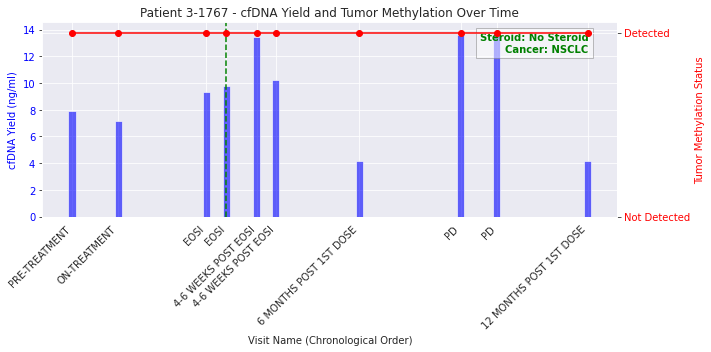

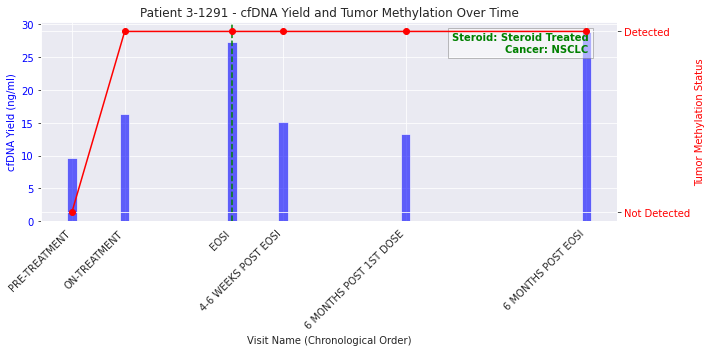

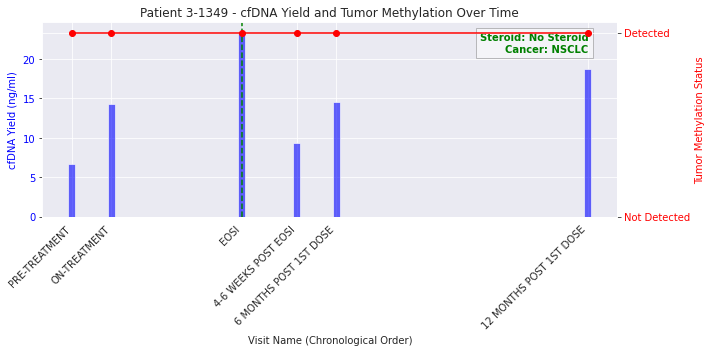

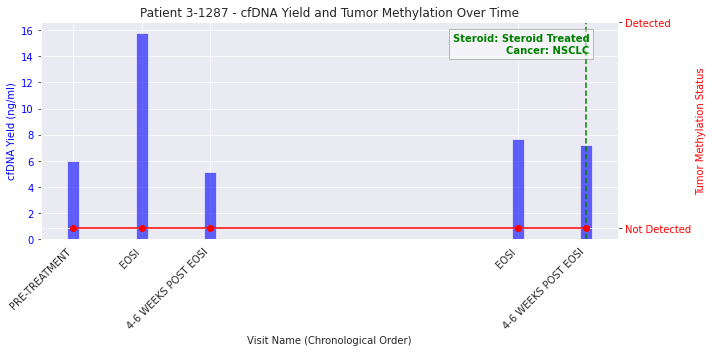

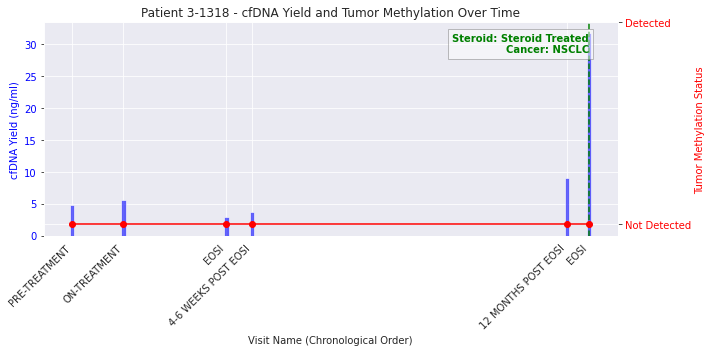

...

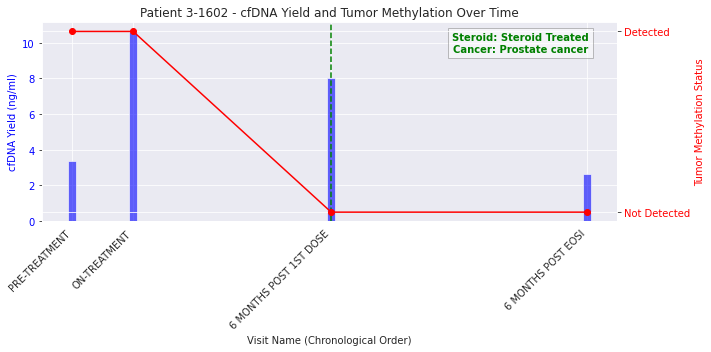

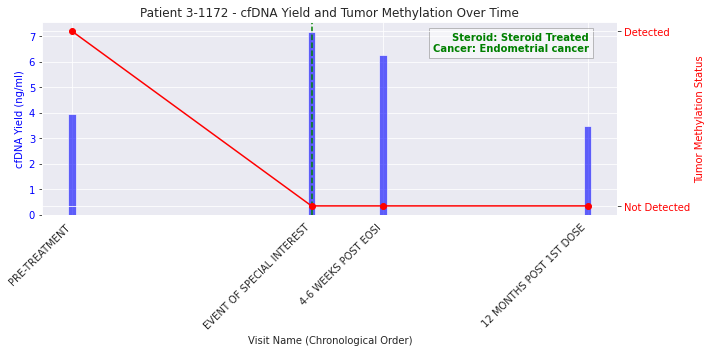

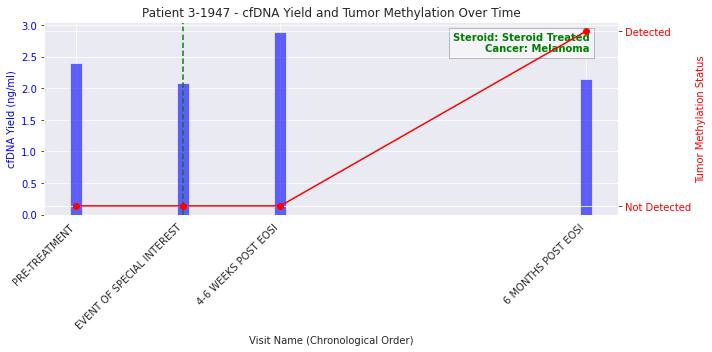

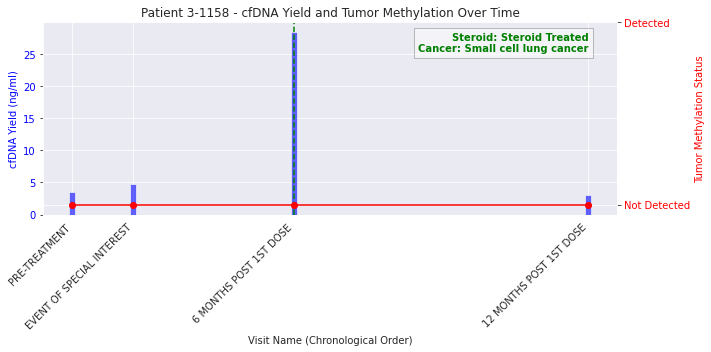

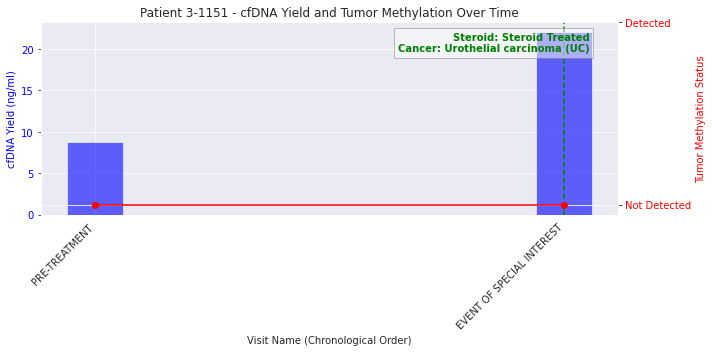

In [21]:
# Check Pneumonitis onset labeling

df_case_all_info = df_all_info[df_all_info['patient_type'] == 'Pneumonitis_Positive']

# Convert dates to datetime for sorting
df_case_all_info["Bloodcoll_date"] = pd.to_datetime(df_case_all_info["Bloodcoll_date"], errors='coerce')

# Calculate cfDNA yield/ml
df_case_all_info["cfDNA_yield_per_ml"] = df_case_all_info["cfDNA_ng"] / df_case_all_info["Plasma_ml_input"]

# Map Tumor_methylation_status to binary (for consistent y-axis labels)
df_case_all_info["tumor_methylation_binary"] = df_case_all_info["Tumor_methylation_status"].map(
    {"Detected": 1, "Not Detected": 0}
)

# Unique patients for iteration
unique_patients = df_case_all_info["Patient_ID Simplified"].unique()

# Generate plots for each patient
for patient in unique_patients:
    # Subset and sort patient data
    patient_df = df_case_all_info[
        df_case_all_info["Patient_ID Simplified"] == patient
    ].sort_values(by="Bloodcoll_date")
    
    # Determine steroid usage for the patient (assuming patient-level value is constant)
    steroid_usage = patient_df["Steroid.irAE"].iloc[0]
    steroid_label = "Steroid Treated" if steroid_usage in [True, "TRUE", "Yes"] else "No Steroid"
    
    # Get the cancer type for the patient (assuming it's constant per patient)
    cancer_type = patient_df["Cancertype"].iloc[0]
    
    # Aggregate data to avoid duplicate Visit_name issues
    aggregated_df = (
        patient_df.groupby(["Visit_name", "Bloodcoll_date"])
        .agg({"cfDNA_yield_per_ml": "mean", "tumor_methylation_binary": "max"})
        .reset_index()
        .sort_values(by="Bloodcoll_date")  # Ensure chronological order
    )

    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Bar plot for cfDNA yield/ml
    ax1.bar(
        aggregated_df["Bloodcoll_date"], 
        aggregated_df["cfDNA_yield_per_ml"],
        color="blue", alpha=0.6, width=5, 
        label="cfDNA Yield (ng/ml)"
    )
    ax1.set_xlabel("Visit Name (Chronological Order)")
    ax1.set_ylabel("cfDNA Yield (ng/ml)", color="blue")
    ax1.tick_params(axis="y", labelcolor="blue")

    # Line plot for Tumor Methylation Status
    ax2 = ax1.twinx()
    ax2.plot(
        aggregated_df["Bloodcoll_date"], 
        aggregated_df["tumor_methylation_binary"],
        marker="o", color="red", linestyle="-", 
        label="Tumor Methylation Status"
    )
    ax2.set_ylabel("Tumor Methylation Status", color="red")
    ax2.tick_params(axis="y", labelcolor="red")
    ax2.set_yticks([0, 1])
    ax2.set_yticklabels(["Not Detected", "Detected"])

    # Set x-axis labels as Visit_name
    ax1.set_xticks(aggregated_df["Bloodcoll_date"])
    ax1.set_xticklabels(aggregated_df["Visit_name"], rotation=45, ha="right")

    # Draw vertical dashed line at first pneumonitis positive sample date, if available
    first_positive = patient_df[patient_df["pneumonitis_EOSI"] == "Pneumonitis_positive_samples"]
    if not first_positive.empty:
        first_positive_date = first_positive["Bloodcoll_date"].min()
        ax1.axvline(
            x=first_positive_date, 
            color="green", linestyle="--",
            label="First Pneumonitis Positive Sample"
        )

    # Add steroid usage & cancer type annotation inside the plot (top right corner)
    annotation_text = f"Steroid: {steroid_label}\nCancer: {cancer_type}"
    ax1.text(
        0.95, 0.95,
        annotation_text,
        transform=ax1.transAxes,
        horizontalalignment="right",
        verticalalignment="top",
        color="green",        # Entire text in green
        fontweight="bold",    # Make text bold
        bbox=dict(facecolor="white", alpha=0.5, edgecolor="gray")
    )

    # Title with patient ID
    plt.title(f"Patient {patient} - cfDNA Yield and Tumor Methylation Over Time")
    fig.tight_layout()
    
    # Uncomment if you want to combine legends:
    # handles1, labels1 = ax1.get_legend_handles_labels()
    # handles2, labels2 = ax2.get_legend_handles_labels()
    # ax1.legend(handles1 + handles2, labels1 + labels2, loc="upper left")

    plt.show()


In [ ]:
# Check Pneumonitis onset labeling

df_case_all_info = df_all_info[df_all_info['patient_type'] == 'Pneumonitis_Positive']

# Convert dates to datetime for sorting
df_case_all_info["Bloodcoll_date"] = pd.to_datetime(df_case_all_info["Bloodcoll_date"], errors='coerce')

# Calculate cfDNA yield/ml
df_case_all_info["cfDNA_yield_per_ml"] = df_case_all_info["cfDNA_ng"] / df_case_all_info["Plasma_ml_input"]

# Map Tumor_methylation_status to binary (for consistent y-axis labels)
df_case_all_info["tumor_methylation_binary"] = df_case_all_info["Tumor_methylation_status"].map(
    {"Detected": 1, "Not Detected": 0}
)

# Unique patients for iteration
unique_patients = df_case_all_info["Patient_ID Simplified"].unique()

# Generate plots for each patient
for patient in unique_patients:
    patient_df = df_case_all_info[df_case_all_info["Patient_ID Simplified"] == patient].sort_values(by="Bloodcoll_date")

    # Aggregate data to avoid duplicate Visit_name issues
    aggregated_df = (
        patient_df.groupby(["Visit_name", "Bloodcoll_date"])
        .agg({"cfDNA_yield_per_ml": "mean", "tumor_methylation_binary": "max"})
        .reset_index()
        .sort_values(by="Bloodcoll_date")  # Ensure chronological order
    )

    fig, ax1 = plt.subplots(figsize=(10, 5))

    # Bar plot for cfDNA yield/ml
    ax1.bar(aggregated_df["Bloodcoll_date"], aggregated_df["cfDNA_yield_per_ml"],
            color="blue", alpha=0.6, width=5, label="cfDNA Yield (ng/ml)")
    ax1.set_xlabel("Visit Name (Chronological Order)")
    ax1.set_ylabel("cfDNA Yield (ng/ml)", color="blue")
    ax1.tick_params(axis="y", labelcolor="blue")

    # Line plot for Tumor Methylation Status
    ax2 = ax1.twinx()
    ax2.plot(aggregated_df["Bloodcoll_date"], aggregated_df["tumor_methylation_binary"],
             marker="o", color="red", linestyle="-", label="Tumor Methylation Status")
    ax2.set_ylabel("Tumor Methylation Status", color="red")
    ax2.tick_params(axis="y", labelcolor="red")
    ax2.set_yticks([0, 1])
    ax2.set_yticklabels(["Not Detected", "Detected"])

    # Set x-axis labels as Visit_name
    ax1.set_xticks(aggregated_df["Bloodcoll_date"])
    ax1.set_xticklabels(aggregated_df["Visit_name"], rotation=45, ha="right")

    # Find the first Pneumonitis positive sample timepoint for this patient
    first_positive = patient_df[patient_df["pneumonitis_EOSI"] == "Pneumonitis_positive_samples"]
    if not first_positive.empty:
        first_positive_date = first_positive["Bloodcoll_date"].min()
        # Draw a vertical dashed line at the first positive sample date
        ax1.axvline(x=first_positive_date, color="green", linestyle="--",
                    label="First Pneumonitis positive sample")

    # Title and layout adjustments
    plt.title(f"Patient {patient} - cfDNA Yield and Tumor Methylation Status Over Time")
    fig.tight_layout()
    
    # Show plot
    plt.show()


In [ ]:
# import matplotlib.pyplot as plt
# from matplotlib.backends.backend_pdf import PdfPages

# # Create a PDF file to save the plots
# with PdfPages("pneumonitis_plots.pdf") as pdf:
#     # Unique patients for iteration
#     unique_patients = df_case_all_info["Patient_ID"].unique()

#     # Generate plots for each patient
#     for patient in unique_patients:
#         patient_df = df_case_all_info[df_case_all_info["Patient_ID"] == patient].sort_values(by="Bloodcoll_date")

#         # Aggregate data to avoid duplicate Visit_name issues
#         aggregated_df = (
#             patient_df.groupby(["Visit_name", "Bloodcoll_date"])
#             .agg({"cfDNA_yield_per_ml": "mean", "tumor_methylation_binary": "max"})
#             .reset_index()
#             .sort_values(by="Bloodcoll_date")  # Ensure chronological order
#         )

#         fig, ax1 = plt.subplots(figsize=(10, 5))

#         # Bar plot for cfDNA yield/ml
#         ax1.bar(aggregated_df["Bloodcoll_date"], aggregated_df["cfDNA_yield_per_ml"],
#                 color="blue", alpha=0.6, width=5, label="cfDNA Yield (ng/ml)")
#         ax1.set_xlabel("Visit Name (Chronological Order)")
#         ax1.set_ylabel("cfDNA Yield (ng/ml)", color="blue")
#         ax1.tick_params(axis="y", labelcolor="blue")

#         # Line plot for Tumor Methylation Status
#         ax2 = ax1.twinx()
#         ax2.plot(aggregated_df["Bloodcoll_date"], aggregated_df["tumor_methylation_binary"],
#                  marker="o", color="red", linestyle="-", label="Tumor Methylation Status")
#         ax2.set_ylabel("Tumor Methylation Status", color="red")
#         ax2.tick_params(axis="y", labelcolor="red")
#         ax2.set_yticks([0, 1])
#         ax2.set_yticklabels(["Not Detected", "Detected"])

#         # Set x-axis labels as Visit_name
#         ax1.set_xticks(aggregated_df["Bloodcoll_date"])
#         ax1.set_xticklabels(aggregated_df["Visit_name"], rotation=45, ha="right")

#         # Find the first Pneumonitis positive sample timepoint for this patient
#         first_positive = patient_df[patient_df["pneumonitis_EOSI"] == "Pneumonitis_positive_samples"]
#         if not first_positive.empty:
#             first_positive_date = first_positive["Bloodcoll_date"].min()
#             # Draw a vertical dashed line at the first positive sample date
#             ax1.axvline(x=first_positive_date, color="green", linestyle="--",
#                         label="First Pneumonitis positive sample")

#         # Title and layout adjustments
#         plt.title(f"Patient {patient} - cfDNA Yield and Tumor Methylation Status Over Time")
#         fig.tight_layout()
        
#         # Save the current figure to the PDF file
#         pdf.savefig(fig)
#         plt.close(fig)


In [18]:
# Found one outlier in patient 3-1602
df_all_info = df_all_info.query('cfDNA_ng != 0.15132')
df_all_info.cfDNA_ng.min()

1.7472

In [19]:
import scipy.stats

def analyze_and_plot_correlation(df, x_col, y_col, hue_col):
    """
    Analyze and plot the correlation between two columns for each unique region.

    Parameters:
    - df: DataFrame containing the data.
    - x_col: The name of the column to be used as the x-axis.
    - y_col: The name of the column to be used as the y-axis.
    - hue_col: The name of the column to be used as hue.
    """

    df_filtered = df.copy()

    # Calculate Pearson and Spearman correlations
    pearson_corr, pearson_p_val = scipy.stats.pearsonr(df_filtered[x_col], df_filtered[y_col])
    spearman_corr, spearman_p_val = scipy.stats.spearmanr(df_filtered[x_col], df_filtered[y_col])

    # Print the correlation results
    # print(f"Region: {region}")
    print(f"Pearson correlation: {pearson_corr:.3f}, p-value: {pearson_p_val:.3g}")
    print(f"Spearman correlation: {spearman_corr:.3f}, p-value: {spearman_p_val:.3g}\n")

    # Plotting
    plt.figure(figsize=(8, 6))
    sns.set_style('darkgrid')
    sns.scatterplot(x=x_col, y=y_col, hue = hue_col, data=df_filtered)
    sns.regplot(x=x_col, y=y_col, data=df_filtered, scatter=False, color="gray", line_kws={"linestyle": "--"})

    # Move legend to the bottom right
    plt.legend(title=hue_col, loc='lower right', bbox_to_anchor=(1, 0))


    # plt.title(f"Scatter Plot for Region: {region}")
    plt.xlabel(x_col)
    plt.ylabel(y_col)
    plt.grid(True)

    # Add text annotation for Pearson and Spearman correlation
    plt.text(0.05, 0.95, f'Pearson: r={pearson_corr:.2f}, p={pearson_p_val:.1e}\nSpearman: ρ={spearman_corr:.2f}, p={spearman_p_val:.1e}',
                ha='left', va='top', transform=plt.gca().transAxes, fontsize=12,
                bbox=dict(boxstyle="round,pad=0.3", edgecolor='gray', facecolor='white', alpha=0.7))

    plt.tight_layout()
    plt.show()


Pearson correlation: 0.132, p-value: 0.0195
Spearman correlation: 0.053, p-value: 0.35



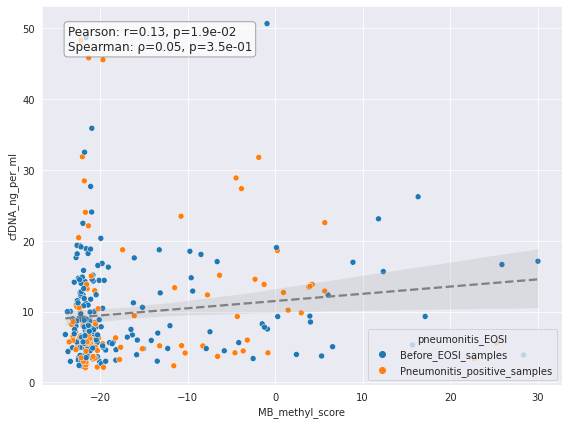

In [21]:
# Check the correlation between binary methylation caller (MB methyl score) and cfDNA
# df_all_info_no_outlier = df_all_info.query('cfDNA_ng != 0.15132')

analyze_and_plot_correlation(
    df=df_all_info,
    x_col='MB_methyl_score',
    y_col='cfDNA_ng_per_ml',
    hue_col='pneumonitis_EOSI'
)

In [22]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_with_annotation(df, col, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))  # Match the original figure size
    sns.set_style('darkgrid')

    # Order based on the 'sample_type_umap' categories
    hue_order = df[col].unique().tolist()

    # Define your hue order and use it only when needed. Otherwise commment it out and change back to "palette="Set2""" from "palette=color_map" in the sns.boxplot!!!!!
    # Only use the order for treatment sample plot, use Set2 default for baseline sample plot
    # hue_order = ['Provided Cancer type: breast', 'High_CSO_lung_Samples']
    # hue_order = ['High_peak_count_cluster', 'Low_peak_count_cluster']
    # default_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    # color_map = {cat: col for cat, col in zip(hue_order, default_colors)}

    # Create boxplot and stripplot without using csv_file_name
    sns.boxplot(data=df, x=col, y="cfDNA_ng", showfliers=False, ax=ax, dodge=True, palette="Set2")
    # sns.stripplot(data=df, x="sample_type_umap", y="cfDNA_ng", hue = "treatment", ax=ax, dodge=True, jitter=0.2, size=6)
    sns.stripplot(data=df, x=col, y="cfDNA_ng", ax=ax, dodge=True, jitter=0.2, size=6)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes with offset
    # Offset for sample size annotation, adjust as needed
    offset = df['cfDNA_ng'].min() * 0.1  # Adjust the value as needed
    for plot_type, cancer_group in df.groupby(col):
        n = cancer_group.shape[0]
        type_pos = hue_order.index(plot_type)
        center = ax.get_xticks()[type_pos]  # Center position of each category
        ax.text(center, cancer_group['cfDNA_ng'].min() * 0.9, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')


    # Setting up the Annotator with the appropriate pairs
    if len(hue_order) > 1:
        pairs = [(hue_order[i], hue_order[j]) for i in range(len(hue_order)) for j in range(i + 1, len(hue_order))]
        annotator = Annotator(ax, pairs, data=df, x=col, y="cfDNA_ng")
        annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2, fontsize=20)
        annotator.apply_and_annotate()

    # # Adjusting the legend to match original settings
    # handles, labels = ax.get_legend_handles_labels()
    # ax.legend(handles[:len(hue_order)], labels[:len(hue_order)], title='CSO Lung Sample', loc='upper right', bbox_to_anchor=(1.05, 1))

    # Set plot labels and title to match the original
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample Types', fontsize=25)
    ax.set_ylabel('cfDNA (ng/ml)', fontsize=25)
    ax.legend(fontsize=25)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=20)


    plt.show()



In [23]:
df_all_info.pneumonitis_EOSI_onset_timepoint.value_counts()


Prior-onset-timepoint    206
Post-onset-timepoint      71
Onset-timepoint           34
Name: pneumonitis_EOSI_onset_timepoint, dtype: int64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Before_EOSI_samples vs. Pneumonitis_positive_samples: t-test independent samples, P_val:7.782e-01 t=-2.819e-01


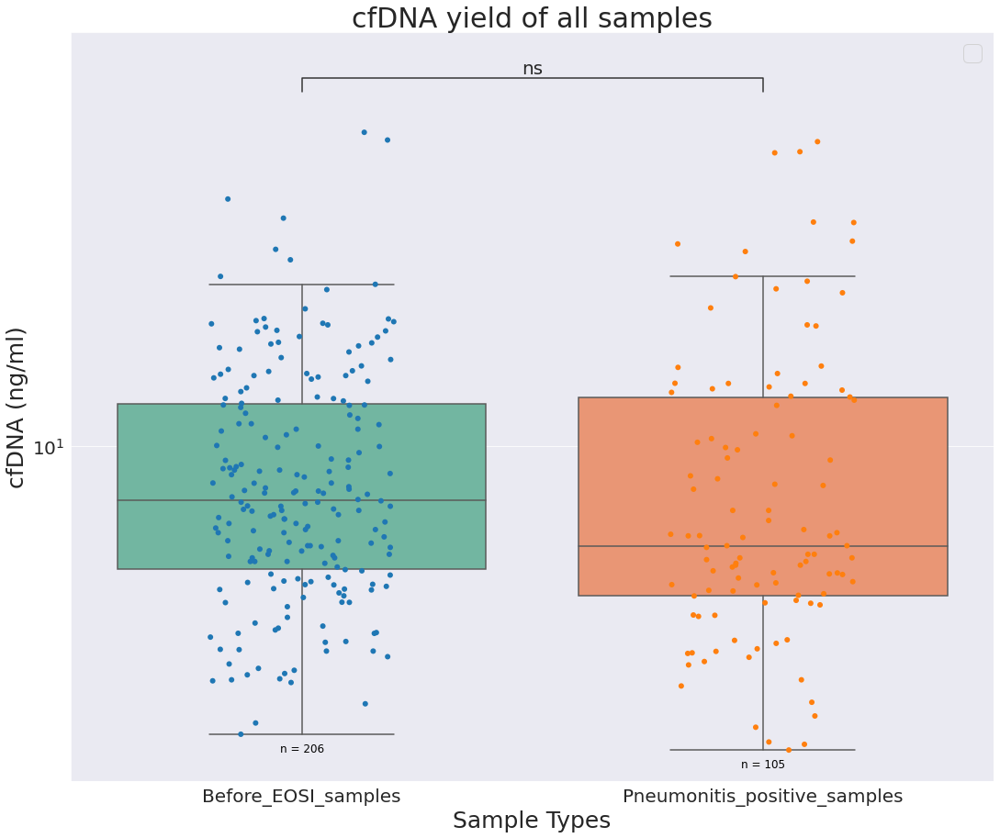

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Before_EOSI_samples vs. Pneumonitis_positive_samples: t-test independent samples, P_val:9.707e-01 t=-3.677e-02


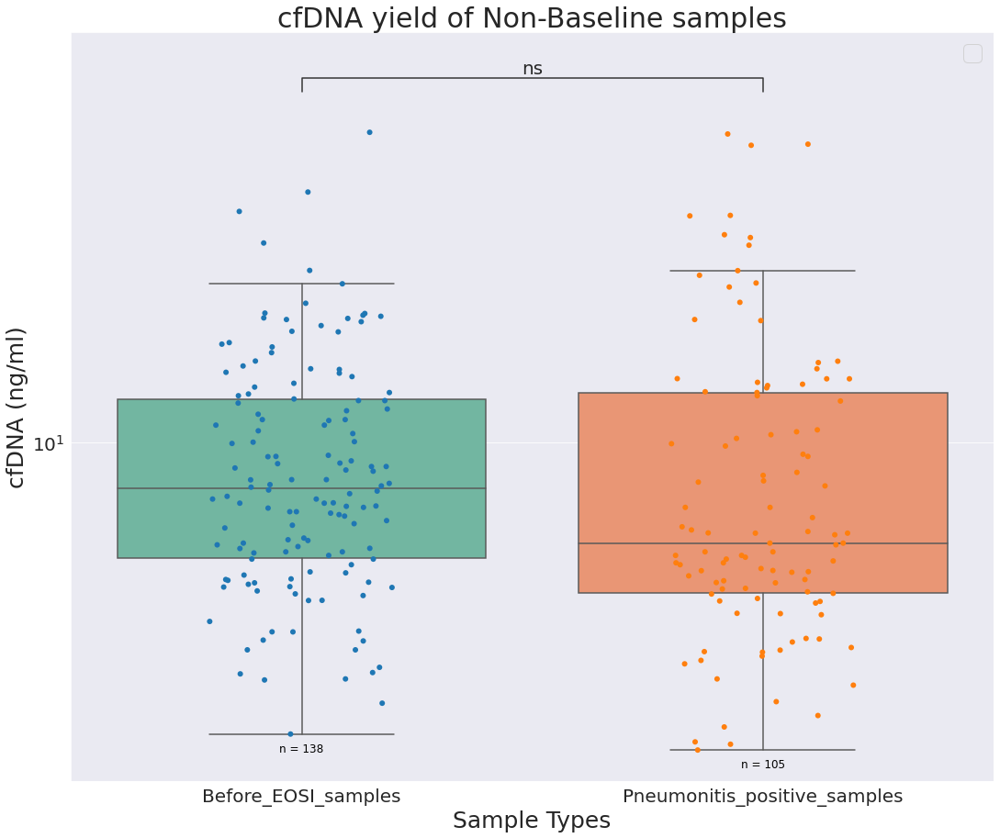

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Before_EOSI_samples vs. Pneumonitis_positive_samples: t-test independent samples, P_val:6.092e-01 t=5.124e-01


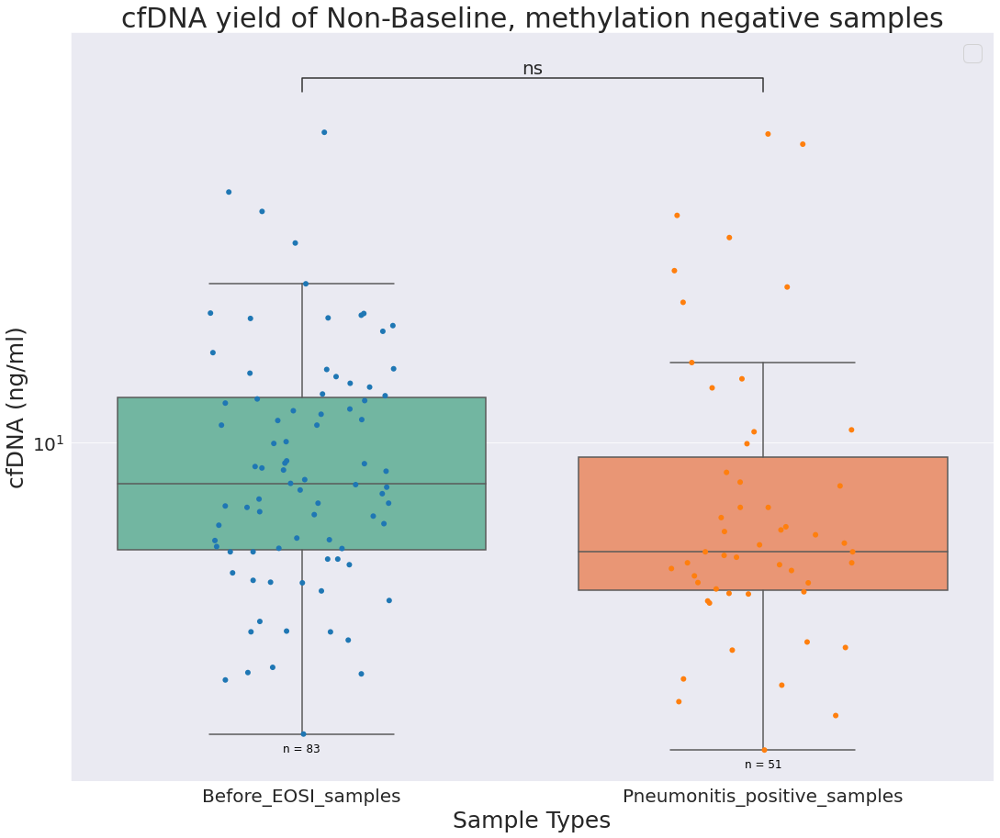

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Prior-onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:2.509e-01 t=1.151e+00
Post-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:4.091e-02 t=-2.070e+00
Prior-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:6.528e-02 t=-1.855e+00


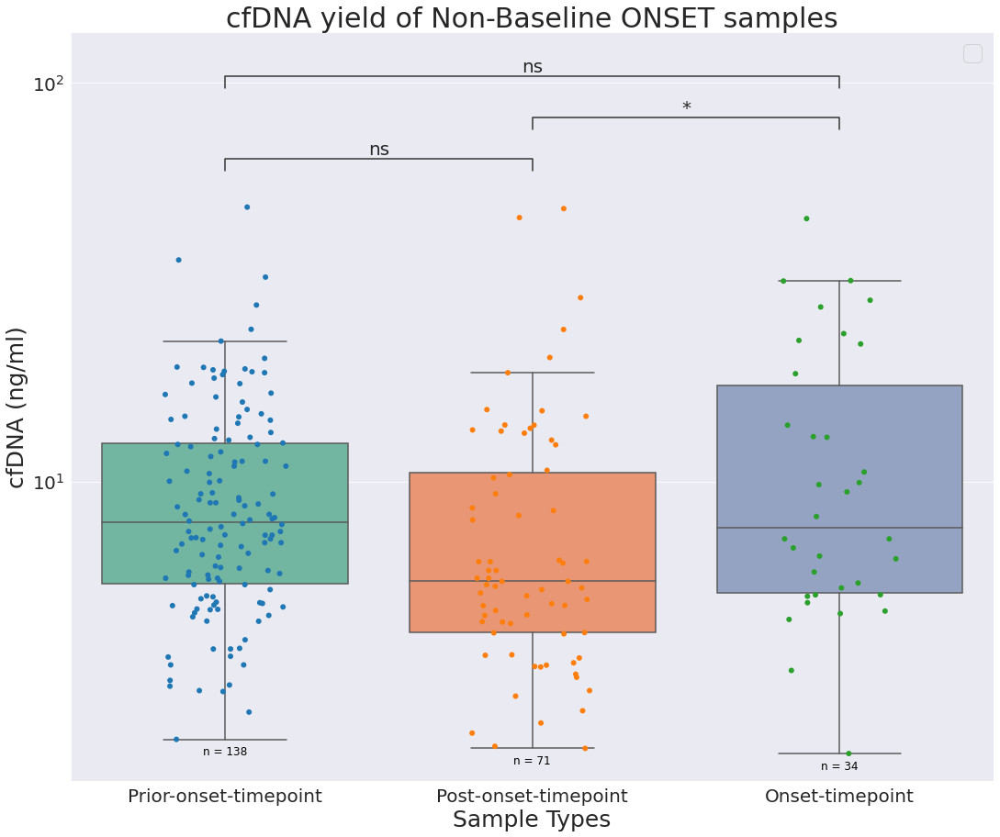

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Prior-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:8.739e-01 t=1.591e-01
Onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:7.986e-01 t=2.566e-01
Prior-onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:5.573e-01 t=5.886e-01


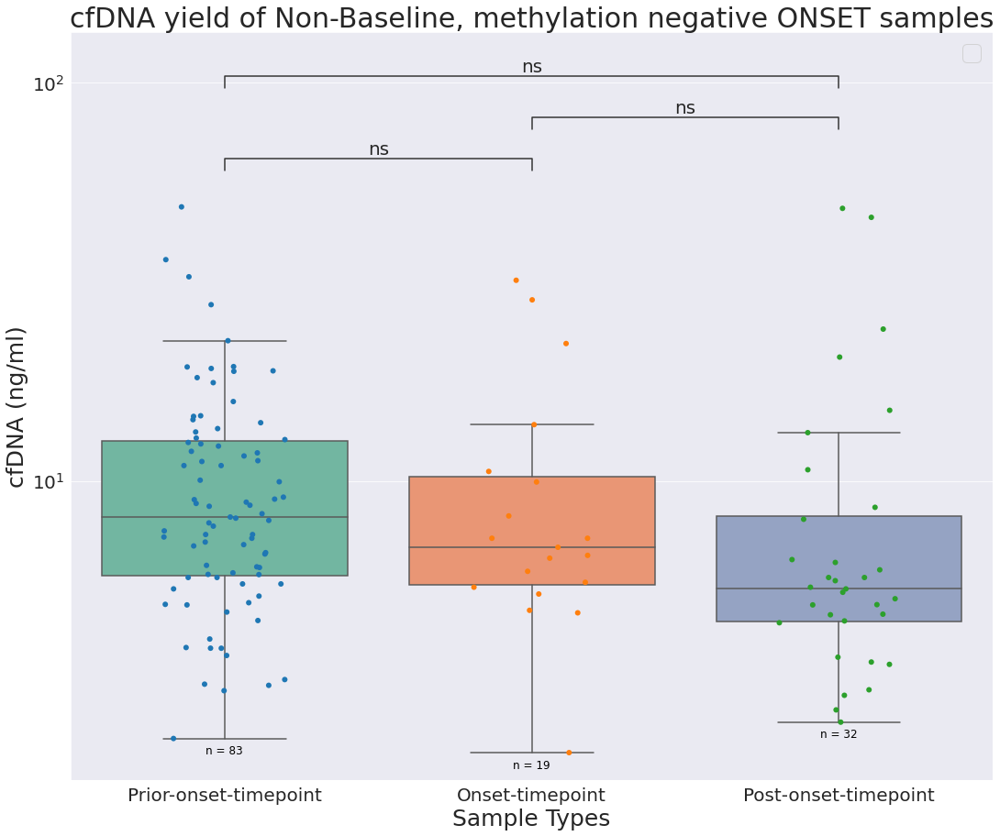

In [24]:
# Suspicious samples
# df_all_info_no_outlier = df_all_info.query('cfDNA_ng != 0.15132')

# cfDNA comparison
cfDNA_boxplot_with_annotation(df_all_info, 'pneumonitis_EOSI', 'cfDNA yield of all samples')

# Non-baseline samples
df_all_non_baseline = df_all_info.query('Visit_name != "PRE-TREATMENT"')
df_all_non_baseline_neg = df_all_non_baseline.query('Tumor_methylation_status == "Not Detected"')

cfDNA_boxplot_with_annotation(df_all_non_baseline, 'pneumonitis_EOSI', 'cfDNA yield of Non-Baseline samples')
cfDNA_boxplot_with_annotation(df_all_non_baseline_neg, 'pneumonitis_EOSI', 'cfDNA yield of Non-Baseline, methylation negative samples')

# Non-baseline samples onset samples only
# df_all_non_baseline_onset = df_all_non_baseline.query('pneumonitis_EOSI_onset_timepoint != "Post-onset-timepoint"')
# df_all_non_baseline_neg_onset = df_all_non_baseline_neg.query('pneumonitis_EOSI_onset_timepoint != "Post-onset-timepoint"')

cfDNA_boxplot_with_annotation(df_all_non_baseline, 'pneumonitis_EOSI_onset_timepoint', 'cfDNA yield of Non-Baseline ONSET samples')
cfDNA_boxplot_with_annotation(df_all_non_baseline_neg, 'pneumonitis_EOSI_onset_timepoint', 'cfDNA yield of Non-Baseline, methylation negative ONSET samples')


In [25]:
df_all_non_baseline_neg_test = df_all_non_baseline_neg.query('Patient_ID == "PICI0009.PICI0009-3-1318"')
df_all_non_baseline_neg_test

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,runid,fc_dir,pneumonitis_EOSI,pneumonitis_EOSI_onset_timepoint,Steroid.irAE,Tumor_methylation_status,Tumor_methylation_score,MB_methyl_score,cfDNA_ng_per_ml
14,PICI0009,10832008EP01,A0675998,B00319602,PICI0009.PICI0009-3-1318,3-1318,4-6 WEEKS POST EOSI,1,SUCCESS,Low Diversity Warning,3.6452,1.0,0,2/22/23,3/2/20,10/9/23,NSCLC,Pneumonitis_Positive,230915_A01902_0209_BHF2WWDSX7,/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827,Before_EOSI_samples,Prior-onset-timepoint,1.0,Not Detected,0.0,-21.955910,3.6452
45,PICI0009,10925346EP01,A0675052,B00324214,PICI0009.PICI0009-3-1318,3-1318,EOSI,1,SUCCESS,NaN,31.8500,1.0,0,2/22/23,3/4/21,10/9/23,NSCLC,Pneumonitis_Positive,230404_A01835_0038_BHVJYHDSX5,/ghsfa/projects/omni_v2/flowcells/230404_A01835_0038_BHVJYHDSX5_PS3R225_AP2.Sirius-1.1.0-RLS_20230825-115722,Pneumonitis_positive_samples,Onset-timepoint,1.0,Not Detected,0.0,-22.057319,31.8500
63,PICI0009,10925345EP01,A0675125,B00439188,PICI0009.PICI0009-3-1318,3-1318,12 MONTHS POST EOSI,1,SUCCESS,NaN,9.1000,1.0,0,2/22/23,2/8/21,10/9/23,NSCLC,Pneumonitis_Positive,230720_A01810_0166_AH7G7JDSX7,/ghsfa/projects/omni_v2/flowcells/230720_A01810_0166_AH7G7JDSX7_PS3R397_AP1.Sirius-1.1.0-RLS_20230825-120116,Before_EOSI_samples,Prior-onset-timepoint,1.0,Not Detected,0.0,-22.408574,9.1000
101,PICI0009,BK12099EP01,A0675473,B00469020,PICI0009.PICI0009-3-1318,3-1318,ON-TREATMENT,1,SUCCESS,Low Diversity Warning,5.5120,1.0,0,2/22/23,10/14/19,10/9/23,NSCLC,Pneumonitis_Positive,230819_A01907_0126_BH7GGNDSX7,/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827,Before_EOSI_samples,Prior-onset-timepoint,1.0,Not Detected,0.0,-21.697996,5.5120
128,PICI0009,BK13838EP01,A0675546,B00488539,PICI0009.PICI0009-3-1318,3-1318,EOSI,1,SUCCESS,Low Diversity Warning,2.9744,1.0,0,2/22/23,2/3/20,10/9/23,NSCLC,Pneumonitis_Positive,230914_A02048_0027_BHCYKCDSX7,/ghsfa/projects/bioinformatics/starfish/flowcentral/230816_A01835_0108_BH7CNKDSX7.706b13b9-3e67-4b08-9d4b-388aa2ce03f9.20230818145827,Before_EOSI_samples,Prior-onset-timepoint,1.0,Not Detected,0.0,-23.429559,2.9744


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Prior-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:6.372e-01 t=4.740e-01
Onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:9.874e-01 t=-1.595e-02
Prior-onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:6.535e-01 t=4.510e-01


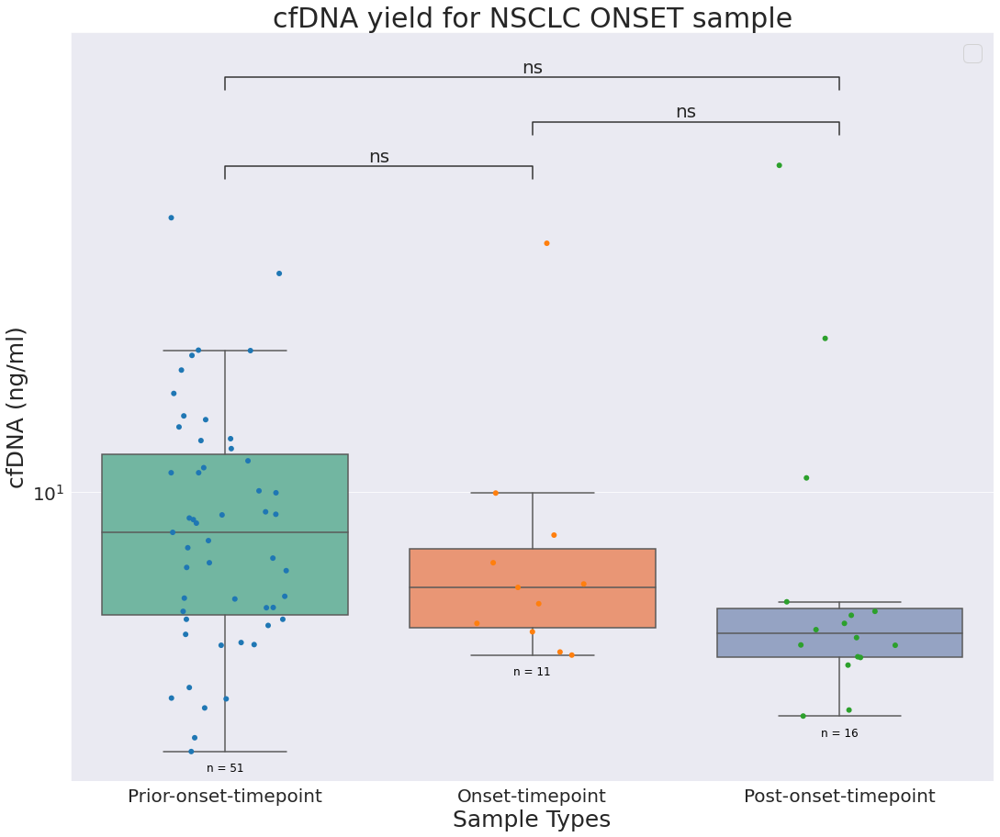

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Post-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:nan t=nan


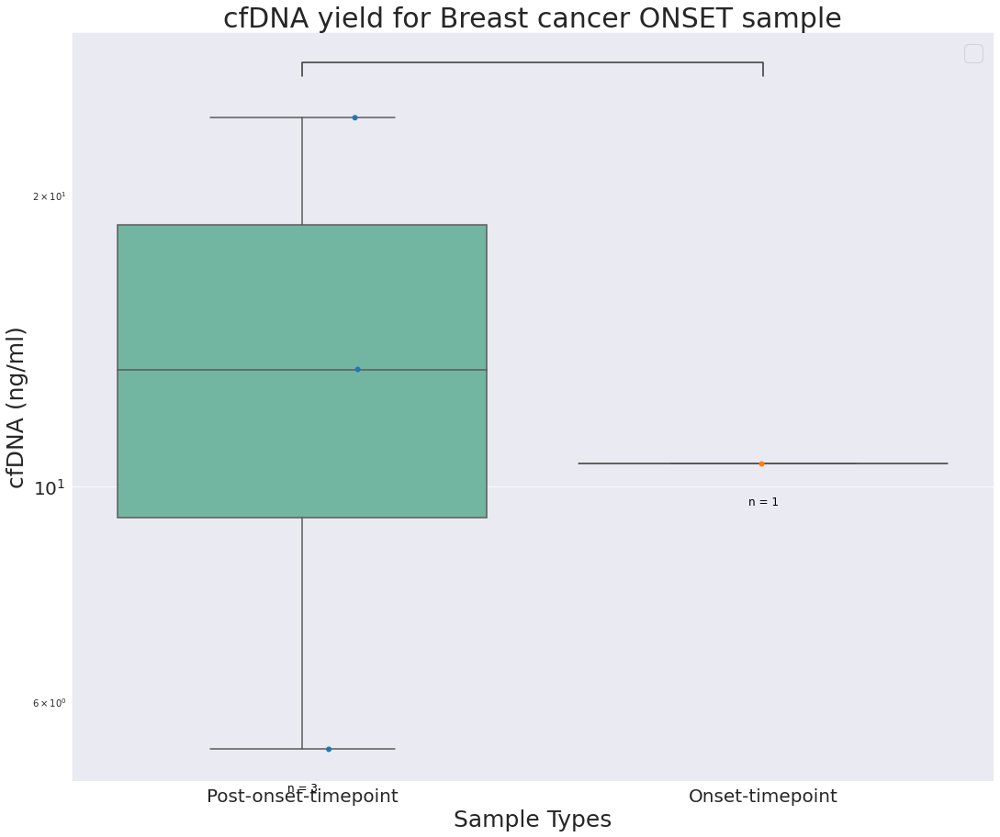

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Prior-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:6.590e-01 t=-4.548e-01
Onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:3.274e-01 t=1.285e+00
Prior-onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:3.649e-01 t=9.492e-01


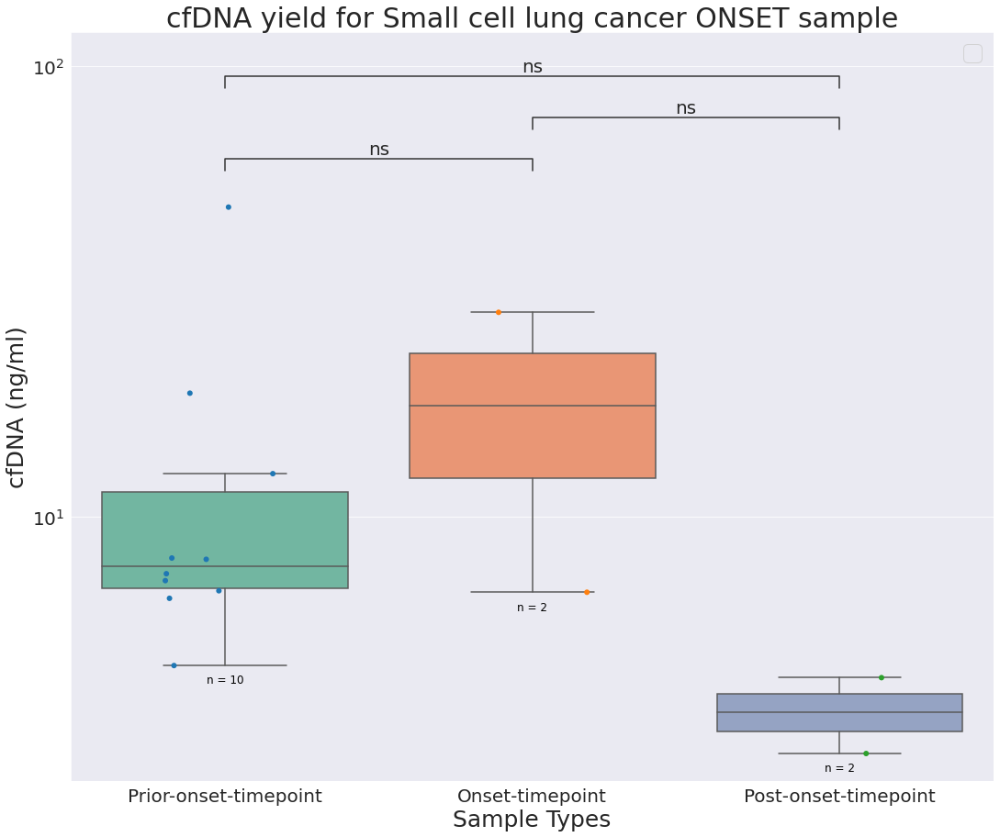

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Prior-onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:2.599e-01 t=1.160e+00
Post-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:9.318e-01 t=-8.871e-02
Prior-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:4.659e-01 t=7.460e-01


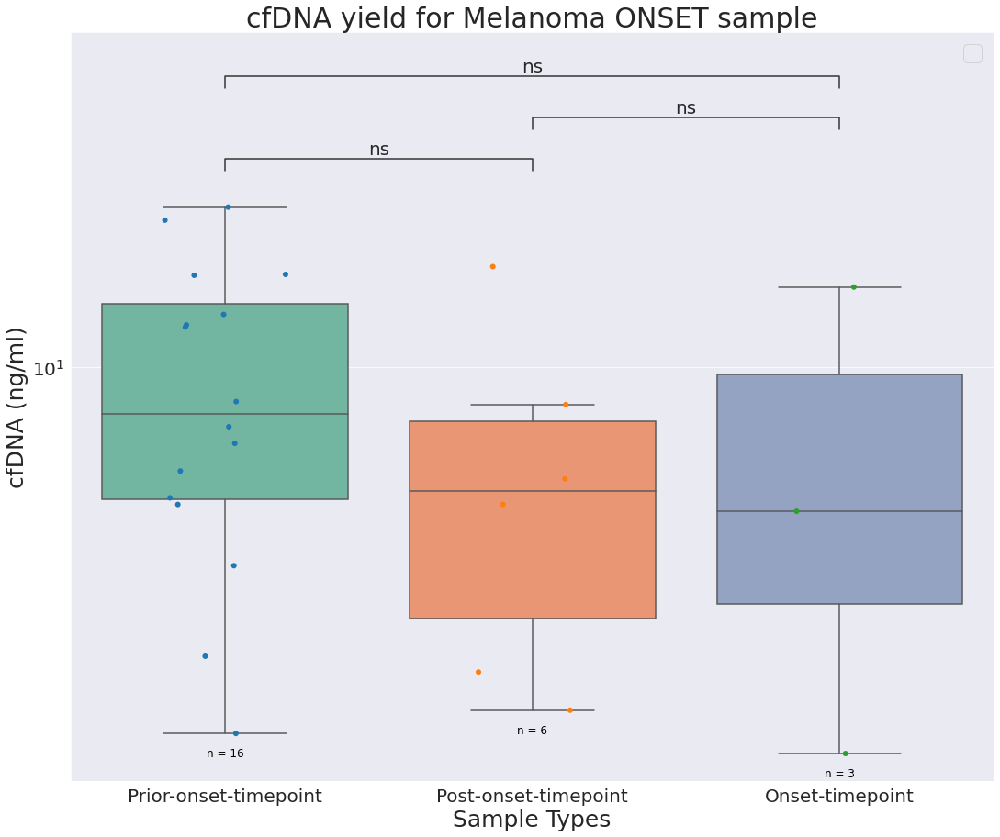

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


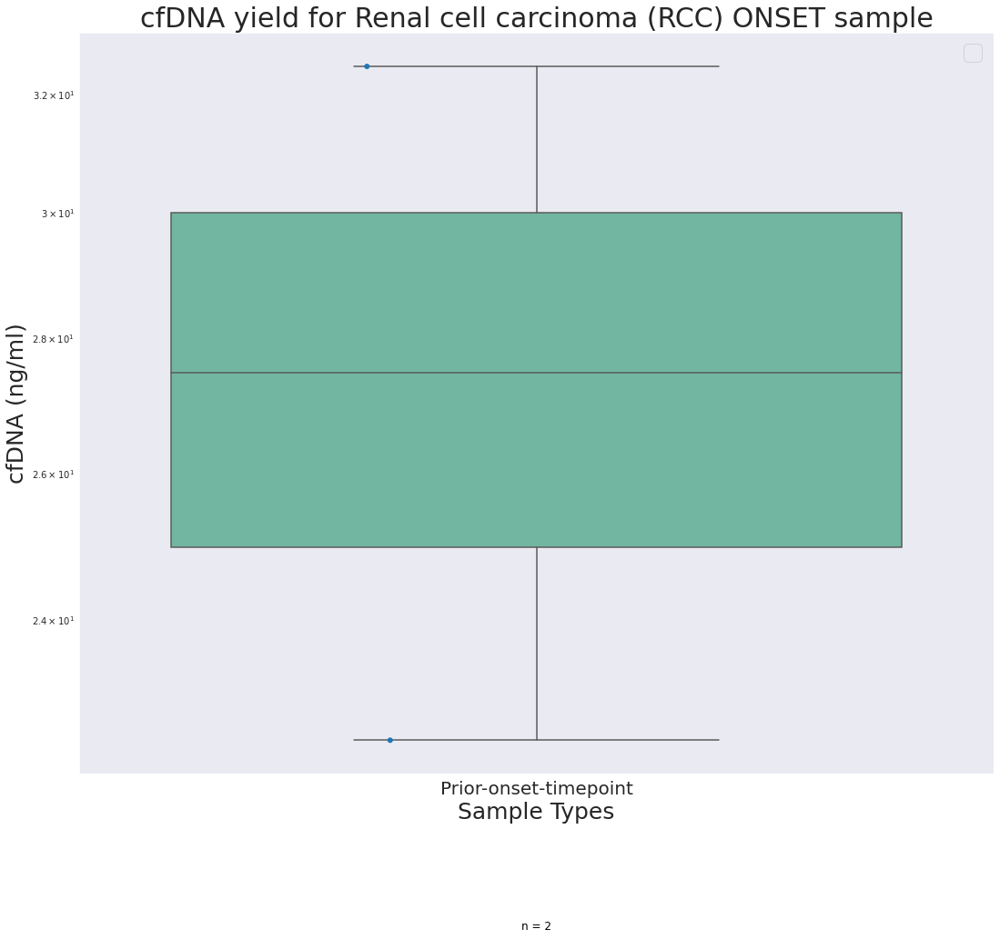

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Prior-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:nan t=nan
Onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:nan t=nan
Prior-onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:nan t=nan


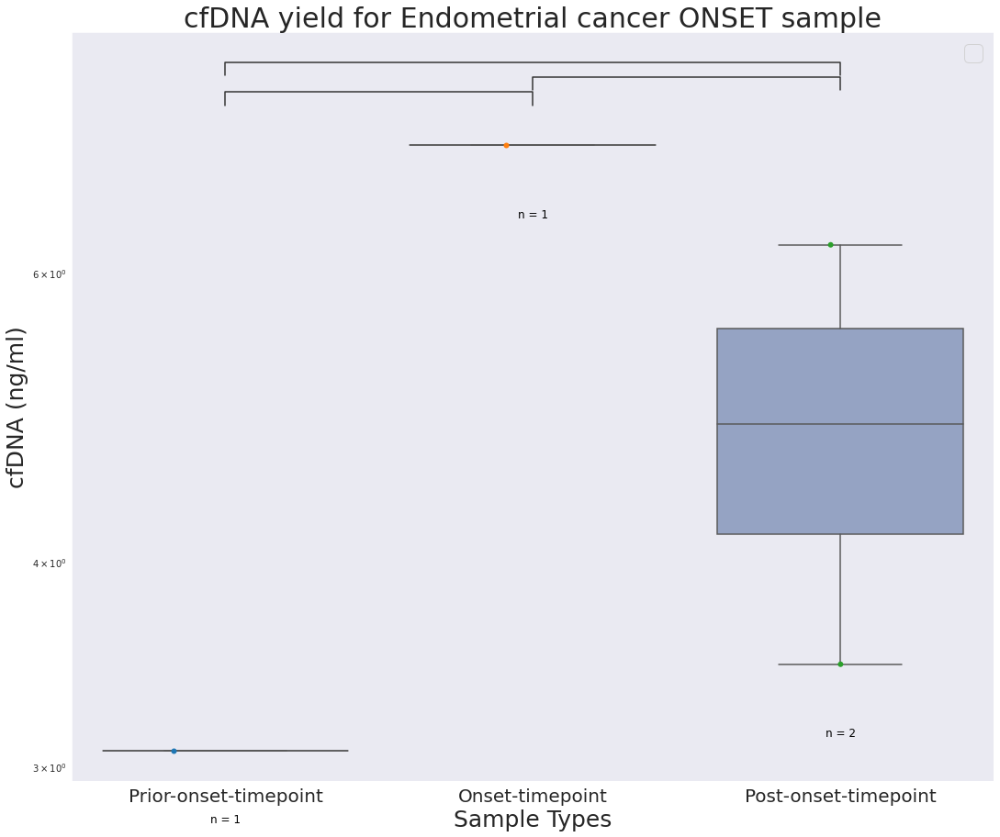

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


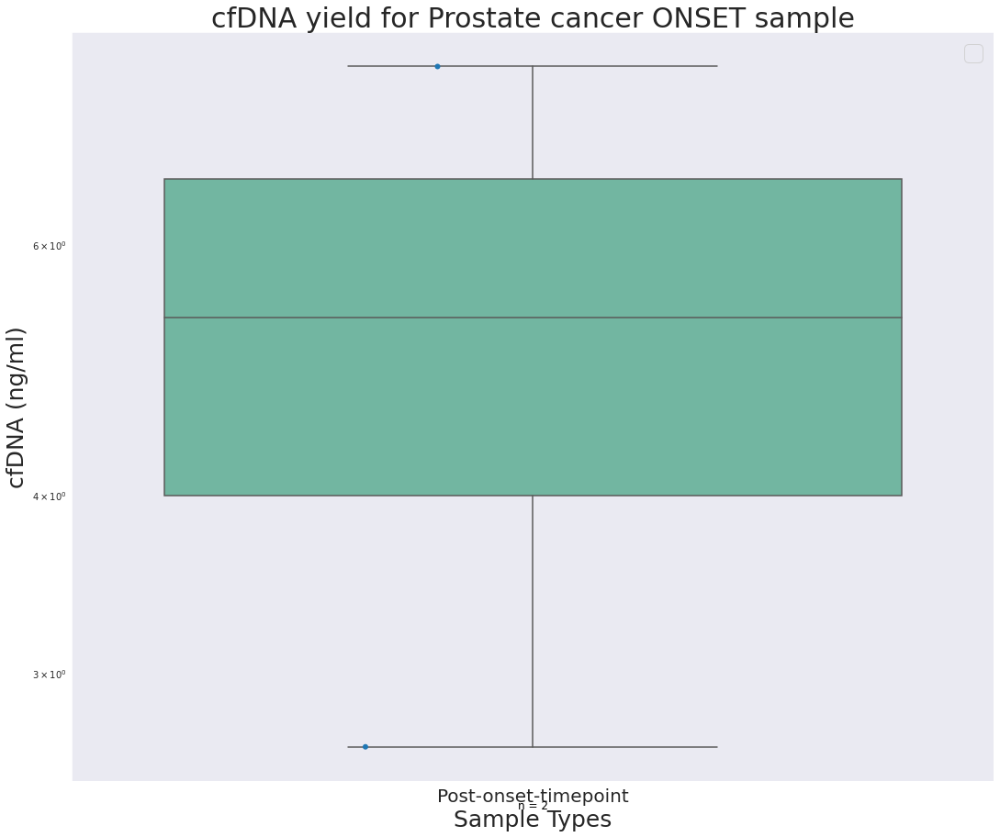

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Prior-onset-timepoint vs. Onset-timepoint: t-test independent samples, P_val:nan t=nan
Onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:nan t=nan
Prior-onset-timepoint vs. Post-onset-timepoint: t-test independent samples, P_val:nan t=nan


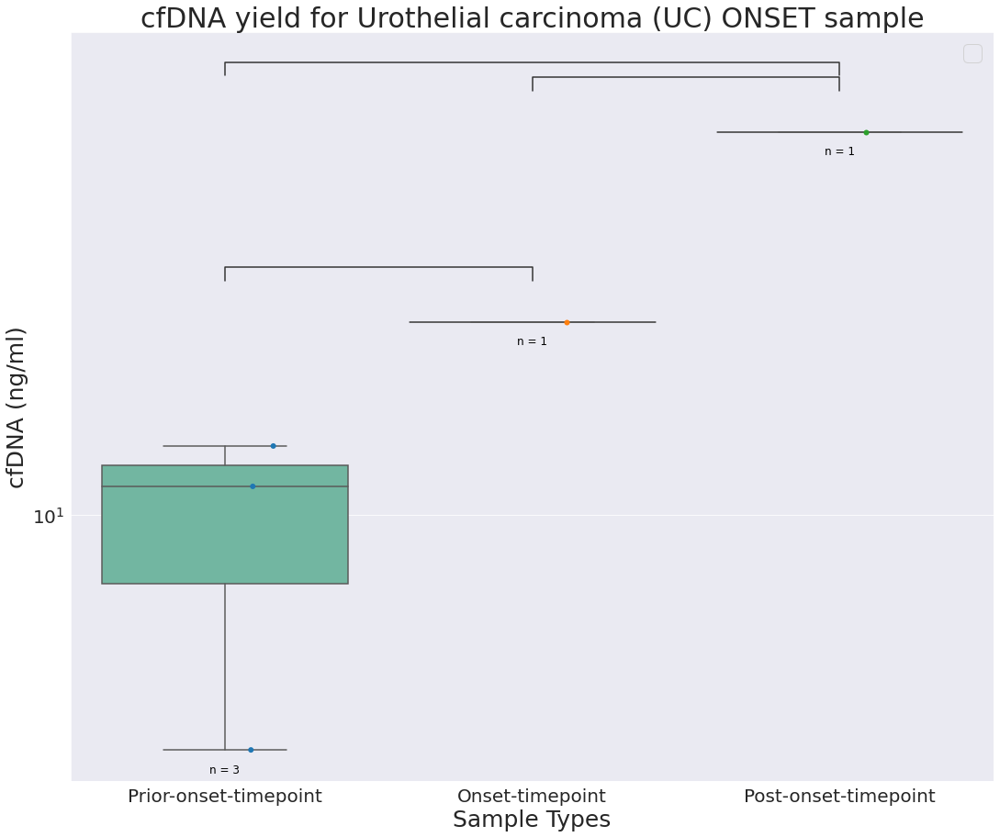

In [26]:
# Loop over each unique cancer type in the dataframe
for cancer in df_all_non_baseline_neg['Cancertype'].unique():
    # Filter the dataframe for the current cancer type
    df_subset = df_all_non_baseline_neg[df_all_non_baseline_neg['Cancertype'] == cancer]
    
    # Create a title suffix that includes the cancer type
    title_suffix = f"cfDNA yield for {cancer} ONSET sample"
    
    # Call your original plotting function with the filtered data
    # Replace 'sample_type_umap' with the appropriate column for the x-axis if needed
    cfDNA_boxplot_with_annotation(df_subset, 'pneumonitis_EOSI_onset_timepoint', title_suffix)


In [60]:
# Readin methylaiton data
df_consolidated_PICI_DMR_19 = pd.read_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_02242025.csv")
df_consolidated_PICI_DMR_lung_tissue_cancer = pd.read_csv(f"{work_dir}/df_consolidated_PICI_DMR_lung_tissue_cancer_02242025.csv")

In [27]:
# Merge the information back for heatmap plot

# For the 19 Lung tissue specific DMRs
df_all_samples_renamed = df_all_4.rename(columns={"GHSampleID": "run_sample_id"})
sample_list = df_all_samples_renamed.run_sample_id.tolist()
df_consolidated_PICI_all_DMR_19 = df_consolidated_PICI_DMR_19[df_consolidated_PICI_DMR_19['run_sample_id'].isin(sample_list)]
df_consolidated_PICI_all_DMR_19 = df_consolidated_PICI_all_DMR_19.merge(df_all_samples_renamed[['run_sample_id', 'pneumonitis_EOSI']], on = 'run_sample_id', how = 'left')
df_consolidated_PICI_all_DMR_19.head()

# Save the data
# df_consolidated_PICI_case_DMR_19.to_csv(f"{work_dir}/df_consolidated_PICI_case_DMR_19_02062025.csv", index = False)
df_consolidated_PICI_all_DMR_19.to_csv(f"{work_dir}/df_consolidated_PICI_all_DMR_19_02242025.csv", index = False)

# For the 15 Lung cancer tissue specific DMRs
df_consolidated_PICI_all_DMR_lung_tissue_cancer = df_consolidated_PICI_DMR_lung_tissue_cancer[df_consolidated_PICI_DMR_lung_tissue_cancer['run_sample_id'].isin(sample_list)]
df_consolidated_PICI_all_DMR_lung_tissue_cancer = df_consolidated_PICI_all_DMR_lung_tissue_cancer.merge(df_all_samples_renamed[['run_sample_id', 'pneumonitis_EOSI']], on = 'run_sample_id', how = 'left')
df_consolidated_PICI_all_DMR_lung_tissue_cancer.head()

# Save the data
# df_consolidated_PICI_case_DMR_lung_tissue_cancer.to_csv(f"{work_dir}/df_consolidated_PICI_case_DMR_lung_tissue_cancer_02062025.csv", index = False)
df_consolidated_PICI_all_DMR_lung_tissue_cancer.to_csv(f"{work_dir}/df_consolidated_PICI_all_DMR_lung_tissue_cancer_02242025.csv", index = False)

In [28]:
# For 19 lung-tissue specific DMRs of non-baseline methylation negative samples

# Selection for df_all_non_baseline_neg samples
non_baseline_neg = df_all_non_baseline_neg.GHSampleID.to_list()
df_consolidated_PICI_DMR_19_all_samples = df_consolidated_PICI_DMR_19[df_consolidated_PICI_DMR_19['run_sample_id'].isin(non_baseline_neg)]
print(df_consolidated_PICI_DMR_19_all_samples.run_sample_id.nunique())

# merge the additional info 
df_all_non_baseline_neg_1 = df_all_non_baseline_neg.copy()
df_all_non_baseline_neg_1 = df_all_non_baseline_neg_1.rename(columns={"GHSampleID": "run_sample_id"})
df_consolidated_PICI_DMR_19_all_samples = df_consolidated_PICI_DMR_19_all_samples.merge(df_all_non_baseline_neg_1[['run_sample_id', 'pneumonitis_EOSI_onset_timepoint']], on = 'run_sample_id', how = 'left')
df_consolidated_PICI_DMR_19_all_samples.head()


134


,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,patient_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,pneumonitis_EOSI_onset_timepoint
0,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_50884795_50885470,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,Prior-onset-timepoint
1,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_63281169_63281518,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,Prior-onset-timepoint
2,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_63283795_63284040,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,Prior-onset-timepoint
3,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_111875207_111875685,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,Prior-onset-timepoint
4,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,4_57521635_57522882,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,Prior-onset-timepoint


In [50]:
# For 19 lung-tissue specific DMRs of non-baseline-methyl-neg of NSCLC samples

# Selection for df_all_non_baseline_neg samples for NSCLC
df_all_non_baseline_neg_nsclc = df_all_non_baseline_neg_1.query('Cancertype == "NSCLC"')
non_baseline_neg = df_all_non_baseline_neg_nsclc.run_sample_id.to_list()
df_consolidated_PICI_DMR_19_nsclc_samples = df_consolidated_PICI_DMR_19[df_consolidated_PICI_DMR_19['run_sample_id'].isin(non_baseline_neg)]
print(df_consolidated_PICI_DMR_19_nsclc_samples.run_sample_id.nunique())

# merge the additional info 
df_consolidated_PICI_DMR_19_nsclc_samples = df_consolidated_PICI_DMR_19_nsclc_samples.merge(df_all_non_baseline_neg_1[['run_sample_id', 'pneumonitis_EOSI_onset_timepoint']], on = 'run_sample_id', how = 'left')
# df_consolidated_PICI_DMR_19_nsclc_samples = df_consolidated_PICI_DMR_19_nsclc_samples.merge(df_all_non_baseline_neg_1[['run_sample_id', 'pneumonitis_EOSI']], on = 'run_sample_id', how = 'left')
df_consolidated_PICI_DMR_19_nsclc_samples.head()

# Save the data
df_consolidated_PICI_DMR_19_nsclc_samples.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_nsclc_samples_03032025.csv", index = False)

78


In [52]:
# Exclude the case patient non-onset samples
df_case_to_exclude = df_case[~(df_case['pneumonitis_EOSI_onset_timepoint'] == "Onset-timepoint")]
case_to_exclude = df_case_to_exclude.GHSampleID.to_list()
df_consolidated_PICI_DMR_19_nsclc_samples_exclude_case_nononset = df_consolidated_PICI_DMR_19_nsclc_samples[~(df_consolidated_PICI_DMR_19_nsclc_samples['run_sample_id'].isin(case_to_exclude))]
df_consolidated_PICI_DMR_19_nsclc_samples_exclude_case_nononset.run_sample_id.nunique()

# Save the data
df_consolidated_PICI_DMR_19_nsclc_samples_exclude_case_nononset.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_nsclc_samples_exclude_case_nononset_03032025.csv", index = False)

In [61]:
# Reformat the traning data
df_train = df_consolidated_PICI_DMR_19_nsclc_samples_exclude_case_nononset.copy()

df_train = df_train[['run_sample_id', 'region_id', 'adjusted_log_norm_peak_count', 'pneumonitis_EOSI_onset_timepoint']]


# Pivot the data to make region_id as columns
df_pivot = df_train.pivot(index='run_sample_id', columns='region_id', values='adjusted_log_norm_peak_count')

# Add the target variable (y-label) back to the reshaped dataframe
df_pivot['pneumonitis_EOSI_onset_timepoint'] = df_train.groupby('run_sample_id')['pneumonitis_EOSI_onset_timepoint'].first()

# Reset the index for a cleaner dataframe
df_train = df_pivot.reset_index()
print(df_train.shape)
print(df_train.pneumonitis_EOSI_onset_timepoint.value_counts())
df_train.head()

(43, 21)
Prior-onset-timepoint    32
Onset-timepoint          11
Name: pneumonitis_EOSI_onset_timepoint, dtype: int64


region_id,run_sample_id,14_36993454_36993782,17_12877289_12877530,19_17007412_17008006,19_17008123_17008601,19_17008718_17008838,19_18714725_18715204,1_50884795_50885470,20_21694307_21695105,22_19742853_19743435,22_46368034_46368392,2_111875207_111875685,2_63281169_63281518,2_63283795_63284040,4_57521635_57522882,5_134366914_134367034,5_134367172_134367292,6_152622844_152623510,8_72468561_72469244,8_72469349_72469583,pneumonitis_EOSI_onset_timepoint
0,B00310928,-5.000000,-5.000000,-5.0,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.0,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.0,-2.671007,-5.000000,Prior-onset-timepoint
1,B00310998,-5.000000,-3.011466,-5.0,-5.000000,-2.983585,-3.666142,-3.209915,-3.011466,-5.000000,-5.0,-3.553200,-3.064551,-5.000000,-3.673177,-3.517909,-2.984619,-5.0,-2.899457,-3.260002,Prior-onset-timepoint
2,B00313657,-2.690300,-1.819754,-5.0,-5.000000,-3.183824,-5.000000,-2.853339,-2.682716,-2.882126,-5.0,-3.175218,-5.000000,-2.981657,-3.175218,-2.211205,-2.104299,-5.0,-2.543343,-2.882126,Prior-onset-timepoint
3,B00313683,-5.000000,-3.195130,-5.0,-5.000000,-5.000000,-5.000000,-5.000000,-3.203385,-2.893646,-5.0,-5.000000,-5.000000,-5.000000,-5.000000,-2.880081,-3.156783,-5.0,-2.737817,-2.917495,Prior-onset-timepoint
4,B00319560,-2.217752,-2.271268,-5.0,-2.660056,-5.000000,-5.000000,-2.203431,-2.398977,-2.670602,-5.0,-5.000000,-2.660056,-5.000000,-5.000000,-2.387687,-1.973263,-5.0,-1.922581,-2.217752,Prior-onset-timepoint


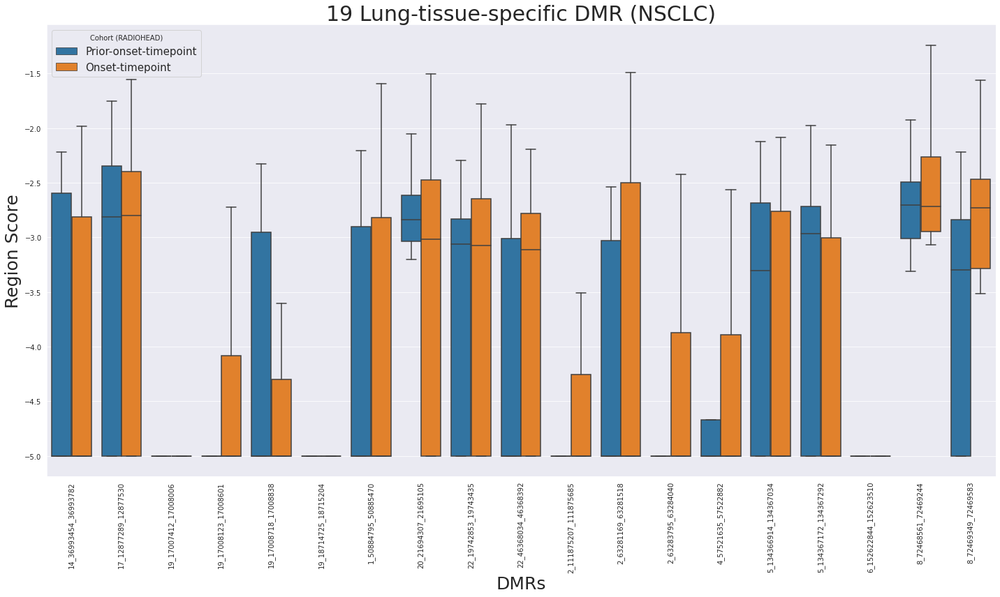

In [62]:
# Drop unnecessary columns if needed
df_train_features = df_train.drop(columns=['run_sample_id'], errors='ignore')

# Melt the dataframe for easier visualization
df_train_melted = df_train_features.melt(id_vars="pneumonitis_EOSI_onset_timepoint", var_name="Feature", value_name="Value")

# Plot feature distributions using boxplots
plt.figure(figsize=(20, 12))
sns.boxplot(data=df_train_melted, x="Feature", y="Value", hue="pneumonitis_EOSI_onset_timepoint", showfliers=False)

# Formatting the plot
plt.xticks(rotation=90, fontsize=10)
plt.title("19 Lung-tissue-specific DMR (NSCLC)", fontsize=30)
plt.ylabel("Region Score", fontsize=25)
plt.xlabel("DMRs", fontsize=25)
plt.legend(title="Cohort (RADIOHEAD)", fontsize=15)
plt.tight_layout()
plt.show()

In [ ]:
# # Selection for case patients only, then select only pre-treatment vs onset samples

# # Merge the information back
# df_case_info = df_case.merge(df_all_info[['GHSampleID', 'Tumor_methylation_status', 'Tumor_methylation_score', 'MB_methyl_score']], on = 'GHSampleID', how = "left")
# df_case_info.shape

# df_case_neg_nsclc = df_case_info[(df_case_info['Tumor_methylation_status'] == "Not Detected") & (df_case_info['Cancertype'] == "NSCLC")]

# df_case_neg_nsclc_OnsetvsBase = df_case_neg_nsclc[
#     (df_case_neg_nsclc['Visit_name'] == "PRE-TREATMENT") |
#     (df_case_neg_nsclc['pneumonitis_EOSI_onset_timepoint'] == "Onset-timepoint")
# ]
# print(df_case_neg_nsclc_OnsetvsBase.shape)
# df_case_neg_nsclc_OnsetvsBase.head()


# case_neg_nsclc_OnsetvsBase = df_case_neg_nsclc_OnsetvsBase.GHSampleID.to_list()
# df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples = df_consolidated_PICI_DMR_19[df_consolidated_PICI_DMR_19['run_sample_id'].isin(case_neg_nsclc_OnsetvsBase)]
# print(df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.run_sample_id.nunique())

# # merge the additional info 
# df_case_neg_nsclc_OnsetvsBase_1 = df_case_neg_nsclc_OnsetvsBase.rename(columns={"GHSampleID": "run_sample_id"})

# df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples = df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.merge(df_case_neg_nsclc_OnsetvsBase_1[['run_sample_id', 'pneumonitis_EOSI']], on = 'run_sample_id', how = 'left')
# df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.head()

# # Save the data
# df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples_03032025.csv", index = False)

(22, 25)
22


In [ ]:
# exclude_ids = [
#     'B00324270', 'B00490071', 'B00488621', 'B00489970', 
#     'B00489826', 'B00441907', 'B00489786', 'B00470738'
# ]

# df_filtered = df_case_neg_nsclc_OnsetvsBase[~df_case_neg_nsclc_OnsetvsBase['GHSampleID'].isin(exclude_ids)]
# df_filtered.shape

(14, 25)

In [ ]:
# case_neg_nsclc_OnsetvsBase = df_filtered.GHSampleID.to_list()
# df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples = df_consolidated_PICI_DMR_19[df_consolidated_PICI_DMR_19['run_sample_id'].isin(case_neg_nsclc_OnsetvsBase)]
# print(df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.run_sample_id.nunique())

# # merge the additional info 
# df_case_neg_nsclc_OnsetvsBase_1 = df_filtered.rename(columns={"GHSampleID": "run_sample_id"})

# df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples = df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.merge(df_case_neg_nsclc_OnsetvsBase_1[['run_sample_id', 'pneumonitis_EOSI']], on = 'run_sample_id', how = 'left')
# df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.head()

# # Save the data
# # df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples_03032025.csv", index = False)

14


,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,patient_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,pneumonitis_EOSI
0,B00319596,230916_A01552_0306_BHCHVYDSX7,Sirius-1.1.1-RLS,1_50884795_50885470,1,19,1,691.98624,0.00003,0.001445,B00319596,Pneumonitis_Positive,-2.837101,0.001455,Pneumonitis_positive_samples
1,B00319596,230916_A01552_0306_BHCHVYDSX7,Sirius-1.1.1-RLS,2_63281169_63281518,0,0,0,0.00000,0.00000,0.000000,B00319596,Pneumonitis_Positive,-5.000000,0.000010,Pneumonitis_positive_samples
2,B00319596,230916_A01552_0306_BHCHVYDSX7,Sirius-1.1.1-RLS,2_63283795_63284040,0,0,0,0.00000,0.00000,0.000000,B00319596,Pneumonitis_Positive,-5.000000,0.000010,Pneumonitis_positive_samples
3,B00319596,230916_A01552_0306_BHCHVYDSX7,Sirius-1.1.1-RLS,2_111875207_111875685,1,14,1,698.06747,0.00003,0.001433,B00319596,Pneumonitis_Positive,-2.840875,0.001443,Pneumonitis_positive_samples
4,B00319596,230916_A01552_0306_BHCHVYDSX7,Sirius-1.1.1-RLS,4_57521635_57522882,0,0,0,0.00000,0.00000,0.000000,B00319596,Pneumonitis_Positive,-5.000000,0.000010,Pneumonitis_positive_samples


In [39]:
# For 15 lung-tissue-cancer specific DMRs

# Selection for df_all_non_baseline_neg samples
non_baseline_neg = df_all_non_baseline_neg.GHSampleID.to_list()
df_consolidated_PICI_DMR_lung_tissue_cancer_all_samples = df_consolidated_PICI_DMR_lung_tissue_cancer[df_consolidated_PICI_DMR_lung_tissue_cancer['run_sample_id'].isin(non_baseline_neg)]
print(df_consolidated_PICI_DMR_lung_tissue_cancer_all_samples.run_sample_id.nunique())

# merge the additional info 
df_consolidated_PICI_DMR_lung_tissue_cancer_all_samples = df_consolidated_PICI_DMR_lung_tissue_cancer_all_samples.merge(df_all_non_baseline_neg_1[['run_sample_id', 'pneumonitis_EOSI_onset_timepoint']], on = 'run_sample_id', how = 'left')
df_consolidated_PICI_DMR_lung_tissue_cancer_all_samples.head()


134


,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,patient_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,pneumonitis_EOSI_onset_timepoint
0,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_50884242_50884694,1,23,1,465.28493,0.000046,0.002149,B00310928,Pneumonitis_Negative,-2.665703,0.002159,Prior-onset-timepoint
1,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_50884795_50885470,0,0,0,0.00000,0.000000,0.000000,B00310928,Pneumonitis_Negative,-5.000000,0.000010,Prior-onset-timepoint
2,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_90308840_90309625,0,0,0,0.00000,0.000000,0.000000,B00310928,Pneumonitis_Negative,-5.000000,0.000010,Prior-onset-timepoint
3,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,3_44063233_44063959,0,0,0,0.00000,0.000000,0.000000,B00310928,Pneumonitis_Negative,-5.000000,0.000010,Prior-onset-timepoint
4,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,3_50402272_50402942,1,18,1,477.95279,0.000046,0.002092,B00310928,Pneumonitis_Negative,-2.677314,0.002102,Prior-onset-timepoint


In [113]:
# Selection for case patients only, then select only pre-treatment vs onset samples

# Merge the information back
df_ctrl_info = df_ctrl.merge(df_all_info[['GHSampleID', 'Tumor_methylation_status', 'Tumor_methylation_score', 'MB_methyl_score']], on = 'GHSampleID', how = "left")
df_ctrl_info.shape

df_ctrl_neg_nsclc = df_ctrl_info[(df_ctrl_info['Tumor_methylation_status'] == "Not Detected") & (df_ctrl_info['Cancertype'] == "NSCLC")]

df_ctrl_neg_nsclc.Visit_name.value_counts()

df_ctrl_neg_nsclc_treatment = df_ctrl_neg_nsclc[(df_ctrl_neg_nsclc['Visit_name'] != "PRE-TREATMENT")]

print(df_ctrl_neg_nsclc_treatment.shape)
df_ctrl_neg_nsclc_treatment.head()


(32, 21)


,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,Tumor_methylation_status,Tumor_methylation_score,MB_methyl_score
42,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,Not Detected,0.0,-21.670450
43,PICI0009,10914082EP01,A0675087,B00310998,PICI0009.PICI0009-3-1195,3-1195,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,35.8800,1.0,0,2/22/23,3/8/21,9/5/23,NSCLC,Pneumonitis_Negative,Not Detected,0.0,-20.976755
44,PICI0009,10958950EP01,A0675220,B00313657,PICI0009.PICI0009-3-1400,3-1400,QUARTERLY FOLLOW-UP,1,SUCCESS,NaN,13.5200,1.0,0,2/22/23,5/18/21,9/5/23,NSCLC,Pneumonitis_Negative,Not Detected,0.0,-21.720040
45,PICI0009,10982548EP01,A0675231,B00313683,PICI0009.PICI0009-3-1590,3-1590,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,14.2350,1.0,0,2/22/23,5/27/21,9/5/23,NSCLC,Pneumonitis_Negative,Not Detected,0.0,-21.744956
46,PICI0009,10838563EP01,A0676023,B00319560,PICI0009.PICI0009-5-1043,5-1043,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,8.9700,1.0,0,2/22/23,8/7/20,9/5/23,NSCLC,Pneumonitis_Negative,Not Detected,0.0,-23.167552


In [119]:
df_ctrl_neg_nsclc_treatment_1 = df_ctrl_neg_nsclc_treatment[['GHSampleID', 'patient_type']]

df_case_neg_nsclc_OnsetvsBase_1 = df_case_neg_nsclc_OnsetvsBase[(df_case_neg_nsclc_OnsetvsBase['pneumonitis_EOSI_onset_timepoint'] == "Onset-timepoint")]
df_case_neg_nsclc_OnsetvsBase_2 = df_case_neg_nsclc_OnsetvsBase_1[['GHSampleID', 'patient_type']]
df_test = pd.concat([df_ctrl_neg_nsclc_treatment_1, df_case_neg_nsclc_OnsetvsBase_2], ignore_index=True)
df_test.shape

(43, 2)

In [120]:
# Selection for case and control, treatment samples only

# Merge the information back
df_test_info = df_test.merge(df_all_info[['GHSampleID', 'Tumor_methylation_status', 'Tumor_methylation_score', 'MB_methyl_score']], on = 'GHSampleID', how = "left")
df_test_info.shape


case_neg_nsclc_OnsetvsBase = df_test_info.GHSampleID.to_list()
df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples = df_consolidated_PICI_DMR_19[df_consolidated_PICI_DMR_19['run_sample_id'].isin(case_neg_nsclc_OnsetvsBase)]
print(df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.run_sample_id.nunique())

# merge the additional info 
df_case_neg_nsclc_OnsetvsBase_1 = df_case_neg_nsclc_OnsetvsBase.rename(columns={"GHSampleID": "run_sample_id"})

df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples = df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.merge(df_case_neg_nsclc_OnsetvsBase_1[['run_sample_id', 'pneumonitis_EOSI']], on = 'run_sample_id', how = 'left')
df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.head()

# Save the data
# df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.to_csv(f"{work_dir}/df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples_03032025.csv", index = False)

43


,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,patient_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count,pneumonitis_EOSI
0,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,1_50884795_50885470,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,NaN
1,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_63281169_63281518,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,NaN
2,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_63283795_63284040,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,NaN
3,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,2_111875207_111875685,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,NaN
4,B00310928,230319_A01810_0104_BHKTK7DSX5,Sirius-1.1.0-RLS,4_57521635_57522882,0,0,0,0.0,0.0,0.0,B00310928,Pneumonitis_Negative,-5.0,0.00001,NaN


In [121]:
df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.patient_type.value_counts()

Pneumonitis_Negative    608
Pneumonitis_Positive    209
Name: patient_type, dtype: int64

In [123]:
# Reformat the traning data
df_train = df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.copy()

# df_train = df_consolidated_PICI_DMR_lung_tissue_cancer_all_samples.copy()

# df_train = df_train[['run_sample_id', 'region_id', 'adjusted_log_norm_peak_count', 'pneumonitis_EOSI_onset_timepoint']]
df_train = df_train[['run_sample_id', 'region_id', 'adjusted_log_norm_peak_count', 'patient_type']]


# Pivot the data to make region_id as columns
df_pivot = df_train.pivot(index='run_sample_id', columns='region_id', values='adjusted_log_norm_peak_count')

# Add the target variable (y-label) back to the reshaped dataframe
# df_pivot['pneumonitis_EOSI_onset_timepoint'] = df_train.groupby('run_sample_id')['pneumonitis_EOSI_onset_timepoint'].first()
df_pivot['patient_type'] = df_train.groupby('run_sample_id')['patient_type'].first()


# Reset the index for a cleaner dataframe
df_train = df_pivot.reset_index()
print(df_train.shape)
# print(df_train.pneumonitis_EOSI_onset_timepoint.value_counts())
print(df_train.patient_type.value_counts())
df_train.head()

(43, 21)
Pneumonitis_Negative    32
Pneumonitis_Positive    11
Name: patient_type, dtype: int64


region_id,run_sample_id,14_36993454_36993782,17_12877289_12877530,19_17007412_17008006,19_17008123_17008601,19_17008718_17008838,19_18714725_18715204,1_50884795_50885470,20_21694307_21695105,22_19742853_19743435,22_46368034_46368392,2_111875207_111875685,2_63281169_63281518,2_63283795_63284040,4_57521635_57522882,5_134366914_134367034,5_134367172_134367292,6_152622844_152623510,8_72468561_72469244,8_72469349_72469583,patient_type
0,B00310928,-5.000000,-5.000000,-5.0,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.0,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.000000,-5.0,-2.671007,-5.000000,Pneumonitis_Negative
1,B00310998,-5.000000,-3.011466,-5.0,-5.000000,-2.983585,-3.666142,-3.209915,-3.011466,-5.000000,-5.0,-3.553200,-3.064551,-5.000000,-3.673177,-3.517909,-2.984619,-5.0,-2.899457,-3.260002,Pneumonitis_Negative
2,B00313657,-2.690300,-1.819754,-5.0,-5.000000,-3.183824,-5.000000,-2.853339,-2.682716,-2.882126,-5.0,-3.175218,-5.000000,-2.981657,-3.175218,-2.211205,-2.104299,-5.0,-2.543343,-2.882126,Pneumonitis_Negative
3,B00313683,-5.000000,-3.195130,-5.0,-5.000000,-5.000000,-5.000000,-5.000000,-3.203385,-2.893646,-5.0,-5.000000,-5.000000,-5.000000,-5.000000,-2.880081,-3.156783,-5.0,-2.737817,-2.917495,Pneumonitis_Negative
4,B00319560,-2.217752,-2.271268,-5.0,-2.660056,-5.000000,-5.000000,-2.203431,-2.398977,-2.670602,-5.0,-5.000000,-2.660056,-5.000000,-5.000000,-2.387687,-1.973263,-5.0,-1.922581,-2.217752,Pneumonitis_Negative


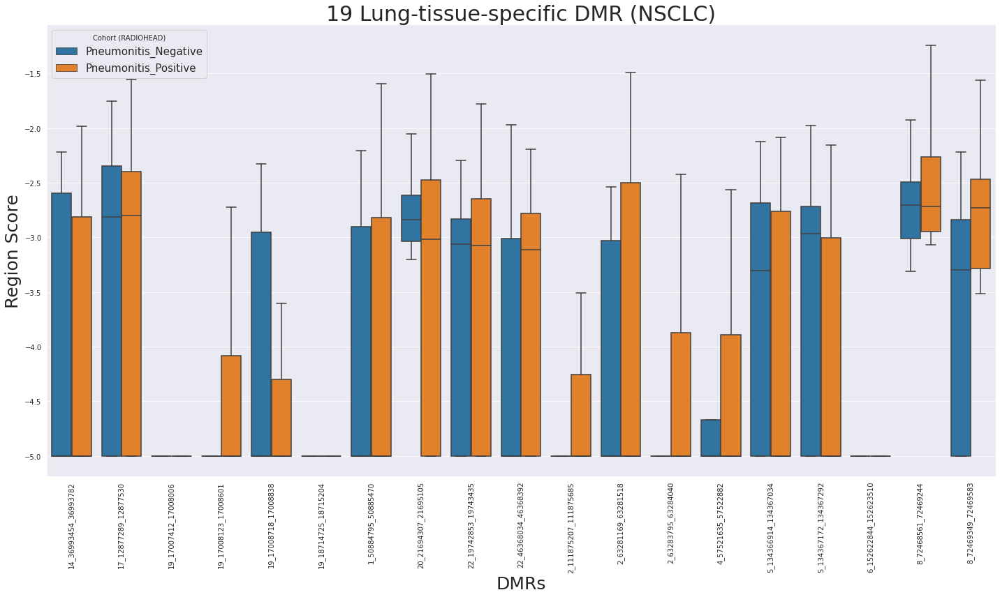

In [125]:
# Drop unnecessary columns if needed
df_train_features = df_train.drop(columns=['run_sample_id'], errors='ignore')

# Melt the dataframe for easier visualization
# df_train_melted = df_train_features.melt(id_vars="pneumonitis_EOSI_onset_timepoint", var_name="Feature", value_name="Value")
df_train_melted = df_train_features.melt(id_vars="patient_type", var_name="Feature", value_name="Value")

# Plot feature distributions using boxplots
plt.figure(figsize=(20, 12))
# sns.boxplot(data=df_train_melted, x="Feature", y="Value", hue="pneumonitis_EOSI_onset_timepoint", showfliers=False)
sns.boxplot(data=df_train_melted, x="Feature", y="Value", hue="patient_type", showfliers=False)

# Formatting the plot
plt.xticks(rotation=90, fontsize=10)
plt.title("19 Lung-tissue-specific DMR (NSCLC)", fontsize=30)
plt.ylabel("Region Score", fontsize=25)
plt.xlabel("DMRs", fontsize=25)
plt.legend(title="Cohort (RADIOHEAD)", fontsize=15)
plt.tight_layout()
plt.show()

In [132]:
# Reformat the traning data
df_train = df_consolidated_PICI_DMR_19_all_samples.copy()
# df_train = df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.copy()
# df_train = df_consolidated_PICI_DMR_19_methylation_neg_BasevsOnset_samples.copy()

# df_train = df_consolidated_PICI_DMR_lung_tissue_cancer_all_samples.copy()

# df_train = df_train[['run_sample_id', 'region_id', 'adjusted_log_norm_peak_count', 'pneumonitis_EOSI_onset_timepoint']]
df_train = df_train[['run_sample_id', 'region_id', 'adjusted_log_norm_peak_count', 'pneumonitis_EOSI']]


# Pivot the data to make region_id as columns
df_pivot = df_train.pivot(index='run_sample_id', columns='region_id', values='adjusted_log_norm_peak_count')

# Add the target variable (y-label) back to the reshaped dataframe
# df_pivot['pneumonitis_EOSI_onset_timepoint'] = df_train.groupby('run_sample_id')['pneumonitis_EOSI_onset_timepoint'].first()
df_pivot['pneumonitis_EOSI'] = df_train.groupby('run_sample_id')['pneumonitis_EOSI'].first()


# Reset the index for a cleaner dataframe
df_train = df_pivot.reset_index()
print(df_train.shape)
# print(df_train.pneumonitis_EOSI_onset_timepoint.value_counts())
print(df_train.pneumonitis_EOSI.value_counts())
df_train.head()

KeyError: "['pneumonitis_EOSI'] not in index"

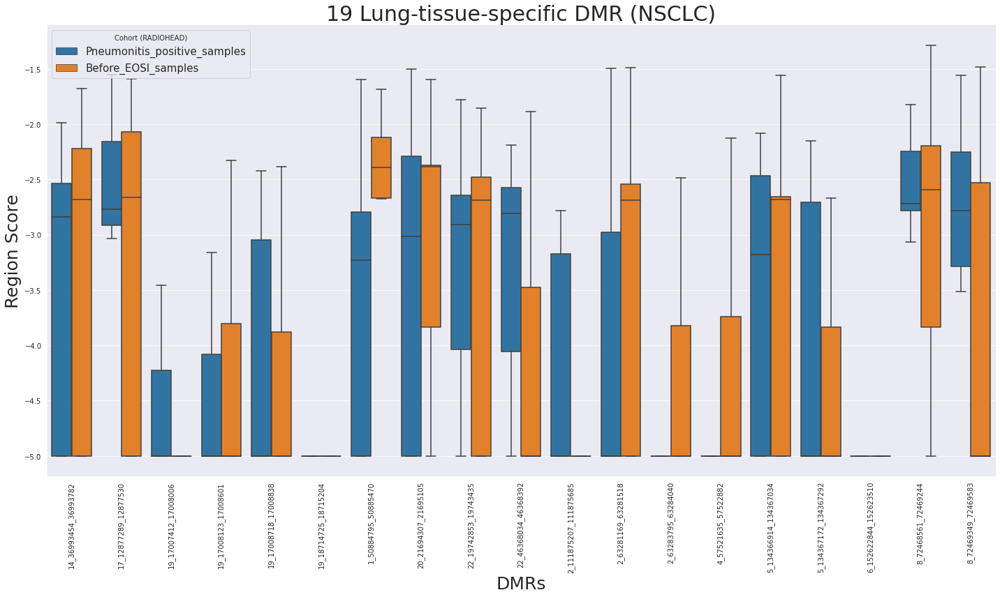

In [108]:
# Drop unnecessary columns if needed
df_train_features = df_train.drop(columns=['run_sample_id'], errors='ignore')

# Melt the dataframe for easier visualization
# df_train_melted = df_train_features.melt(id_vars="pneumonitis_EOSI_onset_timepoint", var_name="Feature", value_name="Value")
df_train_melted = df_train_features.melt(id_vars="pneumonitis_EOSI", var_name="Feature", value_name="Value")

# Plot feature distributions using boxplots
plt.figure(figsize=(20, 12))
# sns.boxplot(data=df_train_melted, x="Feature", y="Value", hue="pneumonitis_EOSI_onset_timepoint", showfliers=False)
sns.boxplot(data=df_train_melted, x="Feature", y="Value", hue="pneumonitis_EOSI", showfliers=False)

# Formatting the plot
plt.xticks(rotation=90, fontsize=10)
plt.title("19 Lung-tissue-specific DMR (NSCLC)", fontsize=30)
plt.ylabel("Region Score", fontsize=25)
plt.xlabel("DMRs", fontsize=25)
plt.legend(title="Cohort (RADIOHEAD)", fontsize=15)
plt.tight_layout()
plt.show()


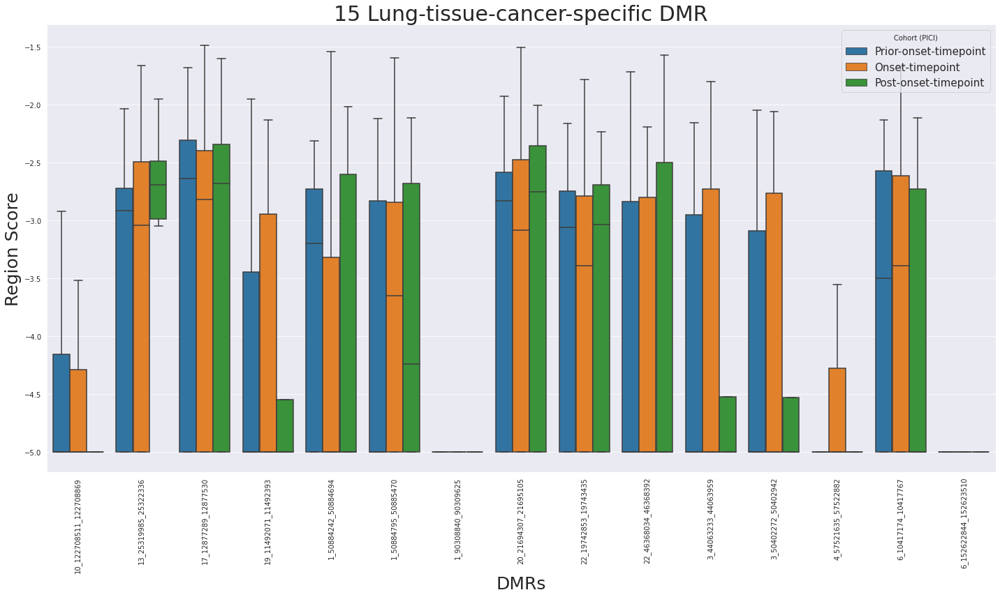

In [41]:
# Drop unnecessary columns if needed
df_train_features = df_train.drop(columns=['run_sample_id'], errors='ignore')

# Melt the dataframe for easier visualization
df_train_melted = df_train_features.melt(id_vars="pneumonitis_EOSI_onset_timepoint", var_name="Feature", value_name="Value")

# Plot feature distributions using boxplots
plt.figure(figsize=(20, 12))
sns.boxplot(data=df_train_melted, x="Feature", y="Value", hue="pneumonitis_EOSI_onset_timepoint", showfliers=False)

# Formatting the plot
plt.xticks(rotation=90, fontsize=10)
plt.title("15 Lung-tissue-cancer-specific DMR", fontsize=30)
plt.ylabel("Region Score", fontsize=25)
plt.xlabel("DMRs", fontsize=25)
plt.legend(title="Cohort (PICI)", fontsize=15)
plt.tight_layout()
plt.show()


In [16]:
df_all_3.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Patient_ID Simplified,Pneumonitis,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,patient_type,no AE,runid,fc_dir,Tumor_methylation_status,Tumor_methylation_score
0,PICI0009,10938406EP01,A0675015,B00310928,PICI0009.PICI0009-3-1590,3-1590,NaN,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.8025,1.0,0,2/22/23,2/25/21,9/5/23,NSCLC,Pneumonitis_Negative,3-1590,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Not Detected,0.000000
1,PICI0009,10884945EP01,A0674985,B00310970,PICI0009.PICI0009-3-1459,3-1459,NaN,12 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,3.4775,1.0,0,2/22/23,11/12/20,9/5/23,NSCLC,Pneumonitis_Negative,3-1459,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Detected,0.000006
2,PICI0009,10880481EP01,A0674986,B00310971,PICI0009.PICI0009-3-1767,3-1767,1.0,4-6 WEEKS POST EOSI,1,SUCCESS,NaN,13.4550,1.0,0,2/22/23,11/11/20,9/5/23,NSCLC,Pneumonitis_Positive,NaN,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Detected,0.118710
3,PICI0009,10909712EP01,A0675040,B00311003,PICI0009.PICI0009-3-1767,3-1767,1.0,6 MONTHS POST 1ST DOSE,1,SUCCESS,NaN,4.1795,1.0,0,2/22/23,1/21/21,9/5/23,NSCLC,Pneumonitis_Positive,NaN,230319_A01810_0104_BHKTK7DSX5,/ghsfa/projects/omni_v2/flowcells/230319_A01810_0104_BHKTK7DSX5_PS3R206_AP1.Sirius-1.1.0-RLS_20230815-165201,Detected,0.019360
4,PICI0009,10982548EP01,A0675231,B00313683,PICI0009.PICI0009-3-1590,3-1590,NaN,QUARTERLY FOLLOW-UP,1,SUCCESS,Methylation Bias Warning,14.2350,1.0,0,2/22/23,5/27/21,9/5/23,NSCLC,Pneumonitis_Negative,3-1590,230322_A01810_0106_AHN2KJDSX5,/ghsfa/projects/omni_v2/flowcells/230322_A01810_0106_AHN2KJDSX5_PS3R207_AP2.Sirius-1.1.0-RLS_20230719-224257,Not Detected,0.000000


### DSI SOW21 data (CSO)

In [27]:
# Readin data with CSO caller results
top_8_prd_df_sub = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/top_8_prd_df_sub_with_methyl_score.csv")

# Drop duplicates by only selecting rank 1 samples (or <= 2)
df_dsi_top1 = top_8_prd_df_sub[top_8_prd_df_sub['CSO_rank'] == 1]
df_dsi_top2 = top_8_prd_df_sub[top_8_prd_df_sub['CSO_rank'] <= 2]

print("Total df size of DSI cohort is " + str(df_dsi_top2.shape[0]) + "\n")
print("Total unique sample size of DSI cohort is " + str(df_dsi_top2.GHSampleID.nunique()) + "\n")
print("Total unique patient size of DSI cohort is " + str(df_dsi_top2.Patient_ID.nunique()) + "\n")

df_dsi_top2.head()

Total df size of DSI cohort is 1748

Total unique sample size of DSI cohort is 874

Total unique patient size of DSI cohort is 436



,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call,MB_score
0,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-11.142988,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,True,-13.417340
1,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_bladder,-17.764752,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,bladder,2,Breast,True,-13.417340
8,B00460891_230812_A01810_0184_AH7GK3DSX7,0.392185,CSO_breast,1.418618,DS8201-A-U302,A0808357,B00460891,32012004,C1D1,SUCCESS,NaN,12.532,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,5.94,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.combined.hdr.tsv,B00460891,Female,Female,breast,1,Breast,True,7.084062
9,B00460891_230812_A01810_0184_AH7GK3DSX7,0.392185,CSO_esophageal,-16.889880,DS8201-A-U302,A0808357,B00460891,32012004,C1D1,SUCCESS,NaN,12.532,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,5.94,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edb

In [28]:
# The result of CSO lung samples just based on the top1 CSO ranking
df_dsi_top1['sample_type'] = np.where(df_dsi_top1['cso_model_type'] == 'CSO_lung', 'CSO_Lung', 'Non_CSO_Lung')
df_dsi_top1['sample_type'].value_counts()

Non_CSO_Lung    858
CSO_Lung         16
Name: sample_type, dtype: int64

In [47]:
df_dsi_top1.shape

(874, 61)

In [29]:
# Label sample_type column based on if this is cso lung sample
df_dsi_top2_1 = df_dsi_top2.copy()

# Add label of CSO lung based on top2
sample_list_top1 = df_dsi_top2_1[(df_dsi_top2_1['CSO_rank'] == 1) & (df_dsi_top2_1['cso_prediction'] == 'lung')]['GHSampleID'].values
sample_list_top2 = df_dsi_top2_1[(df_dsi_top2_1['CSO_rank'] == 2) & (df_dsi_top2_1['cso_prediction'] == 'lung')]['GHSampleID'].values
sample_list = np.concatenate([sample_list_top1, sample_list_top2])

# Add a new column 
df_dsi_top2_1['sample_type'] = np.where(df_dsi_top2_1['GHSampleID'].isin(sample_list), 'CSO_Lung', 'Non_CSO_Lung')

# Drop duplicates
df_dsi_top2_1 = df_dsi_top2_1.drop_duplicates(subset = 'GHSampleID')
print(df_dsi_top2_1['sample_type'].value_counts())

df_dsi_top2_1.head()

Non_CSO_Lung    786
CSO_Lung         88
Name: sample_type, dtype: int64


,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call,MB_score
0,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-11.142988,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,Non_CSO_Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,True,-13.417340
8,B00460891_230812_A01810_0184_AH7GK3DSX7,0.392185,CSO_breast,1.418618,DS8201-A-U302,A0808357,B00460891,32012004,C1D1,SUCCESS,NaN,12.532,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,5.94,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,Non_CSO_Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.combined.hdr.tsv,B00460891,Female,Female,breast,1,Breast,True,7.084062
16,B00460892_230812_A01810_0184_AH7GK3DSX7,-14.477896,CSO_breast,-10.796222,DS8201-A-U302,A0808359,B00460892,33102003,C1D1,SUCCESS,NaN,6.396,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.74,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,Non_CSO_Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.combined.hdr.tsv,B00460892,Female,Female,breast,1,Breast,True,-11.089416
24,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_breast,9.851840,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,Non_CSO_Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d7

In [30]:
# Rename the value
df_dsi_top2_1.loc[df_dsi_top2_1['Visit_name'] == "C04D1", 'Visit_name'] = "C4D1"
df_dsi_top2_1.Visit_name.value_counts()

C1D1    403
EOT     275
C4D1    196
Name: Visit_name, dtype: int64

In [31]:
df_dsi_top2_1.head()

,unique_sample_id,Pancancer,cso_model_type,cso_score,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,Pancancer_call,primary_cnv_qc_file_path,alternative_cnv_qc_file_path,run_sample_id,predicted_sex,provided_sex,cso_prediction,CSO_rank,cancerother,S3_MB_Breast_call,MB_score
0,B00460890_230812_A01810_0184_AH7GK3DSX7,-14.465587,CSO_breast,-11.142988,DS8201-A-U302,A0808358,B00460890,32172003,C1D1,SUCCESS,NaN,22.776,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.54,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,Non_CSO_Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460890/B00460890.ghcnv_qc.combined.hdr.tsv,B00460890,Female,Female,breast,1,Breast,True,-13.417340
8,B00460891_230812_A01810_0184_AH7GK3DSX7,0.392185,CSO_breast,1.418618,DS8201-A-U302,A0808357,B00460891,32012004,C1D1,SUCCESS,NaN,12.532,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,5.94,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,Non_CSO_Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460891/B00460891.ghcnv_qc.combined.hdr.tsv,B00460891,Female,Female,breast,1,Breast,True,7.084062
16,B00460892_230812_A01810_0184_AH7GK3DSX7,-14.477896,CSO_breast,-10.796222,DS8201-A-U302,A0808359,B00460892,33102003,C1D1,SUCCESS,NaN,6.396,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.74,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,Non_CSO_Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d730-23c8-4e2b-be24-a1133818edbc.20230814141051,True,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.hdr.tsv,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7/B00460892/B00460892.ghcnv_qc.combined.hdr.tsv,B00460892,Female,Female,breast,1,Breast,True,-11.089416
24,B00460893_230812_A01810_0184_AH7GK3DSX7,4.205274,CSO_breast,9.851840,DS8201-A-U302,A0808353,B00460893,44012006,C1D1,SUCCESS,NaN,27.144,3.5,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,7.19,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,NaN,NaN,Non_CSO_Lung,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,230812_A01810_0184_AH7GK3DSX7,/ghsfa/ivd/flowcentral/230812_A01810_0184_AH7GK3DSX7,NaN,NaN,NaN,breast,Baseline,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230812_A01810_0184_AH7GK3DSX7.c898d7

Pearson correlation: 0.205, p-value: 8.83e-10
Spearman correlation: 0.116, p-value: 0.000568



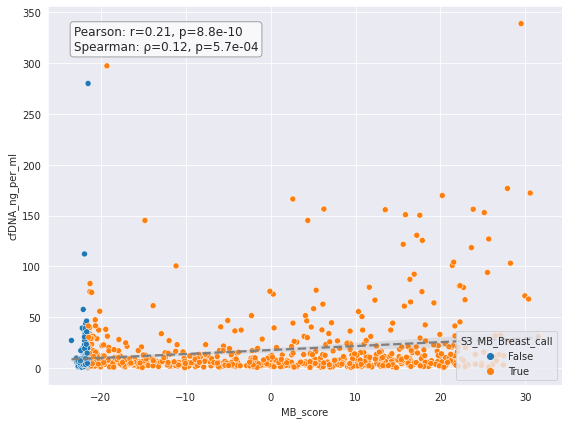

In [34]:
# Check the correlation between binary methylation caller (MB methyl score) and cfDNA
df_dsi_top2_1['cfDNA_ng_per_ml'] = df_dsi_top2_1['cfDNA_ng'] / df_dsi_top2_1['Plasma_ml_input']

analyze_and_plot_correlation(
    df=df_dsi_top2_1,
    x_col='MB_score',
    y_col='cfDNA_ng_per_ml',
    hue_col='S3_MB_Breast_call'
)

In [35]:
# Due to the confounding of the tumor signal, only MB binary call negative samples can be used for cfDNA comparison
df_dsi_top2_neg = df_dsi_top2_1.query('S3_MB_Breast_call == False')
print(df_dsi_top2_neg.shape)

df_dsi_top2_neg.Visit_name.value_counts()

(179, 62)


C4D1    102
EOT      62
C1D1     15
Name: Visit_name, dtype: int64

In [36]:
df_dsi_top2_neg.sample_type.value_counts()

Non_CSO_Lung    152
CSO_Lung         27
Name: sample_type, dtype: int64

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Non_CSO_Lung vs. CSO_Lung: t-test independent samples, P_val:5.757e-01 t=-5.607e-01


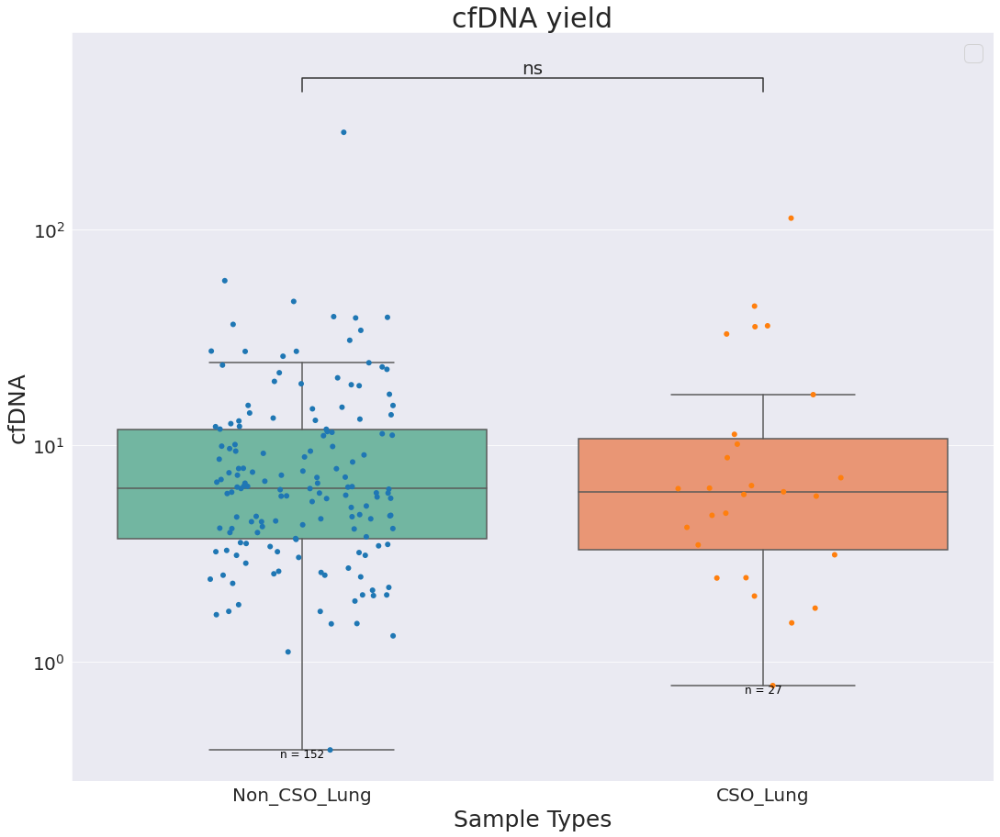

In [43]:
cfDNA_boxplot_with_annotation(df_dsi_top2_neg, 'sample_type', 'cfDNA yield')

In [125]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_with_hue(df, col, hue_col, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))
    sns.set_style('darkgrid')

    # Define order for hue_col and col
    hue_order = ['C1D1', 'C4D1', 'EOT']
    xcol_order = sorted(df[col].unique())  # Should be ['CSO_Lung', 'Non_CSO_Lung']

    # Create color palette
    hue_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {hue_item: color for hue_item, color in zip(hue_order, hue_colors)}

    # Create boxplot and stripplot
    box = sns.boxplot(data=df, x=col, y="cfDNA_ng", hue=hue_col, hue_order=hue_order,
                      order=xcol_order, palette=color_map, ax=ax, dodge=True, showfliers=False)
    sns.stripplot(data=df, x=col, y="cfDNA_ng", hue=hue_col, hue_order=hue_order,
                  order=xcol_order, color='gray', jitter=0.2, size=4, ax=ax, dodge=True, edgecolor='black', linewidth=0.5)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes, adjusted for hue and position
    for (xcol_type, hue_col_type), group in df.groupby([col, hue_col]):
        n = group.shape[0]
        x_pos = xcol_order.index(xcol_type) + (0.2 * hue_order.index(hue_col_type))
        y_pos = group['cfDNA_ng'].min() * 0.9
        ax.text(x_pos, y_pos, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # **Update pairs for statistical comparisons**: Compare same treatment groups between CSO_Lung and Non_CSO_Lung
    pairs = [
        (('CSO_Lung', 'C1D1'), ('Non_CSO_Lung', 'C1D1')),
        (('CSO_Lung', 'C4D1'), ('Non_CSO_Lung', 'C4D1')),
        (('CSO_Lung', 'EOT'), ('Non_CSO_Lung', 'EOT')),
    ]

    # Apply statistical annotations
    annotator = Annotator(ax, pairs, data=df, x=col, y="cfDNA_ng", hue=hue_col,
                          order=xcol_order, hue_order=hue_order)
    annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
    annotator.apply_and_annotate()

    # Fix the legend to display both boxes and strips
    handles, labels = ax.get_legend_handles_labels()
    new_labels, new_handles = [], []
    # Ensure each label appears only once
    for handle, label in zip(handles, labels):
        if label not in new_labels:
            new_labels.append(label)
            new_handles.append(handle)
    ax.legend(new_handles, new_labels, title='Visit_name', fontsize=20, loc='best')

    # Set plot labels and title
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample type', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.show()


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

CSO_Lung_EOT vs. Non_CSO_Lung_EOT: t-test independent samples, P_val:3.783e-01 t=8.875e-01
CSO_Lung_C1D1 vs. Non_CSO_Lung_C1D1: t-test independent samples, P_val:1.444e-01 t=-1.553e+00
CSO_Lung_C4D1 vs. Non_CSO_Lung_C4D1: t-test independent samples, P_val:3.052e-01 t=-1.031e+00


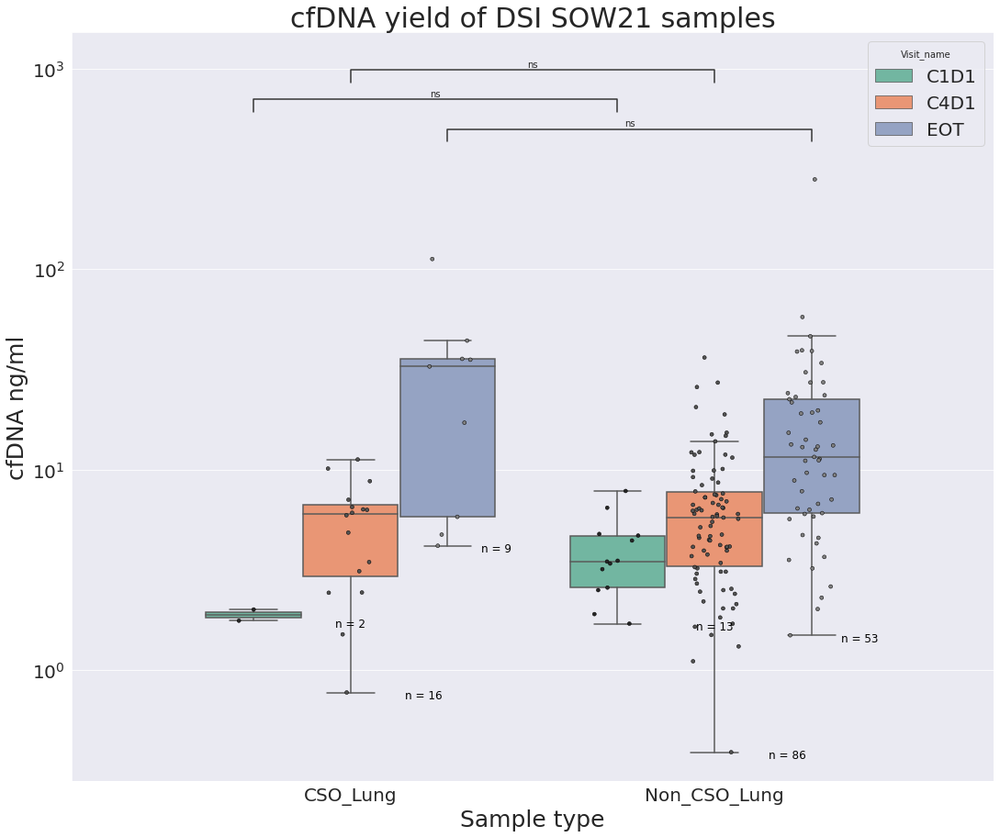

In [44]:
cfDNA_boxplot_with_hue(df_dsi_top2_neg, 'sample_type', 'Visit_name', 'cfDNA yield of DSI SOW21 samples')

In [42]:
df_dsi_top2_neg.shape

(179, 62)

In [114]:
model = smf.ols("cfDNA_ng_per_ml ~ sample_type", data=df_dsi_top2_1).fit()
print(model.summary())


                            OLS Regression Results                            
Dep. Variable:        cfDNA_ng_per_ml   R-squared:                       0.005
Model:                            OLS   Adj. R-squared:                  0.004
Method:                 Least Squares   F-statistic:                     4.822
Date:                Wed, 05 Feb 2025   Prob (F-statistic):             0.0284
Time:                        16:11:25   Log-Likelihood:                -4214.1
No. Observations:                 874   AIC:                             8432.
Df Residuals:                     872   BIC:                             8442.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

In [103]:
import statsmodels.api as sm
import statsmodels.formula.api as smf

# Fit a linear model
model = smf.ols("cfDNA_ng_per_ml ~ sample_type + S3_MB_Breast_call", data=df_dsi_top2_1).fit()
model3 = smf.ols("cfDNA_ng_per_ml ~ sample_type + S3_MB_Breast_call + MB_score", data=df_dsi_top2_1).fit()

# View results
print(model3.summary())


                            OLS Regression Results                            
Dep. Variable:        cfDNA_ng_per_ml   R-squared:                       0.046
Model:                            OLS   Adj. R-squared:                  0.043
Method:                 Least Squares   F-statistic:                     13.95
Date:                Wed, 05 Feb 2025   Prob (F-statistic):           6.90e-09
Time:                        15:50:32   Log-Likelihood:                -4196.0
No. Observations:                 874   AIC:                             8400.
Df Residuals:                     870   BIC:                             8419.
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
Intercept         

### DSI SOW21 data (Lung-tissue-specific and Lung-tissue-cancer-specific unsupervised learning)

#### Data prep

In [58]:
# Readin the DSI SOW21 report that was re-run by Jing with Sirius 1.6.0 on 20250131
df_dsi_rerun = pd.read_csv(f"{work_dir}/DSI_SOW21_Sirius160_rerun_byJing/20250131_Daiichi_SOW21_Batch1_Batch2_1150Samples_InfinityReport.csv", header = 1)
print("Total unique sample size of DSI SOW21 cohort is " + str(df_dsi_rerun.GHSampleID.nunique()) + "\n")
print("Total unique patient size of DSI SOW21 cohort is " + str(df_dsi_rerun.Patient_ID.nunique()) + "\n")
print("Total unique visit name size of DSI SOW21 cohort is " + str(df_dsi_rerun.Visit_name.value_counts()) + "\n")
df_dsi_rerun.head()

Total unique sample size of DSI SOW21 cohort is 1150

Total unique patient size of DSI SOW21 cohort is 444

Total unique visit name size of DSI SOW21 cohort is C1D1     52869
EOT      33755
C04D1    20317
C4D1      7315
Name: Visit_name, dtype: int64



,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name
0,DS8201-A-U302,6209114588,A0808345,B00460906,33032005.0,C1D1,1,SUCCESS,NaN,SNV,NaN,MRE11,11,94204912.0,8,S225G,T>C,c.673A>G,NM_005590.4,51.65,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs763790530,NaN,NaN,NaN,NaN,1240.0,0.97,NaN,0.041937,Detected,0.007763,9.45,Low,Not Detected,11.96,3.5,0.0,07/24/2023,09/19/2019,01/31/2025,BREAST,Not Applicable,Not Applicable
1,DS8201-A-U302,6209114588,A0808345,B00460906,33032005.0,C1D1,1,SUCCESS,NaN,SNV,NaN,RXRA,9,137300871.0,4,R145R,C>T,c.435C>T,NM_001291920.2,51.19,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs144573078,NaN,NaN,NaN,NaN,1658.0,0.97,NaN,0.041937,Detected,0.007763,9.45,Low,Not Detected,11.96,3.5,0.0,07/24/2023,09/19/2019,01/31/2025,BREAST,Not Applicable,Not Applicable
2,DS8201-A-U302,6209114588,A0808345,B00460906,33032005.0,C1D1,1,SUCCESS,NaN,SNV,NaN,MTOR,1,11217324.0,30,K1452E,T>C,c.4354A>G,NM_004958.4,50.25,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2389.0,0.97,NaN,0.041937,Detected,0.007763,9.45,Low,Not Detected,11.96,3.5,0.0,07/24/2023,09/19/2019,01/31/2025,BREAST,Not Applicable,Not Applicable
3,DS8201-A-U302,6209114588,A0808345,B00460906,33032005.0,C1D1,1,SUCCESS,NaN,SNV,NaN,NSD2,4,1918700.0,3,G288E,G>A,c.863G>A,NM_133334.2,50.20,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV56388308,rs754805178,NaN,NaN,NaN,NaN,2007.0,0.97,NaN,0.041937,Detected,0.007763,9.45,Low,Not Detected,11.96,3.5,0.0,07/24/2023,09/19/2019,01/31/2025,BREAST,Not Applicable,Not Applicable
4,DS8201-A-U302,6209114588,A0808345,B00460906,33032005.0,C1D1,1,SUCCESS,NaN,SNV,NaN,PAK1,11,77066797.0,7,T230A,T>C,c.688A>G,NM_001128620.2,49.78,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV99583456,rs780271453,NaN,NaN,NaN,NaN,2314.0,0.97,NaN,0.041937,Detected,0.007763,9.45,Low,Not Detected,11.96,3.5,0.0,07/24/2023,09/19/2019,01/31/2025,BREAST,Not Applicable,Not Applicable


In [ ]:
# Readin the vfinal data to get the "fc_dir" column
df_dsi_rerun_bart_final = pd.read_csv(f"{work_dir}/DSI_SOW21_Sirius160_rerun_byJing/DSI_SOW21_Infinity_01_BART_vFinal.csv", header = 3)
df_dsi_rerun_bart_final = df_dsi_rerun_bart_final.drop_duplicates(subset = ['run_sample_id', 'runid'])

print("Total sample size of DSI SOW21 bart vFinal batch is " + str(df_dsi_rerun_bart_final.shape[0]) + "\n") 
df_dsi_rerun_bart_final.head()

Total sample size of DSI SOW21 bart vFinal batch is 1150



,index,Patient,run_sample_id,IDs,Patient_ID,Visit_name,Cancertype,GHRequestID,runid,GHDB_Table,Variant_type,early_stage,methyl_tf,methyl_threshold,msre_model_name,methyl_score_PANCANCER,methyl_score_BREAST,methyl_score_CRC,methyl_score_LUNG,cnv_type,gene,chrom,position,mut_aa,mut_nt,gene_b,pos_b,somatic_call,mutant_allele_status,msi_status,tmb_score,tmb_category,flags,run_sample_id_donor,has_replicate,n_contam_genes,Additional_comment,Recommended_manual_change,Manual_review_change,report_modules,data_dir,tb_html,oncotrack_pdf,fusion_bam,somatic_tsv,on_G360,on_OMNI,variant_module
0,1,282.0,B00460890,"B00460890, B00472175",32172003.0,C1D1,NaN,A0808358,230812_A01810_0184_AH7GK3DSX7,NaN,NaN,False,0.001178,-20.907684,AGGREGATED,-12.578343,-13.417340,-17.134706,-13.341439,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MSS/MSI-L,5.91,Low,NaN,NaN,NaN,NaN,NaN,NaN,no change,core;io;hrd;virus,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7,NaN,B00460890.oncotrack.pdf,NaN,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7/sirius/B00460890/B00460890.annotated.somatic.tsv,NaN,NaN,NaN
1,2,1.0,B00460891,"B00460891, B00472117, B00473635",32012004.0,C1D1,NaN,A0808357,230812_A01810_0184_AH7GK3DSX7,NaN,NaN,False,0.055122,-20.907684,AGGREGATED,11.305796,7.084062,-10.896452,2.178941,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MSS/MSI-L,5.67,Low,NaN,NaN,NaN,NaN,NaN,NaN,no change,core;io;hrd;virus,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7,NaN,B00460891.oncotrack.pdf,NaN,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7/sirius/B00460891/B00460891.annotated.somatic.tsv,NaN,NaN,NaN
2,3,2.0,B00460892,"B00460892, B00472181, B00690462",33102003.0,C1D1,NaN,A0808359,230812_A01810_0184_AH7GK3DSX7,NaN,NaN,False,0.003145,-20.907684,AGGREGATED,-10.449045,-11.089416,-17.744158,-11.311429,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,MSS/MSI-L,5.67,Not evaluable,NaN,NaN,NaN,NaN,NaN,NaN,no change,core;io;hrd;virus,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7,NaN,B00460892.oncotrack.pdf,NaN,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7/sirius/B00460892/B00460892.annotated.somatic.tsv,NaN,NaN,NaN
3,4,283.0,B00460893,"B00460893, B00460895",44012006.0,C1D1,NaN,A0808353,230812_A01810_0184_AH7GK3DSX7,NaN,SNV,False,0.089988,-20.907684,AGGREGATED,15.833860,11.189205,-3.025703,1.136004,NaN,TIPARP,3,156396314.0,Q276Q,A>G,NaN,NaN,somatic,NaN,MSS/MSI-L,21.74,High,somatic to somatic_putative_ch discrepancy,NaN,NaN,NaN,NaN,NaN,change to somatic_putative_ch,core;io;hrd;virus,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7,NaN,B00460893.oncotrack.pdf,NaN,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7/sirius/B00460893/B00460893.annotated.somatic.tsv,False,False,NaN
4,5,283.0,B00460895,"B00460893, B00460895",44012006.0,C04D1,NaN,A0808355,230812_A01810_0184_AH7GK3DSX7,NaN,SNV,False,0.000000,-20.907684,AGGREGATED,-21.672988,-21.570961,-21.178030,-21.899094,NaN,RAD21,8,117864225.0,R478*,G>A,NaN,NaN,somatic,NaN,MSS/MSI-L,10.63,Low,somatic to somatic_putative_ch discrepancy,NaN,NaN,NaN,NaN,NaN,change to somatic_putative_ch,core;io;hrd;virus,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7,NaN,B00460895.oncotrack.pdf,NaN,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7/sirius/B00460895/B00460895.annotated.somatic.tsv,False,True,NaN


In [64]:
# Merge the "fc_dir"
df_dsi_rerun_bart_final.rename(columns={"run_sample_id": "GHSampleID"}, inplace=True)
df_dsi_rerun_1 = df_dsi_rerun.merge(df_dsi_rerun_bart_final[['GHSampleID', 'runid', 'data_dir']], on = 'GHSampleID', how = 'left')

# Drop duplicates
df_dsi_rerun_2 = df_dsi_rerun_1.drop_duplicates(subset = ['GHSampleID'])
df_dsi_rerun_2.rename(columns={"data_dir": "fc_dir"}, inplace=True)

df_dsi_rerun_2.head()

,Study_ID,Customer_SampleID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Alt-NoAlt,Sample_status,Sample_comment,Variant_type,Indel_type,Gene,Chromosome,Position,Exon,Mut_aa,Mut_nt,Mut_cdna,Transcript,Percentage,Splice_effect,Somatic_status,Molecular_consequence,Fusion_chrom_b,Fusion_gene_b,Fusion_position_a,Fusion_position_b,Direction_a,Direction_b,Downstream_gene,Copy_number,CNV_type,COSMIC,dbSNP,ClinVar,ClinVarID,Functional_impact,Mutant_allele_status,Mol_count,Max_percentage,Alleletype,HRD_score,Tumor_methylation_status,Tumor_methylation_score,TMB_score,TMB_category,MSI_High,cfDNA_ng,Plasma_ml_input,Plasma_ml_remaining,Received_date,Bloodcoll_date,Reported_date,Cancertype,Practice_name,Physician_name,runid,fc_dir
0,DS8201-A-U302,6209114588,A0808345,B00460906,33032005.0,C1D1,1,SUCCESS,NaN,SNV,NaN,MRE11,11,94204912.0,8,S225G,T>C,c.673A>G,NM_005590.4,51.65,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs763790530,NaN,NaN,NaN,NaN,1240.0,0.97,NaN,0.041937,Detected,0.007763,9.45,Low,Not Detected,11.960,3.5,0.0,07/24/2023,09/19/2019,01/31/2025,BREAST,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7
80,DS8201-A-U302,6209114589,A0808346,B00460900,33032002.0,C1D1,1,SUCCESS,NaN,SNV,NaN,PDGFRB,5,149495377.0,23,P1090P,C>T,c.3270G>A,NM_002609.4,71.24,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV53839661,rs183852315,Benign,698920.0,NaN,NaN,2765.0,31.20,NaN,0.069321,Detected,0.411788,1.89,Low,Not Detected,15.288,3.0,0.0,07/24/2023,07/05/2019,01/31/2025,BREAST,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7
197,DS8201-A-U302,6209114590,A0808347,B00460899,33032003.0,C1D1,1,SUCCESS,NaN,SNV,NaN,RECQL4,8,145743099.0,1,R24G,G>C,c.70C>G,NM_004260.4,65.85,NaN,germline,missense,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,271.0,8.95,NaN,0.026729,Detected,0.108484,12.29,Low,Not Detected,16.692,3.5,0.0,07/24/2023,08/13/2019,01/31/2025,BREAST,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7
320,DS8201-A-U302,6209114614,A0808348,B00460902,33032002.0,C4D1,1,SUCCESS,NaN,SNV,NaN,PDGFRB,5,149495377.0,23,P1090P,C>T,c.3270G>A,NM_002609.4,52.16,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,COSV53839661,rs183852315,Benign,698920.0,NaN,NaN,1234.0,1.72,NaN,0.016786,Detected,0.011712,0.95,Low,Not Detected,9.828,3.5,0.0,07/24/2023,09/06/2019,01/31/2025,BREAST,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7
379,DS8201-A-U302,6209149611,A0808349,B00460901,34012002.0,C1D1,1,SUCCESS,NaN,SNV,NaN,PREX2,8,69104722.0,37,G1522G,C>T,c.4566C>T,NM_024870.4,52.88,NaN,germline,synonymous,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,rs61753705,NaN,NaN,NaN,NaN,1769.0,2.64,NaN,0.010514,Detected,0.000148,8.23,Low,Not Detected,12.896,3.5,0.0,07/24/2023,08/08/2019,01/31/2025,BREAST,Not Applicable,Not Applicable,230812_A01810_0184_AH7GK3DSX7,/ghds/projects/baas/230812_A01810_0184_AH7GK3DSX7


In [65]:
# Rename the visit name 
df_dsi_rerun_2.loc[df_dsi_rerun_2['Visit_name'] == "C04D1", 'Visit_name'] = "C4D1"
df_dsi_rerun_2.Visit_name.value_counts()

C1D1    444
C4D1    385
EOT     321
Name: Visit_name, dtype: int64

#### Methylation data prep

In [69]:
# Generate the region level methyaltion data from LR panel for DMR analysis

# Create an empty DataFrame for consolidated data
df_consolidated_LR_DMR = pd.DataFrame()

# Process each sample
for index, row in df_dsi_rerun_2.iterrows():
    run_sample_id = row["GHSampleID"]
    fc_dir = row["fc_dir"]
    msre_mr_file = f"{fc_dir}/sirius/{run_sample_id}/{run_sample_id}.msre_region_stats.tsv"
    
    # If the primary file doesn't exist, try the alternative folder "sirius_1_6_0"
    if not os.path.exists(msre_mr_file):
        msre_mr_file = f"{fc_dir}/sirius_1_6_0/{run_sample_id}/{run_sample_id}.msre_region_stats.tsv"
    
    try:
        # Load the data file
        df_temp = pd.read_table(msre_mr_file)
        # Remove control regions in v6
        df_temp_sub = df_temp[~df_temp["region_id"].isin(cso_dmr_remove_coordinate_list)]
        
        # Add 'sample_id' to the DataFrame
        df_temp_sub['sample_id'] = run_sample_id
        
        # Append to the consolidated DataFrame
        df_consolidated_LR_DMR = pd.concat([df_consolidated_LR_DMR, df_temp_sub], ignore_index=True)
    except FileNotFoundError:
        print(f"File not found for sample_id {run_sample_id}: {msre_mr_file}")
        continue

# Get the intermediate component 
df_consolidated_LR_DMR['adjusted_log_norm_peak_count'] = np.log10(df_consolidated_LR_DMR["norm_peak_count"] + 1e-5)
df_consolidated_LR_DMR['adjusted_norm_peak_count'] = df_consolidated_LR_DMR["norm_peak_count"] + 1e-5

df_consolidated_LR_DMR.head()


,run_sample_id,runid,region_id,type,peak,peak_cpg,num_reads,peak_mol,smooth_ctrl,norm_peak_count,analysis_version,sample_id,adjusted_log_norm_peak_count,adjusted_norm_peak_count
0,B00460906,230812_A01810_0184_AH7GK3DSX7,1_10002945_10003541,classification,-1,-1,0,0,0.000000,0.0,Sirius-1.6.0-RC2,B00460906,-5.0,0.00001
1,B00460906,230812_A01810_0184_AH7GK3DSX7,1_100315437_100316120,classification,100315669,26,0,0,950.539130,0.0,Sirius-1.6.0-RC2,B00460906,-5.0,0.00001
2,B00460906,230812_A01810_0184_AH7GK3DSX7,1_1003813_1003933,classification,1003887,10,0,0,699.080409,0.0,Sirius-1.6.0-RC2,B00460906,-5.0,0.00001
3,B00460906,230812_A01810_0184_AH7GK3DSX7,1_1004162_1004865,classification,1004696,24,0,0,1075.537646,0.0,Sirius-1.6.0-RC2,B00460906,-5.0,0.00001
4,B00460906,230812_A01810_0184_AH7GK3DSX7,1_100435187_100435737,classification,-1,-1,0,0,0.000000,0.0,Sirius-1.6.0-RC2,B00460906,-5.0,0.00001


In [70]:
# Check LR panel regions and generate the data (df_consolidated_DSI_DMR) for DMR analysis
df_consolidated_DSI_DMR = df_consolidated_LR_DMR.copy()

# Remove control regions in v6
df_consolidated_DSI_DMR = df_consolidated_DSI_DMR[~df_consolidated_DSI_DMR["region_id"].isin(cso_dmr_remove_coordinate_list)]
print(df_consolidated_DSI_DMR.shape)

# Drop duplicates
df_consolidated_DSI_DMR = df_consolidated_DSI_DMR.drop_duplicates()
print(df_consolidated_DSI_DMR.shape)

# Save the data
df_consolidated_DSI_DMR.to_csv(f"{work_dir}/df_consolidated_LR_DMR_DSI_SOW21_02182025.csv", index = False)

(42092300, 14)
(42092300, 14)


In [71]:
# Based on RED team's original lung-tissue specific filter. 19 regions were selected
df_intersection_final_dedup = pd.read_csv("/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/df_intersection_final_dedup.csv")

# selection the overlapping regions between LR and healthy-lung-tissue regions for later analysis
region_id_overlap = df_intersection_final_dedup.region_id.unique()
print(region_id_overlap)

df_consolidated_DSI_DMR_19 = df_consolidated_DSI_DMR[df_consolidated_DSI_DMR["region_id"].isin(region_id_overlap)]

# Remove the samples with unexpected region #
count_df = df_consolidated_DSI_DMR_19.groupby('run_sample_id').region_id.count()

# Filter to find request_id where the count is not 19
not_19_run_sample_ids = count_df[count_df != 19]
print('wired sample: ' + str(not_19_run_sample_ids))

# Drop duplicates or remove the samples with non-19 regionid
df_consolidated_DSI_DMR_19 = df_consolidated_DSI_DMR_19.drop_duplicates()
print("Total unique sample size of DSI SOW21 samples with DMR info is " + str(df_consolidated_DSI_DMR_19.run_sample_id.nunique()) + "\n")

# Save the data
df_consolidated_DSI_DMR_19.to_csv(f"{work_dir}/df_consolidated_DSI_DMR_19_02182025.csv", index = False)

df_consolidated_DSI_DMR_19.head()

['1_50884795_50885470' '2_63281169_63281518' '2_63283795_63284040'
 '2_111875207_111875685' '4_57521635_57522882' '5_134366914_134367034'
 '5_134367172_134367292' '6_152622844_152623510' '8_72468561_72469244'
 '8_72469349_72469583' '14_36993454_36993782' '17_12877289_12877530'
 '19_17007412_17008006' '19_17008123_17008601' '19_17008718_17008838'
 '19_18714725_18715204' '20_21694307_21695105' '22_19742853_19743435'
 '22_46368034_46368392']
wired sample: Series([], Name: region_id, dtype: int64)
Total unique sample size of DSI SOW21 samples with DMR info is 1150



,run_sample_id,runid,region_id,type,peak,peak_cpg,num_reads,peak_mol,smooth_ctrl,norm_peak_count,analysis_version,sample_id,adjusted_log_norm_peak_count,adjusted_norm_peak_count
2919,B00460906,230812_A01810_0184_AH7GK3DSX7,1_50884795_50885470,classification,50885314,21,32,9,1153.667140,0.007801,Sirius-1.6.0-RC2,B00460906,-2.107282,0.007811
3738,B00460906,230812_A01810_0184_AH7GK3DSX7,2_111875207_111875685,classification,111875503,21,7,1,1153.667140,0.000867,Sirius-1.6.0-RC2,B00460906,-3.057099,0.000877
5661,B00460906,230812_A01810_0184_AH7GK3DSX7,2_63281169_63281518,classification,63281245,22,30,9,1140.966847,0.007888,Sirius-1.6.0-RC2,B00460906,-2.102480,0.007898
5662,B00460906,230812_A01810_0184_AH7GK3DSX7,2_63283795_63284040,classification,63283992,19,20,8,1143.687479,0.006995,Sirius-1.6.0-RC2,B00460906,-2.154597,0.007005
9233,B00460906,230812_A01810_0184_AH7GK3DSX7,4_57521635_57522882,classification,57521796,17,31,5,1092.731983,0.004576,Sirius-1.6.0-RC2,B00460906,-2.338596,0.004586


In [ ]:
# Based on lung-tissue-cancer specific filter. 15 regions were selected (run the section "### Lung-tissue-cancer specific DMR with relexed rule (INFORM and PICI)" first)

# selection the overlapping regions between LR and healthy-lung-tissue regions for later analysis
region_id_overlap = df_intersection_final_dedup_lung_tcga.region_id.unique()
print(region_id_overlap)

df_consolidated_DSI_DMR_lung_tissue_cancer = df_consolidated_DSI_DMR[df_consolidated_DSI_DMR["region_id"].isin(region_id_overlap)]

# Remove the samples with unexpected region #
count_df = df_consolidated_DSI_DMR_lung_tissue_cancer.groupby('run_sample_id').region_id.count()

# Filter to find request_id where the count is not 15
not_15_run_sample_ids = count_df[count_df != 15]
print('wired sample: ' + str(not_15_run_sample_ids))

# Drop duplicates or remove the samples with non-15 regionid
df_consolidated_DSI_DMR_lung_tissue_cancer = df_consolidated_DSI_DMR_lung_tissue_cancer.drop_duplicates()
print("Total unique sample size of DSI SOW21 samples with DMR info is " + str(df_consolidated_DSI_DMR_lung_tissue_cancer.run_sample_id.nunique()) + "\n")

# Save the data
df_consolidated_DSI_DMR_lung_tissue_cancer.to_csv(f"{work_dir}/df_consolidated_DSI_DMR_lung_tissue_cancer_02182025.csv", index = False)

df_consolidated_DSI_DMR_lung_tissue_cancer.head()

['1_50884242_50884694' '1_50884795_50885470' '1_90308840_90309625'
 '3_44063233_44063959' '3_50402272_50402942' '4_57521635_57522882'
 '6_10417174_10417767' '6_152622844_152623510' '10_122708511_122708869'
 '13_25319985_25322336' '17_12877289_12877530' '19_11492071_11492393'
 '20_21694307_21695105' '22_19742853_19743435' '22_46368034_46368392']
wired sample: Series([], Name: region_id, dtype: int64)
Total unique sample size of DSI SOW21 samples with DMR info is 1150



,run_sample_id,runid,region_id,type,peak,peak_cpg,num_reads,peak_mol,smooth_ctrl,norm_peak_count,analysis_version,sample_id,adjusted_log_norm_peak_count,adjusted_norm_peak_count
2918,B00460906,230812_A01810_0184_AH7GK3DSX7,1_50884242_50884694,classification,50884345,23,0,0,1115.233574,0.000000,Sirius-1.6.0-RC2,B00460906,-5.000000,0.000010
2919,B00460906,230812_A01810_0184_AH7GK3DSX7,1_50884795_50885470,classification,50885314,21,32,9,1153.667140,0.007801,Sirius-1.6.0-RC2,B00460906,-2.107282,0.007811
3439,B00460906,230812_A01810_0184_AH7GK3DSX7,1_90308840_90309625,classification,90309524,14,0,0,955.738347,0.000000,Sirius-1.6.0-RC2,B00460906,-5.000000,0.000010
7545,B00460906,230812_A01810_0184_AH7GK3DSX7,3_44063233_44063959,classification,44063623,21,0,0,1153.667140,0.000000,Sirius-1.6.0-RC2,B00460906,-5.000000,0.000010
7766,B00460906,230812_A01810_0184_AH7GK3DSX7,3_50402272_50402942,classification,50402892,19,20,7,1143.687479,0.006121,Sirius-1.6.0-RC2,B00460906,-2.212500,0.006131


#### Clutering

##### Clutering by 19 lung-tissue-specific regions

In [218]:
# Drop the failed samples
df_dsi_rerun_3 = df_dsi_rerun_2.rename(columns={"GHSampleID": "run_sample_id"})
df_dsi_rerun_3 = df_dsi_rerun_3[df_dsi_rerun_3['Sample_status'] == 'SUCCESS']
sample_success = df_dsi_rerun_3.run_sample_id.to_list()
df_consolidated_DSI_DMR_19_1 = df_consolidated_DSI_DMR_19[df_consolidated_DSI_DMR_19['run_sample_id'].isin(sample_success)]

# Select for MB breast caller negative samples and non-baseline sample only 
df_dsi_rerun_3_sub = df_dsi_rerun_3[(df_dsi_rerun_3['Visit_name'] != 'C1D1') & (df_dsi_rerun_3['Tumor_methylation_status'] == 'Not Detected')]
target_neg_non_base_samples = df_dsi_rerun_3_sub.run_sample_id.to_list()
df_consolidated_DSI_DMR_19_2 = df_consolidated_DSI_DMR_19_1[df_consolidated_DSI_DMR_19_1['run_sample_id'].isin(target_neg_non_base_samples)]
print(df_consolidated_DSI_DMR_19_2.run_sample_id.nunique())

# Save the data
df_consolidated_DSI_DMR_19_2.to_csv(f"{work_dir}/df_consolidated_DSI_19DMR_nonbaseline_breastNeg_230samples_02182025.csv", index = False)

230


###### Kmeans,Hierarchy, GMM and PCA methods of clustering ended up with very imbalanced two groups (1 vs 158). This is due to the values across "adjusted_norm_peak_count" many regions are small or close to zero for most of the samples. This suggests that the majority of your data points have very similar characteristics, which is leading to the creation of imbalanced clusters with one large cluster and only a small number of points being separated into a different cluster. UMAP works fine. Unlike PCA, which performs a linear transformation, UMAP captures complex non-linear relationships in the data. I found all Kmean, hierarchy and PCA models only give me (1vs158) and the outlier is the same sample "B00475983" so I removed it. For training 

In [219]:
# Kmeans before imbalance process
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_19DMR_nonbaseline_breastNeg_230samples_02182025.csv")

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(scaled_data)

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results
pivot_df.cluster.value_counts()

0    229
1      1
Name: cluster, dtype: int64

0    175
1     54
Name: cluster, dtype: int64


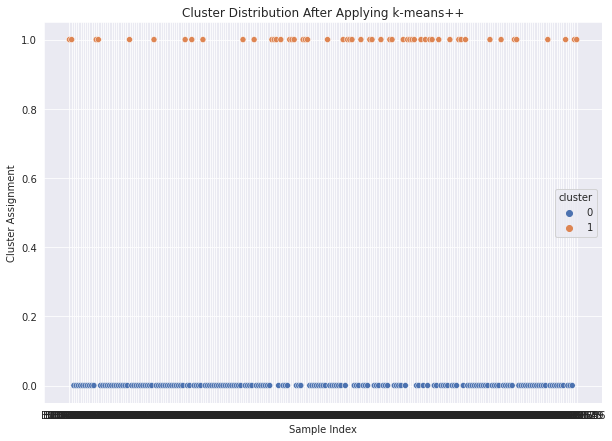

In [220]:
# Kmeans++ still ended up with imbalanced clusters
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_19DMR_nonbaseline_breastNeg_230samples_02182025.csv")

# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply KMeans clustering with k-means++ initialization and more initialization attempts
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(scaled_data)

# Assign the new clusters to the original dataframe
df_kmeans = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results for cluster distribution
print(pivot_df['cluster'].value_counts())

# Visualize the clusters to check if the clusters are well separated
plt.figure(figsize=(10, 7))
sns.scatterplot(x=pivot_df.index, y=kmeans.labels_, hue=pivot_df['cluster'], palette="deep")
plt.title('Cluster Distribution After Applying k-means++')
plt.xlabel('Sample Index')
plt.ylabel('Cluster Assignment')
plt.show()

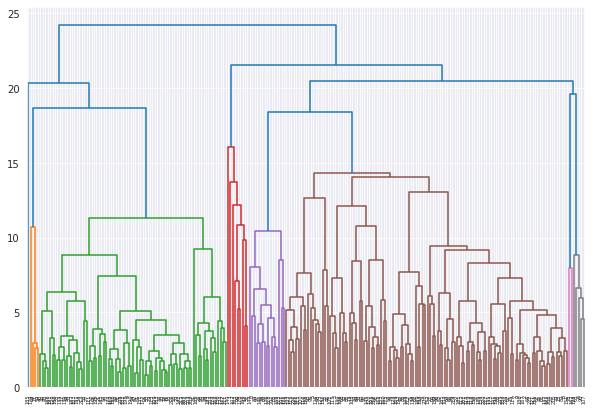

2    147
1     82
Name: cluster, dtype: int64

In [221]:
# hierarchy method with imbalance clusters
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_19DMR_nonbaseline_breastNeg_230samples_02182025.csv")


# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Perform hierarchical clustering
Z = linkage(scaled_data, method='ward')

# Plot dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z)
plt.show()

# Cut the dendrogram at the level that gives two clusters
pivot_df['cluster'] = fcluster(Z, 2, criterion='maxclust')

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)
pivot_df.cluster.value_counts()


In [222]:
# GMM method with imbalance clusters
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_19DMR_nonbaseline_breastNeg_230samples_02182025.csv")

# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
pivot_df['gmm_cluster'] = gmm.fit_predict(scaled_data)

# Assign the clusters back to the original dataframe
df = df.merge(pivot_df[['gmm_cluster']], left_on='run_sample_id', right_index=True)

# Check the new cluster distribution
print(pivot_df['gmm_cluster'].value_counts())


0    118
1    111
Name: gmm_cluster, dtype: int64


In [224]:
# PCA method with imbalance clusters
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_19DMR_nonbaseline_breastNeg_230samples_02182025.csv")


# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Perform PCA
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

# Apply KMeans clustering to the PCA-transformed data
kmeans = KMeans(n_clusters=2, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(pca_data)

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results
pivot_df.cluster.value_counts()

1    172
0     57
Name: cluster, dtype: int64

<Axes: xlabel='cluster', ylabel='adjusted_norm_peak_count'>

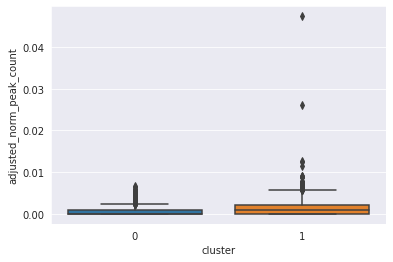

In [225]:
# Check the Kmeans cluster distribution to determine which cluster has higher mol counts
sns.boxplot(x="cluster", y='adjusted_norm_peak_count',data=df_kmeans, showfliers = True)

In [226]:
# All method summary
# Noted after the problematic outlier "B00475983" was removed, all linear methods showed similar classification results
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, fcluster
import umap
from matplotlib_venn import venn2, venn3


# Read in the data 
# Remove the outlier
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_19DMR_nonbaseline_breastNeg_230samples_02182025.csv")
df = df[df['run_sample_id'] != "B00475983"]

# Pivot the table to have region_id as columns and run_sample_id as rows
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Initialize an empty dataframe to collect cluster labels
cluster_results = pd.DataFrame(index=pivot_df.index)

# KMeans++ Clustering
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
cluster_results['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

# Hierarchical Clustering
Z = linkage(scaled_data, method='ward')
cluster_results['hierarchical_cluster'] = fcluster(Z, 2, criterion='maxclust')

# Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
cluster_results['gmm_cluster'] = gmm.fit_predict(scaled_data)

# PCA + KMeans Clustering
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
kmeans_pca = KMeans(n_clusters=2, random_state=0)
cluster_results['pca_cluster'] = kmeans_pca.fit_predict(pca_data)

# UMAP + KMeans Clustering
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(scaled_data)
kmeans_umap = KMeans(n_clusters=2, random_state=0)
cluster_results['umap_cluster'] = kmeans_umap.fit_predict(umap_embedding)

# Check the cluster results
cluster_results.head()


,kmeans_cluster,hierarchical_cluster,gmm_cluster,pca_cluster,umap_cluster
run_sample_id,,,,,
B00460895,1,2,1,0,1
B00460897,1,2,1,0,0
B00460904,0,2,0,1,0
B00460910,0,2,1,1,0
B00460939,0,1,0,1,0


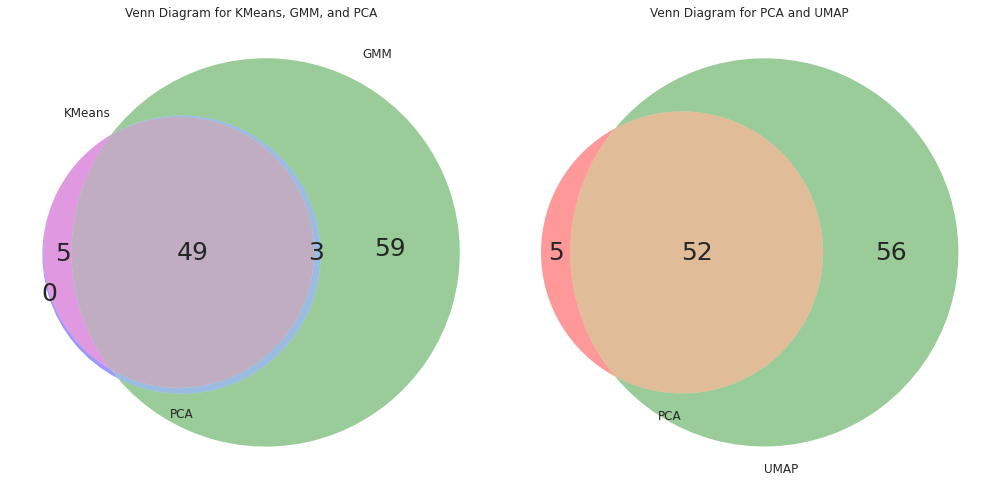

In [227]:
# Check the overlapping condition of all methods 
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_19DMR_nonbaseline_breastNeg_230samples_02182025.csv")
df = df[df['run_sample_id'] != "B00475983"]

# Pivot the table to have region_id as columns and run_sample_id as rows
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Initialize an empty dataframe to collect cluster labels
cluster_results = pd.DataFrame(index=pivot_df.index)

# KMeans++ Clustering
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
cluster_results['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

# # Hierarchical Clustering (renaming 1,2 to 0,1)
# Z = linkage(scaled_data, method='ward')
# cluster_results['hierarchical_cluster'] = fcluster(Z, 2, criterion='maxclust') - 1  # Subtract 1 to convert from 1,2 to 0,1

# Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
cluster_results['gmm_cluster'] = gmm.fit_predict(scaled_data)

# PCA + KMeans Clustering
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
kmeans_pca = KMeans(n_clusters=2, random_state=0)
cluster_results['pca_cluster'] = kmeans_pca.fit_predict(pca_data)

# UMAP + KMeans Clustering
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(scaled_data)
kmeans_umap = KMeans(n_clusters=2, random_state=0)
cluster_results['umap_cluster'] = kmeans_umap.fit_predict(umap_embedding)

# Step 2: Create a set for each cluster assignment (Cluster 0 from all methods for comparison)
kmeans_set = set(cluster_results.index[cluster_results['kmeans_cluster'] == 1])
# hierarchy_set = set(cluster_results.index[cluster_results['hierarchical_cluster'] == 1])
gmm_set = set(cluster_results.index[cluster_results['gmm_cluster'] == 1])
pca_set = set(cluster_results.index[cluster_results['pca_cluster'] == 0])
umap_set = set(cluster_results.index[cluster_results['umap_cluster'] == 1])

# Step 3: Plot Venn Diagrams for pairwise comparison (Complete with 3 methods at a time)
plt.figure(figsize=(14, 7), facecolor='white')
plt.subplot(121)
v = venn3([kmeans_set, gmm_set, pca_set], set_labels=('KMeans', 'GMM', 'PCA'))
for text in v.subset_labels:
    if text:
        text.set_fontsize(25)  # Increase font size
plt.title('Venn Diagram for KMeans, GMM, and PCA')

plt.subplot(122)
v2 = venn2([pca_set, umap_set], set_labels=('PCA', 'UMAP'))
for text in v2.subset_labels:
    if text:
        text.set_fontsize(25)  # Increase font size
plt.title('Venn Diagram for PCA and UMAP')


plt.tight_layout()
plt.show()


In [228]:
# Select the predicted ILD samples by clustering methods (overlapping of all 3 methods)
# Reset the index 
df_cluster_results = cluster_results.reset_index().rename(columns={"index": "run_sample_id"})

# Get the cluster 0 result (high methylation signal group) of all 3 linear clustering algorithm 
df_cluster_results_overlapped = df_cluster_results[(df_cluster_results['kmeans_cluster'] == 1) & (df_cluster_results['gmm_cluster'] == 1) & (df_cluster_results['pca_cluster'] == 0)]

# Save the sample id for cluster 0
High_peak_count_cluster_samples_by_3_cluster_overlap_ids = df_cluster_results_overlapped.run_sample_id.unique()
print(f'The sample size of cluster with higher mol peak counts # is ' + str(len(High_peak_count_cluster_samples_by_3_cluster_overlap_ids)))


The sample size of cluster with higher mol peak counts # is 49


In [229]:
# Add the "sample_type" column based on clustering result
df_dsi_rerun_4 = df_dsi_rerun_3_sub.copy()
df_dsi_rerun_4['sample_type'] = np.nan
df_dsi_rerun_4['sample_type'] = np.where(df_dsi_rerun_4['run_sample_id'].isin(High_peak_count_cluster_samples_by_3_cluster_overlap_ids), 'High_peak_count_cluster_sample', 'Low_peak_count_cluster_sample')
print(df_dsi_rerun_4.sample_type.value_counts())

Low_peak_count_cluster_sample     181
High_peak_count_cluster_sample     49
Name: sample_type, dtype: int64


In [230]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_with_hue(df, col, hue_col, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))
    sns.set_style('darkgrid')

    # Define order for hue_col and col
    hue_order = ['C4D1', 'EOT']
    xcol_order = sorted(df[col].unique())  # Should be ['CSO_Lung', 'Non_CSO_Lung']

    # Create color palette
    hue_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {hue_item: color for hue_item, color in zip(hue_order, hue_colors)}

    # Create boxplot and stripplot
    box = sns.boxplot(data=df, x=col, y="cfDNA_ng", hue=hue_col, hue_order=hue_order,
                      order=xcol_order, palette=color_map, ax=ax, dodge=True, showfliers=False)
    sns.stripplot(data=df, x=col, y="cfDNA_ng", hue=hue_col, hue_order=hue_order,
                  order=xcol_order, color='gray', jitter=0.2, size=4, ax=ax, dodge=True, edgecolor='black', linewidth=0.5)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes, adjusted for hue and position
    for (xcol_type, hue_col_type), group in df.groupby([col, hue_col]):
        n = group.shape[0]
        x_pos = xcol_order.index(xcol_type) + (0.2 * hue_order.index(hue_col_type))
        y_pos = group['cfDNA_ng'].min() * 0.9
        ax.text(x_pos, y_pos, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # **Update pairs for statistical comparisons**: Compare same treatment groups between CSO_Lung and Non_CSO_Lung
    pairs = [
        # (('High_peak_count_cluster_sample', 'C1D1'), ('Low_peak_count_cluster_sample', 'C1D1')),
        (('High_peak_count_cluster_sample', 'C4D1'), ('Low_peak_count_cluster_sample', 'C4D1')),
        (('High_peak_count_cluster_sample', 'EOT'), ('Low_peak_count_cluster_sample', 'EOT')),
    ]

    # Apply statistical annotations
    annotator = Annotator(ax, pairs, data=df, x=col, y="cfDNA_ng", hue=hue_col,
                          order=xcol_order, hue_order=hue_order)
    annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
    annotator.apply_and_annotate()

    # Fix the legend to display both boxes and strips
    handles, labels = ax.get_legend_handles_labels()
    new_labels, new_handles = [], []
    # Ensure each label appears only once
    for handle, label in zip(handles, labels):
        if label not in new_labels:
            new_labels.append(label)
            new_handles.append(handle)
    ax.legend(new_handles, new_labels, title='Visit_name', fontsize=20, loc='best')

    # Set plot labels and title
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample type', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Low_peak_count_cluster_sample vs. High_peak_count_cluster_sample: t-test independent samples, P_val:3.829e-01 t=8.743e-01


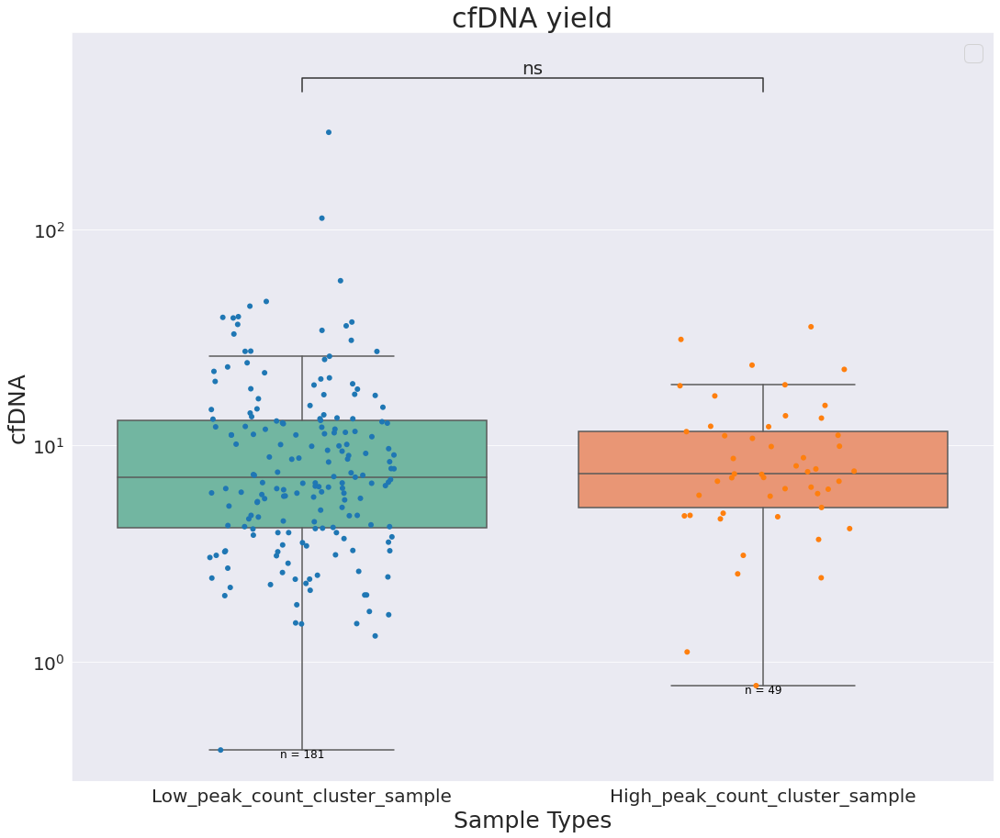

In [231]:
cfDNA_boxplot_with_annotation(df_dsi_rerun_4, 'sample_type', 'cfDNA yield')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

High_peak_count_cluster_sample_C4D1 vs. Low_peak_count_cluster_sample_C4D1: t-test independent samples, P_val:4.695e-01 t=-7.249e-01
High_peak_count_cluster_sample_EOT vs. Low_peak_count_cluster_sample_EOT: t-test independent samples, P_val:3.937e-01 t=-8.588e-01


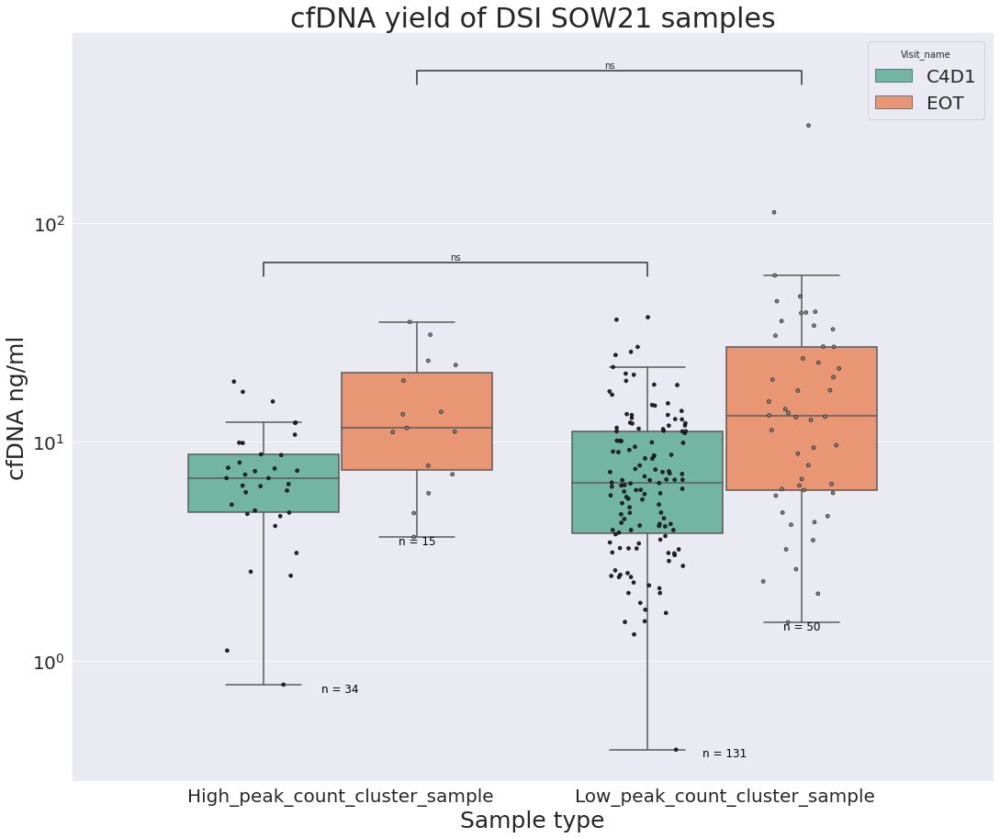

In [232]:
cfDNA_boxplot_with_hue(df_dsi_rerun_4, 'sample_type', 'Visit_name', 'cfDNA yield of DSI SOW21 samples')

##### Clutering by 15 lung-tissue-cancer-specific regions

In [233]:
# Drop the failed samples
df_dsi_rerun_3 = df_dsi_rerun_2.rename(columns={"GHSampleID": "run_sample_id"})
df_dsi_rerun_3 = df_dsi_rerun_3[df_dsi_rerun_3['Sample_status'] == 'SUCCESS']
sample_success = df_dsi_rerun_3.run_sample_id.to_list()
df_consolidated_DSI_DMR_lung_tissue_cancer_1 = df_consolidated_DSI_DMR_lung_tissue_cancer[df_consolidated_DSI_DMR_lung_tissue_cancer['run_sample_id'].isin(sample_success)]

# Select for MB breast caller negative samples and non-baseline sample only 
df_dsi_rerun_3_sub = df_dsi_rerun_3[(df_dsi_rerun_3['Visit_name'] != 'C1D1') & (df_dsi_rerun_3['Tumor_methylation_status'] == 'Not Detected')]
target_neg_non_base_samples = df_dsi_rerun_3_sub.run_sample_id.to_list()
df_consolidated_DSI_DMR_lung_tissue_cancer_2 = df_consolidated_DSI_DMR_lung_tissue_cancer_1[df_consolidated_DSI_DMR_lung_tissue_cancer_1['run_sample_id'].isin(target_neg_non_base_samples)]
print(df_consolidated_DSI_DMR_lung_tissue_cancer_2.run_sample_id.nunique())

# Save the data
df_consolidated_DSI_DMR_lung_tissue_cancer_2.to_csv(f"{work_dir}/df_consolidated_DSI_15DMR_nonbaseline_breastNeg_230samples_02182025.csv", index = False)

230


###### Kmeans,Hierarchy, GMM and PCA methods of clustering ended up with very imbalanced two groups (1 vs 158). This is due to the values across "adjusted_norm_peak_count" many regions are small or close to zero for most of the samples. This suggests that the majority of your data points have very similar characteristics, which is leading to the creation of imbalanced clusters with one large cluster and only a small number of points being separated into a different cluster. UMAP works fine. Unlike PCA, which performs a linear transformation, UMAP captures complex non-linear relationships in the data. I found all Kmean, hierarchy and PCA models only give me (1vs158) and the outlier is the same sample "B00475983" so I removed it. For training 

In [234]:
# Kmeans before imbalance process
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_15DMR_nonbaseline_breastNeg_230samples_02182025.csv")

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply KMeans clustering
kmeans = KMeans(n_clusters=2, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(scaled_data)

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results
pivot_df.cluster.value_counts()

0    229
1      1
Name: cluster, dtype: int64

1    173
0     56
Name: cluster, dtype: int64


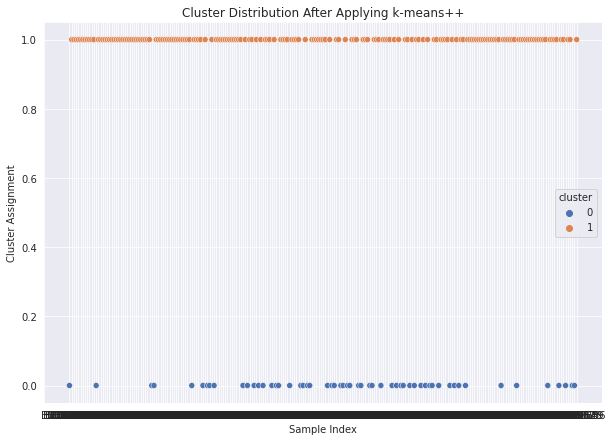

In [236]:
# Kmeans++ still ended up with imbalanced clusters
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_15DMR_nonbaseline_breastNeg_230samples_02182025.csv")

# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply KMeans clustering with k-means++ initialization and more initialization attempts
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(scaled_data)

# Assign the new clusters to the original dataframe
df_kmeans = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results for cluster distribution
print(pivot_df['cluster'].value_counts())

# Visualize the clusters to check if the clusters are well separated
plt.figure(figsize=(10, 7))
sns.scatterplot(x=pivot_df.index, y=kmeans.labels_, hue=pivot_df['cluster'], palette="deep")
plt.title('Cluster Distribution After Applying k-means++')
plt.xlabel('Sample Index')
plt.ylabel('Cluster Assignment')
plt.show()

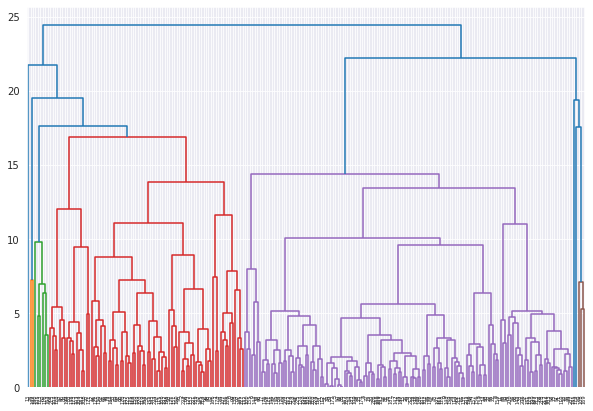

2    140
1     89
Name: cluster, dtype: int64

In [237]:
# hierarchy method with imbalance clusters
from sklearn.preprocessing import StandardScaler
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_15DMR_nonbaseline_breastNeg_230samples_02182025.csv")


# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Perform hierarchical clustering
Z = linkage(scaled_data, method='ward')

# Plot dendrogram
plt.figure(figsize=(10, 7))
dendrogram(Z)
plt.show()

# Cut the dendrogram at the level that gives two clusters
pivot_df['cluster'] = fcluster(Z, 2, criterion='maxclust')

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)
pivot_df.cluster.value_counts()


In [238]:
# GMM method with imbalance clusters
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_15DMR_nonbaseline_breastNeg_230samples_02182025.csv")

# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]

pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Apply Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
pivot_df['gmm_cluster'] = gmm.fit_predict(scaled_data)

# Assign the clusters back to the original dataframe
df = df.merge(pivot_df[['gmm_cluster']], left_on='run_sample_id', right_index=True)

# Check the new cluster distribution
print(pivot_df['gmm_cluster'].value_counts())


0    221
1      8
Name: gmm_cluster, dtype: int64


In [239]:
# PCA method with imbalance clusters
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans

# Pivot the table to have region_id as columns and run_sample_id as rows
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_15DMR_nonbaseline_breastNeg_230samples_02182025.csv")


# Remove the outlier sample
df = df[df['run_sample_id'] != "B00475983"]
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Perform PCA
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)

# Apply KMeans clustering to the PCA-transformed data
kmeans = KMeans(n_clusters=2, random_state=0)
pivot_df['cluster'] = kmeans.fit_predict(pca_data)

# Assign the new clusters to the original dataframe
df = df.merge(pivot_df[['cluster']], left_on='run_sample_id', right_index=True)

# Check the results
pivot_df.cluster.value_counts()

1    172
0     57
Name: cluster, dtype: int64

<Axes: xlabel='cluster', ylabel='adjusted_norm_peak_count'>

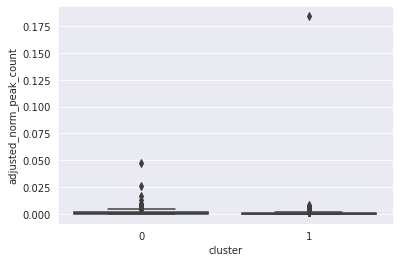

In [240]:
# Check the Kmeans cluster distribution to determine which cluster has higher mol counts
sns.boxplot(x="cluster", y='adjusted_norm_peak_count',data=df_kmeans, showfliers = True)

In [241]:
# All method summary
# Noted after the problematic outlier "B00475983" was removed, all linear methods showed similar classification results
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA
from scipy.cluster.hierarchy import linkage, fcluster
import umap
from matplotlib_venn import venn2, venn3


# Read in the data 
# Remove the outlier
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_15DMR_nonbaseline_breastNeg_230samples_02182025.csv")
df = df[df['run_sample_id'] != "B00475983"]

# Pivot the table to have region_id as columns and run_sample_id as rows
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Initialize an empty dataframe to collect cluster labels
cluster_results = pd.DataFrame(index=pivot_df.index)

# KMeans++ Clustering
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
cluster_results['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

# Hierarchical Clustering
Z = linkage(scaled_data, method='ward')
cluster_results['hierarchical_cluster'] = fcluster(Z, 2, criterion='maxclust')

# Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
cluster_results['gmm_cluster'] = gmm.fit_predict(scaled_data)

# PCA + KMeans Clustering
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
kmeans_pca = KMeans(n_clusters=2, random_state=0)
cluster_results['pca_cluster'] = kmeans_pca.fit_predict(pca_data)

# UMAP + KMeans Clustering
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(scaled_data)
kmeans_umap = KMeans(n_clusters=2, random_state=0)
cluster_results['umap_cluster'] = kmeans_umap.fit_predict(umap_embedding)

# Check the cluster results
cluster_results.head()


,kmeans_cluster,hierarchical_cluster,gmm_cluster,pca_cluster,umap_cluster
run_sample_id,,,,,
B00460895,0,1,0,0,1
B00460897,1,1,0,1,0
B00460904,1,1,0,1,0
B00460910,1,2,0,1,0
B00460939,1,2,0,1,0


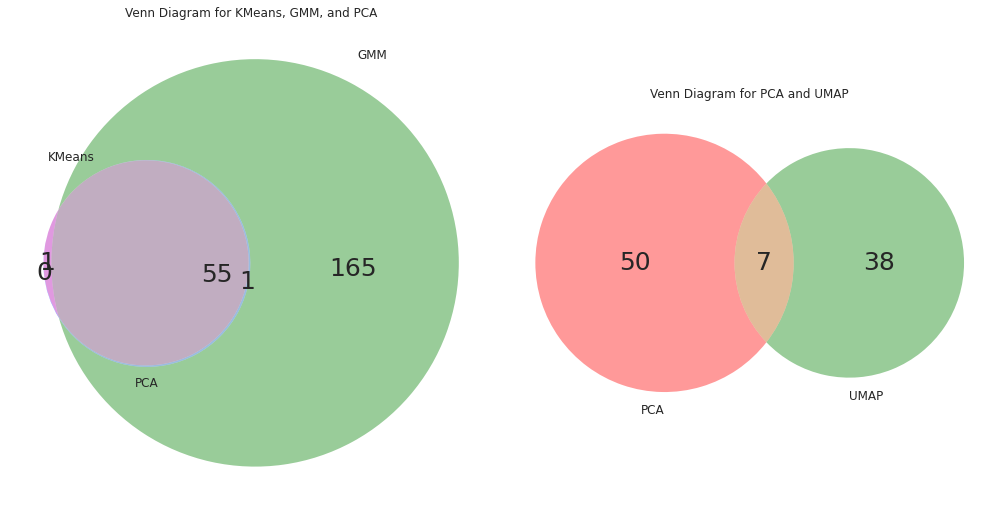

In [245]:
# Check the overlapping condition of all methods 
df = pd.read_csv(f"{work_dir}/df_consolidated_DSI_15DMR_nonbaseline_breastNeg_230samples_02182025.csv")
df = df[df['run_sample_id'] != "B00475983"]

# Pivot the table to have region_id as columns and run_sample_id as rows
pivot_df = df.pivot(index='run_sample_id', columns='region_id', values='adjusted_norm_peak_count')

# Normalize the data
scaler = StandardScaler()
scaled_data = scaler.fit_transform(pivot_df)

# Initialize an empty dataframe to collect cluster labels
cluster_results = pd.DataFrame(index=pivot_df.index)

# KMeans++ Clustering
kmeans = KMeans(n_clusters=2, init='k-means++', n_init=10, random_state=0)
cluster_results['kmeans_cluster'] = kmeans.fit_predict(scaled_data)

# # Hierarchical Clustering (renaming 1,2 to 0,1)
# Z = linkage(scaled_data, method='ward')
# cluster_results['hierarchical_cluster'] = fcluster(Z, 2, criterion='maxclust') - 1  # Subtract 1 to convert from 1,2 to 0,1

# Gaussian Mixture Model
gmm = GaussianMixture(n_components=2, random_state=0)
cluster_results['gmm_cluster'] = gmm.fit_predict(scaled_data)

# PCA + KMeans Clustering
pca = PCA(n_components=2)
pca_data = pca.fit_transform(scaled_data)
kmeans_pca = KMeans(n_clusters=2, random_state=0)
cluster_results['pca_cluster'] = kmeans_pca.fit_predict(pca_data)

# UMAP + KMeans Clustering
reducer = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(scaled_data)
kmeans_umap = KMeans(n_clusters=2, random_state=0)
cluster_results['umap_cluster'] = kmeans_umap.fit_predict(umap_embedding)

# Step 2: Create a set for each cluster assignment (Cluster 0 from all methods for comparison)
kmeans_set = set(cluster_results.index[cluster_results['kmeans_cluster'] == 0])
# hierarchy_set = set(cluster_results.index[cluster_results['hierarchical_cluster'] == 1])
gmm_set = set(cluster_results.index[cluster_results['gmm_cluster'] == 0])
pca_set = set(cluster_results.index[cluster_results['pca_cluster'] == 0])
umap_set = set(cluster_results.index[cluster_results['umap_cluster'] == 1])

# Step 3: Plot Venn Diagrams for pairwise comparison (Complete with 3 methods at a time)
plt.figure(figsize=(14, 7), facecolor='white')
plt.subplot(121)
v = venn3([kmeans_set, gmm_set, pca_set], set_labels=('KMeans', 'GMM', 'PCA'))
for text in v.subset_labels:
    if text:
        text.set_fontsize(25)  # Increase font size
plt.title('Venn Diagram for KMeans, GMM, and PCA')

plt.subplot(122)
v2 = venn2([pca_set, umap_set], set_labels=('PCA', 'UMAP'))
for text in v2.subset_labels:
    if text:
        text.set_fontsize(25)  # Increase font size
plt.title('Venn Diagram for PCA and UMAP')


plt.tight_layout()
plt.show()


In [246]:
# Select the predicted ILD samples by clustering methods (overlapping of all 3 methods)
# Reset the index 
df_cluster_results = cluster_results.reset_index().rename(columns={"index": "run_sample_id"})

# Get the cluster 0 result (high methylation signal group) of all 3 linear clustering algorithm 
df_cluster_results_overlapped = df_cluster_results[(df_cluster_results['kmeans_cluster'] == 0) & (df_cluster_results['gmm_cluster'] == 0) & (df_cluster_results['pca_cluster'] == 0)]

# Save the sample id for cluster 0
High_peak_count_cluster_samples_by_3_cluster_overlap_ids = df_cluster_results_overlapped.run_sample_id.unique()
print(f'The sample size of cluster with higher mol peak counts # is ' + str(len(High_peak_count_cluster_samples_by_3_cluster_overlap_ids)))


The sample size of cluster with higher mol peak counts # is 55


In [247]:
# Add the "sample_type" column based on clustering result
df_dsi_rerun_5 = df_dsi_rerun_3_sub.copy()
df_dsi_rerun_5['sample_type'] = np.nan
df_dsi_rerun_5['sample_type'] = np.where(df_dsi_rerun_5['run_sample_id'].isin(High_peak_count_cluster_samples_by_3_cluster_overlap_ids), 'High_peak_count_cluster_sample', 'Low_peak_count_cluster_sample')
print(df_dsi_rerun_5.sample_type.value_counts())

Low_peak_count_cluster_sample     175
High_peak_count_cluster_sample     55
Name: sample_type, dtype: int64


In [177]:
from statannotations.Annotator import Annotator

def cfDNA_boxplot_with_hue(df, col, hue_col, suffix_title):
    # Update the y score to cfDNA/ml
    df = df.copy()
    df['cfDNA_ng'] = df['cfDNA_ng'] / df['Plasma_ml_input']

    # Set up the figure with original size and grid style
    fig, ax = plt.subplots(figsize=(18, 15))
    sns.set_style('darkgrid')

    # Define order for hue_col and col
    hue_order = ['C4D1', 'EOT']
    xcol_order = sorted(df[col].unique())  # Should be ['CSO_Lung', 'Non_CSO_Lung']

    # Create color palette
    hue_colors = sns.color_palette("Set2", n_colors=len(hue_order))
    color_map = {hue_item: color for hue_item, color in zip(hue_order, hue_colors)}

    # Create boxplot and stripplot
    box = sns.boxplot(data=df, x=col, y="cfDNA_ng", hue=hue_col, hue_order=hue_order,
                      order=xcol_order, palette=color_map, ax=ax, dodge=True, showfliers=False)
    sns.stripplot(data=df, x=col, y="cfDNA_ng", hue=hue_col, hue_order=hue_order,
                  order=xcol_order, color='gray', jitter=0.2, size=4, ax=ax, dodge=True, edgecolor='black', linewidth=0.5)

    # Log scale for the y-axis
    ax.set_yscale('log')

    # Annotate sample sizes, adjusted for hue and position
    for (xcol_type, hue_col_type), group in df.groupby([col, hue_col]):
        n = group.shape[0]
        x_pos = xcol_order.index(xcol_type) + (0.2 * hue_order.index(hue_col_type))
        y_pos = group['cfDNA_ng'].min() * 0.9
        ax.text(x_pos, y_pos, f'n = {n}', ha='center', va='bottom', fontsize=12, color='black')

    # **Update pairs for statistical comparisons**: Compare same treatment groups between CSO_Lung and Non_CSO_Lung
    pairs = [
        (('High_peak_count_cluster_sample', 'C4D1'), ('Low_peak_count_cluster_sample', 'C4D1')),
        (('High_peak_count_cluster_sample', 'EOT'), ('Low_peak_count_cluster_sample', 'EOT')),
    ]

    # Apply statistical annotations
    annotator = Annotator(ax, pairs, data=df, x=col, y="cfDNA_ng", hue=hue_col,
                          order=xcol_order, hue_order=hue_order)
    annotator.configure(test='t-test_ind', text_format='star', loc='inside', verbose=2)
    annotator.apply_and_annotate()

    # Fix the legend to display both boxes and strips
    handles, labels = ax.get_legend_handles_labels()
    new_labels, new_handles = [], []
    # Ensure each label appears only once
    for handle, label in zip(handles, labels):
        if label not in new_labels:
            new_labels.append(label)
            new_handles.append(handle)
    ax.legend(new_handles, new_labels, title='Visit_name', fontsize=20, loc='best')

    # Set plot labels and title
    plt.title(f'{suffix_title}', fontsize=30)
    ax.set_xlabel('Sample type', fontsize=25)
    ax.set_ylabel('cfDNA ng/ml', fontsize=25)
    plt.xticks(fontsize=20)
    plt.yticks(fontsize=20)
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

Low_peak_count_cluster_sample vs. High_peak_count_cluster_sample: t-test independent samples, P_val:3.363e-01 t=9.635e-01


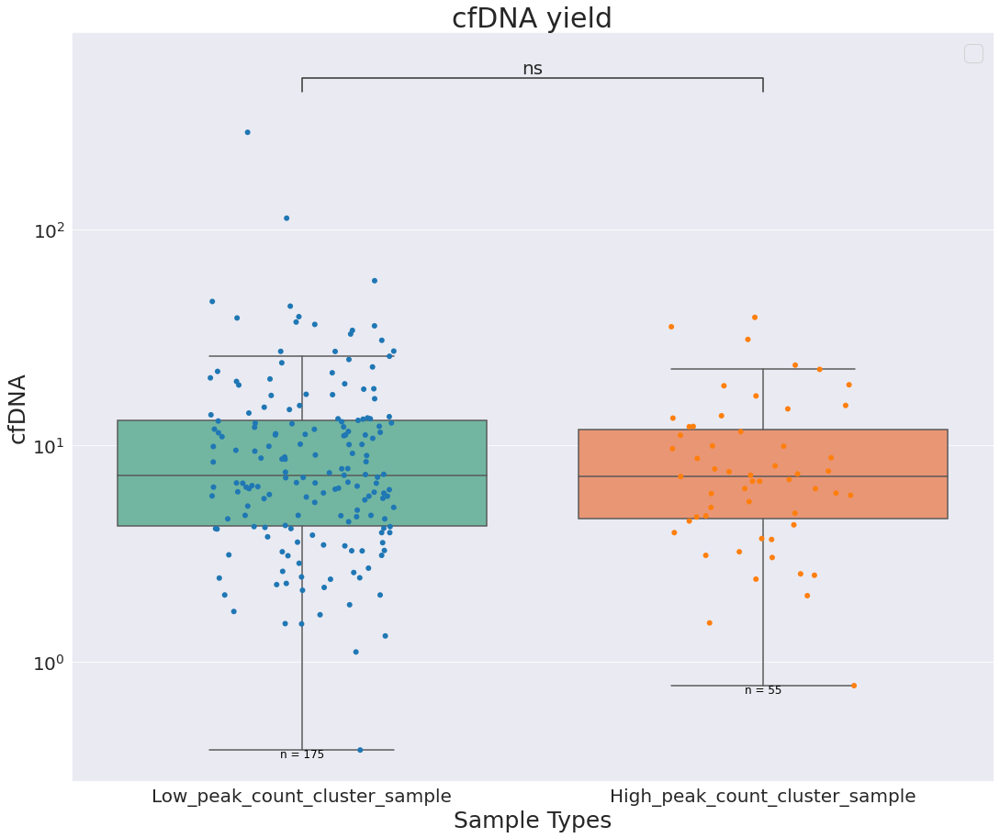

In [248]:
cfDNA_boxplot_with_annotation(df_dsi_rerun_5, 'sample_type', 'cfDNA yield')

p-value annotation legend:
      ns: p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

High_peak_count_cluster_sample_C4D1 vs. Low_peak_count_cluster_sample_C4D1: t-test independent samples, P_val:3.427e-01 t=-9.516e-01
High_peak_count_cluster_sample_EOT vs. Low_peak_count_cluster_sample_EOT: t-test independent samples, P_val:2.741e-01 t=-1.103e+00


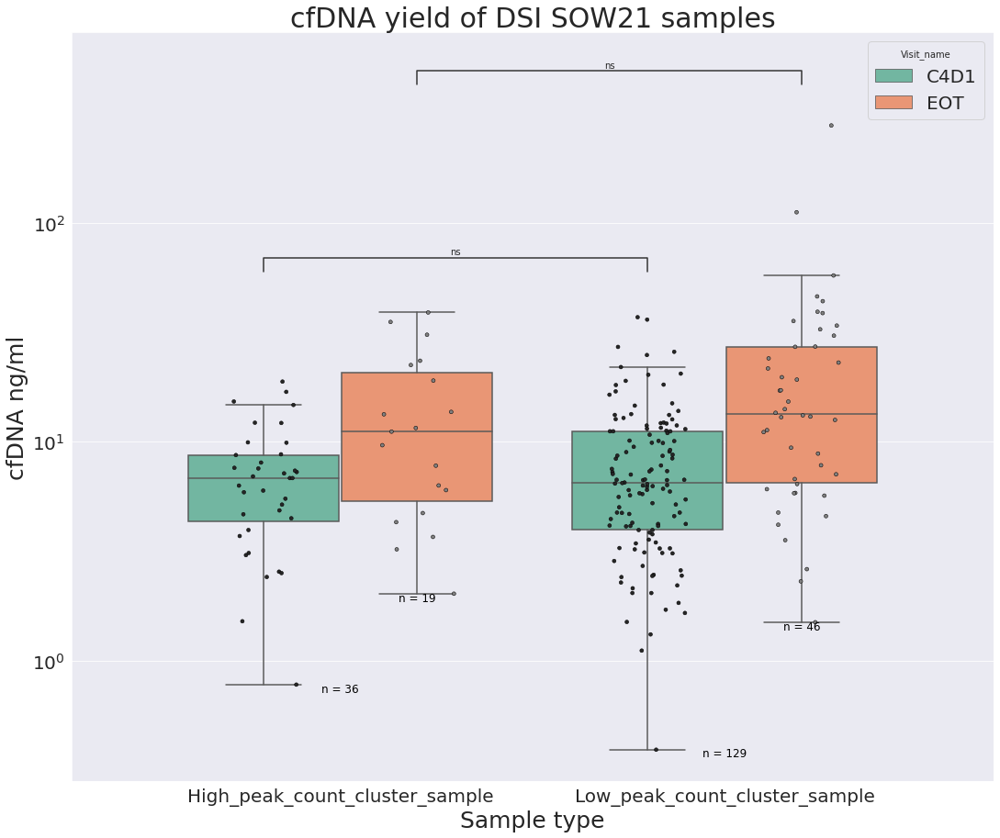

In [249]:
cfDNA_boxplot_with_hue(df_dsi_rerun_5, 'sample_type', 'Visit_name', 'cfDNA yield of DSI SOW21 samples')

# ILD model

## Data processing

In [14]:
# Readin the training data
df_consolidated_inform_DMR_19 = pd.read_csv(f"{work_dir}/df_consolidated_inform_DMR_19_01132025.csv")
print("Total size of sample is " + str(df_consolidated_inform_DMR_19.request_id.nunique()) + "\n") 
print("Total size of region is " + str(df_consolidated_inform_DMR_19.region_id.nunique()) + "\n")

df_consolidated_inform_DMR_19.head()

Total size of sample is 146

Total size of region is 19



,region_id,region_methyl_molecule_count,norm_region_methyl_molecule_count,norm_peak_count,bip_version,request_id,upk_key,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
0,1_50884795_50885470,1,0.000022,0.001009,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-2.991694,0.001019
1,2_63281169_63281518,0,0.000000,0.000000,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.000000,0.000010
2,2_63283795_63284040,1,0.000022,0.001464,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-2.831441,0.001474
3,2_111875207_111875685,0,0.000000,0.000000,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.000000,0.000010
4,4_57521635_57522882,6,0.000130,0.003033,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-2.516667,0.003043


In [ ]:
# # Introduce sample-level methyl score as a feature as well
# # Readin the data
# df_breast_samples_all = pd.read_csv(f"{work_dir}/df_breast_samples_all.csv")

# df_clustering_for_R_heatmap_treatment_with_LR_methyl_score = df_clustering_for_R_heatmap_treatment.merge(df_breast_samples_all[['run_sample_id', 'LR_Breast_score']], on = 'run_sample_id', how = "left")
# df_clustering_for_R_heatmap_treatment_with_LR_methyl_score.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,adjusted_log_norm_peak_count,adjusted_norm_peak_count,sample_type,total_yield,treatmentnotes,treatment,ADC_treatment,Enhertu_treatment,LR_Breast_score
0,A097628801,240301_A01112_0467_AHTGFYDSX7,Sirius-1.1.2-RLS,1_50884795_50885470,9,22,5,2650.40641,0.000076,0.001886,A097628801,-2.722047,0.001896,Low_peak_count_cluster,63.44,Enhertu,Treatment,ADC_treatment,Enhertu_treatment,13.70508
1,A097628801,240301_A01112_0467_AHTGFYDSX7,Sirius-1.1.2-RLS,2_63281169_63281518,16,22,13,2650.40641,0.000136,0.004905,A097628801,-2.308484,0.004915,Low_peak_count_cluster,63.44,Enhertu,Treatment,ADC_treatment,Enhertu_treatment,13.70508
2,A097628801,240301_A01112_0467_AHTGFYDSX7,Sirius-1.1.2-RLS,2_63283795_63284040,4,19,4,2622.75911,0.000034,0.001525,A097628801,-2.813860,0.001535,Low_peak_count_cluster,63.44,Enhertu,Treatment,ADC_treatment,Enhertu_treatment,13.70508
3,A097628801,240301_A01112_0467_AHTGFYDSX7,Sirius-1.1.2-RLS,2_111875207_111875685,1,13,1,2261.58405,0.000008,0.000442,A097628801,-3.344700,0.000452,Low_peak_count_cluster,63.44,Enhertu,Treatment,ADC_treatment,Enhertu_treatment,13.70508
4,A097628801,240301_A01112_0467_AHTGFYDSX7,Sirius-1.1.2-RLS,4_57521635_57522882,28,16,9,2517.13333,0.000238,0.003576,A097628801,-2.445450,0.003586,Low_peak_count_cluster,63.44,Enhertu,Treatment,ADC_treatment,Enhertu_treatment,13.70508


In [15]:
# Reformat the traning data
df_train = df_consolidated_inform_DMR_19.copy()
df_train = df_train[['request_id', 'region_id', 'adjusted_log_norm_peak_count', 'sample_type']]

# Pivot the data to make region_id as columns
df_pivot = df_train.pivot(index='request_id', columns='region_id', values='adjusted_log_norm_peak_count')

# Add the target variable (y-label) back to the reshaped dataframe
df_pivot['sample_type'] = df_train.groupby('request_id')['sample_type'].first()

# Remove the Osimertinib_Control samples for ILD prediction purpose
df_pivot = df_pivot[df_pivot['sample_type'] != 'Osimertinib_Control']

# Reset the index for a cleaner dataframe
df_train = df_pivot.reset_index()
print(df_train.shape)
print(df_train.sample_type.value_counts())
df_train.head()

(51, 21)
IO_Control             27
Prednisone_Positive    17
ILD_Positive            7
Name: sample_type, dtype: int64


region_id,request_id,14_36993454_36993782,17_12877289_12877530,19_17007412_17008006,19_17008123_17008601,19_17008718_17008838,19_18714725_18715204,1_50884795_50885470,20_21694307_21695105,22_19742853_19743435,22_46368034_46368392,2_111875207_111875685,2_63281169_63281518,2_63283795_63284040,4_57521635_57522882,5_134366914_134367034,5_134367172_134367292,6_152622844_152623510,8_72468561_72469244,8_72469349_72469583,sample_type
0,+ve8RMCHlSq0S5faOk1K7A==,-3.278039,-0.702021,-5.000000,-3.093717,-2.473635,-5.000000,-3.309301,-2.832585,-2.822619,-0.902042,-1.970288,-2.276032,-2.260453,-5.000000,-2.471655,-2.714544,-5.000000,-5.000000,-3.278039,IO_Control
1,0tZ3by6lNZizmIyJX+Sj+w==,-2.519457,-2.874135,-2.947098,-3.171926,-5.000000,-5.000000,-3.008121,-2.621942,-2.694831,-5.000000,-5.000000,-2.798977,-5.000000,-5.000000,-2.799426,-2.973704,-5.000000,-2.335982,-2.718605,IO_Control
2,14SgsouQltnftfr+jucfUA==,-1.579284,-1.618874,-1.732242,-1.727968,-5.000000,-1.905676,-1.676752,-1.526148,-1.959263,-1.910003,-1.403579,-1.418647,-1.780161,-1.685292,-1.584434,-1.745271,-1.747487,-1.328124,-1.542453,IO_Control
3,1Uqg8l3WcXYdGMHS29X5Xw==,-1.781958,-1.890580,-1.775262,-1.737675,-5.000000,-2.172817,-2.109666,-1.683038,-2.449863,-2.169696,-1.750958,-1.824700,-1.977188,-5.000000,-2.159742,-2.166090,-1.973561,-2.539075,-1.730625,Prednisone_Positive
4,1ZsC/ExKFPjIqgXaQczubA==,-1.410978,-2.980601,-5.000000,-5.000000,-5.000000,-2.390447,-2.397929,-1.203238,-2.271390,-3.027458,-5.000000,-0.608361,-0.935516,-2.490732,-2.385520,-2.992261,-5.000000,-0.795986,-1.088332,IO_Control


In [16]:
# Reformat the traning data using all thre S3 regions
df_train_all_regions = df_consolidated_inform_DMR.copy()
df_train_all_regions = df_train_all_regions[['request_id', 'region_id', 'adjusted_log_norm_peak_count', 'sample_type']]

# Pivot the data to make region_id as columns
df_pivot = df_train_all_regions.pivot(index='request_id', columns='region_id', values='adjusted_log_norm_peak_count')

# Add the target variable (y-label) back to the reshaped dataframe
df_pivot['sample_type'] = df_train_all_regions.groupby('request_id')['sample_type'].first()

# Remove the Osimertinib_Control samples for ILD prediction purpose
df_pivot = df_pivot[df_pivot['sample_type'] != 'Osimertinib_Control']

# Reset the index for a cleaner dataframe
df_train_all_regions = df_pivot.reset_index()
print(df_train_all_regions.shape)
print(df_train_all_regions.sample_type.value_counts())
df_train_all_regions.head()

(51, 27759)
IO_Control             27
Prednisone_Positive    17
ILD_Positive            7
Name: sample_type, dtype: int64


region_id,request_id,10_100027866_100028093,10_100028189_100028526,10_100206158_100206745,10_100227419_100227757,10_100991816_100991936,10_100992030_100992494,10_100992581_100992928,10_100993508_100994820,10_100995925_100996250,10_101089032_101089152,10_101089264_101090195,10_101190125_101190944,10_101279861_101280585,10_101283159_101283487,10_101290447_101291011,10_101292266_101292737,10_101292852_101292972,10_101293087_101293441,10_101294596_101294944,10_101295051_101295171,10_101295393_101295626,10_101296692_101297263,10_101300099_101300827,10_101379444_101379917,10_101380029_101381445,10_101418869_101419703,10_101491598_101492371,10_101769028_101769490,10_101769599_101770061,10_101945264_101946150,10_101989128_101989533,10_102027002_102027446,10_102045939_102046638,10_102106080_102107018,10_102107250_102107604,10_102133022_102133830,10_102241715_102242662,10_102289040_102289787,10_102295463_102295583,10_102295699_102295937,10_102413666_102414176,10_102414361_102414481,10_102414551_102415106,10_102415199_102415626,10_102415928_102416226,10_102430580_102431000,10_102440558_102441011,10_102469625_102470433,10_102473233_102473588,10_102475371_102475678,10_102483809_102484537,10_102488875_102490084,10_102490181_102491162,10_102495167_102495287,10_102495395_102495621,10_102497132_102497796,10_102499125_102500149,10_102501199_102502342,10_102503788_102504016,10_102504132_102504714,10_102504820_102505061,10_102505172_102506214,10_102507370_102508358,10_102508441_102508923,10_102509419_102509651,10_102586339_102587196,10_102587322_102587561,10_102587679_102588515,10_102588725_102588845,10_102589065_102589624,10_102672178_102673159,10_102729087_102729735,10_102746715_102747500,10_102756638_102757990,10_102758654_102759494,10_102790618_102791548,10_102791768_102792113,10_102802532_102802998,10_102809954_102810074,10_102810202_102810322,10_102819792_102821194,10_102822308_102822970,10_102826129_102826836,10_102826951_102827778,10_102890972_102892132,10_102893922_102894710,10_102894802_102895276,10_102899274_102899588,10_102899823_102900621,10_102905776_102905896,10_102906441_102906561,10_102973432_102973731,10_102974506_102975867,10_102976314_102976550,10_102976806_102977861,10_102978699_102979215,10_102982158_102982833,10_102983059_102983179,10_102984393_102984711,10_102985003_102985564,10_102986377_102987177,10_102987293_102987527,10_102988094_102988559,10_102988778_102990284,10_102995987_102996213,10_102996294_102996414,10_102996630_102996857,10_102998224_102998464,10_102998592_102998712,10_103043956_103044312,10_103051073_103051690,10_103051804_103052371,10_103052474_103052594,10_103113724_103113953,10_103114038_103114497,10_103326369_103326587,10_103329232_103329924,10_103330261_103330496,10_103347530_103348256,10_1033709_1034672,10_103453772_103454220,10_103454417_103454537,10_103454756_103454876,10_103534958_103535682,10_103535804_103535924,10_103536047_103536288,10_103538901_103539543,10_103539626_103539960,10_103543050_103543389,10_103577320_103577878,10_103577965_103578535,10_103599655_103599775,10_103600235_103600847,10_103603617_103603737,10_103815406_103816110,10_103873998_103874354,10_103874469_103874589,10_103874704_103874824,10_103874939_103875059,10_103879634_103879871,10_103879991_103880111,10_103880229_103880470,10_103880589_103880709,10_103892271_103893695,10_103911872_103912549,10_103986039_103986269,10_103989590_103990396,10_103990513_103991788,10_104000957_104001713,10_104004957_104005734,10_104153700_104154769,10_104154883_104155717,10_104159120_104159586,10_104168669_104168900,10_104169108_104169228,10_104170119_104170712,10_104178391_104178767,10_104179154_104179548,10_104179659_104179779,10_104179856_104180173,10_104180511_104182131,10_104191945_104192528,10_104209693_104209813,10_104209926_104211018,10_104221001_104221473,10_104261615_104262086,10_104262185_104262628,10_104263600_104264561,10_104401728_104401968,10_104402090_104402696,10_104402791_104403029,10_104403145_104403265,10_104403380_104403854,10_1

In [17]:
# # Handle the missing values in region_id
df_train_1 = df_train.copy()
# # Method 1: Imputation with Median
# df_train_1 = df_train.copy()
# df_train_1.fillna(df_train_1.median(), inplace=True)
# df_train_1.head()

# # Method 2: KNN Imputation
# from sklearn.impute import KNNImputer
# df_train_1 = df_train.copy()
# # Initialize the KNNImputer (arbitrary choice)
# imputer = KNNImputer(n_neighbors=3)

# # Apply KNNImputer to the numeric columns 
# imputed_array = imputer.fit_transform(df_train_1.iloc[:, 1:-1])

# # Convert the result back to a DataFrame, keeping the same column names
# df_train_1 = pd.DataFrame(imputed_array, columns=df_train_1.columns[1:-1])
# df_train_1.head()

In [ ]:
# import numpy as np
# from sklearn.impute import KNNImputer
# from sklearn.model_selection import cross_val_score
# from sklearn.ensemble import RandomForestClassifier

# # Define the range of n_neighbors to test
# neighbor_values = [3, 5, 7, 10]

# # Prepare data
# X = df_train.iloc[:, 1:-1]  # Features
# y = df_train['sample_type']  # Labels

# # Results dictionary to store model performance for each n_neighbors
# results = {}

# for n in neighbor_values:
#     # Apply KNN imputation
#     imputer = KNNImputer(n_neighbors=n)
#     X_imputed = imputer.fit_transform(X)
    
#     # Train a model (e.g., Random Forest) and evaluate using cross-validation
#     model = RandomForestClassifier(random_state=42)
#     scores = cross_val_score(model, X_imputed, y, cv=5, scoring='accuracy')
#     results[n] = np.mean(scores)

# # Display results
# for n, score in results.items():
#     print(f"n_neighbors = {n}, Accuracy = {score:.4f}")


## Model Training (Quick try)

### Split dataset

In [ ]:
# Feature splitting
# Get ground truth data 
y = np.where(df_train_1['sample_type'] == "ILD_Negative" ,0,1)
X = df_train_1.drop(['run_sample_id', 'sample_type'], axis=1)

In [21]:
from sklearn import model_selection

# Reserve 20% for testing
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, y, test_size=0.2, random_state=42)
print('training data has %d observation with %d features'% X_train.shape)
print('test data has %d observation with %d features'% X_test.shape)

training data has 116 observation with 27757 features
test data has 30 observation with 27757 features


In [ ]:
# Under sampling

# from imblearn.under_sampling import RandomUnderSampler
# from sklearn import model_selection


# RandomUnderSampler = RandomUnderSampler()
# X_resampled, y_resampled = RandomUnderSampler.fit_sample(X, y)

# # Reserve 20% for testing
# X_train, X_test, y_train, y_test = model_selection.train_test_split(X_resampled, y_resampled, test_size=0.2)
# print('training data has %d observation with %d features'% X_train.shape)
# print('test data has %d observation with %d features'% X_test.shape)

In [45]:
# Standarized the data
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [46]:
#title build models
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from xgboost import XGBClassifier
# Logistic Regression
classifier_logistic = LogisticRegression(random_state=42)

# K Nearest Neighbors
classifier_KNN = KNeighborsClassifier()

# SVM
classifier_SVC = SVC(random_state=42)

# Random Forest
classifier_RF = RandomForestClassifier(random_state=42)

# XGB
classifier_XGB = XGBClassifier(random_state=42)


In [47]:
# LR model accuracy performance quick check
classifier_logistic.fit(X_train, y_train)
y_pred = classifier_logistic.predict(X_test)
classifier_logistic.score(X_test, y_test)

0.9259259259259259

In [48]:
# K-Fold Cross-Validation
from sklearn.model_selection import StratifiedKFold
cv = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

In [49]:
# Use 10-fold Cross Validation to get the accuracy for different models
# model_names = ['Logistic Regression','KNN','Random Forest','SVM', 'XGBoost']
model_names = ['Logistic Regression','KNN','Random Forest','SVM']

# model_list = [classifier_logistic, classifier_KNN, classifier_RF, classifier_SVC, classifier_XGB]
model_list = [classifier_logistic, classifier_KNN, classifier_RF, classifier_SVC]

count = 0

for classifier in model_list:
    cv_score = model_selection.cross_val_score(classifier, X_train, y_train, cv=cv)
    # print(cv_score)
    print('Model accuracy of %s is: %.3f'%(model_names[count],cv_score.mean()))
    count += 1

Model accuracy of Logistic Regression is: 0.972
Model accuracy of KNN is: 0.935
Model accuracy of Random Forest is: 0.990
Model accuracy of SVM is: 0.963


In [50]:
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold

# Explore for the fold choice
results_5fold = cross_val_score(RandomForestClassifier(random_state=42), X, y, cv=5, scoring='accuracy')
results_10fold = cross_val_score(RandomForestClassifier(random_state=42), X, y, cv=10, scoring='accuracy')

print(f"5-Fold CV Accuracy: Mean = {results_5fold.mean():.4f}, Std = {results_5fold.std():.4f}")
print(f"10-Fold CV Accuracy: Mean = {results_10fold.mean():.4f}, Std = {results_10fold.std():.4f}")


5-Fold CV Accuracy: Mean = 1.0000, Std = 0.0000
10-Fold CV Accuracy: Mean = 1.0000, Std = 0.0000


### Model Training and Selection

#### Use Grid Search to Find Optimal Hyperparameters

In [219]:
from sklearn.model_selection import GridSearchCV

# helper function for printing out grid search results
def print_grid_search_metrics(gs):
    print ("Best score: %0.3f" % gs.best_score_)
    print ("Best parameters set:")
    best_parameters = gs.best_params_
    for param_name in sorted(parameters.keys()):
        print("\t%s: %r" % (param_name, best_parameters[param_name]))

#### Find Optimal Hyperparameters: LinearRegression

In [220]:
# Possible hyperparamter options for Logistic Regression Regularization
parameters = {
    'penalty': ['l1', 'l2'],
    'C': np.logspace(-3, 3, 7),  # Search on a log scale
    'solver': ['liblinear']  # 'liblinear' supports both l1 and l2 penalties
}
Grid_LR = GridSearchCV(LogisticRegression(),parameters, cv=10)
Grid_LR.fit(X_train, y_train)
print_grid_search_metrics(Grid_LR)
best_LR_model = Grid_LR.best_estimator_

Best score: 0.981
Best parameters set:
	C: 1.0
	penalty: 'l1'
	solver: 'liblinear'


In [105]:
# Possible hyperparamter options for Random Forest--choose the best number of trees
parameters = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}
Grid_RF = GridSearchCV(RandomForestClassifier(),parameters, cv=10)
Grid_RF.fit(X_train, y_train)
print_grid_search_metrics(Grid_RF)
best_RF_model = Grid_RF.best_estimator_

Best score: 0.963
Best parameters set:
	max_depth: None
	min_samples_leaf: 1
	min_samples_split: 10
	n_estimators: 100


In [104]:
# Possible hyperparamter options for KNN --choose the best k
parameters = {
    'n_neighbors': [3, 5, 7, 10],
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # Manhattan (p=1) and Euclidean (p=2) distances
}
Grid_KNN = GridSearchCV(KNeighborsClassifier(),parameters, cv=10)
Grid_KNN.fit(X_train, y_train)
print_grid_search_metrics(Grid_KNN)
best_KNN_model = Grid_KNN.best_estimator_

Best score: 0.925
Best parameters set:
	n_neighbors: 3
	p: 1
	weights: 'uniform'


In [ ]:
# Possible hyperparamter options for XGBoost 
parameters = {
    'max_depth': [3, 5, 10],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'subsample': [0.7, 0.8, 0.9],
    'colsample_bytree': [0.7, 0.8, 0.9]
}

Grid_XGB = GridSearchCV(classifier_XGB,parameters, cv=10)
Grid_XGB.fit(X_train, y_train)
print_grid_search_metrics(Grid_XGB)
best_XGB_model = Grid_XGB.best_estimator_

### Model Evaluation - Confusion Matrix (Precision, Recall, Accuracy)

#### Evaluate all models

In [221]:
from sklearn.metrics import classification_report, confusion_matrix

# Generate and print a detailed classification report
y_pred = best_RF_model.predict(X_test)
print("Classification Report:")
print(classification_report(y_test, y_pred, target_names=["ILD_Negative", "ILD_Positive"]))

# Compute and display confusion matrix
cm = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:")
print(cm)


Classification Report:
              precision    recall  f1-score   support

ILD_Negative       0.89      1.00      0.94        24
ILD_Positive       0.00      0.00      0.00         3

    accuracy                           0.89        27
   macro avg       0.44      0.50      0.47        27
weighted avg       0.79      0.89      0.84        27

Confusion Matrix:
[[24  0]
 [ 3  0]]


In [222]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Example for Random Forest
y_pred_proba = best_RF_model.predict_proba(X_test)[:, 1]
metrics = {
    'Accuracy': accuracy_score(y_test, y_pred),
    'Precision': precision_score(y_test, y_pred),
    'Recall': recall_score(y_test, y_pred),
    'F1 Score': f1_score(y_test, y_pred),
    'ROC AUC': roc_auc_score(y_test, y_pred_proba)
}
print(metrics)


{'Accuracy': 0.8888888888888888, 'Precision': 0.0, 'Recall': 0.0, 'F1 Score': 0.0, 'ROC AUC': 0.9305555555555556}


In [223]:
# pip install mlxtend


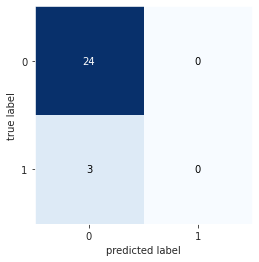

In [224]:
from mlxtend.evaluate import confusion_matrix
from mlxtend.plotting import plot_confusion_matrix

# Plot confusion matrix
cm = confusion_matrix(y_target=y_test, y_predicted=y_pred, binary=True)
fig, ax = plot_confusion_matrix(conf_mat=cm)
plt.show()


### Model Evaluation - ROC & AUC

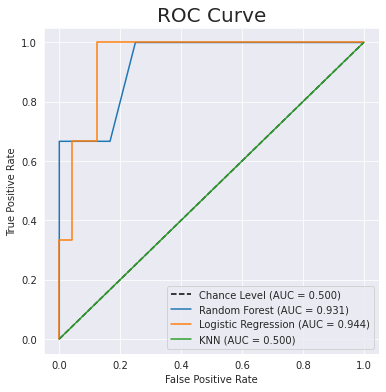

Random Forest AUC: 0.931
Logistic Regression AUC: 0.944
KNN AUC: 0.500


In [228]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
import seaborn as sns

# Function to calculate ROC and AUC for multiple models
def plot_roc_auc(models, X_test, y_test):
    """
    Plots the ROC curves and calculates AUC for multiple models.
    
    Parameters:
        models (dict): Dictionary of models with keys as model names and values as trained model objects.
        X_test (ndarray): Test features.
        y_test (ndarray): Test labels.
        
    Returns:
        None
    """
    plt.figure(figsize=(6, 6))
    sns.set_style('darkgrid')
    
    plt.plot([0, 1], [0, 1], 'k--', label='Chance Level (AUC = 0.500)')
    
    auc_scores = {}
    
    for model_name, model in models.items():
        # Predict probabilities and calculate ROC
        y_pred_proba = model.predict_proba(X_test)[:, 1]
        fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
        auc_score = auc(fpr, tpr)
        auc_scores[model_name] = auc_score
        
        # Plot ROC curve
        plt.plot(fpr, tpr, label=f'{model_name} (AUC = {auc_score:.3f})')
    
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve', fontsize=20)
    plt.legend(loc='best', fontsize=10)
    plt.show()
    
    # Print AUC scores
    for model_name, auc_score in auc_scores.items():
        print(f'{model_name} AUC: {auc_score:.3f}')



# Run the function
models = {
    'Random Forest': best_RF_model,
    'Logistic Regression': best_LR_model,
    'KNN': best_KNN_model,
    # Uncomment if XGBoost is used
    # 'XGBoost': best_XGB_model
}

plot_roc_auc(models, X_test, y_test)


## Model training (all merged)

#### LASSO LR and RF feature selection from all LR regions

In [18]:
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Prepare data (assuming df_train_all_regions contains all 27.7k regions)
y = np.where((df_train_all_regions['sample_type'] == "Prednisone_Positive") | (df_train_1['sample_type'] == "ILD_Positive"), 1, 0)
X = df_train_all_regions.drop(['request_id', 'sample_type'], axis=1)

# Define hyperparameter grid for LASSO (L1 regularization)
parameters = {
    'penalty': ['l1'],  # Use L1 regularization
    'C': np.logspace(-3, 3, 7),  # Regularization strength on a log scale
    'solver': ['liblinear']  # 'liblinear' supports L1 penalty
}

# Perform grid search with Logistic Regression
Grid_LR = GridSearchCV(LogisticRegression(), parameters, cv=10, scoring='roc_auc')
Grid_LR.fit(X, y)

# Extract the best model
best_LR_model = Grid_LR.best_estimator_

# Print the best parameters and coefficients
print("Best Parameters:", Grid_LR.best_params_)
print("Number of Features with Non-Zero Coefficients:", np.sum(best_LR_model.coef_[0] != 0))

# Extract important features
non_zero_indices = np.where(best_LR_model.coef_[0] != 0)[0]
important_features = X.columns[non_zero_indices]
print("Selected Features:", important_features)

print(important_features)


Best Parameters: {'C': 10.0, 'penalty': 'l1', 'solver': 'liblinear'}
Number of Features with Non-Zero Coefficients: 514
Selected Features: Index(['10_102490181_102491162', '10_102507370_102508358',
       '10_102976806_102977861', '10_105212163_105212283',
       '10_111216361_111216886', '10_118764067_118765138',
       '10_124221216_124222166', '10_128076132_128076848',
       '10_130338738_130339187', '10_133109252_133109493',
       ...
       '9_19464899_19465130', '9_34591408_34592112', '9_35490233_35490353',
       '9_37036619_37037330', '9_504064_505327', '9_79628864_79628984',
       '9_841250_842133', '9_87283040_87283932', '9_93955309_93956330',
       '9_972520_972834'],
      dtype='object', name='region_id', length=514)
Index(['10_102490181_102491162', '10_102507370_102508358',
       '10_102976806_102977861', '10_105212163_105212283',
       '10_111216361_111216886', '10_118764067_118765138',
       '10_124221216_124222166', '10_128076132_128076848',
       '10_130338738

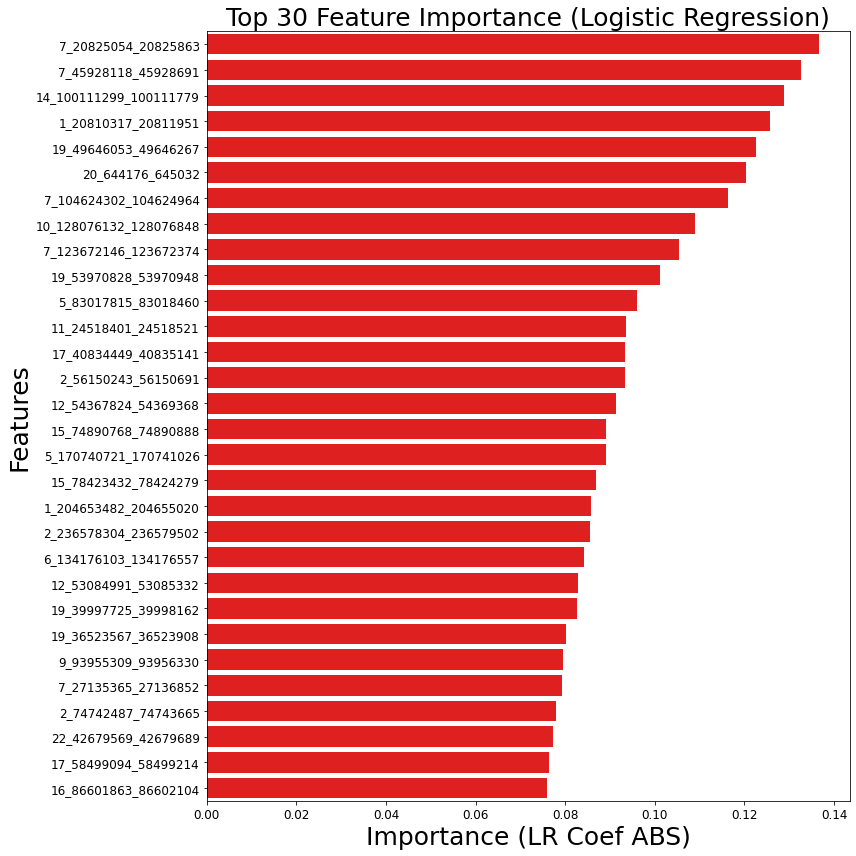

In [21]:
# Plot the feature importance
important_features = df_train_all_regions.drop(['request_id', 'sample_type'], axis=1).columns  # Feature names from your dataset
coefficients = best_LR_model.coef_[0]  # Coefficients from the best LR model

# Create a dataframe with selected features and their coefficients
df_feature_importance = pd.DataFrame({
    'Feature': important_features,
    # 'Importance': best_LR_model.coef_[0][non_zero_indices]
    'Importance': np.abs(coefficients)
}).sort_values(by='Importance', ascending=False)

# Plot all importance features
# plt.figure(figsize=(15, 12))
# sns.barplot(y='Feature', x='Importance', data=df_feature_importance, color='gray')
# plt.title('Feature Importance', fontsize=16)
# plt.xlabel('Importance (LR Coef ABS)', fontsize=14)
# plt.ylabel('Features', fontsize=14)
# plt.xticks(fontsize=12)
# plt.yticks(fontsize=12)
# plt.tight_layout()
# plt.show()

# Filter for features with non-zero importance
df_feature_importance = df_feature_importance[df_feature_importance['Importance'] > 0]

# Sort and select the top N features
top_n = 30  # Number of top features to display
df_feature_importance = df_feature_importance.sort_values(by='Importance', ascending=False).head(top_n)

# Dynamically adjust figure size based on the number of features
plt.figure(figsize=(12, 0.4 * len(df_feature_importance)))

# Plot
sns.barplot(y='Feature', x='Importance', data=df_feature_importance, color='red')
plt.title(f'Top {top_n} Feature Importance (Logistic Regression)', fontsize=25)
plt.xlabel('Importance (LR Coef ABS)', fontsize=25)
plt.ylabel('Features', fontsize=25)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

In [22]:
# Convert `region_id_overlap` to a set
region_id_overlap_set = set(region_id_overlap)

# Find overlap between top LR features and the 19 `region_id_overlap`
top_lr_features = df_feature_importance.head(top_n)
overlap_top_lr_19 = set(top_lr_features['Feature']).intersection(region_id_overlap_set)

# Print results
print(f"Number of Overlapping Features Between LR Top {top_n} and Region ID Overlap: {len(overlap_top_lr_19)}")
print(f"Overlapping Features (LR Top {top_n} and Region ID Overlap): {sorted(list(overlap_top_lr_19))}")

Number of Overlapping Features Between LR Top 30 and Region ID Overlap: 0
Overlapping Features (LR Top 30 and Region ID Overlap): []


In [23]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV

# Prepare data (same as before)
y = np.where((df_train_all_regions['sample_type'] == "Prednisone_Positive") | 
             (df_train_all_regions['sample_type'] == "ILD_Positive"), 1, 0)
X = df_train_all_regions.drop(['request_id', 'sample_type'], axis=1)

# Define hyperparameter grid for Random Forest
rf_parameters = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Perform grid search with Random Forest
rf_grid = GridSearchCV(RandomForestClassifier(random_state=42), rf_parameters, cv=10, scoring='roc_auc', n_jobs=-1)
rf_grid.fit(X, y)

# Extract the best model
best_rf_model = rf_grid.best_estimator_

# Print the best parameters
print("Best Parameters:", rf_grid.best_params_)

# Get feature importance from the Random Forest model
importances = best_rf_model.feature_importances_  # Feature importance scores
important_features_rf = X.columns  # Feature names

print("Selected Features:", important_features_rf)

# Set a threshold for feature importance
# Create a dataframe for feature importance
df_rf_feature_importance = pd.DataFrame({
    'Feature': important_features_rf,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

threshold = 0.002  # Retain features with importance > 0.001
selected_features_rf = df_rf_feature_importance[df_rf_feature_importance['Importance'] > threshold]

print(f"Number of Selected Features: {len(selected_features_rf)}")
print(selected_features_rf)

Best Parameters: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 2, 'n_estimators': 200}
Selected Features: Index(['10_100027866_100028093', '10_100028189_100028526',
       '10_100206158_100206745', '10_100227419_100227757',
       '10_100991816_100991936', '10_100992030_100992494',
       '10_100992581_100992928', '10_100993508_100994820',
       '10_100995925_100996250', '10_101089032_101089152',
       ...
       '9_99381829_99382070', '9_99416897_99417122', '9_99417237_99417922',
       '9_99540057_99540648', '9_99616373_99617055', '9_99637671_99638310',
       '9_99800960_99801864', '9_99983156_99983276', '9_99983497_99983617',
       '9_99983830_99983950'],
      dtype='object', name='region_id', length=27757)
Number of Selected Features: 93
                      Feature  Importance
25017       7_4922379_4923548    0.007360
1594       11_1330273_1331280    0.005587
938      10_71812321_71813587    0.005165
4716   14_100111299_100111779    0.005106
5720     15_317

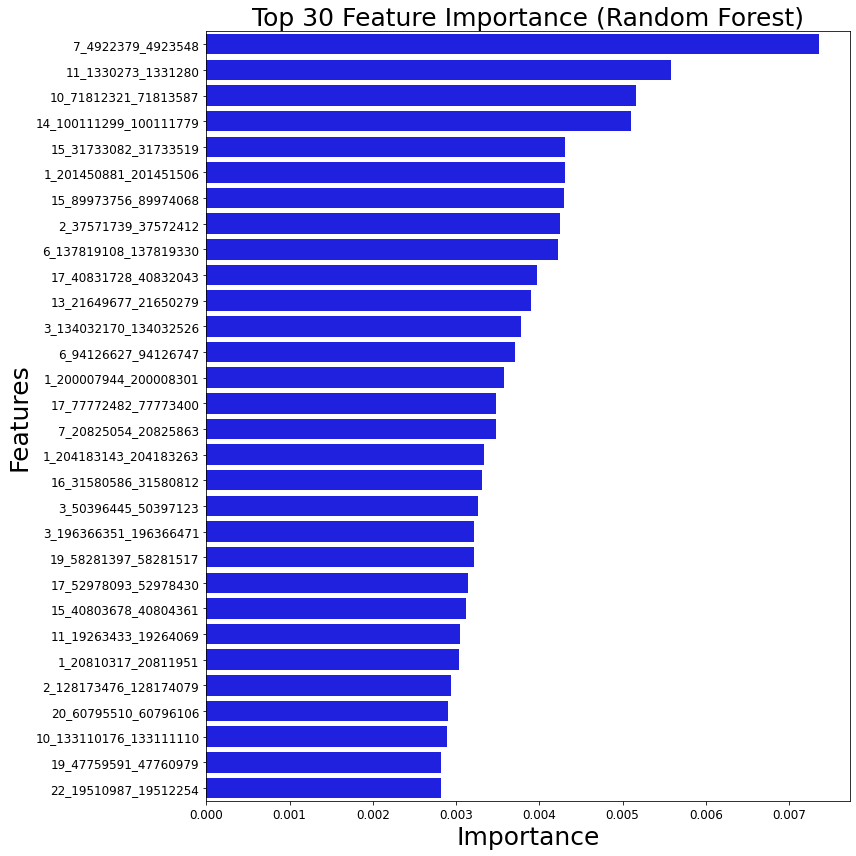

In [32]:
# Create a dataframe for feature importance
df_rf_feature_importance = pd.DataFrame({
    'Feature': important_features_rf,
    'Importance': importances
}).sort_values(by='Importance', ascending=False)

# plot all the regions
# # Plot the feature importance
# plt.figure(figsize=(15, 12))
# sns.barplot(y='Feature', x='Importance', data=df_rf_feature_importance[:30], color='gray')  # Top 30 features
# plt.title('Feature Importance (Random Forest)', fontsize=16)
# plt.xlabel('Importance Score', fontsize=14)
# plt.ylabel('Features', fontsize=14)
# plt.xticks(fontsize=12)
# plt.yticks(fontsize=12)
# plt.tight_layout()
# plt.show()

# Filter for features with non-zero importance
df_rf_feature_importance = df_rf_feature_importance[df_rf_feature_importance['Importance'] > 0]

# Sort and select the top N features
top_n = 30  # Number of top features to display
df_rf_feature_importance = df_rf_feature_importance.sort_values(by='Importance', ascending=False).head(top_n)

# Dynamically adjust figure size based on the number of features
plt.figure(figsize=(12, 0.4 * len(df_rf_feature_importance)))

# Plot
sns.barplot(y='Feature', x='Importance', data=df_rf_feature_importance, color='blue')
plt.title(f'Top {top_n} Feature Importance (Random Forest)', fontsize=25)
plt.xlabel('Importance', fontsize=25)
plt.ylabel('Features', fontsize=25)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()

In [26]:
# Convert `region_id_overlap` to a set
region_id_overlap_set = set(region_id_overlap)

# Find overlap between top LR features and the 19 `region_id_overlap`
top_rf_features = df_rf_feature_importance.head(top_n)
overlap_top_rf_19 = set(top_rf_features['Feature']).intersection(region_id_overlap_set)

# Print results
print(f"Number of Overlapping Features Between RF Top {top_n} and Region ID Overlap: {len(overlap_top_rf_19)}")
print(f"Overlapping Features (RF Top {top_n} and Region ID Overlap): {sorted(list(overlap_top_rf_19))}")

Number of Overlapping Features Between RF Top 30 and Region ID Overlap: 0
Overlapping Features (RF Top 30 and Region ID Overlap): []


In [27]:
# Convert the top Logistic Regression and Random Forest features to sets
lr_features_set = set(top_lr_features['Feature'])  # Assuming `top_30_lr_features` has a 'Feature' column
rf_features_set = set(top_rf_features['Feature'])     # Assuming `top_rf_features` has a 'Feature' column

# Find the overlapping features
overlapping_features = lr_features_set.intersection(rf_features_set)

# Print the results
print(f"Number of Overlapping Features Between Top 30 LR and RF Features: {len(overlapping_features)}")
print(f"Overlapping Features: {sorted(list(overlapping_features))}")

# Optional: Create a DataFrame of the overlapping features
df_overlapping_features = pd.DataFrame({'Feature': list(overlapping_features)})


Number of Overlapping Features Between Top 30 LR and RF Features: 3
Overlapping Features: ['14_100111299_100111779', '1_20810317_20811951', '7_20825054_20825863']


In [28]:
# Select top 30 regions by feature importance analysis of LR and RF for heatmap plots
df_consolidated_inform_DMR_top30LR = df_consolidated_inform_DMR[df_consolidated_inform_DMR["region_id"].isin(lr_features_set)]
print("Total unique sample size is " + str(df_consolidated_inform_DMR_top30LR.region_id.nunique()) + "\n")

df_consolidated_inform_DMR_top30RF = df_consolidated_inform_DMR[df_consolidated_inform_DMR["region_id"].isin(rf_features_set)]
print("Total unique sample size is " + str(df_consolidated_inform_DMR_top30RF.region_id.nunique()) + "\n")

# Save the data
df_consolidated_inform_DMR_top30LR.to_csv(f"{work_dir}/df_consolidated_inform_DMR_top30LR_01152025.csv", index = False)
df_consolidated_inform_DMR_top30RF.to_csv(f"{work_dir}/df_consolidated_inform_DMR_top30RF_01152025.csv", index = False)

df_consolidated_inform_DMR_top30LR.head()

Total unique sample size is 30

Total unique sample size is 30



,region_id,region_methyl_molecule_count,norm_region_methyl_molecule_count,norm_peak_count,bip_version,request_id,upk_key,sample_type,adjusted_log_norm_peak_count,adjusted_norm_peak_count
437,1_20810317_20811951,0,0.000000,0.000000,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.000000,0.000010
2294,1_204653482_204655020,0,0.000000,0.000000,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.000000,0.000010
3181,2_56150243_56150691,0,0.000000,0.000000,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-5.000000,0.000010
3428,2_74742487_74743665,2,0.000043,0.001815,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-2.738839,0.001825
4562,2_236578304_236579502,2,0.000043,0.000850,Sirius-1.1.4-RLS,oktwKlFRysemmZep9TDUaw==,gElymY3mMybeFe8DJoYqCQ==,ILD_Positive,-3.065472,0.000860


### LR: The tuning of the best threshold is using the Geometric Mean.


Summary of Results:
Overall AUC: 0.5045
AUC (Mean, Std): 0.5045 0.0508
AUC (CI): (0.5045238095238095, 0.4943913701778295, 0.5146562488697894)
Mean G-Mean Threshold: inf
Threshold Range: 0.08773937965851715 - inf
Accuracy (Mean, Std): 0.8041 0.0721
Precision (Mean, Std): 0.0518 0.1402
Recall (Mean, Std): 0.0933 0.2498
F1 Score (Mean, Std): 0.0615 0.1591
PPV (Mean, Std): 0.0518 0.1402
NPV (Mean, Std): 0.8371 0.0401
Sensitivity (Mean, Std): 0.0933 0.2498
Specificity (Mean, Std): 0.9564 0.1336


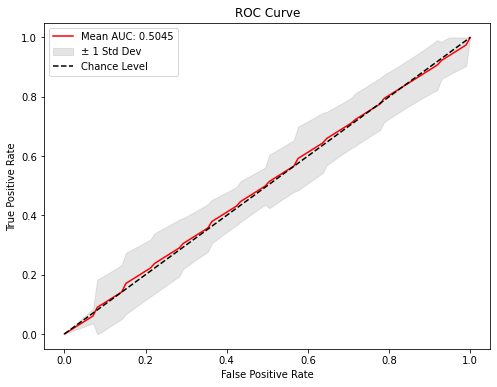

In [ ]:
# ### LR: ShuffleSplit to do "cross validation" 100 interation with 80/20 train/test split. The tuning of the best threshold is using the Geometric Mean.

# from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import (
#     roc_curve, auc, confusion_matrix, accuracy_score, precision_score,
#     recall_score, f1_score
# )
# from sklearn.preprocessing import StandardScaler
# import numpy as np
# import matplotlib.pyplot as plt
# from numpy import sqrt, argmax
# import scipy.stats

# # Set seed for reproducibility
# def set_seed(seed=42):
#     np.random.seed(seed)

# set_seed(42)

# # Confidence interval calculation
# def mean_confidence_interval(data, confidence=0.95):
#     a = np.array(data)
#     n = len(a)
#     m, se = np.mean(a), scipy.stats.sem(a)
#     h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
#     return m, m-h, m+h

# # Function to calculate PPV, NPV, Sensitivity, and Specificity
# def calculate_additional_metrics(cm):
#     tn, fp, fn, tp = cm.ravel()
#     PPV = tp / (tp + fp) if (tp + fp) > 0 else 0  # Precision for Positive class
#     NPV = tn / (tn + fn) if (tn + fn) > 0 else 0  # Precision for Negative class
#     sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Recall for Positive class
#     specificity = tn / (tn + fp) if (tn + fp) > 0 else 0  # Recall for Negative class
#     return PPV, NPV, sensitivity, specificity

# # Prepare data
# y = np.where((df_train_1['sample_type'] == "Prednisone_Positive") | (df_train_1['sample_type'] == "ILD_Positive"), 1, 0)
# X = df_train_1.drop(['request_id', 'sample_type'], axis=1)

# # Standardize features
# scaler = StandardScaler()
# X = scaler.fit_transform(X)

# # Initialize StratifiedShuffleSplit for balanced splits
# sss = StratifiedShuffleSplit(n_splits=100, test_size=0.2, random_state=42)

# # Logistic Regression Grid Parameters
# parameters = {'penalty': ['l1', 'l2'], 'C': [0.1, 1, 10, 100]}

# # Initialize metric storage
# mean_fpr = np.linspace(0, 1, 100)
# tprs, aucs = [], []
# accuracys, precisions, recalls, f1_scores = [], [], [], []
# PPVs, NPVs, sensitivities, specificities = [], [], [], []
# thresholds_used = []  # Store the G-Mean thresholds

# # Cross-validation loop
# for fold_idx, (train_index, test_index) in enumerate(sss.split(X, y)):
#     # Standrization split
#     X_train, X_test = X[train_index], X[test_index]
#     y_train, y_test = y[train_index], y[test_index]

#     # X_train, X_test = X.iloc[train_index].values, X.iloc[test_index].values
#     # y_train, y_test = y[train_index], y[test_index]

    
#     # Grid search for Logistic Regression
#     Grid_LR = GridSearchCV(LogisticRegression(solver='liblinear', random_state=42), parameters, cv=10)
#     Grid_LR.fit(X_train, y_train)
#     best_LR_model = Grid_LR.best_estimator_
    
#     # Predict probabilities and compute ROC
#     pred_proba = best_LR_model.predict_proba(X_test)[:, 1]
#     fpr_fold, tpr_fold, thresholds = roc_curve(y_test, pred_proba)
#     auc_score = auc(fpr_fold, tpr_fold)
#     aucs.append(auc_score)
    
#     # Interpolate TPR
#     interp_tpr = np.interp(mean_fpr, fpr_fold, tpr_fold)
#     interp_tpr[0] = 0.0
#     tprs.append(interp_tpr)
    
#     # Compute G-Mean and best threshold
#     gmeans = sqrt(tpr_fold * (1 - fpr_fold))
#     ix = argmax(gmeans)
#     best_thr = thresholds[ix]
#     thresholds_used.append(best_thr)
    
#     # Classify based on the G-Mean threshold
#     y_pred_best_thr = (pred_proba >= best_thr).astype(int)
    
#     # Evaluate metrics
#     accuracys.append(accuracy_score(y_test, y_pred_best_thr))
#     precisions.append(precision_score(y_test, y_pred_best_thr))
#     recalls.append(recall_score(y_test, y_pred_best_thr))
#     f1_scores.append(f1_score(y_test, y_pred_best_thr))
    
#     # Confusion Matrix and Additional Metrics
#     cm = confusion_matrix(y_test, y_pred_best_thr)
#     PPV, NPV, sensitivity, specificity = calculate_additional_metrics(cm)
#     PPVs.append(PPV)
#     NPVs.append(NPV)
#     sensitivities.append(sensitivity)
#     specificities.append(specificity)

# # Calculate and display overall metrics
# mean_auc = auc(mean_fpr, np.mean(tprs, axis=0))
# print("\nSummary of Results:")
# print(f"Overall AUC: {mean_auc:.4f}")
# print("AUC (Mean, Std):", np.round(np.mean(aucs), 4), np.round(np.std(aucs), 4))
# print("AUC (CI):", mean_confidence_interval(aucs))
# print("Mean G-Mean Threshold:", np.mean(thresholds_used))
# print("Threshold Range:", np.min(thresholds_used), "-", np.max(thresholds_used))
# print("Accuracy (Mean, Std):", np.round(np.mean(accuracys), 4), np.round(np.std(accuracys), 4))
# print("Precision (Mean, Std):", np.round(np.mean(precisions), 4), np.round(np.std(precisions), 4))
# print("Recall (Mean, Std):", np.round(np.mean(recalls), 4), np.round(np.std(recalls), 4))
# print("F1 Score (Mean, Std):", np.round(np.mean(f1_scores), 4), np.round(np.std(f1_scores), 4))
# print("PPV (Mean, Std):", np.round(np.mean(PPVs), 4), np.round(np.std(PPVs), 4))
# print("NPV (Mean, Std):", np.round(np.mean(NPVs), 4), np.round(np.std(NPVs), 4))
# print("Sensitivity (Mean, Std):", np.round(np.mean(sensitivities), 4), np.round(np.std(sensitivities), 4))
# print("Specificity (Mean, Std):", np.round(np.mean(specificities), 4), np.round(np.std(specificities), 4))

# # Plot ROC Curve
# mean_tpr = np.mean(tprs, axis=0)
# mean_tpr[-1] = 1.0
# std_tpr = np.std(tprs, axis=0)
# tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
# tprs_lower = np.maximum(mean_tpr - std_tpr, 0)

# plt.figure(figsize=(8, 6))
# plt.plot(mean_fpr, mean_tpr, color='red', label=f"Mean AUC: {mean_auc:.4f}")
# plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=0.2, label="± 1 Std Dev")
# plt.plot([0, 1], [0, 1], 'k--', label="Chance Level")
# plt.xlabel("False Positive Rate")
# plt.ylabel("True Positive Rate")
# plt.title("ROC Curve")
# plt.legend(loc='best')
# plt.show()


### LR: The tuning of the best threshold for Sensitivity ≥ 90% or Specificity ≥ 90%.

Thresholds used for sensitivity >= 90% in each fold:
Mean threshold: inf
Threshold range: inf - inf
Overall AUC: 0.5468
AUC (Mean, Std): 0.5474 0.1811
AUC (CI): (0.5473809523809524, 0.5112593178129258, 0.583502586948979)
Accuracy (Mean, Std): 0.8235 0.0
Precision (Mean, Std): 0.0 0.0
Recall (Mean, Std): 0.0 0.0
F1 Score (Mean, Std): 0.0 0.0
PPV (Mean, Std): 0.0 0.0
NPV (Mean, Std): 0.8235 0.0
Sensitivity (Mean, Std): 0.0 0.0
Specificity (Mean, Std): 1.0 0.0


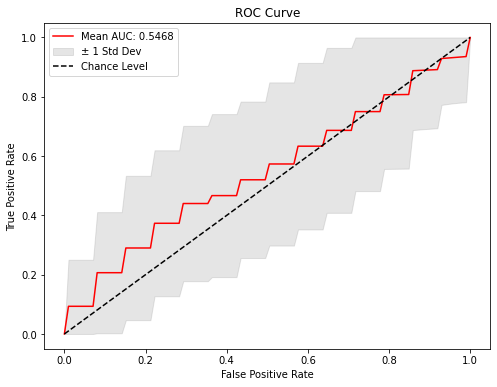

In [103]:
### LR: ShuffleSplit to do "cross validation" 100 interation with 80/20 train/test split. 

# Sensitivity Threshold: The code adjusts the decision threshold dynamically to ensure sensitivity >= 90%.
# Validation for ROC Curve: Skips folds with invalid ROC inputs (e.g., single-class test sets).

from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import StandardScaler
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats

# Set seed for reproducibility
def set_seed(seed=42):
    np.random.seed(seed)

set_seed(42)

# Confidence interval calculation
def mean_confidence_interval(data, confidence=0.95):
    a = np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

# Function to calculate PPV, NPV, Sensitivity, and Specificity
def calculate_additional_metrics(cm):
    tn, fp, fn, tp = cm.ravel()
    PPV = tp / (tp + fp) if (tp + fp) > 0 else 0  # Precision for Positive class
    NPV = tn / (tn + fn) if (tn + fn) > 0 else 0  # Precision for Negative class
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Recall for Positive class
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0  # Recall for Negative class
    return PPV, NPV, sensitivity, specificity

# Prepare data
# y = np.where(df_train_1['sample_type'] == "ILD_Positive", 1, 0)
y = np.where((df_train_1['sample_type'] == "Prednisone_Positive") | (df_train_1['sample_type'] == "ILD_Positive"), 1, 0)
X = df_train_1.drop(['request_id', 'sample_type'], axis=1)

# # Standardize features
# scaler = StandardScaler()
# X = scaler.fit_transform(X)

# Initialize StratifiedShuffleSplit for balanced splits
sss = StratifiedShuffleSplit(n_splits=100, test_size=0.2, random_state=42)

# Logistic Regression Grid Parameters
parameters = {'penalty': ['l1', 'l2'], 'C': [0.1, 1, 10, 100]}

# Initialize metric storage
mean_fpr = np.linspace(0, 1, 100)
tprs, aucs = [], []
accuracys, precisions, recalls, f1_scores = [], [], [], []
PPVs, NPVs, sensitivities, specificities = [], [], [], []

# Initialize storage for thresholds
thresholds_used = []

# Cross-validation loop
for train_index, test_index in sss.split(X, y):
    # Standrization split
    # X_train, X_test = X[train_index], X[test_index]
    # y_train, y_test = y[train_index], y[test_index]

    X_train, X_test = X.iloc[train_index].values, X.iloc[test_index].values
    y_train, y_test = y[train_index], y[test_index]

    
    # Grid search for Logistic Regression
    Grid_LR = GridSearchCV(LogisticRegression(solver='liblinear', random_state=42), parameters, cv=10)
    Grid_LR.fit(X_train, y_train)
    best_LR_model = Grid_LR.best_estimator_
    
    # Predict probabilities
    pred_proba = best_LR_model.predict_proba(X_test)[:, 1]
    
    # Check for valid ROC computation
    if len(np.unique(y_test)) < 2:
        print(f"Skipping fold due to single class in y_test: {np.unique(y_test)}")
        continue
    
    # Compute ROC
    fpr_fold, tpr_fold, thresholds = roc_curve(y_test, pred_proba)
    
    # # Find threshold for sensitivity >= 90%
    # best_thr = thresholds[0]  # Default to the first threshold if no valid one is found
    # for fold_threshold in thresholds:
    #     tp = ((pred_proba >= fold_threshold) & (y_test == 1)).sum()
    #     fn = ((pred_proba < fold_threshold) & (y_test == 1)).sum()
    #     sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0

    #     if sensitivity >= 0.90:
    #         best_thr = fold_threshold
    #         break

    # Find threshold for specificity >= 95%
    best_thr = thresholds[0]  # Default to the first threshold if no valid one is found
    for fold_threshold in thresholds:
        tn = ((pred_proba < fold_threshold) & (y_test == 0)).sum()
        fp = ((pred_proba >= fold_threshold) & (y_test == 0)).sum()
        specificity = tn / (tn + fp) if (tn + fp) > 0 else 0

        if specificity >= 0.9:
            best_thr = fold_threshold
            break
    
    # Store the threshold used
    thresholds_used.append(best_thr)
    
    # Classify based on the selected threshold
    y_pred_best_thr = (pred_proba >= best_thr).astype(int)
    
    # Evaluate metrics
    auc_score = auc(fpr_fold, tpr_fold)
    aucs.append(auc_score)
    cm = confusion_matrix(y_test, y_pred_best_thr)
    PPV, NPV, sensitivity, specificity = calculate_additional_metrics(cm)
    PPVs.append(PPV)
    NPVs.append(NPV)
    sensitivities.append(sensitivity)
    specificities.append(specificity)
    accuracys.append(accuracy_score(y_test, y_pred_best_thr))
    precisions.append(precision_score(y_test, y_pred_best_thr))
    recalls.append(recall_score(y_test, y_pred_best_thr))
    f1_scores.append(f1_score(y_test, y_pred_best_thr))

    # Interpolate TPR
    interp_tpr = np.interp(mean_fpr, fpr_fold, tpr_fold)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)

# Print the thresholds used
print("Thresholds used for sensitivity >= 90% in each fold:")
# print(thresholds_used)
print(f"Mean threshold: {np.mean(thresholds_used):.4f}")
print(f"Threshold range: {min(thresholds_used):.4f} - {max(thresholds_used):.4f}")

# Calculate and display overall metrics
mean_auc = auc(mean_fpr, np.mean(tprs, axis=0))
print(f"Overall AUC: {mean_auc:.4f}")
print("AUC (Mean, Std):", np.round(np.mean(aucs), 4), np.round(np.std(aucs), 4))
print("AUC (CI):", mean_confidence_interval(aucs))
print("Accuracy (Mean, Std):", np.round(np.mean(accuracys), 4), np.round(np.std(accuracys), 4))
print("Precision (Mean, Std):", np.round(np.mean(precisions), 4), np.round(np.std(precisions), 4))
print("Recall (Mean, Std):", np.round(np.mean(recalls), 4), np.round(np.std(recalls), 4))
print("F1 Score (Mean, Std):", np.round(np.mean(f1_scores), 4), np.round(np.std(f1_scores), 4))
print("PPV (Mean, Std):", np.round(np.mean(PPVs), 4), np.round(np.std(PPVs), 4))
print("NPV (Mean, Std):", np.round(np.mean(NPVs), 4), np.round(np.std(NPVs), 4))
print("Sensitivity (Mean, Std):", np.round(np.mean(sensitivities), 4), np.round(np.std(sensitivities), 4))
print("Specificity (Mean, Std):", np.round(np.mean(specificities), 4), np.round(np.std(specificities), 4))

# Plot ROC Curve
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)

plt.figure(figsize=(8, 6))
plt.plot(mean_fpr, mean_tpr, color='red', label=f"Mean AUC: {mean_auc:.4f}")
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=0.2, label="± 1 Std Dev")
plt.plot([0, 1], [0, 1], 'k--', label="Chance Level")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc='best')
plt.show()

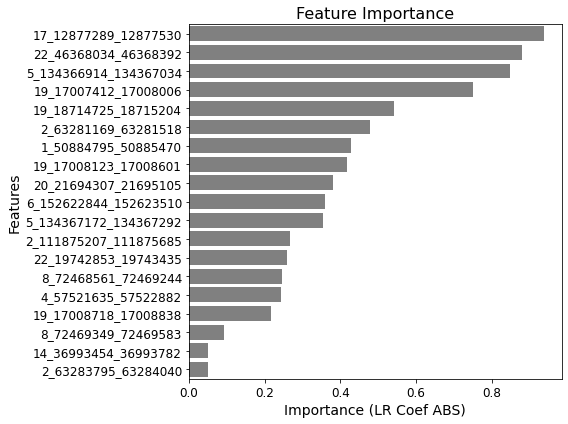

In [104]:
# Feature importance analysis 

# Get feature importance from the Logistic Regression model
feature_names = df_train_1.drop(['request_id', 'sample_type'], axis=1).columns  # Feature names from your dataset
coefficients = best_LR_model.coef_[0]  # Coefficients from the best LR model

# Create a dataframe for feature importance
df_feature_importance = pd.DataFrame({
    'Feature': feature_names,
    'Importance': np.abs(coefficients)  # Absolute values for ranking
    # 'Importance': coefficients  
}).sort_values(by='Importance', ascending=False)

# # Optional: Filter for meaningful importance values (e.g., > 0.02)
# df_feature_importance = df_feature_importance[df_feature_importance['Importance'] > 0.02]

# Plot the feature importance
plt.figure(figsize=(8, 6))
sns.barplot(y='Feature', x='Importance', data=df_feature_importance, color='gray')
plt.title('Feature Importance', fontsize=16)
plt.xlabel('Importance (LR Coef ABS)', fontsize=14)
plt.ylabel('Features', fontsize=14)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.tight_layout()
plt.show()


In [ ]:
# from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
# from sklearn.linear_model import LogisticRegression
# from sklearn.metrics import (
#     roc_curve, auc, confusion_matrix, accuracy_score, precision_score,
#     recall_score, f1_score
# )
# from sklearn.preprocessing import StandardScaler
# import numpy as np
# import matplotlib.pyplot as plt
# import scipy.stats

# # Set seed for reproducibility
# def set_seed(seed=42):
#     np.random.seed(seed)

# set_seed(42)

# # Confidence interval calculation
# def mean_confidence_interval(data, confidence=0.95):
#     a = np.array(data)
#     n = len(a)
#     m, se = np.mean(a), scipy.stats.sem(a)
#     h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
#     return m, m-h, m+h

# # Function to calculate PPV, NPV, Sensitivity, and Specificity
# def calculate_additional_metrics(cm):
#     tn, fp, fn, tp = cm.ravel()
#     PPV = tp / (tp + fp) if (tp + fp) > 0 else 0  # Precision for Positive class
#     NPV = tn / (tn + fn) if (tn + fn) > 0 else 0  # Precision for Negative class
#     sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Recall for Positive class
#     specificity = tn / (tn + fp) if (tn + fp) > 0 else 0  # Recall for Negative class
#     return PPV, NPV, sensitivity, specificity

# # Prepare data
# y = np.where(df_train_1['sample_type'] == "ILD_Negative", 0, 1)
# X = df_train_1.drop(['run_sample_id', 'sample_type'], axis=1)

# # # Standardize features
# # scaler = StandardScaler()
# # X = scaler.fit_transform(X)

# # Initialize StratifiedShuffleSplit for balanced splits
# sss = StratifiedShuffleSplit(n_splits=100, test_size=0.2, random_state=42)

# # Logistic Regression Grid Parameters
# parameters = {'penalty': ['l1', 'l2'], 'C': [0.1, 1, 10, 100]}

# # Initialize metric storage
# mean_fpr = np.linspace(0, 1, 100)
# tprs, aucs = [], []
# accuracys, precisions, recalls, f1_scores = [], [], [], []
# PPVs, NPVs, sensitivities, specificities = [], [], [], []

# # Initialize storage for thresholds
# thresholds_used = []

# # Cross-validation loop
# for train_index, test_index in sss.split(X, y):
#     # Standrization split
#     # X_train, X_test = X[train_index], X[test_index]
#     # y_train, y_test = y[train_index], y[test_index]

#     X_train, X_test = X.iloc[train_index].values, X.iloc[test_index].values
#     y_train, y_test = y[train_index], y[test_index]
    
#     # Grid search for Logistic Regression
#     Grid_LR = GridSearchCV(LogisticRegression(solver='liblinear', random_state=42), parameters, cv=10)
#     Grid_LR.fit(X_train, y_train)
#     best_LR_model = Grid_LR.best_estimator_
    
#     # Predict probabilities
#     pred_proba = best_LR_model.predict_proba(X_test)[:, 1]
    
#     # Check for valid ROC computation
#     if len(np.unique(y_test)) < 2:
#         print(f"Skipping fold due to single class in y_test: {np.unique(y_test)}")
#         continue
    
#     # Compute ROC
#     fpr_fold, tpr_fold, thresholds = roc_curve(y_test, pred_proba)
    
#     # Find threshold for specificity >= 95%
#     valid_thresholds = thresholds[np.isfinite(thresholds)]  # Keep only finite thresholds

#     best_thr = valid_thresholds[-1]  # Default to the last valid threshold
#     found_threshold = False

#     for fold_threshold in valid_thresholds:
#         tn = ((pred_proba < fold_threshold) & (y_test == 0)).sum()
#         fp = ((pred_proba >= fold_threshold) & (y_test == 0)).sum()
#         specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
        
#         if specificity >= 0.9:  # Specificity condition
#             best_thr = fold_threshold
#             found_threshold = True
#             break

#     # Handle case where no threshold meets specificity condition
#     if not found_threshold:
#         print("Warning: No threshold met specificity >= 90%. Using fallback closest to 95% specificity.")
#         specificity_array = [
#             tn / (tn + fp) if (tn + fp) > 0 else 0
#             for tn, fp in zip(
#                 [((pred_proba < thr) & (y_test == 0)).sum() for thr in valid_thresholds],
#                 [((pred_proba >= thr) & (y_test == 0)).sum() for thr in valid_thresholds]
#             )
#         ]
#         best_thr = valid_thresholds[np.argmax(specificity_array)]


#     # Store the threshold used
#     thresholds_used.append(best_thr)
    
#     # Classify based on the selected threshold
#     y_pred_best_thr = (pred_proba >= best_thr).astype(int)
    
#     # Evaluate metrics
#     auc_score = auc(fpr_fold, tpr_fold)
#     aucs.append(auc_score)
#     cm = confusion_matrix(y_test, y_pred_best_thr)
#     PPV, NPV, sensitivity, specificity = calculate_additional_metrics(cm)
#     PPVs.append(PPV)
#     NPVs.append(NPV)
#     sensitivities.append(sensitivity)
#     specificities.append(specificity)
#     accuracys.append(accuracy_score(y_test, y_pred_best_thr))
#     precisions.append(precision_score(y_test, y_pred_best_thr))
#     recalls.append(recall_score(y_test, y_pred_best_thr))
#     f1_scores.append(f1_score(y_test, y_pred_best_thr))

#     # Interpolate TPR
#     interp_tpr = np.interp(mean_fpr, fpr_fold, tpr_fold)
#     interp_tpr[0] = 0.0
#     tprs.append(interp_tpr)

# # Print the thresholds used
# print("Thresholds used for specificity >= 95% in each fold:")
# print(f"Mean threshold: {np.mean(thresholds_used):.4f}")
# print(f"Threshold range: {min(thresholds_used):.4f} - {max(thresholds_used):.4f}")

# # Calculate and display overall metrics
# mean_auc = auc(mean_fpr, np.mean(tprs, axis=0))
# print(f"Overall AUC: {mean_auc:.4f}")
# print("AUC (Mean, Std):", np.round(np.mean(aucs), 4), np.round(np.std(aucs), 4))
# print("AUC (CI):", mean_confidence_interval(aucs))
# print("Accuracy (Mean, Std):", np.round(np.mean(accuracys), 4), np.round(np.std(accuracys), 4))
# print("Precision (Mean, Std):", np.round(np.mean(precisions), 4), np.round(np.std(precisions), 4))
# print("Recall (Mean, Std):", np.round(np.mean(recalls), 4), np.round(np.std(recalls), 4))
# print("F1 Score (Mean, Std):", np.round(np.mean(f1_scores), 4), np.round(np.std(f1_scores), 4))
# print("PPV (Mean, Std):", np.round(np.mean(PPVs), 4), np.round(np.std(PPVs), 4))
# print("NPV (Mean, Std):", np.round(np.mean(NPVs), 4), np.round(np.std(NPVs), 4))
# print("Sensitivity (Mean, Std):", np.round(np.mean(sensitivities), 4), np.round(np.std(sensitivities), 4))
# print("Specificity (Mean, Std):", np.round(np.mean(specificities), 4), np.round(np.std(specificities), 4))

# # Plot ROC Curve
# mean_tpr = np.mean(tprs, axis=0)
# mean_tpr[-1] = 1.0
# std_tpr = np.std(tprs, axis=0)
# tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
# tprs_lower = np.maximum(mean_tpr - std_tpr, 0)

# plt.figure(figsize=(8, 6))
# plt.plot(mean_fpr, mean_tpr, color='red', label=f"Mean AUC: {mean_auc:.4f}")
# plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=0.2, label="± 1 Std Dev")
# plt.plot([0, 1], [0, 1], 'k--', label="Chance Level")
# plt.xlabel("False Positive Rate")
# plt.ylabel("True Positive Rate")
# plt.title("ROC Curve")
# plt.legend(loc='best')
# plt.show()


### RF: The tuning of the best threshold for Sensitivity ≥ 90% or Specificity ≥ 90%.

In [ ]:
# ShuffleSplit to do "cross validation" 100 interation with 80/20 train/test split. 

from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats

# Set seed for reproducibility
def set_seed(seed=42):
    np.random.seed(seed)

set_seed(42)

# Confidence interval calculation
def mean_confidence_interval(data, confidence=0.95):
    a = np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

# Function to calculate PPV, NPV, Sensitivity, and Specificity
def calculate_additional_metrics(cm):
    tn, fp, fn, tp = cm.ravel()
    PPV = tp / (tp + fp) if (tp + fp) > 0 else 0  # Precision for Positive class
    NPV = tn / (tn + fn) if (tn + fn) > 0 else 0  # Precision for Negative class
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Recall for Positive class
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0  # Recall for Negative class
    return PPV, NPV, sensitivity, specificity

# Prepare data
y = np.where(df_train_1['sample_type'] == "ILD_Negative", 0, 1)
X = df_train_1.drop(['run_sample_id', 'sample_type'], axis=1)

# Standardize features
scaler = StandardScaler()
X = scaler.fit_transform(X)

# Initialize StratifiedShuffleSplit for balanced splits
sss = StratifiedShuffleSplit(n_splits=100, test_size=0.2, random_state=42)

# Random Forest Hyperparameters
parameters = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

# Initialize metric storage
mean_fpr = np.linspace(0, 1, 100)
tprs, aucs = [], []
accuracys, precisions, recalls, f1_scores = [], [], [], []
PPVs, NPVs, sensitivities, specificities = [], [], [], []

# Initialize storage for thresholds
thresholds_used = []

# Cross-validation loop
for train_index, test_index in sss.split(X, y):
    # Standrization split
    X_train, X_test = X[train_index], X[test_index]
    y_train, y_test = y[train_index], y[test_index]

    # X_train, X_test = X.iloc[train_index].values, X.iloc[test_index].values
    # y_train, y_test = y[train_index], y[test_index]

    # Grid search for Random Forest
    Grid_RF = GridSearchCV(RandomForestClassifier(random_state=42), parameters, cv=10)
    Grid_RF.fit(X_train, y_train)
    best_RF_model = Grid_RF.best_estimator_
    
    # Predict probabilities
    pred_proba = best_RF_model.predict_proba(X_test)[:, 1]
    
    # Check for valid ROC computation
    if len(np.unique(y_test)) < 2:
        print(f"Skipping fold due to single class in y_test: {np.unique(y_test)}")
        continue
    
    # Compute ROC
    fpr_fold, tpr_fold, thresholds = roc_curve(y_test, pred_proba)
    
    # Find threshold for sensitivity >= 90%
    best_thr = thresholds[0]  # Default to the first threshold if no valid one is found
    for fold_threshold in thresholds:
        tp = ((pred_proba >= fold_threshold) & (y_test == 1)).sum()
        fn = ((pred_proba < fold_threshold) & (y_test == 1)).sum()
        sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0

        if sensitivity >= 0.90:
            best_thr = fold_threshold
            break

    # Store the threshold used
    thresholds_used.append(best_thr)
    
    # Classify based on the selected threshold
    y_pred_best_thr = (pred_proba >= best_thr).astype(int)
    
    # Evaluate metrics
    auc_score = auc(fpr_fold, tpr_fold)
    aucs.append(auc_score)
    cm = confusion_matrix(y_test, y_pred_best_thr)
    PPV, NPV, sensitivity, specificity = calculate_additional_metrics(cm)
    PPVs.append(PPV)
    NPVs.append(NPV)
    sensitivities.append(sensitivity)
    specificities.append(specificity)
    accuracys.append(accuracy_score(y_test, y_pred_best_thr))
    precisions.append(precision_score(y_test, y_pred_best_thr))
    recalls.append(recall_score(y_test, y_pred_best_thr))
    f1_scores.append(f1_score(y_test, y_pred_best_thr))

    # Interpolate TPR
    interp_tpr = np.interp(mean_fpr, fpr_fold, tpr_fold)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)

# Print the thresholds used
print("Thresholds used for sensitivity >= 90% in each fold:")
print(f"Mean threshold: {np.mean(thresholds_used):.4f}")
print(f"Threshold range: {min(thresholds_used):.4f} - {max(thresholds_used):.4f}")

# Calculate and display overall metrics
mean_auc = auc(mean_fpr, np.mean(tprs, axis=0))
print(f"Overall AUC: {mean_auc:.4f}")
print("AUC (Mean, Std):", np.round(np.mean(aucs), 4), np.round(np.std(aucs), 4))
print("AUC (CI):", mean_confidence_interval(aucs))
print("Accuracy (Mean, Std):", np.round(np.mean(accuracys), 4), np.round(np.std(accuracys), 4))
print("Precision (Mean, Std):", np.round(np.mean(precisions), 4), np.round(np.std(precisions), 4))
print("Recall (Mean, Std):", np.round(np.mean(recalls), 4), np.round(np.std(recalls), 4))
print("F1 Score (Mean, Std):", np.round(np.mean(f1_scores), 4), np.round(np.std(f1_scores), 4))
print("PPV (Mean, Std):", np.round(np.mean(PPVs), 4), np.round(np.std(PPVs), 4))
print("NPV (Mean, Std):", np.round(np.mean(NPVs), 4), np.round(np.std(NPVs), 4))
print("Sensitivity (Mean, Std):", np.round(np.mean(sensitivities), 4), np.round(np.std(sensitivities), 4))
print("Specificity (Mean, Std):", np.round(np.mean(specificities), 4), np.round(np.std(specificities), 4))

# Plot ROC Curve
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)

plt.figure(figsize=(8, 6))
plt.plot(mean_fpr, mean_tpr, color='red', label=f"Mean AUC: {mean_auc:.4f}")
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=0.2, label="± 1 Std Dev")
plt.plot([0, 1], [0, 1], 'k--', label="Chance Level")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc='best')
plt.show()


### XGB

In [ ]:
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats

# Set seed for reproducibility
def set_seed(seed=42):
    np.random.seed(seed)

set_seed(42)

# Confidence interval calculation
def mean_confidence_interval(data, confidence=0.95):
    a = np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

# Function to calculate PPV, NPV, Sensitivity, and Specificity
def calculate_additional_metrics(cm):
    tn, fp, fn, tp = cm.ravel()
    PPV = tp / (tp + fp) if (tp + fp) > 0 else 0  # Precision for Positive class
    NPV = tn / (tn + fn) if (tn + fn) > 0 else 0  # Precision for Negative class
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0  # Recall for Positive class
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0  # Recall for Negative class
    return PPV, NPV, sensitivity, specificity

# Prepare data
y = np.where(df_train['sample_type'] == "ILD_Negative", 0, 1)
X = df_train.drop(['run_sample_id', 'sample_type'], axis=1)

# Initialize StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=100, test_size=0.2, random_state=42)

# XGBoost Hyperparameters
parameters = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [1, 1.5, 2]
}

# Initialize metric storage
mean_fpr = np.linspace(0, 1, 100)
tprs, aucs = [], []
accuracys, precisions, recalls, f1_scores = [], [], [], []
PPVs, NPVs, sensitivities, specificities = [], [], [], []

# Cross-validation loop
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Grid search for XGBoost
    Grid_XGB = GridSearchCV(
        XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42), 
        parameters, 
        cv=3, 
        scoring='roc_auc'
    )
    Grid_XGB.fit(X_train, y_train)
    best_XGB_model = Grid_XGB.best_estimator_
    
    # Predict probabilities and compute ROC
    pred_proba = best_XGB_model.predict_proba(X_test)[:, 1]
    fpr_fold, tpr_fold, _ = roc_curve(y_test, pred_proba)
    auc_score = auc(fpr_fold, tpr_fold)
    aucs.append(auc_score)
    
    # Interpolate TPR
    interp_tpr = np.interp(mean_fpr, fpr_fold, tpr_fold)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    
    # Predict classes
    y_pred_class = best_XGB_model.predict(X_test)
    
    # Evaluate metrics
    accuracys.append(accuracy_score(y_test, y_pred_class))
    precisions.append(precision_score(y_test, y_pred_class))
    recalls.append(recall_score(y_test, y_pred_class))
    f1_scores.append(f1_score(y_test, y_pred_class))
    
    # Confusion Matrix and Additional Metrics
    cm = confusion_matrix(y_test, y_pred_class)
    PPV, NPV, sensitivity, specificity = calculate_additional_metrics(cm)
    PPVs.append(PPV)
    NPVs.append(NPV)
    sensitivities.append(sensitivity)
    specificities.append(specificity)

# Calculate and display overall metrics
mean_auc = auc(mean_fpr, np.mean(tprs, axis=0))
print(f"Overall AUC: {mean_auc:.4f}")
print("AUC (Mean, Std):", np.round(np.mean(aucs), 4), np.round(np.std(aucs), 4))
print("AUC (CI):", mean_confidence_interval(aucs))
print("Accuracy (Mean, Std):", np.round(np.mean(accuracys), 4), np.round(np.std(accuracys), 4))
print("Precision (Mean, Std):", np.round(np.mean(precisions), 4), np.round(np.std(precisions), 4))
print("Recall (Mean, Std):", np.round(np.mean(recalls), 4), np.round(np.std(recalls), 4))
print("F1 Score (Mean, Std):", np.round(np.mean(f1_scores), 4), np.round(np.std(f1_scores), 4))
print("PPV (Mean, Std):", np.round(np.mean(PPVs), 4), np.round(np.std(PPVs), 4))
print("NPV (Mean, Std):", np.round(np.mean(NPVs), 4), np.round(np.std(NPVs), 4))
print("Sensitivity (Mean, Std):", np.round(np.mean(sensitivities), 4), np.round(np.std(sensitivities), 4))
print("Specificity (Mean, Std):", np.round(np.mean(specificities), 4), np.round(np.std(specificities), 4))

# Plot ROC Curve
mean_tpr = np.mean(tprs, axis=0)
mean_tpr[-1] = 1.0
std_tpr = np.std(tprs, axis=0)
tprs_upper = np.minimum(mean_tpr + std_tpr, 1)
tprs_lower = np.maximum(mean_tpr - std_tpr, 0)

plt.figure(figsize=(8, 6))
plt.plot(mean_fpr, mean_tpr, color='red', label=f"Mean AUC: {mean_auc:.4f}")
plt.fill_between(mean_fpr, tprs_lower, tprs_upper, color='grey', alpha=0.2, label="± 1 Std Dev")
plt.plot([0, 1], [0, 1], 'k--', label="Chance Level")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc='best')
plt.show()


In [ ]:
import os

# Define paths
work_dir = "/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/ILD_prediction_model_12042024"
output_dir = f"{work_dir}/slurm_output"
slurm_script_path = f"{work_dir}/XGBoost_1.sh"

# Ensure the output directory exists
os.makedirs(output_dir, exist_ok=True)

# Define the SLURM script content using f-strings
slurm_script_content = f"""#!/bin/bash
#SBATCH --get-user-env
#SBATCH --job-name=XGBoost
#SBATCH --partition=dev
#SBATCH --mem=100G
#SBATCH --cpus-per-task=8
#SBATCH --ntasks-per-node=1
#SBATCH --time=15:00:00
#SBATCH -o {output_dir}/XGBoost_1.log

python3 << EOF
import warnings
import os
from xgboost import XGBClassifier
from sklearn.model_selection import StratifiedShuffleSplit, GridSearchCV
from sklearn.metrics import roc_curve, auc, accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import scipy.stats

# Suppress warnings from XGBoost and other libraries
warnings.filterwarnings("ignore", category=UserWarning, module="xgboost")
warnings.filterwarnings("ignore", category=FutureWarning, module="xgboost")

# Directories
work_dir = "{work_dir}"
output_dir = f"{work_dir}/slurm_output"

# Read in data
df_train = pd.read_csv(f"{work_dir}/df_train.csv")

# Set seed for reproducibility
def set_seed(seed=42):
    np.random.seed(seed)

set_seed(42)

# Confidence interval calculation
def mean_confidence_interval(data, confidence=0.95):
    a = np.array(data)
    n = len(a)
    m, se = np.mean(a), scipy.stats.sem(a)
    h = se * scipy.stats.t.ppf((1 + confidence) / 2., n-1)
    return m, m-h, m+h

# Function to calculate PPV, NPV, Sensitivity, and Specificity
def calculate_additional_metrics(cm):
    tn, fp, fn, tp = cm.ravel()
    PPV = tp / (tp + fp) if (tp + fp) > 0 else 0
    NPV = tn / (tn + fn) if (tn + fn) > 0 else 0
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0
    return PPV, NPV, sensitivity, specificity

# Prepare data
y = np.where(df_train['sample_type'] == "ILD_Negative", 0, 1)
X = df_train.drop(['run_sample_id', 'sample_type'], axis=1)

# Initialize StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=100, test_size=0.2, random_state=42)

# XGBoost Hyperparameters
parameters = {{
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'n_estimators': [50, 100, 200],
    'subsample': [0.8, 0.9, 1.0],
    'colsample_bytree': [0.8, 0.9, 1.0],
    'reg_alpha': [0, 0.1, 1],
    'reg_lambda': [1, 1.5, 2]
}}

# Metric storage
mean_fpr = np.linspace(0, 1, 100)
tprs, aucs = [], []
accuracys, precisions, recalls, f1_scores = [], [], [], []
PPVs, NPVs, sensitivities, specificities = [], [], [], []

# Cross-validation loop
for train_index, test_index in sss.split(X, y):
    X_train, X_test = X.iloc[train_index], X.iloc[test_index]
    y_train, y_test = y[train_index], y[test_index]
    
    # Grid search for XGBoost
    Grid_XGB = GridSearchCV(
        XGBClassifier(use_label_encoder=False, eval_metric='logloss', random_state=42), 
        parameters, 
        cv=3, 
        scoring='roc_auc'
    )
    Grid_XGB.fit(X_train, y_train)
    best_XGB_model = Grid_XGB.best_estimator_
    
    # Predict probabilities and compute ROC
    pred_proba = best_XGB_model.predict_proba(X_test)[:, 1]
    fpr_fold, tpr_fold, _ = roc_curve(y_test, pred_proba)
    auc_score = auc(fpr_fold, tpr_fold)
    aucs.append(auc_score)
    
    # Interpolate TPR
    interp_tpr = np.interp(mean_fpr, fpr_fold, tpr_fold)
    interp_tpr[0] = 0.0
    tprs.append(interp_tpr)
    
    # Predict classes
    y_pred_class = best_XGB_model.predict(X_test)
    
    # Evaluate metrics
    accuracys.append(accuracy_score(y_test, y_pred_class))
    precisions.append(precision_score(y_test, y_pred_class))
    recalls.append(recall_score(y_test, y_pred_class))
    f1_scores.append(f1_score(y_test, y_pred_class))
    
    # Confusion Matrix and Additional Metrics
    cm = confusion_matrix(y_test, y_pred_class)
    PPV, NPV, sensitivity, specificity = calculate_additional_metrics(cm)
    PPVs.append(PPV)
    NPVs.append(NPV)
    sensitivities.append(sensitivity)
    specificities.append(specificity)

# Save metrics
metrics_path = f"{output_dir}/XGBoost_metrics.txt"
with open(metrics_path, "w") as f:
    f.write(f"Overall AUC: {np.mean(aucs):.4f}\\n")
    f.write(f"AUC (Mean, Std): {np.mean(aucs):.4f}, {np.std(aucs):.4f}\\n")
    f.write(f"AUC (CI): {mean_confidence_interval(aucs)}\\n")

# Save ROC Curve
roc_curve_path = f"{output_dir}/ROC_Curve.png"
plt.figure(figsize=(8, 6))
plt.plot(mean_fpr, np.mean(tprs, axis=0), color='red', label=f"Mean AUC: {np.mean(aucs):.4f}")
plt.fill_between(mean_fpr, np.mean(tprs, axis=0) - np.std(tprs, axis=0), 
                 np.mean(tprs, axis=0) + np.std(tprs, axis=0), color='grey', alpha=0.2, label="± 1 Std Dev")
plt.plot([0, 1], [0, 1], 'k--', label="Chance Level")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("ROC Curve")
plt.legend(loc='best')
plt.savefig(roc_curve_path)
plt.close()

EOF
"""

# Save the SLURM script to a file
with open(slurm_script_path, "w") as file:
    file.write(slurm_script_content)

# Submit the SLURM job
os.system(f"sbatch {slurm_script_path}")


### Save the model

In [55]:
# Develop the final model based on the best hyperparameters found during hyperparameter tuning using all the data
import joblib

# Use the best hyperparameters found during hyperparameter tuning
best_penalty = Grid_LR.best_params_['penalty']
best_C = Grid_LR.best_params_['C']

# Standardize the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Train the final model using the best hyperparameters
final_LR_model = LogisticRegression(
    solver='liblinear', 
    penalty=best_penalty, 
    C=best_C, 
    random_state=42
)
final_LR_model.fit(X_scaled, y)
print("Final model trained on the entire dataset.")

# Save the scaler, model, and threshold
scaler_path = f"{work_dir}/ILD_scaler.joblib"
model_path = f"{work_dir}/ILD_LogisticRegression_model.joblib"
threshold_path = f"{work_dir}/ILD_threshold.joblib"

joblib.dump(scaler, scaler_path)
joblib.dump(final_LR_model, model_path)
joblib.dump(np.mean(thresholds_used), threshold_path)  # Save the custom threshold

print(f"Scaler saved to {scaler_path}")
print(f"Model saved to {model_path}")
print(f"Threshold saved to {threshold_path}")

Final model trained on the entire dataset.
Scaler saved to /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/ILD_prediction_model_12042024/ILD_scaler.joblib
Model saved to /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/ILD_prediction_model_12042024/ILD_LogisticRegression_model.joblib
Threshold saved to /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/ILD_prediction_model_12042024/ILD_threshold.joblib


In [ ]:
# # A version without Standarization
# import joblib
# from sklearn.linear_model import LogisticRegression

# # Use the best hyperparameters found during hyperparameter tuning
# best_penalty = Grid_LR.best_params_['penalty']
# best_C = Grid_LR.best_params_['C']

# # Train the final model using the best hyperparameters
# final_LR_model = LogisticRegression(
#     solver='liblinear', 
#     penalty=best_penalty, 
#     C=best_C, 
#     random_state=42
# )
# final_LR_model.fit(X, y)
# print("Final model trained on the entire dataset.")

# # Save the model and threshold
# model_path = f"{work_dir}/ILD_LogisticRegression_model.joblib"
# threshold_path = f"{work_dir}/ILD_threshold.joblib"

# joblib.dump(final_LR_model, model_path)
# joblib.dump(np.mean(thresholds_used), threshold_path)  # Save the custom threshold

# print(f"Model saved to {model_path}")
# print(f"Threshold saved to {threshold_path}")


Final model trained on the entire dataset.
Model saved to /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/ILD_prediction_model_12042024/ILD_LogisticRegression_model.joblib
Threshold saved to /ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/ILD_prediction_model_12042024/ILD_threshold.joblib


In [64]:
# Load the saved scaler, model, and threshold
scaler = joblib.load(scaler_path)
final_LR_model = joblib.load(model_path)
threshold = joblib.load(threshold_path)
print(threshold)

# Prepare test data
X_future = df_test.drop(['run_sample_id', 'sample_type'], axis=1)
# X_future_imputed = X_future.fillna(X_future.median())
X_future_scaled = scaler.transform(X_future)

# Predict probabilities
y_pred_proba = final_LR_model.predict_proba(X_future_scaled)[:, 1]

# Apply custom threshold
# threshold = 0.01
y_pred_class = (y_pred_proba >= threshold).astype(int)

# Add predictions to the dataframe
df_test_1 = df_test.copy()
df_test_1['Prediction_Probability'] = y_pred_proba
df_test_1['Prediction_Class'] = y_pred_class

# Display predictions
print(df_test_1[['sample_type', 'Prediction_Probability', 'Prediction_Class']].head())


0.3520960407003127
region_id   sample_type  Prediction_Probability  Prediction_Class
0          ILD_Positive            5.383306e-09                 0
1          ILD_Positive            6.116561e-10                 0
2          ILD_Positive            3.526008e-08                 0
3          ILD_Positive            1.003222e-07                 0
4          ILD_Positive            3.116201e-08                 0


In [65]:
# # Test the data without Standrization
# import joblib
# import pandas as pd

# # Load the saved model and threshold
# final_LR_model = joblib.load(model_path)
# threshold = joblib.load(threshold_path)
# print(threshold)

# # Prepare test data
# df_test_1 = df_test.copy()
# X_future = df_test_1.drop(['run_sample_id', 'sample_type'], axis=1).values  # Convert to numpy array

# # Predict probabilities using the loaded model
# y_pred_proba = final_LR_model.predict_proba(X_future)[:, 1]

# # Apply custom threshold
# y_pred_class = (y_pred_proba >= threshold).astype(int)

# # Add predictions to the dataframe
# df_test_1['Prediction_Probability'] = y_pred_proba
# df_test_1['Prediction_Class'] = y_pred_class

# # Display predictions
# print("Predictions on Test Data:")
# print(df_test_1[['sample_type', 'Prediction_Probability', 'Prediction_Class']].head())


In [66]:
y_pred_proba

array([5.38330603e-09, 6.11656142e-10, 3.52600832e-08, 1.00322228e-07,
       3.11620067e-08, 1.62630072e-09, 2.37017278e-09, 2.22571388e-07,
       1.48306214e-08, 3.04926754e-08, 5.28694142e-08, 6.77033831e-08,
       9.17002664e-10, 2.33762045e-09, 1.53498583e-08, 4.88803677e-09,
       3.52757558e-08, 1.58897267e-09, 1.19617600e-08, 7.24367781e-08,
       6.65793168e-08, 2.57952128e-07, 3.85482328e-09, 7.04622955e-11,
       6.85245268e-09, 2.02209414e-10, 2.06030608e-08, 1.43100894e-09,
       5.24793754e-08, 3.82657108e-09, 1.48743027e-09, 8.57039842e-07,
       7.23851219e-08, 2.53885620e-08, 7.70278547e-09, 5.88492958e-09,
       1.89417948e-07, 2.77459130e-07, 1.23525415e-09, 3.73619159e-08,
       1.23893579e-09, 5.81405564e-08, 9.55639462e-08, 2.78766447e-08,
       3.52669793e-07, 9.29564213e-09, 1.60960041e-09, 3.11146176e-08,
       8.41129193e-07, 2.07295690e-07, 1.12502072e-09, 6.16368857e-09,
       5.32574428e-07, 6.04005631e-08, 1.04685347e-06, 5.11632363e-07,
      

In [67]:
df_test_2 = df_test_1[["sample_type", "Prediction_Probability", "Prediction_Class"]]
df_test_2

region_id,sample_type,Prediction_Probability,Prediction_Class
0,ILD_Positive,5.383306e-09,0
1,ILD_Positive,6.116561e-10,0
2,ILD_Positive,3.526008e-08,0
3,ILD_Positive,1.003222e-07,0
4,ILD_Positive,3.116201e-08,0
5,ILD_Positive,1.626301e-09,0
6,ILD_Positive,2.370173e-09,0
7,ILD_Positive,2.225714e-07,0
8,ILD_Positive,1.483062e-08,0
9,ILD_Positive,3.049268e-08,0


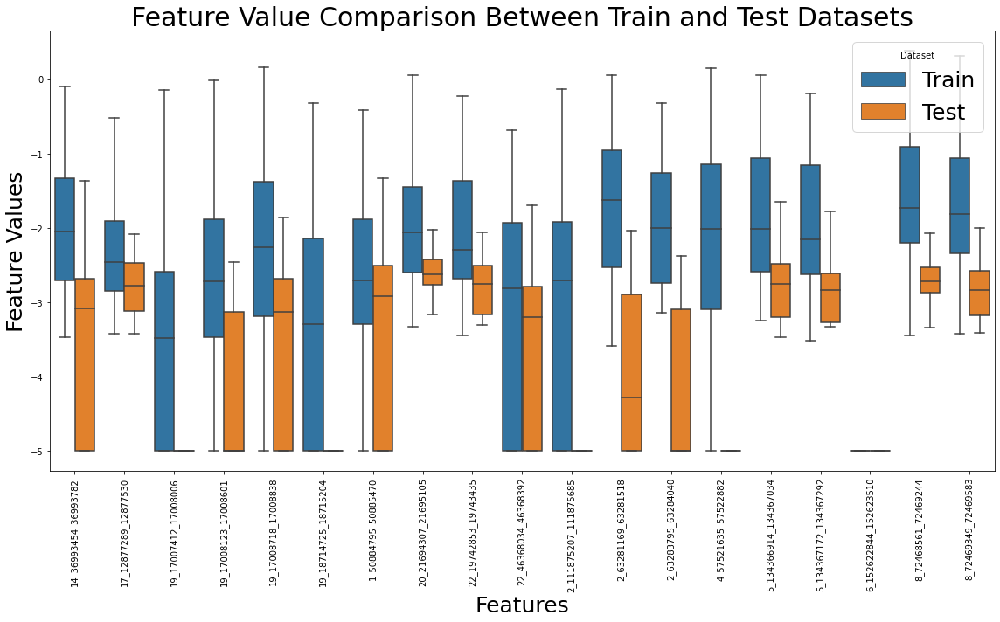

In [80]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Assume df_train and df_test are already loaded
# Drop the label column 'sample_type' from df_train
df_train_features = df_train.drop(columns=['sample_type', 'run_sample_id'], errors='ignore')
df_test_features = df_test.drop(columns=['sample_type', 'run_sample_id'], errors='ignore')


# Melt the dataframes for easier visualization
df_train_melted = df_train_features.melt(var_name="Feature", value_name="Value")
df_train_melted["Dataset"] = "Train"

df_test_melted = df_test_features.melt(var_name="Feature", value_name="Value")
df_test_melted["Dataset"] = "Test"

# Combine the datasets
df_combined = pd.concat([df_train_melted, df_test_melted])

# Plot feature distributions using boxplots
plt.figure(figsize=(16, 10))
sns.boxplot(data=df_combined, x="Feature", y="Value", hue="Dataset", showfliers=False)
plt.xticks(rotation=90)
plt.title("Feature Value Comparison Between Train and Test Datasets", fontsize=30)
plt.ylabel("Feature Values", fontsize=25)
plt.xlabel("Features", fontsize=25)
plt.legend(title="Dataset", fontsize=25)
plt.tight_layout()
plt.show()

# Additional sample information about the input data not for the model development 

In [15]:
# Readin Daiichi SOW21 with S3 MB breast caller report by Jing (S3 MB 98% and TFv2 beta)
# df_daiichi_report_1 = pd.read_csv("/ghsfa/projects/pharma/customers/DaiichiSankyoUS/Infinity/DSI_SOW21_Infinity/DSI_SOW21_Infinity_01/data/report/20240430_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv", header=1)
# df_daiichi_report_2 = pd.read_csv("/ghsfa/projects/pharma/datawarehouse/Infinity/20240625_DaiichiSankyoUS_SOW21_Batch2_177Samples_InfinityReport.csv", header=1)
# df_daiichi_report = pd.concat([df_daiichi_report_1, df_daiichi_report_2])

# TFv2 rule (Breast MB90 and MB18 TFv2 > 0.05%)
df_daiichi_report = pd.read_csv("/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/20241021_DSI_SOW21_1150Samples_TFv2_InfinityReport.csv")

df_daiichi_report_new = df_daiichi_report[df_daiichi_report['Sample_status'] == 'SUCCESS']
df_daiichi_report_final = df_daiichi_report_new.drop_duplicates(subset = "GHSampleID")
print(df_daiichi_report_final.shape)

target_sample_list_negative = df_daiichi_report_final[df_daiichi_report_final['Tumor_methylation_status'] == 'Not Detected']['GHSampleID'].values
print('Total Daiichi SOW21 S3 MB breast negative is ' + str(len(target_sample_list_negative)))

target_sample_list_positive = df_daiichi_report_final[df_daiichi_report_final['Tumor_methylation_status'] == 'Detected']['GHSampleID'].values
print('Total Daiichi SOW21 S3 MB breast positive is ' + str(len(target_sample_list_positive)))

(1143, 56)
Total Daiichi SOW21 S3 MB breast negative is 248
Total Daiichi SOW21 S3 MB breast positive is 890


In [33]:
# Readin the RUO/IST data with cancer type and treatment summary that i summarized before
df_ruo_all = pd.read_csv("/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/df_all_ruo_new.csv", header = 0)

# Remove the samples with missing mbd_dir
df_ruo_final = df_ruo_all[~df_ruo_all["mbd_dir"].isna()]
print(df_ruo_final.shape)

# Get the DSI SOW21 samples with treatment
dsi_21_id = df_daiichi_report_final.GHSampleID.unique()
df_dsi_sow21_all = df_ruo_final[df_ruo_final['GHSampleID'].isin(dsi_21_id)]
print(df_dsi_sow21_all.treatment.value_counts())

df_dsi_sow21_treatment = df_dsi_sow21_all[df_dsi_sow21_all['treatment'] == 'Treatment']
print("Total size of clinical samples is " + str(df_dsi_sow21_treatment.shape[0]) + "\n") 
print("Total unique sample size of clinical samples is " + str(df_dsi_sow21_treatment.GHSampleID.nunique()) + "\n")
df_dsi_sow21_treatment.head()

(26172, 48)
Baseline     440
Treatment    368
other        304
unknown       14
Name: treatment, dtype: int64
Total size of clinical samples is 368

Total unique sample size of clinical samples is 368



,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
927,DS8201-A-U302,A1023416,B00690294,85232018.0,C04D1,SUCCESS,NaN,12.64,3.0,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,0.31,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TCCTAATAGG,Female,Research,2024-06-17 09:03:09-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023416,cgp,240615_A02019_0122_BHFW32DSXC,NaN,/ghsfa/ivd/flowcentral/240615_A02019_0122_BHFW32DSXC.d1098576-8812-42c9-905c-68cf7d36200a.20240617020221,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240615_A02019_0122_BHFW32DSXC.d1098576-8812-42c9-905c-68cf7d36200a.20240617020221/B00690294,B00690294_240615_A02019_0122_BHFW32DSXC
928,DS8201-A-U302,A1023417,B00692532,82042003.0,C04D1,SUCCESS,NaN,46.33,3.5,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,0.39,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,CGATAGGAAT,Female,Research,2024-06-18 13:31:56-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023417,cgp,240616_A01020_0819_BHFWJVDSXC,NaN,/ghsfa/ivd/flowcentral/240616_A01020_0819_BHFWJVDSXC,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240616_A01020_0819_BHFWJVDSXC/B00692532,B00692532_240616_A01020_0819_BHFWJVDSXC
929,DS8201-A-U302,A1023418,B00692530,82032014.0,C04D1,SUCCESS,NaN,45.34,3.5,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,1.86,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,ATCCTCGGGC,Female,Research,2024-06-18 13:31:56-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023418,cgp,240616_A01020_0819_BHFWJVDSXC,NaN,/ghsfa/ivd/flowcentral/240616_A01020_0819_BHFWJVDSXC,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240616_A01020_0819_BHFWJVDSXC/B00692530,B00692530_240616_A01020_0819_BHFWJVDSXC
930,DS8201-A-U302,A1023419,B00689846,11112001.0,C04D1,SUCCESS,NaN,36.76,3.0,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,0.34,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,ACGTATTAAG,Female,Research,2024-06-16 11:44:15-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023419,cgp,240614_A01810_0400_AHFVLLDSXC,NaN,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240614_A01810_0400_AHFVLLDSXC/B00689846,B00689846_240614_A01810_0400_AHFVLLDSXC
931,DS8201-A-U302,A1023420,B00690470,39152006.0,C04D1,SUCCESS,NaN,38.12,3.0,NaN,20240624_DaiichiSankyoUS_SOW21_Batch2_159Samples_InfinityReport.csv,produser,24.53,2024-06-24,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TCCTAATAGG,Female,Research,2024-06-17 12:04:17-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1023420,cgp,240615_A02056_0167_BHFVTHDSXC,NaN,/ghsfa/ivd/flowcentral/240615_A02056_0167_BHFVTHDSXC.68d765b4-2298-433f-b88c-12f476a1c4b6.20240617050304,NaN,NaN,NaN,unknown,Treatment,/ghsfa/ivd/flowcentral/240615_A02056_0167_BHFVTHDSXC.68d765b4-2298-433f-b88c-12f476a1c4b6.20240617050304/B00690470,B00690470_240615_A02056_0167_BHFVTHDSXC


In [38]:

df_dsi_sow21_treatment_1 = df_dsi_sow21_treatment[df_dsi_sow21_treatment['GHSampleID'] == 'B00478262']
df_dsi_sow21_treatment_1

,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
27236,DS8201-A-U302,A0815479,B00478262,81192008,C04D1,SUCCESS,NaN,12.376,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.0,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TCTATCAGAT,Female,Research,2023-09-02 18:24:50-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0815479,cgp,230831_A01422_0439_BHCCTYDSX7,NaN,/ghsfa/ivd/flowcentral/230831_A01422_0439_BHCCTYDSX7.e65ee7d6-0afe-4ee3-a7c9-df69e16d3772.20230902112400,NaN,NaN,NaN,unknown,Treatment,/ghsfa/projects/omni_v2/users/schen/methylation_data/s3-mcm-mbd-counts/mb_crc_12cpg_regular/230831_A01422_0439_BHCCTYDSX7.e65ee7d6-0afe-4ee3-a7c9-df69e16d3772.20230902112400,B00478262_230831_A01422_0439_BHCCTYDSX7


In [ ]:
# Check LR panel regions and generate the data (df_consolidated_clinical_BC_LR_DMR) for DMR analysis

# Create an empty DataFrame for consolidated data
df_consolidated_dsi_treatment_LR_DMR = pd.DataFrame()

# Process each sample
for index, row in df_dsi_sow21_treatment.iterrows():
    run_sample_id = row["GHSampleID"]
    fc_dir = row["mbd_dir"]
    # sample_type = row['CSO_Lung_Sample']
    msre_mr_file = f"{fc_dir}/{run_sample_id}.msre_region_stats.tsv"
    try:
        # Load the data file
        df_temp = pd.read_table(msre_mr_file)
        # Remove control regions in v6
        df_temp_sub = df_temp[~df_temp["region_id"].isin(cso_dmr_remove_coordinate_list)]
        # print(df_temp_sub.shape)

        # Add 'sample_id' and 'sample_type' to the DataFrame
        df_temp_sub['sample_id'] = run_sample_id
        # df_temp_sub['sample_type'] = sample_type
        
        # Append to the consolidated DataFrame
        df_consolidated_dsi_treatment_LR_DMR = pd.concat([df_consolidated_dsi_treatment_LR_DMR, df_temp_sub], ignore_index=True)
    except FileNotFoundError:
        print(f"File not found for sample_id {run_sample_id}: {msre_mr_file}")
        continue

# Get the intermediate component 
df_consolidated_dsi_treatment_LR_DMR['adjusted_log_norm_peak_count'] = np.log10(df_consolidated_dsi_treatment_LR_DMR["norm_peak_count"] + 1e-5)
df_consolidated_dsi_treatment_LR_DMR['adjusted_norm_peak_count'] = df_consolidated_dsi_treatment_LR_DMR["norm_peak_count"] + 1e-5

In [79]:
df_consolidated_dsi_treatment_LR_DMR.run_sample_id.nunique()

162

In [ ]:
# # Readin methyl data of DSI SOW21 s3 MB breast neg samples based on TFv2 rule
# top_prd_df_sub_4 = pd.read_csv(f"/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/top_prd_df_sub_4_10212024.csv", header = 0)

In [81]:
# Based on RED team's original lung-tissue specific filter. 19 regions were selected
df_intersection_final_dedup = pd.read_csv("/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/df_intersection_final_dedup.csv")

# selection the overlapping regions between LR and healthy-lung-tissue regions for later analysis
region_id_overlap = df_intersection_final_dedup.region_id.unique()
print(region_id_overlap)

df_consolidated_dsi_treatment_LR_DMR_19 = df_consolidated_dsi_treatment_LR_DMR[df_consolidated_dsi_treatment_LR_DMR["region_id"].isin(region_id_overlap)]

# Remove the samples with unexpected region #
count_df = df_consolidated_dsi_treatment_LR_DMR_19.groupby('run_sample_id').region_id.count()

# Filter to find run_sample_id where the count is not 19
not_19_run_sample_ids = count_df[count_df != 19]
print(not_19_run_sample_ids)

# Remove it
df_consolidated_dsi_treatment_LR_DMR_19 = df_consolidated_dsi_treatment_LR_DMR_19[df_consolidated_dsi_treatment_LR_DMR_19['run_sample_id'] != 'A111242801']
print("Total unique sample size of clinical breast cancer inhouse samples with DMR info is " + str(df_consolidated_dsi_treatment_LR_DMR_19.run_sample_id.nunique()) + "\n")

# Save the data
# df_consolidated_clinical_BC_Lung_DMR_19.to_csv(f"{work_dir}/df_consolidated_clinical_BC_Lung_DMR_19_12122024.csv", index = False)

['1_50884795_50885470' '2_63281169_63281518' '2_63283795_63284040'
 '2_111875207_111875685' '4_57521635_57522882' '5_134366914_134367034'
 '5_134367172_134367292' '6_152622844_152623510' '8_72468561_72469244'
 '8_72469349_72469583' '14_36993454_36993782' '17_12877289_12877530'
 '19_17007412_17008006' '19_17008123_17008601' '19_17008718_17008838'
 '19_18714725_18715204' '20_21694307_21695105' '22_19742853_19743435'
 '22_46368034_46368392']
Series([], Name: region_id, dtype: int64)
Total unique sample size of clinical breast cancer inhouse samples with DMR info is 162



In [82]:
df_consolidated_dsi_treatment_LR_DMR_19.head()

,run_sample_id,runid,analysis_version,region_id,num_molecules,peak_cpg,peak_mol,smooth_ctrl,norm_region_count,norm_peak_count,sample_id,adjusted_log_norm_peak_count,adjusted_norm_peak_count
1088,B00690294,240615_A02019_0122_BHFW32DSXC,Sirius-1.1.4-RLS,1_50884795_50885470,1,20,1,1031.74858,0.000019,0.000969,B00690294,-3.009116,0.000979
3234,B00690294,240615_A02019_0122_BHFW32DSXC,Sirius-1.1.4-RLS,2_63281169_63281518,0,0,0,0.00000,0.000000,0.000000,B00690294,-5.000000,0.000010
3235,B00690294,240615_A02019_0122_BHFW32DSXC,Sirius-1.1.4-RLS,2_63283795_63284040,0,0,0,0.00000,0.000000,0.000000,B00690294,-5.000000,0.000010
3658,B00690294,240615_A02019_0122_BHFW32DSXC,Sirius-1.1.4-RLS,2_111875207_111875685,0,0,0,0.00000,0.000000,0.000000,B00690294,-5.000000,0.000010
6559,B00690294,240615_A02019_0122_BHFW32DSXC,Sirius-1.1.4-RLS,4_57521635_57522882,0,0,0,0.00000,0.000000,0.000000,B00690294,-5.000000,0.000010


In [ ]:
# Reformat the test data
df_test = df_consolidated_dsi_treatment_LR_DMR_19.copy()
df_test = df_test[['run_sample_id', 'region_id', 'adjusted_log_norm_peak_count']]

# Pivot the data to make region_id as columns
df_pivot = df_test.pivot(index='run_sample_id', columns='region_id', values='adjusted_log_norm_peak_count')

# Reset the index for a cleaner dataframe
df_test = df_pivot.reset_index()
print(df_test.shape)
# print(df_test.sample_type.value_counts())
df_test.head()

# Save the training data
# df_test.to_csv(f"{work_dir}/df_test.csv", index = False)
df_test.head()


(162, 20)


region_id,run_sample_id,14_36993454_36993782,17_12877289_12877530,19_17007412_17008006,19_17008123_17008601,19_17008718_17008838,19_18714725_18715204,1_50884795_50885470,20_21694307_21695105,22_19742853_19743435,22_46368034_46368392,2_111875207_111875685,2_63281169_63281518,2_63283795_63284040,4_57521635_57522882,5_134366914_134367034,5_134367172_134367292,6_152622844_152623510,8_72468561_72469244,8_72469349_72469583
0,B00689831,-3.111459,-3.147507,-3.441240,-5.00000,-5.000000,-5.000000,-3.406984,-3.125960,-2.827841,-5.000000,-3.147507,-3.117124,-5.000000,-3.114234,-1.815462,-1.876553,-5.0,-2.918862,-5.000000
1,B00689832,-2.662209,-1.770387,-5.000000,-5.00000,-5.000000,-5.000000,-5.000000,-2.255438,-2.493146,-2.330178,-2.985211,-1.583396,-5.000000,-5.000000,-5.000000,-2.985211,-5.0,-2.265467,-2.680317
2,B00689833,-2.186562,-2.723708,-5.000000,-2.50635,-2.071442,-3.324114,-5.000000,-2.170317,-2.178358,-2.555662,-2.696947,-1.724010,-2.081579,-2.742583,-2.745812,-2.722868,-5.0,-2.138728,-2.084816
3,B00689834,-2.356072,-1.980228,-2.757998,-5.00000,-2.665414,-5.000000,-5.000000,-2.110093,-2.501805,-3.235407,-5.000000,-2.333587,-2.467799,-2.369438,-2.298203,-2.390370,-5.0,-1.971303,-2.101062
4,B00689835,-1.240730,-2.240927,-5.000000,-5.00000,-2.181476,-2.632594,-1.154844,-1.797283,-1.750777,-2.034309,-1.843442,-1.140846,-1.454614,-1.218886,-2.330228,-2.332469,-5.0,-1.132602,-1.096560


In [89]:
# Load the saved scaler, model, and threshold
scaler = joblib.load(scaler_path)
final_LR_model = joblib.load(model_path)
threshold = joblib.load(threshold_path)
print(threshold)

# Prepare test data
X_future = df_test.drop(['run_sample_id'], axis=1)
# X_future_imputed = X_future.fillna(X_future.median())
X_future_scaled = scaler.transform(X_future)

# Predict probabilities
y_pred_proba = final_LR_model.predict_proba(X_future_scaled)[:, 1]

# Apply custom threshold
# threshold = 0.01
y_pred_class = (y_pred_proba >= threshold).astype(int)

# Add predictions to the dataframe
df_test_1 = df_test.copy()
df_test_1['Prediction_Probability'] = y_pred_proba
df_test_1['Prediction_Class'] = y_pred_class

# Display predictions
print(df_test_1[['Prediction_Probability', 'Prediction_Class']].head())


0.3520960407003127
region_id  Prediction_Probability  Prediction_Class
0                    2.079219e-08                 0
1                    2.643936e-07                 0
2                    5.310651e-07                 0
3                    2.925468e-07                 0
4                    8.958121e-05                 0


In [90]:
df_test_2 = df_test_1[["Prediction_Probability", "Prediction_Class"]]
df_test_2

region_id,Prediction_Probability,Prediction_Class
0,2.079219e-08,0
1,2.643936e-07,0
2,5.310651e-07,0
3,2.925468e-07,0
4,8.958121e-05,0
5,8.206860e-08,0
6,2.328875e-04,0
7,1.095871e-06,0
8,1.091547e-07,0
9,2.571554e-06,0


In [87]:
df_test.shape

(162, 20)

In [38]:
df_complete_dsi_na = df_complete_dsi[df_complete_dsi["mbd_dir"].isna()]
df_complete_dsi_na

,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
27443,DS8201-A-U302,A0815481,B00478226,81282011,EOT,SUCCESS,NaN,113.360,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2.92,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TTGACAATTC,Female,Research,2023-09-02 18:28:20-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0815481,cgp,230831_A01422_0440_AHCH7YDSX7,NaN,/ghsfa/ivd/flowcentral/230831_A01422_0440_AHCH7YDSX7,NaN,NaN,NaN,unknown,other,NaN,B00478226_230831_A01422_0440_AHCH7YDSX7
27444,DS8201-A-U302,A0815482,B00478227,81042008,EOT,SUCCESS,NaN,43.212,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,9.26,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TGGCCTGAGC,Female,Research,2023-09-04 22:41:07-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0815482,cgp,230902_A01422_0442_BHCCH3DSX7,NaN,/ghsfa/ivd/flowcentral/230902_A01422_0442_BHCCH3DSX7.edc38c2f-dd73-4f67-95b8-26ba75adf07e.20230904154008,NaN,NaN,NaN,unknown,other,NaN,B00478227_230902_A01422_0442_BHCCH3DSX7
27445,DS8201-A-U302,A0815483,B00478224,81182003,EOT,SUCCESS,NaN,152.880,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,1.55,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TATAAGGTCC,Female,Research,2023-09-02 18:28:20-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0815483,cgp,230831_A01422_0440_AHCH7YDSX7,NaN,/ghsfa/ivd/flowcentral/230831_A01422_0440_AHCH7YDSX7,NaN,NaN,NaN,unknown,other,NaN,B00478224_230831_A01422_0440_AHCH7YDSX7
27446,DS8201-A-U302,A0815484,B00478225,81172006,EOT,SUCCESS,NaN,25.896,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.28,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,AGCTTTAAAT,Female,Research,2023-09-04 22:41:07-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0815484,cgp,230902_A01422_0442_BHCCH3DSX7,NaN,/ghsfa/ivd/flowcentral/230902_A01422_0442_BHCCH3DSX7.edc38c2f-dd73-4f67-95b8-26ba75adf07e.20230904154008,NaN,NaN,NaN,unknown,other,NaN,B00478225_230902_A01422_0442_BHCCH3DSX7
27447,DS8201-A-U302,A0815485,B00478235,81172002,EOT,SUCCESS,NaN,41.132,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,2.62,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TGCGATGGTT,Female,Research,2023-09-04 22:41:07-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0815485,cgp,230902_A01422_0442_BHCCH3DSX7,NaN,/ghsfa/ivd/flowcentral/230902_A01422_0442_BHCCH3DSX7.edc38c2f-dd73-4f67-95b8-26ba75adf07e.20230904154008,NaN,NaN,NaN,unknown,other,NaN,B00478235_230902_A01422_0442_BHCCH3DSX7
27448,DS8201-A-U302,A0815486,B00478238,81022011,EOT,SUCCESS,NaN,47.788,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,jinwang,0.89,2023-09-20,DaiichiSankyoUS,SOW21,Other,NaN,NaN,TGTCGCCCTT,Female,Research,2023-09-02 18:28:20-07:00,Sirius_v1.0,NaN,Sirius-1.1.1-RLS,NaN,NaN,Guardant 360,DSI_21,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A0815486,cgp,230831_A01422_0440_AHCH7YDSX7,NaN,/ghsfa/ivd/flowcentral/230831_A01422_0440_AHCH7YDSX7,NaN,NaN,NaN,unknown,other,NaN,B00478238_230831_A01422_0440_AHCH7YDSX7
27449,DS8201-A-U302,A0815487,B00478230,81082015,EOT,SUCCESS,NaN,410.280,3.0,NaN,20230920_DaiichiSankyoUS_SOW21_973Samples_InfinityReport.csv,ji

In [5]:
# Readin data and remove missing "mbd_dir"
df_complete_6 = pd.read_csv("/ghsfa/projects/pharma/projects/sirius_pharma/hazhang_projects/Treatement_Effect_RUOMRD_CSO_call_05052024/df_all_ruo_new.csv", header = 0)

df_complete_7 = df_complete_6[~df_complete_6["mbd_dir"].isna()]
print(df_complete_7.shape)
df_complete_7.head()

(26172, 48)


,Study_ID,GHRequestID,GHSampleID,Patient_ID,Visit_name,Sample_status,Sample_comment,cfDNA_ng,Plasma_ml_input,Cancertype,csv_file_name,file_creator,Max_percentage,report_date,Account,SOW_num,cancer_category,cancerstage,cancertype,sample_index,gender,sample_type,timestamp,panel,control_lot,bip_version,git_version,run_mode,product,project,cancer_type,patient_age,parameter_set,lunar_caller,comment,provided_tumor_type,request_id,use_case,runid,cancerother,fc_dir,Other ID,Conditions,Sponsor,new_defined_cancer_type,treatment,mbd_dir,unique_sample_id
0,C4221015,A1059361,B00697309,13231002,Cycle 7 Day 1,SUCCESS,NaN,43.58,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TAGGATTAGC,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059361,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697309,B00697309_240623_A02048_0178_AHG2WKDSXC
1,C4221015,A1059362,B00697306,12021005,Cycle 7 Day 1,SUCCESS,NaN,12.43,3.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,AGAGCGCCCT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059362,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697306,B00697306_240623_A02048_0178_AHG2WKDSXC
2,C4221015,A1059363,B00697324,10341005,Cycle 7 Day 1,SUCCESS,NaN,119.60,3.5,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,GCAGGTCAGT,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059363,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697324,B00697324_240623_A02048_0178_AHG2WKDSXC
3,C4221015,A1059364,B00697321,13161010,Cycle 9 Day 1,SUCCESS,NaN,11.70,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,TTCGAGCCAG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059364,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857/B00697321,B00697321_240623_A02048_0178_AHG2WKDSXC
4,C4221015,A1059365,B00697319,12331006,Cycle 7 Day 1,SUCCESS,NaN,28.65,4.0,NaN,20240628_Pfizer_SOW46Amendment1TP4_Batch3_38Samples_G360Report.csv,produser,NaN,2024-06-28,Pfizer,SOW46Amendment1TP4,Other,NaN,NaN,CGGAGCAATG,Unknown,Research,2024-06-25 23:19:45-07:00,Sirius_v1.0,NaN,Sirius-1.1.4-RLS,NaN,NaN,Guardant 360,PFE_46_Infinity_TP4,NaN,NaN,Sirius_LDT_Soft_v2.0,NaN,NaN,NaN,A1059365,cgp,240623_A02048_0178_AHG2WKDSXC,NaN,/ghsfa/ivd/flowcentral/240623_A02048_0178_AHG2WKDSXC.3eacfbb1-6919-4e7e-a4a2-b4fa0936fe28.20240625161857,NaN,NaN,NaN,unknown,Baseline,/ghsfa/ivd/flowcentral/240623_